# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100998.27887305  99723.88095634 101303.67223198 103092.61280875
  99532.83469866  99532.86737755 103208.50728239 101546.55324918
  99065.53858503 101090.91919622  99077.5383033   99072.95740148
 100485.04873236  96246.09556884  96609.32594441  98881.83582563
  97994.91492509 100630.41060507  98200.52092999  97215.18620668
 102974.38116142  99549.51030708 100135.13413065  97190.99577765
  98917.24782412 100222.06920894  97724.53133637 100754.1504107
  98806.02781904  99418.36888778  98803.91770933 103773.6459511
  99973.01189183  97907.00331514 101658.52873405  97588.11897026
 100418.55894768  96156.8490052

config_param a value =============  1.5
Omni_P_RQi ================== 0.09689123758605599
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103208.50728238752, 'S': 10000, 'W': 10000, 'P': 0.09689123758605599, 'dP': 0}, 'j': {'R': 103844.03732595567, 'S': 10000, 'W': 10000, 'P': 0.09629825898054249}, 'k': {'R': 103844.03732595567, 'S': 10000, 'W': 10000, 'P': 0.09629825898054249}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09689123758605599
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103208.50728238752, 'S': 10000, 'W': 10000, 'P': 0.09689123758605599, 'dP': 0}, 'j': {'R': 103844.03732595567, 'S': 10000, 'W': 10000, 'P': 0.09629825898054249}, 'k': {'R': 103844.03732595567, 'S': 10000, 'W': 10000, 'P': 0.09629825898054249}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09689123758605599
Initial Q HDX: 20000.0
config_init_s

Omni_P_RQi ================== 0.10183245369063575
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98200.52092999479, 'S': 10000, 'W': 10000, 'P': 0.10183245369063575, 'dP': 0}, 'j': {'R': 102311.73286339277, 'S': 10000, 'W': 10000, 'P': 0.09774050072392047}, 'k': {'R': 102311.73286339277, 'S': 10000, 'W': 10000, 'P': 0.09774050072392047}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10183245369063575
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98200.52092999479, 'S': 10000, 'W': 10000, 'P': 0.10183245369063575, 'dP': 0}, 'j': {'R': 102311.73286339277, 'S': 10000, 'W': 10000, 'P': 0.09774050072392047}, 'k': {'R': 102311.73286339277, 'S': 10000, 'W': 10000, 'P': 0.09774050072392047}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10183245369063575
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.0997784228456947
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100222.06920893905, 'S': 10000, 'W': 10000, 'P': 0.0997784228456947, 'dP': 0}, 'j': {'R': 104477.8323773738, 'S': 10000, 'W': 10000, 'P': 0.09571408376735854}, 'k': {'R': 104477.8323773738, 'S': 10000, 'W': 10000, 'P': 0.09571408376735854}}}
config_param a value =============  1
Omni_P_RQi ================== 0.0997784228456947
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100222.06920893905, 'S': 10000, 'W': 10000, 'P': 0.0997784228456947, 'dP': 0}, 'j': {'R': 104477.8323773738, 'S': 10000, 'W': 10000, 'P': 0.09571408376735854}, 'k': {'R': 104477.8323773738, 'S': 10000, 'W': 10000, 'P': 0.09571408376735854}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10232845185595774
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {

Omni_P_RQi ================== 0.09836852967015672
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101658.52873405126, 'S': 10000, 'W': 10000, 'P': 0.09836852967015672, 'dP': 0}, 'j': {'R': 98178.13568982246, 'S': 10000, 'W': 10000, 'P': 0.10185567213858432}, 'k': {'R': 98178.13568982246, 'S': 10000, 'W': 10000, 'P': 0.10185567213858432}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09836852967015672
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101658.52873405126, 'S': 10000, 'W': 10000, 'P': 0.09836852967015672, 'dP': 0}, 'j': {'R': 98178.13568982246, 'S': 10000, 'W': 10000, 'P': 0.10185567213858432}, 'k': {'R': 98178.13568982246, 'S': 10000, 'W': 10000, 'P': 0.10185567213858432}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09836852967015672
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.10092544140556593
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99083.0444804823, 'S': 10000, 'W': 10000, 'P': 0.10092544140556593, 'dP': 0}, 'j': {'R': 97556.6900198242, 'S': 10000, 'W': 10000, 'P': 0.10250450274571565}, 'k': {'R': 97556.6900198242, 'S': 10000, 'W': 10000, 'P': 0.10250450274571565}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10092544140556593
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99083.0444804823, 'S': 10000, 'W': 10000, 'P': 0.10092544140556593, 'dP': 0}, 'j': {'R': 97556.6900198242, 'S': 10000, 'W': 10000, 'P': 0.10250450274571565}, 'k': {'R': 97556.6900198242, 'S': 10000, 'W': 10000, 'P': 0.10250450274571565}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10092544140556593
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'poo

Omni_P_RQi ================== 0.100962858602848
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99046.32394905185, 'S': 10000, 'W': 10000, 'P': 0.100962858602848, 'dP': 0}, 'j': {'R': 98069.70501769216, 'S': 10000, 'W': 10000, 'P': 0.10196828876150857}, 'k': {'R': 98069.70501769216, 'S': 10000, 'W': 10000, 'P': 0.10196828876150857}}}
config_param a value =============  1
Omni_P_RQi ================== 0.100962858602848
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99046.32394905185, 'S': 10000, 'W': 10000, 'P': 0.100962858602848, 'dP': 0}, 'j': {'R': 98069.70501769216, 'S': 10000, 'W': 10000, 'P': 0.10196828876150857}, 'k': {'R': 98069.70501769216, 'S': 10000, 'W': 10000, 'P': 0.10196828876150857}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10037197093065411
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool'

config_param a value =============  1
Omni_P_RQi ================== 0.09801313836771024
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102027.13806065037, 'S': 10000, 'W': 10000, 'P': 0.09801313836771024, 'dP': 0}, 'j': {'R': 103866.0671030953, 'S': 10000, 'W': 10000, 'P': 0.09627783431979}, 'k': {'R': 103866.0671030953, 'S': 10000, 'W': 10000, 'P': 0.09627783431979}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09927940905802736
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100725.82114338681, 'S': 10000, 'W': 10000, 'P': 0.09927940905802736, 'dP': 0}, 'j': {'R': 99510.474933594, 'S': 10000, 'W': 10000, 'P': 0.1004919332027434}, 'k': {'R': 99510.474933594, 'S': 10000, 'W': 10000, 'P': 0.1004919332027434}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09927940905802736
Initial Q HDX: 20000
config_init_state  <class 'mo

Omni_P_RQi ================== 0.10537862848121245
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 94895.9019881613, 'S': 10000, 'W': 10000, 'P': 0.10537862848121245, 'dP': 0}, 'j': {'R': 100554.85994974764, 'S': 10000, 'W': 10000, 'P': 0.09944820175770229}, 'k': {'R': 100554.85994974764, 'S': 10000, 'W': 10000, 'P': 0.09944820175770229}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09836979340598924
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101657.22274853483, 'S': 10000, 'W': 10000, 'P': 0.09836979340598924, 'dP': 0}, 'j': {'R': 101667.95875871566, 'S': 10000, 'W': 10000, 'P': 0.09835940567797358}, 'k': {'R': 101667.95875871566, 'S': 10000, 'W': 10000, 'P': 0.09835940567797358}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09836979340598924
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.1010084648336023
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99001.60364256243, 'S': 10000, 'W': 10000, 'P': 0.1010084648336023, 'dP': 0}, 'j': {'R': 101438.10080629803, 'S': 10000, 'W': 10000, 'P': 0.09858228733102549}, 'k': {'R': 101438.10080629803, 'S': 10000, 'W': 10000, 'P': 0.09858228733102549}}}
config_param a value =============  1
Omni_P_RQi ================== 0.1010084648336023
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99001.60364256243, 'S': 10000, 'W': 10000, 'P': 0.1010084648336023, 'dP': 0}, 'j': {'R': 101438.10080629803, 'S': 10000, 'W': 10000, 'P': 0.09858228733102549}, 'k': {'R': 101438.10080629803, 'S': 10000, 'W': 10000, 'P': 0.09858228733102549}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09818603289587673
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.101413867692922
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98605.84383074398, 'S': 10000, 'W': 10000, 'P': 0.101413867692922, 'dP': 0}, 'j': {'R': 100429.06252755571, 'S': 10000, 'W': 10000, 'P': 0.09957277055390416}, 'k': {'R': 100429.06252755571, 'S': 10000, 'W': 10000, 'P': 0.09957277055390416}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10065741029203944
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99346.88336394502, 'S': 10000, 'W': 10000, 'P': 0.10065741029203944, 'dP': 0}, 'j': {'R': 97539.54654440518, 'S': 10000, 'W': 10000, 'P': 0.10252251885800463}, 'k': {'R': 97539.54654440518, 'S': 10000, 'W': 10000, 'P': 0.10252251885800463}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10065741029203944
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>:

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 21000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90515.24 110000.00 138000.00 170000.00 150000.00 0.00 110262.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8070.883659803517
H_agent r out =  110262.08158881996
**********
Q ADDED INTO POOL: 1000 to existing amount 21904.489488049217
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8070.883659803517 from reserve 95106.11891477562
**********

q_sold =  1000
q_sold = 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90690.29 110000.00 138000.00 170000.00 150000.00 0.00 110857.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri =  -7589.887540634532
H_agent r out =  110857.99219802943
**********
Q ADDED INTO POOL: 1000 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING A

 q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 95880.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90515.24 110000.00 136000.00 170000.00 150000.00 0.00 95238.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -6216.52885290868
H_agent r out =  95238.61136604928
**********
Q ADDED INTO POOL: 1000 to existing amount 23461.344983366234
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6216.52885290868 from reserve 83082.64869200495
**********
q_sold = 

delta_Ri =  -5795.190798883212
H_agent r out =  95880.51651934744
**********
Q ADDED INTO POOL: 1000 to existing amount 22637.789899856863
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5795.190798883212 from reser

H_chosen_agentq_sold =  1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90682.07 110000.00 134000.00 170000.00 150000.00 0.00 81376.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  q_sold =  1000
1000
H_chosen_agent q_sold = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90690.29 110000.00 133000.00 170000.00 150000.00 0.00 81923.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -4196.148467773509
H_agent r out = 
 delta_Ri =  -5274.518095101225
H_agent r out =  81376.65696806625
**********q_sold =  81923.92004553475
**********
Q ADDED INTO POOL: 1000 to existing amount 31909.290766051115
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4196.148467773509 from reserve 66240.9027793794
**********
q_sold =  1000 q_sold = 1000

1000
Q ADDED INTO POOL: 1000 to existing amount 30522.740092722506
**********
**********
POOL RESER

q_sold =  1000
q_sold = 5369.454549074513H_chosen_agent 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109271.38 110000.00 131000.00 170000.00 150000.00 0.00 164761.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1000

 delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 76580.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3800.139609210738
H_agent r out =  76580.84801391517
**********1000
H_agent r out =  156963.93762780883
**********
Q ADDED INTO POOL: 1000 to existing amount 27957.223951176093
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109253.62 110000.00 132000.00 170000.00 150000.00 0.00 162312.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 30574.3008

H_chosen_agent  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90515.24 110000.00 129000.00 170000.00 150000.00 0.00 63271.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2882.801587484644
H_agent r out =  66314.17904039983
**********
Q ADDED INTO POOL: 1000 to existing amount 32912.11652316581
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2882.801587484644 from reserve 53992.159466027566
**********
q_sold =  1000
q_sold = 
delta_Ri =  -3120.1589394723114
H_agent r out =  63271.1750483649
**********

 1000
Q ADDED INTO POOL: 1000 to existing amount 34605.9259470924
**********
q_sold = H_chosen_agentq_sold = q_sold =  q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90682.07 110000.00 128000.00 170000.00 150000.00 0.00 57209.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_chosen_agent ********** 
delta_Ri =  -2640.4794269411


q_sold =  1000
q_sold =  1000
H_chosen_agent 

H_agent r out =  57146.601998141385
**********
Q ADDED INTO POOL: 1000 to existing amount 35947.15860383646
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2702.196707711434 from reserve 53990.639324097036
**********1000delta_Ri =  -2840.7239175788663
H_agent r out =  60841.220372811986
**********
Q ADDED INTO POOL: 1000 to existing amount 33022.69478200919
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2840.7239175788663 from reserve 53519.20079843972
**********
delta_Ri =  2296.678822363769
H_agent r out =  175867.98786871872
**********
Q ADDED INTO POOL: 1000 to existing amount 37334.32600163949
**********
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90682.07 110000.00 124000.00 170000.00 150000.00 0.00 47798.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 
 1000
delta_Ri =  -1867.1569371682979
H_agent r out =  47798.50417

H_chosen_agentH_chosen_agent**********    q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90682.07 110000.00 122000.00 170000.00 150000.00 0.00 44218.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 50118.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90690.29 110000.00 121000.00 170000.00 150000.00 0.00 46639.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109253.62 110000.00 126000.00 170000.00 150000.00 0.00 180340.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2372.6321235262535
H_agent r out =  180340.90797051025
**********
Q ADDED INTO 

1000q_sold =  1000
 1000

H_chosen_agentq_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 44806.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent q_sold = q_sold = delta_Ri =  -1652.0728921187992
H_agent r out =  1000 1000
 q_sold = q_sold =  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 50673.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  q_sold = 
delta_Ri =  -2530.828519313591
H_agent r out =  1000
 
 q_sold = 50673.744056941505
**********
Q ADDED INTO POOL: 1000 to existing amount 34074.8361154009
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2530.828519313591 from reserve 50351.72448256924
**********
100044806.57100034987q_sold =  
1000H_chosen_agent
**********
Q ADDED INTO POOL: 1000 to existing amount 38

q_sold =   
delta_Ri =  -2253.880739853545
H_agent r out =  44350.71313153709
**********
Q ADDED INTO POOL: 1000 to existing amount 37776.886733707506
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2253.880739853545 from reserve 49194.750457492744
**********
1000
H_chosen_agent********** q_sold = 3101.2912125249695q_sold = 
 
q_sold =  1000
H_agent r out =  193539.38304005127
**********
Q ADDED INTO POOL: 1000 to existing amount 32135.04316061519
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3101.2912125249695 from reserve 56311.85078112348
**********
1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 39999.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

q_sold =  delta_Ri = POOL RESERVE ONE REMOVING ASSET j in amount 2127.9818077851987 from reserve 46380.31401859297  10001000
q_sold = -1434.0523497285506
H_agent r out =  399

delta_Ri =  
q_sold =  -1169.524901767058
H_agent r out =  29523.764642130525
**********
Q ADDED INTO POOL: 1000 to existing amount 45576.1428421084
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1169.524901767058 from reserve 34040.14258357597
**********
 1000H_agent r out = 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109271.38 110000.00 119000.00 170000.00 150000.00 0.00 192628.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  1000

delta_Ri =  1633.6962650824723
 
q_sold = H_agent r out =  192628.11985182395
**********
Q ADDED INTO POOL: 1000 to existing amount 41097.432707509375
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1633.6962650824723 from reserve 40534.20185545813
**********
191279.3529456805
**********
Q ADDED INTO POOL: 1000 to existing amount 38836.810659142655
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2021.203106902249 

q_sold =  10001000q_sold = 
q_sold =  1000
  1000

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 35859.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000
q_sold =  1000
q_sold = H_chosen_agentq_sold = q_sold =  1000
delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90690.29 110000.00 112000.00 170000.00 150000.00 0.00 32567.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
  delta_Ri =  10001000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90682.07 110000.00 108000.00 170000.00 150000.00 0.00 25283.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
-1278.087504022988 
-1965.9028392595753q_sold = delta_Ri = 

H_agent r out =  32567.476599738973
**********
Q ADDED INTO POOL: 1000 to existing amount 38884.76911171838
**********
***

 ********************
POOL RESERVE ONE REMOVING ASSET j in amount 908.6174403843065 from reserve 29912.897750931832q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 211172.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
q_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109253.62 110000.00 115000.00 170000.00 150000.00 0.00 201967.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

1000
delta_Ri =  1481.5105918604047
H_agent r out =  201967.26110144096
**********
Q ADDED INTO POOL: 1000 to existing amount 42510.369703184384
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1481.5105918604047 from reserve 38844.033118939515
**********
q_sold = 
delta_Ri =  2339.9483861213994
H_agent r out =  211171.9999758276
**********
Q ADDED INTO POOL: 1000 to existing amount 34764.278939884

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 31215.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 29709.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1131.4642521255614
H_agent r out =  29709.356246265594
**********
Q ADDED INTO POOL: 1000 to existing amount 43182.641176864294
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1131.4642521255614 from reserve 32918.579973313535
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 51384.58737557868
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 806.0020000566478 from reserve 28149.276533067987
**********
q_sold =  1000

delta_Ri = H_chosen_agent q_sold = q_sold =  1000
 1000
delta_Ri =    m  r_i_out    r_i_in 

H_chosen_agent q_sold =  1000
H_chosen_agent q_sold =  q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 26523.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2255.38328635088
H_agent r out =  26523.782240091532
**********
Q ADDED INTO POOL: 1000 to existing amount 35104.990979483155
********** 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 27454.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1403.7916748231412
H_agent r out =  27454.551876715195
**********

 1000
q_sold =  10001000
q_sold =  1000
q_sold =  1000
q_sold =  1000

H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET j in amount 2255.38328635088 from reserve 47201.762665719274
**********   m  r_i_out    r_i_in         h       q_i   

0 130000.00 180000.00 160000.00  H_chosen_agent   
delta_Ri =  1876.9747204090563
H_agent r out =  223398.61146239843
**********
Q ADDED INTO POOL: 1000 to existing amount 37098.1320164828
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1876.9747204090563 from reserve 43452.62235877629
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90515.24 110000.00 103000.00 170000.00 150000.00 0.00 17510.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 1000 
delta_Ri =  -1112.4305526986448
H_agent r out =  17510.256449810808
**********
Q ADDED INTO POOL: 1000 to existing amount 46769.10831423191
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1112.4305526986448 from reserve 34354.293775766455
**********

10001000 1000


H_chosen_agent H_chosen_agentq_sold = q_sold =  1000
 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109253.62 110000.00 107000.

q_sold = delta_Ri =  q_sold = q_sold =    1000
1000
10001000 
q_sold = 1000
H_chosen_agent 1000

q_sold =   1000
q_sold = H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90682.07 110000.00 94000.00 170000.00 150000.00 0.00 12307.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00    H_chosen_agent-1148.577541492148q_sold =   
q_sold =  1000

 1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90690.29 110000.00 99000.00 170000.00 150000.00 0.00 10808.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out = 1000
delta_Ri =  -1571.9274450687067
H_agent r out = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109253.62 110000.00 105000.00 170000.00 150000.00 0.00 215087.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_ou

H_chosen_agent q_sold =  1000
Q ADDED INTO POOL: 1000 to existing amount 41819.23133680384   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90303.29 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90515.24 110000.00 97000.00 170000.00 150000.00 0.00 10714.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1191.0292984386338
H_agent r out =  10714.924766010605
**********
Q ADDED INTO POOL: 1000 to existing amount 45748.51977087655
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1191.0292984386338 from reserve 35558.962091966256
**********
q_sold =  1000
q_sold = q_sold =  1000

q_sold = delta_Ri =  -10200.174086139157
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20514.683443676877
**********
**********
POOL RESERVE ONE R

delta W  9379.191843069744 delta S  48671000
q_sold =  1000
q_sold = H_chosen_agent 
POOL REMOVE LIQUIDITY share fraction of pool = 0.1962656116181094
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5560243911276476
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5560243911276476
154867.0q_sold =  

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90303.29 110000.00 136000.00 170000.00 150000.00 0.00 93943.63 130000.00   

        q_j       s_j  
0 180000.00 160000.00   10001000
H_chosen_agent 
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00  9222.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1111.0838156054483
H_agent r out =  9222.2476388664
**********
Q ADDED INTO POOL: 1000 to existing amount 34571.3186805032
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1111.0838156054483 

H_chosen_agent  4977.199605682764 q_sold = 
POOL ADD LIQUIDITY Timestep ===  10 delta W  6120.947896321246
1000
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9218.03602715972
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19799.634975045796
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9218.03602715972 from reserve 98209.22372704794
**********
1000q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109253.62 110000.00 97000.00 170000.00 150000.00 0.00 226099.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 40409.0669646914
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 916.768579361384 from reserve 31199.64239081026

0 180000.00 160000.00   
1000

delta_Ri =  -3626.3371615279984
H_agent r out =  67842.75480574676
**********delta_Ri = H_chosen_agent q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 137266.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  4116.561823537225 1000
H_chosen_agent 

H_agent r out =  160989.35195738167
**********
Q ADDED INTO POOL: 1000 to existing amount 32299.669880907637
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4116.561823537225 from reserve 65527.02598406383
**********
delta_Ri = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109210.17 110000.00 132000.00 170000.00 150000.00 0.00 165105.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109271.38 110000.00 94000.00 170000

q_sold = H_chosen_agent
 1000
 q_sold =  1000
H_chosen_agentH_chosen_agent  q_sold = q_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109210.17 110000.00 130000.00 170000.00 150000.00 0.00 172067.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90709.84 110000.00 135000.00 170000.00 150000.00 0.00 90460.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109253.62 110000.00 93000.00 170000.00 150000.00 0.00 230526.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent 


delta_Ri =  1164.7073899385816
H_agent r out =  230526.67961241605
**********
Q ADDED INTO POOL: 1000 to existing amount 36195.27902973477
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1164.7073899385

H_chosen_agentq_sold =  
 1000
q_sold =  1000
1000q_sold =  delta_Ri =  1000
 
H_chosen_agentH_chosen_agent1013.7974375720639
H_agent r out =  233862.05299001464
**********
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109210.17 110000.00 127000.00 170000.00 150000.00 0.00 180310.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 100581.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 38267.85000917848 addliq - Sq delta Sq 3674.458450982886
addliq - Sq delta S 3674.458450982886
POOL ADD LIQUIDITY Timestep ===  10 delta W  4923.904436492171
4446.0408546983335

delta_Ri =  2451.5277576351127
H_agent r out =  180310.5249929618
**********
Q ADDED INTO POOL: 1000 to existing amount 36829.81857620598
**********
**********
POOL RE

 q_sold = 10001000 1000

q_sold =  
1000
H_chosen_agentq_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90303.29 110000.00 123000.00 170000.00 150000.00 0.00 45028.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 168614.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000q_sold = 1000

delta_Ri =  2740.707409604322
H_agent r out =  168614.23789157183
**********
Q ADDED INTO POOL: 1000 to existing amount 33404.35475112171
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2740.707409604322 from reserve 53063.74253405592
**********
 delta_Ri = q_sold = q_sold =  -2192.7450225811103
H_agent r out =  45028.903510482654
**********
Q ADDED INTO POOL: 1000 to existing amount 37426.304423235124
**********
**********
POOL RESERVE ONE REMOVING ASSET j 

 59423.07277476459
**********
Q ADDED INTO POOL: 1000 to existing amount 39394.89447592689
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1897.5023637917684 from reserve 44274.30659593931
**********
1000
 delta_Ri = -3738.0265512873657   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90303.29 110000.00 120000.00 170000.00 150000.00 0.00 38932.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

q_sold = 
delta_Ri =  -1747.375412741369
H_agent r out =  38932.448477520324
**********
Q ADDED INTO POOL: 1000 to existing amount 39900.850055125025
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1747.375412741369 from reserve 41340.85620673585
**********
1000q_sold =  q_sold = 
 1000
 1000
q_sold =  1000
3309.61502478309q_sold = H_chosen_agentH_chosen_agentH_chosen_agent H_agent r out = 
   H_agent r out =  177654.2849093711
**********
Q ADDED INTO POOL: 1000 to existing amount 31377.385147550478
**********


H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 186556.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agentq_sold = 

delta_Ri =  2481.330010251373
H_agent r out =  186556.1077148508
**********
Q ADDED INTO POOL: 1000 to existing amount 33980.482845764076
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2481.330010251373 from reserve 49653.11601219713
**********
 1000
delta_Ri = H_chosen_agentq_sold =  1944.2944801973154
H_agent r out =     182182.64183553873
**********
Q ADDED INTO POOL: 1000 to existing amount 36907.705417181685
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1944.2944801973154 from reserve 44495.33859008905
**********
 1000 q_sold = 55702.72627421272H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 17

0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 189907.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1802.3879614904636
H_agent r out =  189907.72510019637
**********
Q ADDED INTO POOL: 1000 to existing amount 37748.0501926765
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1802.3879614904636 from reserve 42770.2553254314
**********
q_sold = 
delta_Ri =  -1288.884307596053
H_agent r out =  46514.7838782545
**********
Q ADDED INTO POOL: 1000 to existing amount 44242.24067130738
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1288.884307596053 from reserve 36366.01769942923
**********
 q_sold =  1000
H_chosen_agent q_sold = q_sold = 1000 1000
H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 503

 H_chosen_agentq_sold = 1000 
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109210.17 110000.00 111000.00 170000.00 150000.00 0.00 209156.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent1000
  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90709.84 110000.00 113000.00 170000.00 150000.00 0.00 41215.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90303.29 110000.00 111000.00 170000.00 150000.00 0.00 25397.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1200.0326432118954
delta_Ri = 
q_sold = H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 46580.28   

     r_j_in       q_j       s_j  
0 130000.00 18000

q_sold = H_chosen_agent 1000
H_chosen_agent
  1298.4509051906507
H_agent r out =  218617.1864165388
**********
Q ADDED INTO POOL: 1000 to existing amount 41343.37191633606
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1298.4509051906507 from reserve 35592.037310509164
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 38858.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90853.03 110000.00 127000.00 170000.00 150000.00 0.00 55022.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00   10001000
 
-1701.5534656341488
q_sold =  1000
delta_Ri = 
q_sold =  -2871.3334902517213
H_agent r out = H_agent r out = q_sold =  55022.13654859932
**********
Q ADDED INTO POOL: 1000 to existing amount 35291.37625259016
**********
**********
POOL

H_chosen_agent-1925.4037684141128    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 223489.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET j in amount 972.2877172517804 from reserve 31517.471490259
**********

Q ADDED INTO POOL: 1000 to existing amount 40017.91345461718 
delta_Ri =  1035.316321352198
H_agent r out =  223489.0317588583
**********
Q ADDED INTO POOL: 1000 to existing amount 44557.797219211694
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1035.316321352198 from reserve 31720.1919681896981000
**********
H_agent r out = q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1489.9108539998306 from reserve 38753.29694626411
**********
 q_sold = 43231.5099114846
**********
Q ADDED INTO POOL: 1000 to existing amount 39204.07807115725
**********
**********
POOL RESERVE ONE REMOVING ASSET j

1000q_sold = q_sold = 
delta_Ri =  806.5678908869924
H_agent r out =  227260.40912064596
**********
Q ADDED INTO POOL: 1000 to existing amount 48557.797219211694
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 806.5678908869924 from reserve 27948.81460640206
**********
  q_sold = 1000
 1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109210.17 110000.00 99000.00 170000.00 150000.00 0.00 222658.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90303.29 110000.00 104000.00 170000.00 150000.00 0.00 10429.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
1000
q_sold =  1000
 1000
delta_Ri = delta_Ri = q_sold =   -2083.267787369361
H_agent r out =  10429.906732135587
**********
Q ADDED INTO POOL: 1000 to existing amount 31045.172251252727
**********
**********
POOL RESERVE ONE RE

905.8879793073725
H_agent r out = delta_Ri = 1000-1652.566535780268 224384.86980133323
**********
Q ADDED INTO POOL: 1000 to existing amount 49554.09175878684
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 905.8879793073725 from reserve 30131.50814011216
**********
228828.23333421245 
q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 50557.797219211694
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 719.6627341985028 from reserve 26380.990392835574
**********
H_agent r out =  
q_sold =  30158.341224675318
**********
Q ADDED INTO POOL: 1000 to existing amount 38585.41219424643
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1652.566535780268 from reserve 40508.07207854757
**********
q_sold = 1000q_sold = 1410.0083204918524 1000

  1000
H_chosen_agent1000

q_sold = H_agent r out = q_sold =  211025.30952975072
********** q_sold = 1000
  1000

 1000Q ADDED INTO POOL: 1000 to existing amount 40708.234034555106

**********



**********
Q ADDED INTO POOL: 1000 to existing amount 42403.84689087964
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1497.582866442278 from reserve 39340.014587815014
**********
q_sold = 
 H_chosen_agent6946.07007845867
H_agent r out =  138191.58547862814
**********
Q ADDED INTO POOL: 1000 to existing amount 21398.42219816936
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6946.07007845867 from reserve 85216.82225058739
**********
1000q_sold = q_sold = **********q_sold = 
  q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 39956.34224515004
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1477.767398440568 from reserve 38253.85416719525
**********
 q_sold = addliq - Sq delta Sq  1000
1000
1000
  1000
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 214960.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.0

q_sold = H_chosen_agent-1174.1078671147177   q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 151053.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  24956.63808643922
**********
Q ADDED INTO POOL: 1000 to existing amount 45725.45027109898
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1174.1078671147177 from reserve 34767.93230681964
**********
1000 
delta_Ri = H_agent r out = 1000
 5360.228012108678
H_agent r out =  151053.8377578339
**********
Q ADDED INTO POOL: 1000 to existing amount 27791.31314012458
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5360.228012108678 from reserve 74354.56997138161
**********
q_sold =  **********228111.62580286025
27936.144795108252

 q_sold = q_sold = 1000
**********H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 48189.07925147575
**********
**********
POOL RESERVE ONE


H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109210.17 110000.00 91000.00 170000.00 150000.00 0.00 230142.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri = q_sold =  1060.8846314644088
H_agent r out = 
delta_Ri =  980.8787135020854
H_agent r out =  230142.73765574553
**********
Q ADDED INTO POOL: 1000 to existing amount 38568.70061931794
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 980.8787135020854 from reserve 31373.640285699876
 ********************
Q ADDED INTO POOL: 1000 to existing amount 42618.161694353454
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1452.7766771379277 from reserve 38615.146851944286
**********
q_sold =   1000
H_chosen_agent234095.85021927755
 q_sold = 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90853.03 110000.00 109000.00 170000.00 150000.00 0.00 22685.34 130000.00   

        q_j       s_j

q_sold = 
delta_Ri =  -1611.420132822516
H_agent r out =  22353.137912963186
**********
Q ADDED INTO POOL: 1000 to existing amount 41273.810069590414
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1611.420132822516 from reserve 40515.45962024528
**********

H_agent r out =  H_chosen_agent 1000
H_agent r out =   176549.8576527831
**********
Q ADDED INTO POOL: 1000 to existing amount 32666.57980380827
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2867.181294920722 from reserve 53858.550076432446
**********
**********q_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 16275.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  232168.67782783197


delta_Ri =  -1291.1999973665822
H_agent r out =  16275.49806690832
**********
Q ADDED INTO POOL: 1000 to existing amount 41657.31069236079
q_sold =  1000
**********H_chosen_agent**********1000

0 130000.00 180000.00 160000.00  q_sold = q_sold =  1000

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1418.2791959832168 from reserve 37334.028923414
**********
q_sold =  1000

 1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90709.84 110000.00 93000.00 170000.00 150000.00 0.00 16471.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -901.8819051777127
H_agent r out =  16471.652181413752
**********
Q ADDED INTO POOL: 1000 to existing amount 49618.161694353454
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 901.8819051777127 from reserve 30322.886002588493
**********
 1000
H_chosen_agentdelta_Ri =  
q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90835.47 110000.00 101000.00 170000.00 150000.00 0.00 15145.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -1161.424603595446
H_ag

H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90709.84 110000.00 90000.00 170000.00 150000.00 0.00 13332.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1204.2037032568012
H_agent r out =  13332.73776308886
**********
Q ADDED INTO POOL: 1000 to existing amount 35768.478279199146
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00  9555.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1314.905467899134
H_agent r out =  9554.997419505657
**********
Q ADDED INTO POOL: 1000 to existing amount 33200.44232070771
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90853.03 110000.00 104000.00 170000.00 150000.00 0.00 16201.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1259.134971539413
H_agent 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00  4272.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1226.8396270815535
H_agent r out =  4272.373773959346
**********
Q ADDED INTO POOL: 1000 to existing amount 34113.809274387226
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1226.8396270815535 from reserve 34622.104627831606
**********

delta_Ri =  -3915.752625041522
H_agent r out =  75828.45210607118
**********
Q ADDED INTO POOL: 1000 to existing amount 30391.162317243135q_sold =  1000
 1000H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 66290.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3915.752625041522 from reserve 64344.8

q_sold =  10001000
q_sold = 
 q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90680.94 110000.00 136000.00 170000.00 150000.00 0.00 97141.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90853.03 110000.00 98000.00 170000.00 150000.00 0.00  9773.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -854.1924532235154
H_agent r out =  9773.090941317374
**********
Q ADDED INTO POOL: 1000 to existing amount 50720.35581475157
**********
**********
1000q_sold =  1000
H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 854.1924532235154 from reserve 29584.3851616978 q_sold = q_sold = 
**********
 1000

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 58268.

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90471.55 110000.00 137000.00 170000.00 150000.00 0.00 102425.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6903.467252305271
H_agent r out =  102425.10070533394
**********
Q ADDED INTO POOL: 1000 to existing amount 22641.062202395613
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6903.467252305271 from reserve 84742.08343917859
**********
q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 95810.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 q_sold = q_sold = q_sold = 1000

delta_Ri =  -6247.178627535156
H_agent r out =  95810.06211935253
**********
Q ADDED INTO POOL: 1000 to existing amount 27024.14601424744
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6247.178627535156 from reserve 81488.042544980

0 130000.00 180000.00 160000.00  
-878.6598230455747 H_agent r out = 
q_sold = 
q_sold = 
1000 H_chosen_agent  1000H_agent r out = 155345.78210822094
**********
Q ADDED INTO POOL: 1000 to existing amount 28944.104466973706
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4678.282509968799 from reserve 70003.9487456513
**********
 6256.27321986304
**********
Q ADDED INTO POOL: 1000 to existing amount 40051.61433512245
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 878.6598230455747 from reserve 30067.567440243463
**********
q_sold = 
1000delta_Ri =  1000
 H_chosen_agent 1000
 -1848.2370318200344
H_agent r out =  47905.22772865914
**********
Q ADDED INTO POOL: 1000 to existing amount 37128.518963352275
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1848.2370318200344 from reserve 43114.45145570708
**********
q_sold = q_sold =  1000
 H_chosen_agent 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0

**********

H_agent r out =  164114.14761074772
**********
Q ADDED INTO POOL: 1000 to existing amount 30184.023884745093
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3961.8546766101526 from reserve 64235.58324312452
**********
Q ADDED INTO POOL: 1000 to existing amount 28231.279129936393q_sold = q_sold =  1000

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5181.862537527589 from reserve 73935.33666798862
**********
 q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90471.55 110000.00 130000.00 170000.00 150000.00 0.00 69395.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 212856.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2862.211946664466
H_agent r out =  69395.98490425451
**********
Q ADDED INTO 



Q ADDED INTO POOL: 1000 to existing amount 37672.839298062771000q_sold = delta_Ri =  -1532.792201718533
H_agent r out =  40342.1663659373
**********
Q ADDED INTO POOL: 1000 to existing amount 39877.481723005825
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1532.792201718533 from reserve 39858.544307382734
**********

q_sold =  H_chosen_agent
  1000
H_chosen_agent**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 174799.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000

 delta_Ri =  2881.7652886663304
H_agent r out =  174799.50997040188
**********
Q ADDED INTO POOL: 1000 to existing amount 32880.714139565665
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2881.7652886663304 from reserve 54550.22088347036
**********
q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 2202.3345315991537 from reserve 46954.37658107549


0 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 220391.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2125.3243968535003
H_agent r out =  58110.398800289135
**********
Q ADDED INTO POOL: 1000 to existing amount 37823.65635313439
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2125.3243968535003 from reserve 45345.92631640999
**********
 1000
q_sold = q_sold = 1000
 q_sold = 
H_chosen_agent delta_Ri =  1000
60692.817362440845    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 38366.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
q_sold = 
delta_Ri =  -1337.5507220636819
H_agent r out =  38366.67493433312
**********
Q ADDED INTO POOL: 1000 to existing amount 41118.196568613814
**********
**********
POOL RESERVE O

H_chosen_agent  1000
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90471.55 110000.00 123000.00 170000.00 150000.00 0.00 53583.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -1936.0815302772571
H_agent r out =  53583.97535445437
**********
Q ADDED INTO POOL: 1000 to existing amount 39024.05873798558
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1936.0815302772571 from reserve 43900.958088299034
**********
 q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 224273.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000

delta_Ri =  1251.805755381289
H_agent r out = 
q_sold =  q_sold = 1000delta_Ri =  1000

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 32169.95   

     r_

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 194702.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


31522.88333954289delta_Ri = 
q_sold = **********q_sold =  1544.2950509708057
H_agent r out =  194702.29746125286
**********
Q ADDED INTO POOL: 1000 to existing amount 39587.939472183774
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1544.2950509708057 from reserve 39647.433392619394
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 227845.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1000
q_sold =  1000

delta_Ri =  1078.0954515182416
H_agent r out =  227845.59520162942
**********
Q ADDED INTO POOL: 1000 to existing amount 44029.80450720998
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1078.0

q_sold = q_sold = q_sold = 
H_chosen_agent 1000
  1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90680.94 110000.00 117000.00 170000.00 150000.00 0.00 44084.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 231938.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 38438.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1070.0052407878404
H_agent r out =  231938.90241351025
**********
Q ADDED INTO POOL: 1000 to existing amount 35155.221858655364
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1070.0052407878404 from reserve 32469.505315705173
**

0 130000.00 180000.00 160000.00  delta_Ri = 1000 1000
 -968.6742643909366
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00 234010.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1065.6981325225497
H_agent r out =  234010.57000733068
**********
Q ADDED INTO POOL: 1000 to existing amount 35210.489864469724
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1065.6981325225497 from reserve 32397.837721884738
**********

 
delta_Ri =  q_sold = -1004.518648028942223062.246636104643
**********

q_sold = Q ADDED INTO POOL: 1000 to existing amount 46434.61544797256H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90471.55 110000.00 115000.00 170000.00 150000.00 0.00 39497.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_agent r out = 
 1000
1000

delta_Ri =  H_chosen_agentH_ch


delta_Ri =  -925.6523024226834
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 26476.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 35744.03453769103
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2156.8539120512837 from reserve 47152.06729927703
**********

 Q ADDED INTO POOL: 1000 to existing amount 35874.978442207311000 1000


**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2712.410124881178 from reserve 53240.4946755288
**********
q_sold = H_chosen_agent 19345.59027130632 1000

**********
Q ADDED INTO POOL: 1000 to existing amount 47171.85859049368
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 925.6523024226834 from reserve 30861.968212751748
**********
q_sold =  1000
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_

delta_Ri =  -796.1799565567387
H_agent r out =  23911.332982230062
**********
Q ADDED INTO POOL: 1000 to existing amount 49049.22536527926
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 796.1799565567387 from reserve 28120.556709278
**********
-1259.0056555705794
H_agent r out = q_sold =  1000

 q_sold = H_chosen_agent 33825.08459985595
**********
Q ADDED INTO POOL: 1000 to existing amount 44249.2868373716
**********
********** 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 209109.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2847.3508702599665
H_agent r out =  48684.04722469195
**********
Q ADDED INTO POOL: 1000 to existing amount 35398.4310387219
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2847.3508702599665 from reserve 54528.08455064762
**********
q_sold = delta_Ri = 
  1000
POOL RESERVE ONE REMOVING ASSET j in 

0 180000.00 160000.00   1000
 
delta_Ri =  -2610.5664366215206
H_agent r out = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 22250.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -993.4679585132365
H_agent r out =  22250.322723913443
**********
Q ADDED INTO POOL: 1000 to existing amount 45414.08693951118
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 993.4679585132365 from reserve 31459.54645096138
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 24396.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1975.1335798388973
H_agent r out =  24396.527297571334
**********
Q ADDED INTO POOL: 1000 to existing amount 36695.61789322534
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1975.13357

delta_Ri =  **********
q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 19447.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -826.284350682496
H_agent r out =  19447.38145131901
**********
Q ADDED INTO POOL: 1000 to existing amount 48414.08693951118
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 826.284350682496 from reserve 28656.605178366946
**********
q_sold =  1000
H_chosen_agent  9463.964299624915 delta S  4996
POOL REMOVE LIQUIDITY share fraction of pool = 0.20632554671183068
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6374470338756205
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90471.55 110000.00 105000.00 170000.00 150000.00 0.00 26976.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1135.

 q_sold = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 61850.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 1000 q_sold = 
1000
 q_sold =  1000
1000 H_chosen_agentdelta_Ri = 1000

 -3075.863099957891
H_agent r out =  61850.024729631004
**********
Q ADDED INTO POOL: 1000 to existing amount 32040.856879071307
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3075.863099957891 from reserve 56258.43245884652
**********
 q_sold = -1000.93970242477
H_chosen_agent 
H_agent r out =  24465.10513541124
**********
Q ADDED INTO POOL: 1000 to existing amount 47138.27526254168
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1000.93970242477 from reserve 30700.632651532094
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90292.38 110000.00 118000.00 170000.00 150000.00 0.00 30545.42 13000

q_sold =  1000
q_sold = q_sold = H_chosen_agent  q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 219273.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 1000
delta_Ri =  1511.9454616324483
H_agent r out =  219273.1078067083
**********
Q ADDED INTO POOL: 1000 to existing amount 39758.93576402464
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1511.9454616324483 from reserve 39076.623047163965
**********
1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90292.38 110000.00 116000.00 170000.00 150000.00 0.00 26296.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
1000
  1000
1000


delta_Ri =  -1980.7992969167492
H_agent r out =  26296.097487542193
**********
Q ADDED INTO POOL: 1000 to existing amount 39026.449631605006
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amo

q_sold = 
H_chosen_agentq_sold =   1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00  5372.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000H_chosen_agent
 
delta_Ri =  -1268.0384378557897
H_agent r out =  5372.987204641029
**********
82714.87328792897
**********
Q ADDED INTO POOL: 1000 to existing amount 28501.8660755879
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4978.056453528698 from reserve 71566.1071091037
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1283.0286403559364 from reserve 35917.325391920065
**********
  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 222184.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1444.3111637054196
H_agent r out =  222184.12618736114
**********
Q AD

delta_Ri =  1000
1000H_chosen_agent 

H_chosen_agentdelta_Ri =  -1083.0654235985346
H_agent r out =  17080.189298394405
**********
Q ADDED INTO POOL: 1000 to existing amount 46245.25742273188
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1083.0654235985346 from reserve 32397.172032239065
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90292.38 110000.00 112000.00 170000.00 150000.00 0.00 18517.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1159.695840393449
delta_Ri =  -1753.5259040644858
H_agent r out =  18517.06172822009
**********
Q ADDED INTO POOL: 1000 to existing amount 40391.82375265477
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1753.5259040644858 from reserve 42361.099054175764H_chosen_agentH_chosen_agent 
     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00  1819.33   

     r_j_in       q_

1000 
H_chosen_agent
POOL REMOVE LIQUIDITY Timestep === **********154959.0   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00  -184.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep ===   90 delta W  8988.141529145296 delta S  4875
POOL REMOVE LIQUIDITY share fraction of pool = 0.20190186846616281
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6101757295480014
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6101757295480014
 
154875.0

 1000
90delta_Ri =  -1032.8573339033617
H_agent r out =  -183.9988550139209
**********
Q ADDED INTO POOL: 1000 to existing amount 36581.18086471629
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1032.8573339033617 from reserve 32493.981570613836
**********
 delta W q_sold =  q_sold =  
 10468.57523036425POOL RESERVE ONE REMOVING ASSET j in amount 1561.1510378004618 from reserve 39913.76687855821000

q_sold =      m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90471.55 110000.00 92000.00 170000.00 150000.00 0.00 12697.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1265.9193488261378
H_agent r out =  12697.02365909961
**********
Q ADDED INTO POOL: 1000 to existing amount 35072.82068522
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1265.9193488261378 from reserve 35014.00639294427
**********
 q_sold =  -1305.28455163840681000
H_chosen_agent addliq - Sq delta Sq q_sold =  1000
1000
1000 q_sold = q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 32124.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1948.912045917715
H_agent r out =  32124.18968561668
**********
Q ADDED INTO POOL: 1000 to existing amount 36559.05563552278
**********
**********
POOL RESERVE ON

0 180000.00 160000.00   **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 25014.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 

 
80942.8269295547
delta_Ri =  -1458.1873650114367
H_agent r out =  25014.381871514743
**********
Q ADDED INTO POOL: 1000 to existing amount 40033.14212250722
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1458.1873650114367 from reserve 38422.789600730255
**********
delta_Ri = 
addliq - Sq delta S 4227.908695298265
POOL ADD LIQUIDITY Timestep ===  10 delta W  4923.8409299652185
1000**********Q ADDED INTO POOL: 1000 to existing amount 46133.25649829674 

**********
-798.0655265497066q_sold =  1000

 q_sold = Q ADDED INTO POOL: 1000 to existing amount 31642.5903853065541066.8588953043904
 1000
H_agent r out = H_chosen_agent
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_ou

-3524.339331331099
H_agent r out =  72523.34893727512
**********
Q ADDED INTO POOL: 1000 to existing amount 33396.86346976711
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3524.339331331099 from reserve 59685.67064455725
**********
q_sold =  1000
q_sold = q_sold = H_chosen_agent 
 delta_Ri =  -3066.918514143974
H_agent r out = 1000
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 20738.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 
delta_Ri =  -1293.0964025689666
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90292.38 110000.00 101000.00 170000.00 150000.00 0.00  3942.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out = q_sold = q_sold =  1000
H_chosen_agent q_sold =  1000
  1000
H_chosen_agent 46647.279315416694q_sold =    m   r_i_out    r_i_in   

154798.0
q_sold = 
 1000
delta_Ri =  -1330.872421108467
H_agent r out =  14268.480683980362
**********
Q ADDED INTO POOL: 1000 to existing amount 41234.11171147798
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1330.872421108467 from reserve 36676.88841319587
**********
H_chosen_agent**********q_sold =  q_sold =   
1000
q_sold = H_chosen_agent1000    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90292.38 110000.00 97000.00 170000.00 150000.00 0.00   494.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90620.14 110000.00 128000.00 170000.00 150000.00 0.00 62231.04 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET j in amount 4705.350026313612 from reserve 68765.6527989763
**********
q_sold =  1000

 q_sold = 
addliq - Sq delta Sq 3791.517839586818
addliq - Sq delta S 3791.51783958

q_sold = q_sold = 
 1000
  3515.114498687538
H_agent r out =  162154.97858566546
**********
Q ADDED INTO POOL: 1000 to existing amount 31090.2113938734
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3515.114498687538 from reserve 60162.00414817921
**********
1000q_sold =  1000
H_chosen_agent H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 28229.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1962.6622125804727
H_agent r out =  28229.40672311301
**********
Q ADDED INTO POOL: 1000 to existing amount 36558.831230665666
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1962.6622125804727 from reserve 44080.64054428774
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 59278.09   

     r_j_in       q_j       s_j  
0 13

q_sold = H_chosen_agent q_sold = q_sold =  1000
 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90620.14 110000.00 125000.00 170000.00 150000.00 0.00 53471.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 170303.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 22657.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1747.481912953739
H_agent r out =  22657.304404293944
**********
Q ADDED INTO POOL: 1000 to existing amount 37849.31880313798
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1747.481912953739 from reserve 41508.53822546867
**********


 1000
delta_Ri = 

H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 47270.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2478.8297764847066
H_agent r out =  47270.96349211689
**********
Q ADDED INTO POOL: 1000 to existing amount 34382.566629841065
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2478.8297764847066 from reserve 50082.25771249732
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109595.35 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 182931.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_R

1000
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00  2868.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 36069.61468488986
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2074.3601088149207 from reserve 45897.79328659111
**********
 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 188012.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -967.3559502500871
H_agent r out =  2868.584461514485
**********
Q ADDED INTO POOL: 1000 to existing amount 36695.60927847407
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 967.3559502500871 from reserve 31276.99219072998
**********
-1234.018330271165
H_agent r out =  14906.985509717852
*********

 q_sold = 1000
 
q_sold = 1000
q_sold =  1000
q_sold =  1000
 1000
q_sold =  1000
H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90620.14 110000.00 120000.00 170000.00 150000.00 0.00 40548.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  
delta_Ri =  -2397.095130060994
H_agent r out =  40548.59855105012
**********
Q ADDED INTO POOL: 1000 to existing amount 36771.52114517795
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2397.095130060994 from reserve 48710.92025833225
**********
q_sold =  1000
H_chosen_agent  1000
delta_Ri =  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 103813.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 185652.60 

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 195223.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = H_agent r out = Q ADDED INTO POOL: 1000 to existing amount 37821.15197432619q_sold = 1000
delta_Ri =  2548.0884596441992
H_agent r out =  189422.54633529804
**********
Q ADDED INTO POOL: 1000 to existing amount 38059.92565307141
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1736.4176108789914 from reserve 41894.43639854663
**********
  
 q_sold = 1000
 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90620.14 110000.00 117000.00 170000.00 150000.00 0.00 33821.03 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109595.35 110000.00 134000.00 170000.00 150000.00 0.00 157855.28   

     r_j_in       q_j  

**********q_sold =  1000
H_chosen_agent 154970.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 38504.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2114.1411791580394
H_agent r out =  38504.622133002005   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 24504.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 211585.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1701.4701040429563
H_agent r out =  211585.8173721647
**********
Q ADDED INTO POOL: 1000 to existing amount 37930.29544811158
**********
q_

0 130000.00 180000.00 160000.00    q_sold = 
delta_Ri =  -1283.418180353113
H_agent r out =  21873.647237149795
**********
Q ADDED INTO POOL: 1000 to existing amount 41964.81919536338
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1283.418180353113 from reserve 35684.94145753022
**********
 3553.2888821776241000 1000
q_sold = 
 1000
1872.7388803426034H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 32606.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  197844.05542952972
**********
Q ADDED INTO POOL: 1000 to existing amount 37151.15129227674
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1872.7388803426034 from reserve 43472.92730431498
**********

q_sold =  1000
delta_Ri =  -1701.9976775395503
H_agent r out =  32606.67621740196
**********
Q ADDED INTO POOL: 1000 to existing amount 38416.9827785337
**********


0 130000.00 180000.00 160000.00  120000.0

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 203176.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********q_sold = 
**********

 q_sold =  1000
delta_Ri =  -2507.586772044291
H_agent r out =  55895.28281896959
**********
Q ADDED INTO POOL: 1000 to existing amount 33912.82214929248
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2507.586772044291 from reserve 50130.81033509044
**********

**********1000H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET j in amount 1161.0245830537358 from reserve 33890.780943868565
**********
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109595.35 110000.00 125000.00 170000.00 150000.00 0.00 192818.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2556.506540271986
H_agent r out =  192818.5644584551
****

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 48969.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 206257.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1519.5358388093757
H_agent r out =  206257.5659652123
**********
Q ADDED INTO POOL: 1000 to existing amount 39630.35064586682
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1519.5358388093757 from reserve 39059.41676863236
**********

  delta_Ri =  -1959.504818257509
H_agent r out =  48969.00573407269
**********
Q ADDED INTO POOL: 1000 to existing amount 36457.7596863156
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1959.504818257509 from reserve 44204.53325019355
**********
 1000
1000
q

0 130000.00 180000.00 160000.00  q_sold = 1635.386963344438 1000
q_sold =  1000

H_agent r out =  225483.7807600895
**********
Q ADDED INTO POOL: 1000 to existing amount 38344.54648018415
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1635.386963344438 from reserve 39751.746756031476   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 12785.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
**********
-1013.4446751456461q_sold = q_sold = 
  1000
H_agent r out =  12785.55183423044
**********
Q ADDED INTO POOL: 1000 to existing amount 45331.62448481035
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1013.4446751456461 from reserve 31596.84605461088
**********
1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109595.35 110000.00 120000.00 170000.00 150000.00 0.00 203987.65   

     r_j_in       q_j       s

-1408.363256688041
H_agent r out =  37128.0118731369
**********
Q ADDED INTO POOL: 1000 to existing amount 40399.230972756624
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1408.363256688041 from reserve 37363.539389257756
**********
delta_Ri = q_sold = q_sold = delta_Ri =  1000
q_sold =   q_sold =   10001000
H_chosen_agent  q_sold =  1000
-3660.9448989545062   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109595.35 110000.00 119000.00 170000.00 150000.00 0.00 205818.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1845.8861048181195
H_agent r out =  205818.50580888538
**********
Q ADDED INTO POOL: 1000 to existing amount 39934.770251516085
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1845.8861048181195 from reserve 44025.5315170702
**********
1000
-1904.8210964243417
H_agent r out =  7849.828801155216
**********
Q ADDED INTO POOL: 1000 to existing amount 30851.67982994451
*******

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 215739.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -2440.0934657802522
H_agent r out =  63561.15199859686
**********
Q ADDED INTO POOL: 1000 to existing amount 36764.873237064865
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2440.0934657802522 from reserve 49681.67294323592
**********
 155048.01000
1000
 H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 233036.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep === 

delta_Ri =  1357.5282337107676
H_agent r out =  233036.14147237578
**********
Q ADDED INTO POOL: 1000 to existing amount 32588.27801616138
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1357.5282337107676 f

 
delta_Ri =  -2102.8735181735515
H_agent r out =  58909.729369652836
**********q_sold = q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 38289.207630855984
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2102.8735181735515 from reserve 46030.250314291894
**********
1000 1000
H_chosen_agent q_sold =  
1000H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 11942.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1422.723961938255
H_agent r out =  11942.689069759932
**********
Q ADDED INTO POOL: 1000 to existing amount 40664.95013604408
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1422.723961938255 from reserve 38292.41992363224
**********
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91121.70 110000.00 138000.00 170000.00 150000.00 0.00 110470.35   

   

delta W 
q_sold = q_sold =  1000
 1000
 H_chosen_agent8474.336701868144 q_sold =   q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91121.70 110000.00 136000.00 170000.00 150000.00 0.00 95954.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
delta S q_sold =  1000
  4875
POOL REMOVE LIQUIDITY share fraction of pool = 0.20044130343277078
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5752882605065504
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5752882605065504
154875.0
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 161598.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4288.926631621326
H_agent r out =  161598.28289250543
**********
Q ADDED INTO POOL: 1000 to existing amount 30189.60331552189
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 428

H_chosen_agentH_agent r out =      m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00  5133.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
delta_Ri =  -10151.968900642602
H_agent r out =  120000.0
**********
delta_Ri =  -1152.3759664554002
H_agent r out =  5133.916695200018
 
********** 1588.2350561886594
Q ADDED INTO POOL: 1000 to existing amount 35062.64590576659
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1152.3759664554002 from reserve 34483.647549072324
**********
25050.078605211344
1000H_agent r out =  221140.31414841808
**********
Q ADDED INTO POOL: 1000 to existing amount 41703.69843164159
**********q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 41148.06518088155
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1329.945563409342 from reserve 36285.606121332195
**********

Q ADDED INTO POOL: 1000 to existing

 q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109595.35 110000.00 107000.00 170000.00 150000.00 0.00 225559.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out = q_sold = H_chosen_agent 1000

 delta_Ri = 2705.185546951444 
**********
Q ADDED INTO POOL: 1000 to existing amount 34609.23674625025
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1189.5594126062715 from reserve 35054.91640082375
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 226585.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1013.634750622716
H_agent r out =  226585.26585246794
**********
Q ADDED INTO POOL: 1000 to existing amount 45207.978157011596
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1013.634750622716 from reserve 31731.716881376702
**********
q_sold = q_sold = q

1000
H_chosen_agentq_sold = q_sold = 154959.0 1000
 1000

 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 180373.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90548.55 110000.00 113000.00 170000.00 150000.00 0.00 37349.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1064.607488414053
H_agent r out =  37349.648759451295
**********
Q ADDED INTO POOL: 1000 to existing amount 46880.328971313946
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1064.607488414053 from reserve 32470.169704090353
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91121.70 110000.00 126000.00 170000.00 150000.00 0.00 55196.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_

  delta_Ri = q_sold = H_chosen_agent  1000
q_sold = 5728.138624385675
H_agent r out =  143871.75804578088
**********
Q ADDED INTO POOL: 1000 to existing amount 23638.735102805364
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5728.138624385675 from reserve 76818.21874509368
**********
 1000-1779.0349537072098
H_agent r out =  49107.77847699543
**********
Q ADDED INTO POOL: 1000 to existing amount 40352.63424090631
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1779.0349537072098 from reserve 42723.83397028195
**********
q_sold = 
 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109595.35 110000.00 103000.00 170000.00 150000.00 0.00 231039.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =   1000
960.8156030861851
H_agent r out = q_sold =  1000
 230401.39933381949
**********
Q ADDED INTO POOL: 1000 to existing amount 36171.83371415805
**********
**********
POOL RESERVE ONE REMOVING A

q_sold =   q_sold = q_sold = 
 1000
  1000H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90782.77 110000.00 131000.00 170000.00 150000.00 0.00 68899.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000delta_Ri = 
1000
q_sold = q_sold = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109355.66 110000.00 132000.00 170000.00 150000.00 0.00 163320.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =  H_chosen_agent -4124.728178975101
H_agent r out = 2038.5482384827983

H_agent r out =  196361.13105853894
********** 68899.55209022944
**********1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90548.55 110000.00 106000.00 170000.00 150000.00 0.00 30336.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00    

delta_Ri =  -941.7836044277071
H_agent r out =  30336.683862760172
**********1000
Q AD

q_sold = q_sold = 
q_sold =  1000
 delta_Ri = q_sold =   1000
 3178.6535811621984
H_agent r out =  170122.27207240422
**********
Q ADDED INTO POOL: 1000 to existing amount 34068.149165295115
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3178.6535811621984 from reserve 56567.70471847036
**********
10001000
q_sold =  1000
H_chosen_agent
H_chosen_agentdelta_Ri =  H_chosen_agentH_chosen_agent   -9024.532804736336   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109595.35 110000.00 100000.00 170000.00 150000.00 0.00 235299.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90681.37 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -9590.324383604924
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20900.562172607362
**********

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 202064.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
Q ADDED INTO POOL: 1000 to existing amount 21903.070910196773
 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7953.791097662921 from reserve 93714.84764804751
**********
q_sold = q_sold = delta_Ri =  -2419.7232339103302
H_agent r out =  49314.98619488089
**********
Q ADDED INTO POOL: 1000 to existing amount 36910.15804357691
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2419.7232339103302 from reserve 49245.593684067404
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109355.66 110000.00 128000.00 170000.00 150000.00 0.00 176353.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000delta_Ri =  
q_sold =  1000
 2067.4950948134906
H_agent r out =  202064.7613

0 180000.00 160000.00   q_sold = **********  1000


   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109595.35 110000.00 97000.00 170000.00 150000.00 0.00 239305.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000delta_Ri = 
q_sold = 
delta_Ri =  1286.1760745153558
H_agent r out =  239305.04909475488
**********
Q ADDED INTO POOL: 1000 to existing amount 35760.095829952166
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1286.1760745153558 from reserve 36538.98823120067
**********
 -1135.0647930703626
H_agent r out =  35384.87753691957
**********
Q ADDED INTO POOL: 1000 to existing amount 46252.25639841687
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1135.0647930703626 from reserve 34000.93303020609
**********
addliq - Sq delta Sqq_sold =  1000

 addliq - Sq delta Sqq_sold = q_sold =  5034.707357207157
addliq - Sq delta S 5034.707357207156
POOL ADD LIQUIDITY Timestep ===  10  1000
 q_sold =  459

  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90681.37 110000.00 130000.00 170000.00 150000.00 0.00 70058.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 209368.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  q_sold =  1000 
delta_Ri =  -2979.6141080033935
H_agent r out =  70058.25850278744
**********
Q ADDED INTO POOL: 1000 to existing amount 34957.116650738324
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2979.6141080033935 from reserve 55005.2501079321
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90314.41 110000.00 138000.00 170000.00 150000.00 0.00 110438.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1959.8133179966042
H_agent r out =  209368.

q_sold =  1000
q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 37734.01556918692
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2154.6787479163177 from reserve 46294.19019215359
**********
q_sold =  1000
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 211328.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     
delta_Ri =  2137.561126156625
H_agent r out = 1000 211328.14506433497
**********
Q ADDED INTO POOL: 1000 to existing amount 36513.267900614796
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2137.561126156625 from reserve 47721.19055215849
**********

q_sold = 10001000H_chosen_agent  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90681.37 110000.00 125000.00 170000.00 150000.00 0.00 56808.39 130000.00   

        q_j       s_j  
0 180000.00 160

0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109355.66 110000.00 119000.00 170000.00 150000.00 0.00 197199.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta S 4633.102011905926
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90681.37 110000.00 123000.00 170000.00 150000.00 0.00 52989.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  
 -946.1997072063886
H_agent r out =  11228.500172212101
**********
Q ADDED INTO POOL: 1000 to existing amount 39235.672194810875
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 946.1997072063886 from reserve 30349.021116851152
**********
delta_Ri =  1657.9695329930294
H_agent r out =  197199.38771669133
**********
Q ADDED INTO POOL: 1000 to existing amount 40654.64415997969
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1657.9695329930294 from reserve 40490.58

0 180000.00 160000.00  q_sold = q_sold = q_sold = 
**********
  
  1000
 10001000
10001000
H_chosen_agent 

q_sold = H_chosen_agentdelta_Ri = H_chosen_agent -3674.5397625871487
H_agent r out =  76169.88938979832H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90975.47 110000.00 128000.00 170000.00 150000.00 0.00 58426.63 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91121.70 110000.00 103000.00 170000.00 150000.00 0.00 24122.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90548.55 110000.00 83000.00 170000.00 150000.00 0.00  7022.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -705.0380295470044
H_agent r out =  7022.329169745012
**********
Q ADDED INTO POOL: 1000 to existing amount 44

0 130000.00 180000.00 160000.00  1000
H_chosen_agent q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91121.70 110000.00 101000.00 170000.00 150000.00 0.00 22080.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = H_chosen_agent
delta_Ri =  -988.7915167240703
H_agent r out =  22080.325775553538
**********
Q ADDED INTO POOL: 1000 to existing amount 48340.94795458994
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 988.7915167240703 from reserve 31696.381268840072
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90975.47 110000.00 125000.00 170000.00 150000.00 0.00 50672.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2177.011327085243
H_agent r out =  50672.8091657867
**********
Q ADDED INTO POOL: 1000 to existing amount 38292.32209159411
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 217

POOL RESERVE ONE REMOVING ASSET j in amount 2083.5455472364324 from reserve 47007.19879813826Q ADDED INTO POOL: 1000 to existing amount 37622.1007479953H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91121.70 110000.00 99000.00 170000.00 150000.00 0.00 19908.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1170.690636134738
H_agent r out =  19908.650078558778
**********
Q ADDED INTO POOL: 1000 to existing amount 45790.8640345725
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109355.66 110000.00 110000.00 170000.00 150000.00 0.00 210468.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1193.8746347642314
 4196.829809777908
POOL ADD LIQUIDITY Timestep ===  10 delta W  4878.166538392266
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90314.41 110000.00 128000.00 170000.00 150000.00 0.00 63103.17

1000
Q ADDED INTO POOL: 1000 to existing amount 39250.261393803805
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1679.1997593214166 from reserve 42107.56531203598
**********

q_sold =  q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2416.623906994149 from reserve 49693.451298962354
**********
 1000
q_sold =  1000
1000q_sold = 
 1000
q_sold = q_sold =  1000
H_chosen_agent  q_sold = q_sold =  1000
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91121.70 110000.00 96000.00 170000.00 150000.00 0.00 16620.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
H_chosen_agent q_sold = H_chosen_agent 
 q_sold =  1000
H_chosen_agentdelta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90314.41 110000.00 124000.00 170000.00 150000.00 0.00 51682.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
     m  r_i_out    r_i_in         h       q_i    

**********1000
Q ADDED INTO POOL: 1000 to existing amount 46085.00465626428
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1117.8467894057346 from reserve 33030.69778277305
**********
q_sold =  1000
H_chosen_agent 

q_sold = delta_Ri = q_sold =  1000
H_chosen_agent  -2693.545371502665 1000

H_agent r out =  34823.03888061139
**********
Q ADDED INTO POOL: 1000 to existing amount 35714.21215689119
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2693.545371502665 from reserve 51770.030485756055
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91121.70 110000.00 91000.00 170000.00 150000.00 0.00 11868.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentq_sold =  1000
q_sold =  1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109355.66 110000.00 105000.00 170000.00 150000.00 0.00 216269.42   

     r_j_in       q_j       s_j  
0 1300

1000q_sold = 
1000 1000
H_chosen_agent 
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90681.37 110000.00 110000.00 170000.00 150000.00 0.00 27410.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109355.66 110000.00 101000.00 170000.00 150000.00 0.00 220472.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2081.376565544797
H_agent r out =  27410.71123556957
**********
Q ADDED INTO POOL: 1000 to existing amount 38278.84254289546
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2081.376565544797 from reserve 45357.702840714235
**********

q_sold = H_chosen_agent 1000
delta_Ri = H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90975.47 110000.00 112000.00 170000.00 150000.00 0.00 29666.70 130000.00   

      


 delta_Ri = 
delta_Ri =  1428.7159071308643
H_agent r out = delta_Ri =  -1909.3746651774331
H_agent r out =  23430.82068088678
**********
Q ADDED INTO POOL: 1000 to existing amount 39202.53478258523
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1909.3746651774331 from reserve 43377.81228603145
**********
1000
  H_chosen_agent1000
 delta_Ri =   H_chosen_agent 241222.75675352212   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90975.47 110000.00 109000.00 170000.00 150000.00 0.00 25880.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90782.77 110000.00 101000.00 170000.00 150000.00 0.00 10618.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1118.3728678696673
H_agent r out =  25880.686251084222
**********
Q ADDED INTO POOL: 1000 to existing amount 46764.33904291426
**********
**********
POOL RESERVE ON

 799.644006734542
H_agent r out =  224804.47362448424
**********
Q ADDED INTO POOL: 1000 to existing amount 51063.52416434676
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 799.644006734542 from reserve 27885.50316639039
**********
q_sold =  1000
1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90314.41 110000.00 113000.00 170000.00 150000.00 0.00 33634.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 191053.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri = q_sold = q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90681.37 110000.00 105000.00 170000.00 150000.00 0.00 18007.70 130000.00   

        q_j       s_j  
0 18000

0 130000.00 180000.00 160000.00   1000
1000


q_sold = 
 delta_Ri =  -1137.6083289325613
H_agent r out =  31178.86383570349
**********
Q ADDED INTO POOL: 1000 to existing amount 45923.671658654384
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1137.6083289325613 from reserve 33773.34792467732
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109355.66 110000.00 93000.00 170000.00 150000.00 0.00 227127.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = 
 1000delta_Ri = delta_Ri = 1000H_chosen_agent 
q_sold =  1000
  
q_sold = 782.0399911559064
H_agent r out =  227127.9548419084
**********
Q ADDED INTO POOL: 1000 to existing amount 51433.6995396762
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 782.0399911559064 from reserve 27562.02194896622
**********
 H_chosen_agent7876.12143543214221393.46307123848 
 q_sold = 
   m  r_i_out    r_i_in       

0 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep === q_sold =   1000 
 90 delta W  10714.520467985212 delta S  4993
POOL REMOVE LIQUIDITY share fraction of pool = 0.2021415342657478
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6293122075422493
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6293122075422493
q_sold = 1000

H_chosen_agentdelta_Ri =  -1083.3619282437328
H_agent r out =  18329.674258293755
**********
Q ADDED INTO POOL: 1000 to existing amount 47241.02520581796
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1083.3619282437328 from reserve 33641.40712168654
**********
1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 202556.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1251.3936310653748

 1000q_sold =  1000
154993.0q_sold = 154996.0
H_agent r out = 
 1000 

202556.45416791848q_sold =  1000
H_chosen_agentq_sold =  P

 q_sold = q_sold =  1000
q_sold =  1000
 H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90681.37 110000.00 95000.00 170000.00 150000.00 0.00  4492.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1290.8315937419698
H_agent r out =  4492.018785761167
**********
Q ADDED INTO POOL: 1000 to existing amount 34748.51571838627
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1290.8315937419698 from reserve 35439.01039090582
**********
H_chosen_agentq_sold = q_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold = 1000

H_chosen_agent delta_Ri =  -9247.837313479811
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSE

1000POOL RESERVE ONE REMOVING ASSET j in amount 1302.5255740583748 from reserve 36261.00681644324 
**********
q_sold =  1000
H_chosen_agent 1000q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90752.16 110000.00 137000.00 170000.00 150000.00 0.00 103227.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent H_chosen_agentdelta_Ri =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109110.64 110000.00 129000.00 170000.00 150000.00 0.00 174035.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91155.08 110000.00 127000.00 170000.00 150000.00 0.00 54025.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
 1000

q_sold =  1000
155040.0
1000
POOL REMOVE LIQUIDITY Timestep === H_chosen_agentq_sold = -6403.017603748933
q_sold =    delta_Ri = 90100

  q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109110.64 110000.00 126000.00 170000.00 150000.00 0.00 181811.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2176.6845467265807
H_agent r out =  181811.88890993118
**********
Q ADDED INTO POOL: 1000 to existing amount 38057.889547388084
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2176.6845467265807 from reserve 47118.7185792553351000
**********
 1000 q_sold = 
q_sold =  1000
 1000
1000q_sold = H_chosen_agent 1000

q_sold = 
 q_sold =  1000
H_chosen_agent q_sold = H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90975.47 110000.00 95000.00 170000.00 150000.00 0.00 10126.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -1476.3850837211603
H_agent r out =  10126.834430028583
**********
Q ADDED INTO POOL: 1000 to existing amount 34336.034516738444
******

1000H_chosen_agent 1000q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90752.16 110000.00 132000.00 170000.00 150000.00 0.00 78627.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000

q_sold =  1000


delta_Ri = q_sold =  1000
 H_chosen_agentH_chosen_agent   1000
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90975.47 110000.00 92000.00 170000.00 150000.00 0.00  5731.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1304.80821346564
H_agent r out =  5731.582357901966
**********
Q ADDED INTO POOL: 1000 to existing amount 36004.321314243934
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1304.80821346564 from reserve 37043.31522129476
**********
q_sold = q_sold =  1000
q_sold = q_sold =  -3435.897541337704 1000
H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00

POOL RESERVE ONE REMOVING ASSET j in amount 1676.3099850043793 from reserve 41195.98851842008q_sold = q_sold = q_sold =  1000

**********
q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =  1000
q_sold =  1000
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 216171.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109210.86 110000.00 132000.00 170000.00 150000.00 0.00 165737.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_chosen_agentH_chosen_agent 
delta_Ri =  4107.638735787372
H_agent r out =  165737.7785677199
**********
Q ADDED INTO POOL: 1000 to existing amount 32256.749330108258
**********1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 44452.96   

     r_j_in

-2036.0210894704912 36581.65890897161
**********
Q ADDED INTO POOL: 1000 to existing amount 41666.892535292696
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1684.001617251038 from reserve 42630.994525465125
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 109705.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 q_sold = 
 1000
1000q_sold = H_agent r out = delta_Ri =  -9008.607629693859
H_agent r out =  1000
 109705.62899463663
**********
Q ADDED INTO POOL: 1000 to existing amount 25230.582499230593
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9008.607629693859 from reserve 98220.70739341274
**********
H_chosen_agentH_chosen_agent 
q_sold = 
37574.7210617051
**********
Q ADDED INTO POOL: 1000 to existing amount 36394.4461341366
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2036.0210894704912 from reserve 451


 delta_Ri = 1000  q_sold = 
q_sold = q_sold =  1000
H_chosen_agent1000   1000
H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 223279.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1228.7527478605511000
delta_Ri =  831.5450115891084
H_agent r out = 86583.40014019243
H_agent r out =  10295.115519638402
**********
Q ADDED INTO POOL: 1000 to existing amount 36133.122362198046
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1228.752747860551 from reserve 34889.599608612225
**********
 q_sold = 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91155.08 110000.00 117000.00 170000.00 150000.00 0.00 33188.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  ********** 
Q ADDED INTO POOL: 1000 to existing amount 27602.96464659755
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5953.2692

 q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90314.41 110000.00 89000.00 170000.00 150000.00 0.00  6721.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1057.3829970682925

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 225746.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90752.16 110000.00 125000.00 170000.00 150000.00 0.00 57014.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2340.4432513382076
H_agent r out =  57014.73143627791
**********
Q ADDED INTO POOL: 1000 to existing amount 36921.1946187284
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2340.4432513382076 from reserve 48704.708227152456
**********
q_sold =

H_chosen_agentH_chosen_agentq_sold =   q_sold =   1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109110.64 110000.00 111000.00 170000.00 150000.00 0.00 208492.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00 228519.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  delta_Ri = 9625.6643636727511000
H_chosen_agent  
1703.6100532251883
H_chosen_agentH_agent r out = 
H_agent r out =   208492.10108424714
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90752.16 110000.00 122000.00 170000.0

 delta_Ri = delta_Ri =  1571.726927179248
H_agent r out =  206147.8630784678
**********
Q ADDED INTO POOL: 1000 to existing amount 41645.755888862135
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1571.726927179248 from reserve 39799.12852667682
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90752.16 110000.00 120000.00 170000.00 150000.00 0.00 45946.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 19515.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  1000
delta_Ri =  -2337.268426072247
H_agent r out =  45946.65192325489
**********
Q ADDED INTO POOL: 1000 to existing amount 36920.34190398698
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2337.268426072247 from reserve 48636.62871412944
**********
 682.3571380734572
H_a

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 15559.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000

delta_Ri =  -1253.532724246056
H_agent r out =  15559.423839739544
**********
Q ADDED INTO POOL: 1000 to existing amount 42243.092690920224
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1253.532724246056 from reserve 35164.28014078137
**********
H_chosen_agentq_sold =  1000
H_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109110.64 110000.00 105000.00 170000.00 150000.00 0.00 218692.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 1000q_sold =  1000

 H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 47232.50   

     r_j_in       q_j       s_j  
0 13000

H_chosen_agent 1000
q_sold =  1000
q_sold = **********    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 13138.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000q_sold =  POOL RESERVE ONE REMOVING ASSET j in amount 1620.066435911887 from reserve 41761.93512931235 1000
1000
H_chosen_agent 
delta_Ri = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 41087.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri =  -1711.0366163647643
H_agent r out =  41087.06435761589
**********
Q ADDED INTO POOL: 1000 to existing amount 38594.85344045683
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1711.0366163647643 from reserve 41602.142756392
**********


  H_chosen_agent1000
-1600.9821727493838**********

H_chosen_agent q_sold =  q_sold =

1000POOL REMOVE LIQUIDITY Timestep === q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 1917.5277584222226 from reserve 43948.354975170914 1000
H_chosen_agentH_chosen_agent q_sold =  
 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91155.08 110000.00 104000.00 170000.00 150000.00 0.00 11443.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00  ********** q_sold = addliq - Sq delta Sq
155128.090 delta W  8064.746619057364 delta S  5005
POOL REMOVE LIQUIDITY share fraction of pool = 0.2045981285006631
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5428937186384881
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5428937186384881

155005.0 q_sold = 
 
q_sold = delta_Ri =  -1676.8650669380672
H_agent r out =  11443.058900556909
**********
Q ADDED INTO POOL: 1000 to existing amount 41691.794682362815
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1676.8650669380672 from reserve 42492.39451705042
**********
4

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109210.86 110000.00 102000.00 170000.00 150000.00 0.00 223363.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1545.721846220946
H_agent r out =  229558.97358098277
**********
Q ADDED INTO POOL: 1000 to existing amount 33526.2654854669
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1545.721846220946 from reserve 39371.63390820371
**********
q_sold =  1000


POOL REMOVE LIQUIDITY Timestep === H_chosen_agentq_sold = delta_Ri =  1063.9364346765499
H_agent r out =  223363.16753715975
**********
Q ADDED INTO POOL: 1000 to existing amount 46926.979945265004
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1063.9364346765499 from reserve 32583.824067984857
**********
-1185.65781279136 q_sold =   1000
q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90765.52 110000.00 

0 130000.00 180000.00 160000.00    3222.4804214336145q_sold = 
delta_Ri =  -2306.636330031297
H_agent r out =  64840.05154562945
**********
Q ADDED INTO POOL: 1000 to existing amount 37342.18408795532
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2306.636330031297 from reserve 48960.57249026852
q_sold = 
 1000
**********
H_agent r out =  180540.24855777586
**********
Q ADDED INTO POOL: 1000 to existing amount 31907.942621852086
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3222.4804214336145 from reserve 58054.23553119796
**********
q_sold =  1000

q_sold =  1000
q_sold =  1000
H_chosen_agent  H_chosen_agent 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 26301.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 127000.00 1700

 q_sold = delta_Ri =  1169.382455855393
H_agent r out =  227798.85338562404
**********
Q ADDED INTO POOL: 1000 to existing amount 45508.67329431379
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1169.382455855393 from reserve 34148.13821952056
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109210.86 110000.00 97000.00 170000.00 150000.00 0.00 228968.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 43874.49750446429
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1139.2036915827432 from reserve 33725.78424093602
**********
 1000
q_sold =  1000
q_sold = 
delta_Ri =  1091.8016590134405
H_agent r out =  228968.23584147944
**********
Q ADDED INTO POOL: 1000 to existing amount 46508.67329431379
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1091.8016590134405 from reserve 32978.75576366517
**********

q_sold =  q_sold = delta_Ri =  -5220.201960760403
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 110446.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  89349.78636541023
**********
Q ADDED INTO POOL: 1000 to existing amount 30576.158740414547
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5220.201960760403 from reserve 74280.39385459674
**********

delta_Ri =  -7892.906803012279
H_agent r out =  1000
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90765.52 110000.00 119000.00 170000.00 150000.00 0.00 49163.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1211.325956612412
H_agent r out =  49163.10397213148
**********
Q ADDED INTO POOL: 1000 to existing amount 45186.02312794048
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1211.325956612412 

H_chosen_agent H_chosen_agent q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90994.36 110000.00 128000.00 170000.00 150000.00 0.00 62730.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2379.9122042726412
H_agent r out =  62730.278451993734
**********
Q ADDED INTO POOL: 1000 to existing amount 37140.9404670462
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90765.52 110000.00 117000.00 170000.00 150000.00 0.00 46754.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1251.8880942313485
H_agent r out =  46754.651740077126
**********
Q ADDED INTO POOL: 1000 to existing amount 44717.68928510261
H_chosen_agent 1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 15521.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 110637.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -3684.6500060745557
H_agent r out =  75639.67112939298
**********
Q ADDED INTO POOL: 1000 to existing amount 30958.226397516664
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3684.6500060745557 from reserve 61255.72662267952
**********
 
delta_Ri =  -7761.619763791408
H_agent r out =  110637.80190596658
**********
Q ADDED INTO POOL: 1000 to existing amount 20800.763732401985
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7761.619763791408 from reserve 91584.79351111123
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90765.52 110000.00 114000.00 170000.00 150000.00 0.00 43244.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1150.221667317474

q_sold = q_sold =  1000
 q_sold = 1000
H_chosen_agent  1000
H_chosen_agent  155169.0
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90994.36 110000.00 120000.00 170000.00 150000.00 0.00 46229.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  addliq - Sq delta Sq   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90765.52 110000.00 112000.00 170000.00 150000.00 0.00 40887.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 1000
delta_Ri =  -1193.2056984873811
H_agent r out =   1000
H_chosen_agent q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 180755.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4170.095109808478
H_agent r out =  180755.76820670426
**********
Q ADDED INTO POOL: 1000 to existing amount 29890.511843535696
**********
**********

H_chosen_agent  q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90994.36 110000.00 118000.00 170000.00 150000.00 0.00 43056.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1480.9063818667069
H_agent r out =  43056.95837360344
**********
Q ADDED INTO POOL: 1000 to existing amount 42557.75955135751
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1480.9063818667069 from reserve 38987.565862789954
q_sold = **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 60218.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  q_sold =  
 -2469.6600295846433 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 84200.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

0 180000.00 160000.00  q_sold = q_sold = 1000 1000
 
 
delta_Ri =  -1395.0078184133856
H_agent r out =  6656.299444921137
**********
Q ADDED INTO POOL: 1000 to existing amount 32334.191006408141000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 94693.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6007.845709574822
H_agent r out =  94693.21303636665
**********
Q ADDED INTO POOL: 1000 to existing amount 22570.216493654258
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6007.845709574822 from reserve 80004.94589975942
**********
10001000q_sold =  1000


q_sold = q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1395.0078184133856 from reserve 37171.37784369726
**********
q_sold = 
q_sold = q_sold =  1000
  q_sold =  1000 q_sold = 1000
addliq - Sq delta Sq1000 4266.714031903476
addliq - Sq delta S 4266.714031

q_sold = -1284.4847699069105 
 H_chosen_agent1000
1000
 q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 205984.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

q_sold =  1000
delta_Ri = H_chosen_agentq_sold =  1000
H_agent r out =  37335.363266076216
**********
Q ADDED INTO POOL: 1000 to existing amount 44452.10515386502
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1284.4847699069105 from reserve 36265.97075526273
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109038.15 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90765.52 110000.00 103000.00 170000.00 150000.00 0.00 31037.02 130000.00   

   

0 180000.00 160000.00  q_sold = 
1000
delta_Ri =  1000

q_sold =  1000
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90765.52 110000.00 99000.00 170000.00 150000.00 0.00 27290.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -846.2251012699737
H_agent r out =  27290.06936596551
**********
Q ADDED INTO POOL: 1000 to existing amount 50782.25649852198
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 846.2251012699737 from reserve 29410.59031060457
**********
 H_chosen_agent**********q_sold =  1000
H_chosen_agent 
********** POOL RESERVE ONE REMOVING ASSET j in amount 2357.2079560723855 from reserve 49456.597310260484
**********
1000 -1105.1489687991786
H_chosen_agent
H_agent r out =  33671.31545892752
**********
Q ADDED INTO POOL: 1000 to existing amount 46609.90360955671
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1105.1489687991786 from reserve 33601.922948114036
**********    m   r

0 130000.00 180000.00 160000.00  62453.67858407164
**********
Q ADDED INTO POOL: 1000 to existing amount 39865.96248328547
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1519.9537542564012 from reserve 39254.84518646318
**********


********************
Q ADDED INTO POOL: 1000 to existing amount 34793.56314357009
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2379.3275122385085 from reserve 49681.07813688991
**********

q_sold = q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1350.7383094736556 from reserve 37195.76925891477
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 32843.196781584425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2998.890712319221 from reserve 55765.411447464416
**********
  1000
delta_Ri = q_sold =  1000
H_chosen_agentq_sold =  1000
q_sold =  1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.0

 
q_sold = 218351.0460180415**********
Q ADDED INTO POOL: 1000 to existing amount 31154.512986290396
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4931.672932012546 from reserve 72225.01208154543
**********
1000154808.0 q_sold = 
 1000
1000

H_chosen_agent
********** 
Q ADDED INTO POOL: 1000 to existing amount 40499.531524442806
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 38572.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1551.4841666483965
H_agent r out =  38572.70210611103
**********
Q ADDED INTO POOL: 1000 to existing amount 39567.98601419443
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1551.4841666483965 from reserve 39188.75759939758
**********
q_sold =  1000
**********POOL REMOVE LIQUIDITY Timestep === 
POOL RESERVE ONE REMOVING ASSET j in amount 1445.5718284333798 from reserve 38253.8102830

0 130000.00 180000.00 160000.00  H_chosen_agent 1000H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109038.15 110000.00 133000.00 170000.00 150000.00 0.00 162221.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

1000    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90765.52 110000.00 91000.00 170000.00 150000.00 0.00 20450.89 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 45152.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1763.6413500224853
H_agent r out =  45152.15450465407
**********
Q ADDED INTO POOL: 1000 to existing amount 38310.103422311804
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1763.6413500224853 from reserve 42463.887368046846
**********


Q ADDED 

H_chosen_agentq_sold = 
 1000
delta_Ri =  -1647.210114676393
H_agent r out =  29233.790911842356
**********
Q ADDED INTO POOL: 1000 to existing amount 38880.59589006783
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1647.210114676393 from reserve 41180.782516987
**********
1000 q_sold =  1000

q_sold = H_chosen_agent q_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 30672.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109038.15 110000.00 130000.00 170000.00 150000.00 0.00 175170.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000

H_chosen_agent delta_Ri =  -1060.8732542000494
H_agent r out =  30672.191984464294
**********
Q ADDED INTO POOL: 1000 to existing amount 44734.25063871159
**********
****

H_chosen_agent1000
q_sold =  1000
q_sold =  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90994.36 110000.00 102000.00 170000.00 150000.00 0.00 20019.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 229722.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1349.5169022335253
H_agent r out =  229722.83477729536
**********
Q ADDED INTO POOL: 1000 to existing amount 41362.83899872775
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1349.5169022335253 from reserve 36882.02152374653
**********
q_sold =  1000
 1000
H_chosen_agent  q_sold =  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 24055.30   

     r_j_in       q_j       s_j  
0 130000.

 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 23939.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000q_sold = q_sold = addliq - Sq delta Sq 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9052.742612661574
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9052.742612661574 from reserve 96246.09556884154
**********
q_sold = 
H_chosen_agent1000 
q_sold = 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109038.15 110000.00 127000.00 170000.00 150000.00 0.00 185154.51   

     r_j_in       q_j       s_j  
0 130000.00 18

POOL RESERVE ONE REMOVING ASSET j in amount 3941.309299866087 from reserve 64919.61979781935q_sold =  1000
H_agent r out =  15360.407616439095
**********q_sold =  1000

Q ADDED INTO POOL: 1000 to existing amount 42863.30948263994   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 23161.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  
-969.4911954257982
H_agent r out =  23161.96522941944
**********
Q ADDED INTO POOL: 1000 to existing amount 46043.0101957137
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 969.4911954257982 from reserve 30778.020722705995
**********
**********H_chosen_agentq_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1217.110180020806 from reserve 35307.39922158374
**********
 **********
q_sold = q_sold = 
  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90947.26 1100

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1477.1463699615617 from reserve 38643.095597221356
**********
q_sold =  1000
delta_Ri = q_sold =  1000
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 25854.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  930.7548085859921q_sold = H_chosen_agent 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 19449.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

H_agent r out =  238028.93392818526
**********
Q ADDED INTO POOL: 1000 to existing amount 37547.76233898941
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 930.7548085859921 from reserve 30575.92237285668
**********
q_sold =  1000
H_chosen_agent
delta_Ri =  -1368.2687621715077
H_agent r out =  25854.216363867

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00  7503.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000

H_chosen_agent q_sold = delta_Ri = q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 17877.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  
delta_Ri =  -777.2199442246699
H_agent r out =  17877.193490850375
**********
Q ADDED INTO POOL: 1000 to existing amount 49664.588722006796
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 777.2199442246699 from reserve 27493.24898413693
**********
 1000
  10001000q_sold = q_sold =  1000
q_sold =  q_sold = 
1000 
 1000
-1030.4895026798883
1000
H_agent r out =  7503.196113102791
**********
Q ADDED INTO POOL: 1000 to existing amount 45330.24699800632
**********
**********
POOL RESERVE ONE 

H_agent r out =  delta_Ri =  1000delta_Ri =    -2299.7016669266604
H_agent r out =  52668.44556899299
**********
Q ADDED INTO POOL: 1000 to existing amount 35147.71458717369
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2299.7016669266604 from reserve 49262.92965796683
**********
1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 90010.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109038.15 110000.00 116000.00 170000.00 150000.00 0.00 209691.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 17357.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri =  -1064.367503

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 76649.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1144.8560302024316
H_agent r out =  13752.065843281835
********************
Q ADDED INTO POOL: 1000 to existing amount 34459.65837928734
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2458.7525300390093 from reserve 50963.22799104017
**********
q_sold = q_sold = 

 delta_Ri =  -3550.8445410055792
H_agent r out =  76649.4611575405
**********
Q ADDED INTO POOL: 1000 to existing amount 31209.17751489478
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3550.8445410055792 from reserve 61254.31745858231
**********
 Q ADDED INTO POOL: 1000 to existing amount 34272.55567317759 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109038.15 110000.00 114000.00 170000.00 150000.00 0.00 213291.00   

     r_j_in  

q_sold = 
 50446.098920857396
**********
Q ADDED INTO POOL: 1000 to existing amount 37179.80416340337
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2510.884331191412 from reserve 51495.43453735089
**********
q_sold =  100010538.15371542317q_sold = 
 1000
q_sold = Q ADDED INTO POOL: 1000 to existing amount 46662.66832985508  1000
q_sold = 
1000
H_chosen_agent
q_sold = H_chosen_agent 1000
 **********    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 45494.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
delta_Ri =  -2285.124772804792
H_agent r out =  45494.017127680054
**********
Q ADDED INTO POOL: 1000 to existing amount 35207.51009382375
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2285.124772804792 from reserve 49088.501216653895
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109038.15 1

q_sold = q_sold =  1000
 1000
H_chosen_agent1000q_sold = 
 1000

 q_sold = q_sold = q_sold =  1000
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 56795.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

delta_Ri =  -2794.009346902996
H_agent r out =  56795.264792752416
**********
Q ADDED INTO POOL: 1000 to existing amount 32916.02859754521
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2794.009346902996 from reserve 52485.24158362695
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 37235.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
 q_sold =  1000
q_sold = q_sold =  1000
 H_chosen_agent1000
q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109255.

0 130000.00 180000.00 160000.00  
delta_Ri =  -2101.0162111621144
H_agent r out =  46631.74336304655
**********
Q ADDED INTO POOL: 1000 to existing amount 35694.292922503686
**********q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109255.17 110000.00 131000.00 170000.00 150000.00 0.00 167899.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109038.15 110000.00 107000.00 170000.00 150000.00 0.00 224902.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  155117.0

delta_Ri =  1466.3848995724336
H_agent r out =  224902.4163273267
**********
Q ADDED INTO POOL: 1000 to existing amount 42768.76777116697
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1466.3848995724336 from reserve 38612.6620714494
**********
delta_Ri = q_sold = POOL REMOVE LIQUIDITY Timestep ===  90 delta W

 1000
q_sold = delta_Ri = q_sold = H_chosen_agent   1000
H_chosen_agent1000
H_chosen_agent q_sold =  1000
-889.6489105941218    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 48730.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2058.565464328764
H_agent r out =  48730.83603612941
**********
Q ADDED INTO POOL: 1000 to existing amount 36417.37616949646
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2058.565464328764 from reserve 46335.692337171226
**********
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108981.82 110000.00 135000.00 170000.00 150000.00 0.00 150783.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109038.15 110000.00 104000.00 170000

0 130000.00 180000.00 160000.00  3881.0307232922651000

H_agent r out =  160303.7609927311
**********
Q ADDED INTO POOL: 1000 to existing amount 32848.721133703504
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3881.030723292265 from reserve 63312.29450055543
**********

delta_Ri = q_sold = 1000  -2344.172338087069
H_agent r out =  42152.72106138256
**********
Q ADDED INTO POOL: 1000 to existing amount 34535.416372917876
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2344.172338087069 from reserve 47842.6978522571
**********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 26268.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108981.82 110000.00 132000.00 170000.00 150000.00 0.00 164184.79   

     r_j_in       q_j       s_j  
0

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109038.15 110000.00 99000.00 170000.00 150000.00 0.00 234974.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = q_sold =  1000
delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET j in amount 2129.997153489 from reserve 46149.11794990243
**********

q_sold =  1000
q_sold =  1000
delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90947.26 110000.00 112000.00 170000.00 150000.00 0.00 25913.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent   -1189.619091828494 q_sold =  1000

delta_Ri =  -1776.426160055563

H_agent r out =  20621.71273722115
**********
Q ADDED INTO POOL: 1000 to existing amount 43271.477348478234
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1189.619091828494 from reserve 35216.19682619499
**********
q_sold = 

0 130000.00 180000.00 160000.00   1000
 1000

H_agent r out = 1000 q_sold = q_sold =  1000
H_chosen_agent  
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 33427.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = delta_Ri = q_sold = 1000 1042.8863036273694
H_agent r out =  236023.30202026133
**********
Q ADDED INTO POOL: 1000 to existing amount 37748.98125464269
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1042.8863036273694 from reserve 32491.776378514787
**********

 17215.95161707156 H_chosen_agent1000

H_chosen_agent1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 45369.20919871264
**********
**********
POOL RESERVE ONE REMOV

q_sold = q_sold =  delta_Ri =  1000
H_chosen_agent 1102.2739327644986
H_agent r out =  238106.56252926242
**********
Q ADDED INTO POOL: 1000 to existing amount 36904.3023633313
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1102.2739327644986 from reserve 33408.51586951369
**********
q_sold =  
 1000**********
q_sold = q_sold =  1000 1000

H_chosen_agent
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109255.17 110000.00 118000.00 170000.00 150000.00 0.00 198514.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent10001000    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 29326.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 14179.62   

     r_j_in       q_j       

12408.848939925721
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 25944.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********q_sold = Q ADDED INTO POOL: 1000 to existing amount 36422.29260855151
q_sold =  1000
 1000


delta_Ri =  -1027.7023917239417
H_agent r out =  25944.04956646587
**********
Q ADDED INTO POOL: 1000 to existing amount 45520.02235358464
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1027.7023917239417 from reserve 32548.90586750767
**********
q_sold = 
**********H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 49402.27029551042
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 810.9458574666237 from reserve 29003.333028899568
**********
 q_sold = delta_Ri = 1000 5005.283353750559
H_agent r out = H_chosen_agent 150020.7325269963
**********
Q ADDED INTO POOL: 1000 to existing amount 24859.90524872374
**********
*

0 130000.00 180000.00 160000.00  -1569.8692398371554**********
**********
1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90947.26 110000.00 100000.00 170000.00 150000.00 0.00  9518.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET j in amount 8394.731358298208 from reserve 95991.51704265247
delta_Ri =  -1034.251305391649
H_agent r out =  9518.609521301492
**********
Q ADDED INTO POOL: 1000 to existing amount 48135.2380035425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1034.251305391649 from reserve 32567.94513779499
**********
1000



**********
H_agent r out = 
q_sold = delta_Ri =  3411.7603692873886
H_agent r out =  1000
q_sold =  163226.30831744603
**********
Q ADDED INTO POOL: 1000 to existing amount 34034.770659389666
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3411.7603692873886 from reserve 60085.42454594675
**********
  1000
21165.20195286683
****

q_sold =  
delta_Ri =  -911.279587451918
H_agent r out =  6482.385951809913 1000
 -1492.0066274296519
H_agent r out =  18147.51919022684
**********
Q ADDED INTO POOL: 1000 to existing amount 39473.762173526964
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1492.0066274296519 from reserve 37837.495981101376
**********

-942.9009973345175   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109255.17 110000.00 110000.00 170000.00 150000.00 0.00 210926.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109129.75 110000.00 130000.00 170000.00 150000.00 0.00 169682.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000


delta_Ri =  3148.9075498390935
H_agent r out =  169682.0616191658
**********
Q ADDED INTO POOL: 1000 to existing amount 34720.19226632865
**********
**********
POOL RESERVE ONE REMOVING ASSET j in 

0 130000.00 180000.00 160000.00   
delta_Ri =  1756.6535922221935
H_agent r out =  198527.13276560482
**********
Q ADDED INTO POOL: 1000 to existing amount 40447.466110262896
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1756.6535922221935 from reserve 42088.922727681726
**********
q_sold = q_sold =  1000
 1000
q_sold = q_sold =  q_sold = 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109129.75 110000.00 129000.00 170000.00 150000.00 0.00 172830.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3354.404665295444
H_agent r out =  172830.96916900488
**********
Q ADDED INTO POOL: 1000 to existing amount 34154.788028225965
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3354.404665295444 from reserve 59480.7636943879
**********
H_chosen_agentq_sold =  1000
 q_sold =  1000
1000H_chosen_agent q_sold = 
 1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j

 q_sold = q_sold =  1000
H_chosen_agent  1000
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109129.75 110000.00 125000.00 170000.00 150000.00 0.00 184489.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2281.073779577405
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109255.17 110000.00 106000.00 170000.00 150000.00 0.00 215991.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1638.099324734907
H_agent r out =  215991.5659460871
**********
Q ADDED INTO POOL: 1000 to existing amount 40842.59732325085
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1638.099324734907 from reserve 40206.27759702063
**********
 H_agent r out = q_sold = q_sold =  1000 184489.051478768
**********
Q ADDED INTO POOL: 1000 to existing amount 37802.607240487436
**********
H_chosen_agent q_sold =  1000
q_sold =  1000
q_sold =  1000
q_sold =  1000

H_agent r out = q_sold =  1000
H_chosen_agent 
delta_Ri =  -2557.466615247138
H_agent r out =  51350.365827628295
**********
Q ADDED INTO POOL: 1000 to existing amount 36609.759390566374
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2557.466615247138 from reserve 51865.44422640441
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109129.75 110000.00 123000.00 170000.00 150000.00 0.00 188847.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1552.1946166574264
H_agent r out =  222113.37151863196
**********
Q ADDED INTO POOL: 1000 to existing amount 41475.15811567971
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1552.1946166574264 from reserve 39084.47202447576
**********

 q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108981.82 110000.00 113000.00 170000.00 150000.00 0.00 207285.77   

     r_j_in       q_j      

 q_sold = q_sold = q_sold = 1000 1000
 
1000H_chosen_agentq_sold =  1000
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91066.02 110000.00 122000.00 170000.00 150000.00 0.00 44195.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2083.248207441876
H_agent r out =  44195.18250626191
**********
Q ADDED INTO POOL: 1000 to existing amount 38732.65063243612
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2083.248207441876 from reserve 46710.26090503803
**********
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109129.75 110000.00 120000.00 170000.00 150000.00 0.00 195191.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  q_sold =  

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 102951.03   

     r_j_in       

0 130000.00 180000.00 160000.00  q_sold = 
  1000
delta_Ri = 1000
H_chosen_agent
q_sold = 
1000 1000
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109317.70 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    1000


H_chosen_agent1484.1641869849927delta_Ri =  
q_sold = H_agent r out =  202141.09635242086
**********
Q ADDED INTO POOL: 1000 to existing amount 42765.98738311199
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1484.1641869849927 from reserve 39170.63651097198
**********
q_sold = q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109255.17 110000.00 97000.00 170000.00 150000.00 0.00 230144.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     1000

delta_Ri =  1628.0070316655128
H_agent r out =  230144.15473061719
**********
Q ADDED INTO POOL: 1000 to existing amount 32445.7050015386

0 180000.00 160000.00  q_sold = q_sold =  1000
q_sold =  1000
H_chosen_agent  
delta_Ri =  -2893.06097984711
H_agent r out =  53743.291981542956
**********
Q ADDED INTO POOL: 1000 to existing amount 35370.72638357478
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2893.06097984711 from reserve 55588.31942015839
**********
H_chosen_agentq_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91066.02 110000.00 114000.00 170000.00 150000.00 0.00 30810.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1485.95649977936
H_agent r out =  30810.205253596432
**********
Q ADDED INTO POOL: 1000 to existing amount 42744.69087822522
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1485.95649977936 from reserve 39325.28365237254
**********
 1000
q_sold =  H_chosen_agent1000 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109317.70 110000.00 137000.00 170000.00 150000

1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 96421.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6055.9950929933675
H_agent r out =  96421.93634860721
**********
Q ADDED INTO POOL: 1000 to existing amount 27125.146740696884
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6055.9950929933675 from reserve 79619.77989171492
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 90365.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5194.689870913614
H_agent r out =  90365.94125561384
**********
Q ADDED INTO POOL: 1000 to existing amount 28125.146740696884
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108981.82 110000.00 104000.00

 delta_Ri = q_sold =  1000
q_sold =  1000
H_chosen_agent1000
H_chosen_agent q_sold =  1000

H_agent r out =  158753.08272166125
**********
Q ADDED INTO POOL: 1000 to existing amount 30709.183675261887
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5263.753011949375 from reserve 75724.74965571259
**********
  H_chosen_agent -2676.927503884444   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109129.75 110000.00 107000.00 170000.00 150000.00 0.00 213216.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  55272.55088022568
**********
Q ADDED INTO POOL: 1000 to existing amount 33408.122077298685
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2676.927503884444 from reserve 51470.39442333342
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90797.68 110000.00 122000.00 170000.00 150000.00 0.00 40862.80 130000.00   

        q_j       s_j  
0 

q_sold = q_sold = H_chosen_agent q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109129.75 110000.00 105000.00 170000.00 150000.00 0.00 215163.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  946.6071874136975
H_agent r out =  215163.4368741659
**********  1000

Q ADDED INTO POOL: 1000 to existing amount 49252.93528124482
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 946.6071874136975 from reserve 31148.295989226943
**********
Q ADDED INTO POOL: 1000 to existing amount 33874.7336716714q_sold =    1000
q_sold = 1000
 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2542.6982890841655 from reserve 50079.58242027877
**********
1000H_chosen_agent 
q_sold =  1000
21312.049113850855q_sold = 1000
**********
Q ADDED INTO POOL: 1000 to existing amount 44459.173356069405
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1306.3629589783902 from reserve 36827.12751262

0 130000.00 180000.00 160000.00  delta_Ri = q_sold = 
delta_Ri =  2167.36070179275
H_agent r out =  228949.69798707994
**********
Q ADDED INTO POOL: 1000 to existing amount 29441.796421240866
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2167.36070179275 from reserve 46666.35750620665
**********
   -1233.592708141681000
H_agent r out =  17252.731523413582
**********
Q ADDED INTO POOL: 1000 to existing amount 45258.3708942015
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1233.59270814168 from reserve 35767.80992218969
**********
q_sold =  1000

1000
H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90797.68 110000.00 117000.00 170000.00 150000.00 0.00 31179.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_chosen_agent1000
 delta_Ri =  -1752.0298997932928
H_agent r out =  31179.744279076604
**********
Q ADDED INTO POOL: 1000 to existing amount 40667.350488499615
*********

q_sold = q_sold =  1000
-1127.75112990132q_sold =  POOL RESERVE ONE REMOVING ASSET j in amount 2040.9915243868954 from reserve 45569.14797172371q_sold =  
1000
 1000

**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91019.21 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9384.508340728584
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20799.78801271678
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9384.508340728584 from reserve 100038.61582900191
**********
H_agent r out = 1000
q_sold = q_sold = q_sold =  H_chosen_agent1000
 q_sold =   1000
 H_chosen_agentq_sold = 10001000q_sold = 
 1000
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 38866.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1600

 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 42398.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 35339.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1797.7507895182532
H_agent r out =  35339.66699739152
**********
Q ADDED INTO POOL: 1000 to existing amount 37850.7793057242
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1797.7507895182532 from reserve 42520.17750645248
**********
 q_sold =  1000
q_sold =  1000
1000

   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91066.02 110000.00 98000.00 170000.00 150000.00 0.00 10425.03 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
H_chosen_agent delta_Ri =

delta_Ri =  2037.6295028518864
H_agent r out =  196990.93113262363
**********
Q ADDED INTO POOL: 1000 to existing amount 39080.118593790256
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2037.6295028518864 from reserve 46486.90124475022
**********
 q_sold =  1000
1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90797.68 110000.00 108000.00 170000.00 150000.00 0.00 17128.63 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent

delta_Ri =  -1300.847648704778
H_agent r out =  17128.632905805145
********** 
q_sold =  1000q_sold = 1000q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109129.75 110000.00 94000.00 170000.00 150000.00 0.00 225350.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 44506.33042465824
**********
**********
POOL RESERVE ONE REMOVING 

1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 26811.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1414.162875168396
H_agent r out =  26811.627533488252
**********
Q ADDED INTO POOL: 1000 to existing amount 40333.39445369971
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1414.162875168396 from reserve 37009.47107659599
**********



H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 2014.3036756001666 from reserve 45243.19126657729   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109129.75 110000.00 91000.00 170000.00 150000.00 0.00 227684.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
q_sold =  1000
H_chosen_agentq_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 27149.40   

     r_j_

0 130000.00 180000.00 160000.00  q_sold = 5201.139900636096 155117.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10523.517332131778 delta S  5117
POOL REMOVE LIQUIDITY share fraction of pool = 0.2094316083166988
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6127277903206433
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6127277903206433
155117.0

q_sold = delta_Ri =  -1468.5080009215826
H_agent r out =  24096.311411861057
**********
Q ADDED INTO POOL: 1000 to existing amount 40258.463688286465
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1468.5080009215826 from reserve 38276.82192092202
**********

1000**********q_sold =  1000
q_sold =  1000
H_chosen_agentq_sold = 
Q ADDED INTO POOL: 1000 to existing amount 37429.75475187485
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1093.3062357887775 from reserve 33716.2182994122
**********
q_sold =   1000 
 
1000q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \


0 130000.00 180000.00 160000.00  q_sold = q_sold = q_sold = 
q_sold =  1000
delta_Ri =  744.8691261630437
H_agent r out =  231754.5993174569
**********
Q ADDED INTO POOL: 1000 to existing amount 42724.47253298114
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 744.8691261630437 from reserve 27557.13354593594
**********
  
1000q_sold = 
1000 1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -9981.614950486659
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19607.665935454268
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9981.614950486659 from reserve 103199.48150436938
**********
q_sold = q_sold =  1000
 1000
H_chosen_agentH_chosen_agent  155018.0
 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  

delta_Ri = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91019.21 110000.00 126000.00 170000.00 150000.00 0.00 56507.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
q_sold =   -1705.4648068934375
H_agent r out =  25357.63429838196
**********
Q ADDED INTO POOL: 1000 to existing amount 38227.97341169224-1144.0381673891766
H_agent r out =  2857.259611954728
**********
Q ADDED INTO POOL: 1000 to existing amount 37510.0401834694
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1144.0381673891766 from reserve 34702.287050570165
**********


delta_Ri =  10001000addliq - Sq delta Sq
 4030.7221994852484
addliq - Sq delta S 4030.7221994852484
POOL ADD LIQUIDITY Timestep ===  10 delta W  4959.333268177623
**********

**********
 POOL RESERVE ONE REMOVING ASSET j in amount 1705.4648068934375 from reserve 41555.47784148967
**********
-2513.150222648346
H_chosen_agentq_sold = q_sold = H_agent r out =  56507.13578

 q_sold = q_sold =  1000

delta_Ri =  -999.6044556756636
H_agent r out =  12747.420070205446
**********
Q ADDED INTO POOL: 1000 to existing amount 44328.526792025215**********
POOL RESERVE ONE REMOVING ASSET j in amount 3618.9916521730274 from reserve 60882.97884011645
**********
Q ADDED INTO POOL: 1000 to existing amount 45111.04862519439
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1089.4669035306717 from reserve 32840.055398798344
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 110854.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 999.6044556756636 from reserve 30945.26361331318
**********
q_sold =  1000

delta_Ri =  -7569.489001681912
H_agent r out =  110854.73348377817
**********
Q ADDED INTO POOL: 1000 to existing amount 20897.766507852906
**********
**********
POOL RESER

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 103285.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 898.241080946959 from reserve 29775.17834108113
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 14767.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
  1000

1000
q_sold =  1000
H_chosen_agent q_sold =  1000
 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91019.21 110000.00 120000.00 170000.00 150000.00 0.00 44439.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -7165.8995419432695
H_agent r out =  103285.24448209626
**********
1000
delta_Ri = 
delta_Ri =  -1470.7964248995415
H_agent r out =  44

155047.0 1000
q_sold =  1000

H_chosen_agent H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109317.70 110000.00 104000.00 170000.00 150000.00 0.00 225325.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00  8935.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 
 delta_Ri =  -920.6190705125949
H_agent r out =  8935.981999274432
**********
Q ADDED INTO POOL: 1000 to existing amount 46894.21337702377
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 920.6190705125949 from reserve 30116.492508335392
**********
H_chosen_agent 1000 1319.5971008398406   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109242.98 110000.00 133000.00 170000.00 150000.00 0.00 158254.22   

     r_j_in       q_j       s_j  

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00  7724.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91019.21 110000.00 115000.00 170000.00 150000.00 0.00 37538.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 84129.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5505.460560909358
H_agent r out =  84129.55976545293
**********
Q ADDED INTO POOL: 1000 to existing amount 27824.16487999467
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5505.460560909358 from reserve 74365.06916833337
**********


q_sold =  1000
q_sold = delta_Ri = q_sold =   1000
   m   r_i_out    r_i_in         h 

H_chosen_agent 
delta_Ri =  -1824.273434358984
H_agent r out =  46540.24847517731
**********-948.5216829043818


H_agent r out =  2347.8566065393334
**********
Q ADDED INTO POOL: 1000 to existing amount 36629.4169959501
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 948.5216829043818 from reserve 30528.367115600297
**********
delta_Ri = q_sold =  1000
Q ADDED INTO POOL: 1000 to existing amount 37633.18250813094 2667.8997112447855
H_agent r out =  174932.89363155144
**********
Q ADDED INTO POOL: 1000 to existing amount 35849.99041760323
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2667.8997112447855 from reserve 52065.307505724486
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 65995.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = POOL REMOVE LIQUIDITY Timestep ===   90 delta W  8195.988539811413 delta S  4939
POOL REM

 H_chosen_agent 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 41419.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 101998.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00  2904.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -6999.610484493591
H_agent r out = delta_Ri = q_sold =  1000
 
 -1496.1031064079202
H_agent r out =  41419.312664298835
**********
Q ADDED INTO POOL: 1000 to existing amount 40012.19961581362
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1496.1031064079202 from reserve 38618.79416866823
**********
q_sold = 

q_sold =   1000

 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109242.98 110000.00 123000.00 170000.00 150000.00 0.00 185998.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1835.4145745632804
H_agent r out =  185998.25918888286
**********
Q ADDED INTO POOL: 1000 to existing amount 39739.82738193479
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1835.4145745632804 from reserve 42999.94194839311
**********
1000delta_Ri = q_sold = delta_Ri =  q_sold = 
 -1195.511362456997
H_agent r out =  37254.05408431057
**********
Q ADDED INTO POOL: 1000 to existing amount 43012.19961581362
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1195.511362456997 from reserve 34453.535588679966
**********
7180.1078982258  delta_Ri = 
H_agent r out =  138375.20557961677
**********
Q ADDED INTO POOL: 1000 to existing amount 22468.49827355106
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amou

-7804.872128304221q_sold = q_sold = 
H_agent r out =  110550.90209986253
**********
Q ADDED INTO POOL: 1000 to existing amount 20599.138872448977
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7804.872128304221 from reserve 90497.4736529878
**********
q_sold = 1000q_sold =   1000
q_sold =  1000

H_chosen_agent
  1000
1000 
1000delta_Ri = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91019.21 110000.00 104000.00 170000.00 150000.00 0.00 24766.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00    H_chosen_agent

delta_Ri =  -1075.0094922242333
H_agent r out =  24766.873670620513
**********
Q ADDED INTO POOL: 1000 to existing amount 46738.1127322945
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1075.0094922242333 from reserve 32805.48949962242
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109196.39 110000.00 134000.00 170000.00 

q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90789.69 110000.00 136000.00 170000.00 150000.00 0.00 92389.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -6643.644584900139
H_agent r out =  92389.1461753239
**********
q_sold =  1000
Q ADDED INTO POOL: 1000 to existing amount 29150.51639832966
q_sold =  1000

q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6643.644584900139 from reserve 85866.97855269769
**********
H_chosen_agentdelta_Ri = q_sold =  1000
q_sold =  H_chosen_agentq_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109196.39 110000.00 130000.00 170000.00 150000.00 0.00 172614.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3074.740034792204
H_agent r out =  172614.10758807368
**********
Q ADDED INTO POOL: 1000 to existing amount 34770.132984476
**********
**********
POO

0 130000.00 180000.00 160000.00   q_sold =  1000
1000H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 56942.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 37034.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

q_sold = 
 delta_Ri =  
H_chosen_agent1000delta_Ri =  
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109196.39 110000.00 127000.00 170000.00 150000.00 0.00 180931.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 85383.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2784.753


 delta_Ri = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109196.39 110000.00 122000.00 170000.00 150000.00 0.00 191046.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000delta_Ri = 
H_agent r out = 1000H_chosen_agent 
H_chosen_agent
delta_Ri =  -2966.3731091485793 
H_agent r out =  69890.43652458175
**********
Q ADDED INTO POOL: 1000 to existing amount 32435.43695371542   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90789.69 110000.00 128000.00 170000.00 150000.00 0.00 54005.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3258.757260931109
H_agent r out =  54005.4016002836
**********
Q ADDED INTO POOL: 1000 to existing amount 34414.16096203642
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3258.757260931109 from reserve 59483.2339776574
**********
H_chosen_agent 28180.947433529916 
    m   r_i_out    r_i_in         h       q_i       s_i 

q_sold = 1000delta_Ri =  
47827.95209358473
**********
Q ADDED INTO POOL: 1000 to existing amount 36056.78601467771
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2727.221391496728 from reserve 54305.78447095853
**********
 q_sold = -2114.99456361136071000q_sold =  1000

 
q_sold = H_agent r out = q_sold =  1000
H_chosen_agent  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 22814.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
39762.157159684706delta_Ri =  -1359.502423578705
H_agent r out =  22814.2599137921
**********
Q ADDED INTO POOL: 1000 to existing amount 40794.00976223786
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1359.502423578705 from reserve 36049.769316672566
**********
q_sold =  1000
H_chosen_agent H_chosen_agent
q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 36181.4872640337
**********
**********


0 130000.00 180000.00 160000.00  ********** 
1000
H_chosen_agent H_agent r out =  209376.48913913948
**********
Q ADDED INTO POOL: 1000 to existing amount 38262.89296736512
**********
q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 19022.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_chosen_agent 1000
delta_Ri =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91019.21 110000.00 94000.00 170000.00 150000.00 0.00 10932.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  ********** 
delta_Ri =  -1378.4635705837557
H_agent r out =  19022.053454938577
**********
Q ADDED INTO POOL: 1000 to existing amount 40580.462765277785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1378.4635705837557 from reserve 36257.56285781905
**********


-2296.1824169230613POOL RESERVE ONE REMOVING ASSET j in amount 2079

   q_sold = q_sold = 1000-966.8909563864396q_sold =  1000
H_chosen_agent  1000
1000
H_agent r out =  13040.263608855214
**********
Q ADDED INTO POOL: 1000 to existing amount 45580.462765277785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 966.8909563864396 from reserve 30275.773011735688
**********

 1000

q_sold = q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109242.98 110000.00 109000.00 170000.00 150000.00 0.00 211455.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2448.190735174764
H_agent r out =  211455.59749972637
**********
Q ADDED INTO POOL: 1000 to existing amount 36566.42434284821
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2448.190735174764 from reserve 49542.60363754958
**********
q_sold = H_chosen_agent 1000
H_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90789.69 110000.00 1210

 q_sold =  1000POOL REMOVE LIQUIDITY Timestep === 1000q_sold = 
H_chosen_agent 1000

3984.154270636904
addliq - Sq delta S 3984.1542706369046
POOL ADD LIQUIDITY Timestep ===  10 delta W  4865.334582516873
  H_chosen_agentq_sold =   1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109196.39 110000.00 111000.00 170000.00 150000.00 0.00 209315.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 90
delta_Ri =  1559.209718936523
H_agent r out = q_sold =  delta W  8975.169600754238 delta S  5170
POOL REMOVE LIQUIDITY share fraction of pool = 0.21065936678838243
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6008351165915923
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6008351165915923
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109242.98 110000.00 103000.00 170000.00 150000.00 0.00 224053.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000155170.0
delta_R

 1000q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90789.69 110000.00 117000.00 170000.00 150000.00 0.00 27793.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00   

delta_Ri =  -1828.4292197044663
H_agent r out =  27793.831993013995
**********
Q ADDED INTO POOL: 1000 to existing amount 40320.513299007485
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1828.4292197044663 from reserve 44271.6643703878
**********
1000q_sold = q_sold = 

H_chosen_agent  q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109242.98 110000.00 99000.00 170000.00 150000.00 0.00 229787.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** 1000
q_sold =  1000

q_sold =  1000
1000
q_sold =  1000
H_chosen_agentH_chosen_agentq_sold =   1000
 q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00

0 130000.00 180000.00 160000.00  q_sold = q_sold = 
 1000
 delta_Ri = H_chosen_agent70310.27256735276 1000q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 18778.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  -1399.2194128716471
H_agent r out =  18778.921324793206
**********
Q ADDED INTO POOL: 1000 to existing amount 41022.7804233156
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1399.2194128716471 from reserve 37623.94876340861
**********
q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 32348.2776484956
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3028.5816023532593 from reserve 55184.17878437194
1168.667780324673
H_agent r out =  217766.51512189917
**********
Q ADDED INTO POOL: 1000 to existing amount 45762.735760403295
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1168.667780324

0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2720.3844262462344 from reserve 52390.77362802917
**********
q_sold =  1000
 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90789.69 110000.00 112000.00 170000.00 150000.00 0.00 19316.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8034.866677728773 from reserve 92691.96696354025
**********
q_sold =  1000

delta_Ri =  4761.772648155686
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 16080.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1208.7933990450306
H_agent r out =  16080.918665658373
**********
Q ADDED INTO POOL: 1000 to existing amount 43022.7804233156

 1000
H_agent r out =  148544.96455669103
**********
Q ADDED


delta_Ri = H_chosen_agentq_sold =   -1475.8961700592572
H_agent r out =  13744.276217859084
**********
Q ADDED INTO POOL: 1000 to existing amount 40281.46802149907
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1475.8961700592572 from reserve 38589.30365647449
**********
1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109196.39 110000.00 100000.00 170000.00 150000.00 0.00 223347.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109186.05 110000.00 136000.00 170000.00 150000.00 0.00 144446.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6340.965746191577q_sold = 
q_sold = 
delta_Ri = q_sold =   H_agent r out =   1000
1000 1000
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90789.69 110000.00 110000.00 170000.00 150000

 q_sold =  q_sold =  1000
 1000
1000
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00  8448.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold = 
delta_Ri =  -1104.119413835149
H_agent r out =  8448.865126343233
 1000
**********
3482.985936345196   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 27528.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    Q ADDED INTO POOL: 1000 to existing amount 44281.468021499071000
H_agent r out =  165056.99162541423
**********
Q ADDED INTO POOL: 1000 to existing amount 33483.30854152648
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3482.985936345196 from reserve 59178.51777746621
**********

q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109


 1000q_sold = 
q_sold = delta_Ri = 1000
H_chosen_agent  q_sold =  q_sold = q_sold = 1000
 1000
 1000
 1000
 -2030.0461478159232q_sold = H_chosen_agent
H_agent r out =  23152.59634874947
**********
Q ADDED INTO POOL: 1000 to existing amount 36130.68880234175
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2030.0461478159232 from reserve 45099.16790187473
**********
H_chosen_agent 1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109196.39 110000.00 94000.00 170000.00 150000.00 0.00 230221.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 85124.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.0

delta_Ri = q_sold =  POOL RESERVE ONE REMOVING ASSET j in amount 1718.7340918892373 from reserve 41431.5720245509662422.53140165741 q_sold = H_agent r out = q_sold = 

H_agent r out =  181149.96961885755
**********
Q ADDED INTO POOL: 1000 to existing amount 36732.71488499307
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2422.53140165741 from reserve 49085.539784022876
**********
1000 
q_sold = **********1000
 
delta_Ri = 233076.21652206418
**********
Q ADDED INTO POOL: 1000 to existing amount 41003.571692169324
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 840.6466059835466 from reserve 29104.293986996847
**********
q_sold =  1000
  q_sold = -969.4174404375359
H_agent r out =  6595.755318796964
**********
Q ADDED INTO POOL: 1000 to existing amount 49137.002352681666
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 969.4174404375359 from reserve 32073.58769617077
**********
1000 
1000q_sold = 
 1000
H_chosen_agent    m  r_i_out   

q_sold = q_sold = Q ADDED INTO POOL: 1000 to existing amount 41280.83541087125 1000q_sold = q_sold = 
q_sold =  1000
q_sold = 
 q_sold =  1000
**********  1000
q_sold = H_chosen_agent1000 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109035.90 110000.00 123000.00 170000.00 150000.00 0.00 187937.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
H_chosen_agent
delta_Ri =  2256.608623585973
H_agent r out =  187937.9907052893
**********
Q ADDED INTO POOL: 1000 to existing amount 37425.98107661117
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2256.608623585973 from reserve 47297.51869759112
**********

H_chosen_agent
**********q_sold =  1000
H_chosen_agent   q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109035.90 110000.00 122000.00 170000.00 150000.00 0.00 190194.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in   

delta_Ri = q_sold = q_sold =  1000

 POOL RESERVE ONE REMOVING ASSET j in amount 1377.5162009035396 from reserve 37113.05216662539 1000
-9856.051095685776
H_agent r out =  120000.0
**********q_sold = delta_Ri = 
H_chosen_agent
 ********** 
delta_Ri =  8799.072728482803
H_agent r out =  130496.79607343597
**********
Q ADDED INTO POOL: 1000 to existing amount 21427.828959436487 q_sold = 1000
1577.3437334435655 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109186.05 110000.00 123000.00 170000.00 150000.00 0.00 189749.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 20711.635968056051000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 57099.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  



q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9856.051095685776 

delta_Ri = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1814.2990369694994 from reserve 43115.83504264555
**********

q_sold =  1000
q_sold =  1000
 -1606.926895281704q_sold =  1000
q_sold =  1000

H_agent r out =  37849.013526971365
**********
Q ADDED INTO POOL: 1000 to existing amount 38829.11808542991
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1606.926895281704 from reserve 39722.91974399054
**********
q_sold = q_sold =  1000
H_chosen_agent  q_sold =  q_sold = 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90909.60 110000.00 136000.00 170000.00 150000.00 0.00 95166.03 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =   1000
q_sold = 
1000
delta_Ri =  H_chosen_agent  q_sold = -5970.165398066512
H_agent r out =  95166.03097059221
**********
Q ADDED INTO POOL: 1000 to existing amount 23553.23116138971
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5970.16539806

1000
  1000

H_agent r out =  51555.65964208269
**********
Q ADDED INTO POOL: 1000 to existing amount 37402.39343575537
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1851.1632889710825 from reserve 43553.86077935864
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90808.20 110000.00 137000.00 170000.00 150000.00 0.00 101657.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7163.28420275603
H_agent r out =  101657.1404650687
**********
Q ADDED INTO POOL: 1000 to existing amount 28569.783958835258
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7163.28420275603 from reserve 85695.75629407061
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109309.62 110000.00 132000.00 170000.00 150000.00 0.00 169166.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000

1000 delta_Ri = 
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 47923.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000-5450.659833415996

q_sold = 
H_agent r out =  88285.64317984387
**********
Q ADDED INTO POOL: 1000 to existing amount 30235.07049068231
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5450.659833415996 from reserve 74324.25900884578
**********
 H_chosen_agent 1000delta_Ri =  -1637.7801261295033
H_agent r out =  47923.63942673935
**********
Q ADDED INTO POOL: 1000 to existing amount 38849.846168515345
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1637.7801261295033 from reserve 40921.8405640153
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90239.23 110000.00 134000.00 170000.00 150000.00 0.00 84382.86 130000.00   

        q_j       s_j  
0 180000.00 160000.0

H_chosen_agent 1436.6700867747606q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109309.62 110000.00 125000.00 170000.00 150000.00 0.00 195096.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90909.60 110000.00 127000.00 170000.00 150000.00 0.00 54862.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  1000
q_sold =  -3289.98033125254
H_agent r out =  66172.71669049216
**********
Q ADDED INTO POOL: 1000 to existing amount 33974.57424884993
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3289.98033125254 from reserve 57211.33251949406
**********

H_agent r out =  216182.88412741
**********
Q ADDED INTO POOL: 1000 to existing amount 42796.78783820981
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1436.6700867747606 from reserve 38016.597376959406
****


delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 36241.721657523296
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2626.507003690886 from reserve 52409.15126221449
**********
 q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90239.23 110000.00 129000.00 170000.00 150000.00 0.00 66190.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  
1000delta_Ri =  -3014.4546503091724
H_agent r out = 1153.411443290415 66190.25014030641
**********
Q ADDED INTO POOL: 1000 to existing amount 34572.40691683244
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3014.4546503091724 from reserve 55327.45642210165
**********
q_sold = q_sold =  1000
q_sold = 

 1000
H_agent r out =  214709.05413741842
**********
Q ADDED INTO POOL: 1000 to existing amount 45493.88918507846
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1153.411443290415 from reserve 33526.455265461

0 130000.00 180000.00 160000.00  H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90909.60 110000.00 121000.00 170000.00 150000.00 0.00 39256.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 1000
H_chosen_agent q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109035.90 110000.00 99000.00 170000.00 150000.00 0.00 219329.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1113.3428994104272
H_agent r out =  219329.76874976748
**********
Q ADDED INTO POOL: 1000 to existing amount 45980.51673343569

delta_Ri =  -1836.7817161313412
H_agent r out =  37368.331531516524
**********
Q ADDED INTO POOL: 1000 to existing amount 37483.9885956703
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1836.7817161313412 from reserve 43366.532668792475
**********

delta_Ri = q_sold = **********q_sold =      m   r_i_out    r

H_chosen_agentq_sold = 
 q_sold = q_sold =  1000
q_sold = 1000
H_chosen_agent **********1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90239.23 110000.00 124000.00 170000.00 150000.00 0.00 53307.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1967.1329745727294
H_agent r out =  53307.94242852057
**********
Q ADDED INTO POOL: 1000 to existing amount 38799.83271881623
**********
**********Q ADDED INTO POOL: 1000 to existing amount 41483.9885956703
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1333.3088239566098 from reserve 36850.224943909605
**********
q_sold =  1000


 q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1967.1329745727294 from reserve 44445.14871031581
 1000H_chosen_agent

H_chosen_agent ********** q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 14793.97   

     r_j_in     

H_chosen_agent POOL REMOVE LIQUIDITY Timestep === 
q_sold = 
H_agent r out =  35799.991711504066
**********
Q ADDED INTO POOL: 1000 to existing amount 45197.42776144245
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1181.4354396103233 from reserve 33838.60754050597
**********
31435.961396991355 delta_Ri =  -1811.7222684089331
H_agent r out =  
 49455.614217749826
**********
Q ADDED INTO POOL: 1000 to existing amount 39713.18491063138
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1811.7222684089331 from reserve 42592.820499545065
**********
 q_sold = 1000
delta_Ri = 
90H_chosen_agent 1000
 delta W  10306.94541323097 delta S  5092
POOL REMOVE LIQUIDITY share fraction of pool = 0.20800648651535014
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5978852074915278
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5978852074915278
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109186.05 110000.00 96000.00 170000.00 15000

  q_sold = q_sold =  1000
10001000   q_sold = 

10001000154987.0 

1000H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109309.62 110000.00 110000.00 170000.00 150000.00 0.00 225814.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000


H_chosen_agent
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109035.90 110000.00 89000.00 170000.00 150000.00 0.00 228973.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109186.05 110000.00 92000.00 170000.00 150000.00 0.00 235062.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 
delta_Ri =  910.2425741155354
H_agent r out =  delta_Ri =  1332.7944933819415
H_agent r out =  225814.05086869927
**********
Q ADDED INTO POOL: 1000 to existing amount 44031.79313533966
**********
**********
POOL

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90239.23 110000.00 117000.00 170000.00 150000.00 0.00 41567.03 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109309.62 110000.00 108000.00 170000.00 150000.00 0.00 228601.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1354.5379037444202
H_agent r out =  41567.03236157431
**********
Q ADDED INTO POOL: 1000 to existing amount 43292.54543669641
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1354.5379037444202 from reserve 36704.23864336955
**********
delta_Ri =  -8931.758420565147
H_agent r out =  


**********
Q ADDED INTO POOL: 1000 to existing amount 45852.069540955235
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1169.767687525165 from reserve 34639.45502560704
**********
 q_sold = q_sold = q_sold =  1000
H_chosen_agent  -6579.5383755384611000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91068.24 110000.00 138000.00 170000.00 150000.00 0.00 110870.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  H_agent r out =  102983.34109102274
**********
Q ADDED INTO POOL: 1000 to existing amount 21779.966873433314
********** 1000

1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6579.538375538461 from reserve 84182.82259539212
**********
q_sold = 
q_sold = delta_Ri = q_sold =  -7565.8881309940525
H_agent r out =  110870.3269772974
**********
Q ADDED INTO POOL: 1000 to existing amount 21898.054829511057
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7565.8881309940525 from 

0 180000.00 160000.00  1000
H_chosen_agent H_chosen_agent 1000


delta_Ri =  -916.5788908118889
H_agent r out =  

POOL RESERVE ONE REMOVING ASSET j in amount 1175.0872217559368 from reserve 33610.87214020415
**********

 q_sold =  1000
H_chosen_agentdelta_Ri =  -1059.040571536139
H_agent r out =  17787.979483764113
**********
Q ADDED INTO POOL: 1000 to existing amount 44784.732937179055
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1059.040571536139 from reserve 32786.18062104007
**********
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109309.62 110000.00 103000.00 170000.00 150000.00 0.00 234746.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  1070.1792560114002
H_agent r out =  234746.11184205208
**********
Q ADDED INTO POOL: 1000 to existing amount 47163.14328880427
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1070.1792560114002 from reserve 33098.915596

**********POOL REMOVE LIQUIDITY Timestep === 
-1074.8979686371035
H_agent r out =  32440.414421149617
**********
Q ADDED INTO POOL: 1000 to existing amount 46496.55413999932
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1074.8979686371035 from reserve 32577.620702944852
**********
 POOL RESERVE ONE REMOVING ASSET j in amount 1090.0295375246592 from reserve 32340.1606606953
90 delta W  9313.906135412157 delta S  5018
POOL REMOVE LIQUIDITY share fraction of pool = 0.19755868721297798
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5460918543824319
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5460918543824319

4917.925409484937155018.0

addliq - Sq delta S 4917.9254094849375
POOL ADD LIQUIDITY Timestep ===  10 delta W  6018.362494530052
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 76945.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = ***

 1000-3990.6424232954355

H_agent r out =  29292.357278275445
**********
Q ADDED INTO POOL: 1000 to existing amount 47524.311011997685
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1002.9451440957736 from reserve 31429.56356007068
**********

q_sold = q_sold = H_agent r out =  77614.34136011601
**********
Q ADDED INTO POOL: 1000 to existing amount 32376.220102310774
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3990.6424232954355 from reserve 63849.85076299645
**********
H_chosen_agentq_sold =   1000  1000q_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109367.17 110000.00 133000.00 170000.00 150000.00 0.00 159762.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4005.90045626712
H_agent r out =  159762.54382480044
**********
Q ADDED INTO POOL: 1000 to existing amount 32282.009622670248
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4005.90045626712 

q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91068.24 110000.00 128000.00 170000.00 150000.00 0.00 64182.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2515.5541252839353
H_agent r out =  64182.91424317575
**********

q_sold = Q ADDED INTO POOL: 1000 to existing amount 36376.22010231078delta_Ri =  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2515.5541252839353 from reserve 50418.42364605617
**********
q_sold = 1000q_sold = 
q_sold =     1000
1000-1189.94032084444921000H_chosen_agent
H_agent r out =  27086.32011212396
**********
Q ADDED INTO POOL: 1000 to existing amount 44952.59274539181
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1189.9403208444492 from reserve 34223.5263939192
**********
H_chosen_agent 

 q_sold = q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90808.20 110000.00 100000.0

delta_Ri = -1097.5961186317516
delta_Ri =  -2168.3509770164655
addliq - Sq delta Sq 4391.836525397759
addliq - Sq delta SH_agent r out =  56298.53366735196
**********
Q ADDED INTO POOL: 1000 to existing amount 35822.48403405158
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2168.3509770164655 from reserve 47498.01517172133
**********
q_sold = q_sold =  1000
 1000
  q_sold = 4391.8365253977592767.3923210069397 1000
q_sold = H_chosen_agent
H_agent r out =   
POOL ADD LIQUIDITY Timestep ===  10 delta W  4902.594072290372
1000H_agent r out =  
q_sold =  14337.34578405682   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90239.23 110000.00 102000.00 170000.00 150000.00 0.00 24786.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

q_sold =  1000
delta_Ri =  -1171.0616630947743
H_agent r out =   24786.479243643575
**********q_sold =  1000
**********H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 46050.954485433576



q_sold =  -955.63462781551
H_agent r out =  11127.556892624938
**********
Q ADDED INTO POOL: 1000 to existing amount 48116.603891553765
**********
**********H_chosen_agent
 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90239.23 110000.00 100000.00 170000.00 150000.00 0.00 22455.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = delta_Ri =  -1144.1524497806627
H_agent r out =  3283.1963408805786
**********
Q ADDED INTO POOL: 1000 to existing amount 35792.54860933479
**********
delta_Ri =  -1083.0484430449567
H_agent r out =  22455.185928285333
**********
Q ADDED INTO POOL: 1000 to existing amount 46282.51337447079
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1083.0484430449567 from reserve 32592.392210080576
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90706.67 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j      

H_agent r out =  
 1000
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90808.20 110000.00 93000.00 170000.00 150000.00 0.00  9275.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
187489.66879054406q_sold = q_sold = 
  1000
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90239.23 110000.00 97000.00 170000.00 150000.00 0.00 19157.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = 
H_chosen_agentq_sold = delta_Ri = **********1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90706.67 110000.00 137000.00 170000.00 150000.00 0.00 102156.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =    

q_sold =  1000

delta_Ri =  -6963.026424214201
H_agent r out =  102156.94345856324
**********
Q ADDED INTO POOL: 1000 to existing amount 22445.29467330218
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6963.0

H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1968.015513415385 from reserve 44452.02803776653
**********
  **********delta_Ri = **********H_agent r out =  -1895.380328537468
H_agent r out =  44137.836829503445
**********
Q ADDED INTO POOL: 1000 to existing amount 37297.595494608075
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1895.380328537468 from reserve 44337.31833387281
**********

POOL RESERVE ONE REMOVING ASSET j in amount 6189.400225850757 from reserve 82047.21794182192

Q ADDED INTO POOL: 1000 to existing amount 35978.41605391338
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1101.49869805394 from reserve 32380.95083724247
**********q_sold =  
q_sold =  1000
1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91068.24 110000.00 120000.00 170000.00 150000.00 0.00 45248.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1800.5

 1000
H_chosen_agent  q_sold =  1000
q_sold =  1000
-3410.8411371412612
H_agent r out =  72078.7375213048
**********
Q ADDED INTO POOL: 1000 to existing amount 33530.22603382015
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3410.8411371412612 from reserve 58025.30907443007
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90706.67 110000.00 130000.00 170000.00 150000.00 0.00 68667.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
q_sold = 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90239.23 110000.00 91000.00 170000.00 150000.00 0.00 13152.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -942.0667610361253
H_agent r out =  q_sold =  1000
13152.68373231655
**********
Q ADDED INTO POOL: 1000 to existing amount 48338.204935708185
**********
**********
POOL RESERVE ON

12210.616971280424
**********
Q ADDED INTO POOL: 1000 to existing amount 33032.79373158626
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1427.366294132063 from reserve 37347.82325307567
**********
 q_sold =  1000
1000 1000
q_sold = H_chosen_agentq_sold =   
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90573.28 110000.00 131000.00 170000.00 150000.00 0.00 68631.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00   10001000
q_sold =  1000
H_chosen_agent 
delta_Ri =  -5134.220204261846
H_agent r out =  68631.02304040837
**********
Q ADDED INTO POOL: 1000 to existing amount 30874.902488047777
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5134.220204261846 from reserve 74108.85541778216
**********
q_sold = q_sold = 
H_chosen_agent q_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109085.50 110000.00 133000.00 170000.00 150000.00 0.00 160198.31   

     

delta_Ri = H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 41084.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  H_chosen_agent-1436.449584239828
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 129308.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  7884.253980808615
H_agent r out =  129308.78588790406
**********
Q ADDED INTO POOL: 1000 to existing amount 20784.228005167366
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7884.253980808615 from reserve 91828.42039389117
**********

1000 q_sold =  1000
1000
H_agent r out = q_sold =   1000

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91068.24 110000.00 115000.00 170000.00 150000.00 0.00 34098.32 130

**********q_sold =  1000

 H_chosen_agentq_sold = -1581.510446601373q_sold =  1000
H_chosen_agentq_sold =   q_sold =  q_sold =  1000

  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 24527.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90706.67 110000.00 121000.00 170000.00 150000.00 0.00 47384.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  


delta_Ri =  -1766.2942128085976
H_agent r out = 1000 47384.15066935668
**********
Q ADDED INTO POOL: 1000 to existing amount 39898.873589722214
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1766.2942128085976 from reserve 41330.72222248194
**********
H_agent r out = 
 30504.56532452028
**********
Q ADDED INTO POOL: 1000 to existing amount 41419.07689998071
**********
**********
POOL RESERVE ONE REMOVING ASSE

0 130000.00 180000.00 160000.00    3701.5428980573074
H_agent r out =  164142.0912845569
q_sold =    
**********
Q ADDED INTO POOL: 1000 to existing amount 30614.536587246195
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3701.5428980573074 from reserve 61995.114997238314
**********
10001000
H_chosen_agent1000

 delta_Ri =   -1686.9397141698214
H_agent r out =  35587.259774269056
**********
Q ADDED INTO POOL: 1000 to existing amount 38146.88530593386
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1686.9397141698214 from reserve 40485.27108561936
**********
1000
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90706.67 110000.00 118000.00 170000.00 150000.00 0.00 42423.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold = 
delta_Ri =  -1450.4948089270335
H_agent r out =  42423.78254777423
**********
Q ADDED INTO POOL: 1000 to existing amount 42257.38944742973
**********
*

0 130000.00 180000.00 160000.00  delta_Ri = q_sold =    1000
1000
H_chosen_agent 

1000-2579.71142602812q_sold = 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 32101.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  36412.1608451792
**********
Q ADDED INTO POOL: 1000 to existing amount 36535.598379428426
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2579.71142602812 from reserve 51889.99322255299
**********
 1000
H_chosen_agent 
q_sold = q_sold =   1000
 delta_Ri = q_sold = q_sold = -1584.52331090341 1000
 1000

1000 H_chosen_agentH_chosen_agentq_sold = 
   1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109367.17 110000.00 104000.00 170000.00 150000.00 0.00 213045.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =    m  r_i_out    r_i_in         h       q_

Q ADDED INTO POOL: 1000 to existing amount 45483.76367399165H_chosen_agent 1000H_chosen_agent 
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109085.50 110000.00 122000.00 170000.00 150000.00 0.00 191589.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  3066.601478651808q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90706.67 110000.00 110000.00 170000.00 150000.00 0.00 33065.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
 

delta_Ri =  -882.0804454149958
H_agent r out =  33065.951988370995
**********
Q ADDED INTO POOL: 1000 to existing amount 49370.60261670323
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 882.0804454149958 from reserve 29012.52354149625
**********
 H_agent r out = 1000delta_Ri =  1728.2282262965475
H_agent r out =  191589.70758388087
**********
Q ADDED INTO POOL: 1000 to existing amount 40398.96928969762
**********
***

 q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90573.28 110000.00 117000.00 170000.00 150000.00 0.00 24927.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1821.7716652011304
H_agent r out =  24927.638568641076
**********
Q ADDED INTO POOL: 1000 to existing amount 40236.83858860319
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1821.7716652011304 from reserve 43405.47094601486
**********
q_sold = q_sold =    10001000q_sold = 
 1000
q_sold = 1000

q_sold =  1000
q_sold = H_chosen_agent   10001000q_sold = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 14379.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -1370.358466056823
H_agent r out =  14379.288820750422
**********
Q ADDED INTO POOL: 1000 to existing amount 41299.42762798488
**********
**********
POOL RESE

1000H_agent r out = q_sold =  1000
H_chosen_agent
 q_sold =   q_sold =  1000

q_sold = H_agent r out =  23357.432610664437
**********
Q ADDED INTO POOL: 1000 to existing amount 41445.293891526526
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1291.1734363532905 from reserve 35255.44392201474
**********
H_chosen_agent100019733.646207439557   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109367.17 110000.00 95000.00 170000.00 150000.00 0.00 219864.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold =    
delta_Ri =  635.4838939868894
H_agent r out =  219864.8272801018
**********
Q ADDED INTO POOL: 1000 to existing amount 55524.88581196998
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 635.4838939868894 from reserve 25009.07893691748
**********
H_chosen_agent1000********** 1000    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 17

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109367.17 110000.00 91000.00 170000.00 150000.00 0.00 222226.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109085.50 110000.00 115000.00 170000.00 150000.00 0.00 203847.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1553.42291152738
H_agent r out =  203847.7183899472
**********
Q ADDED INTO POOL: 1000 to existing amount 41638.06942316314
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1553.42291152738 from reserve 39190.89743905465
**********


delta_Ri =  522.2563931182333
H_agent r out =  222226.5060992686
**********
Q ADDED INTO POOL: 1000 to existing amount 59524.88581196998
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 522.2563931182333 from reserve 22647.400117750658
**********
q_sold =  1000
q_sold = q_sold 

H_chosen_agentq_sold = q_sold = 
1000 q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1129.713382641573 from reserve 33486.764338078094
**********
delta_Ri = 
q_sold =       m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00  6775.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00   100010001000


delta_Ri =  -1320.0199857586133
H_agent r out = H_chosen_agentq_sold = 
 6775.093571304971
**********
Q ADDED INTO POOL: 1000 to existing amount 32850.7949066847
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1320.0199857586133 from reserve 36974.57507567434
**********
 1000
H_chosen_agentH_chosen_agentH_chosen_agent       m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109367.17 110000.00 88000.00 170000.00 150000.00 0.00 223768.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i  

1000q_sold = 
 1000
 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109085.50 110000.00 112000.00 170000.00 150000.00 0.00 208384.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  q_sold = delta_Ri =  -6484.600816852654
H_agent r out = H_chosen_agent1672.808292424558 
H_agent r out =  208384.86351102663
**********
Q ADDED INTO POOL: 1000 to existing amount 40716.58102815547
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1672.808292424558 from reserve 40653.752317975246
**********
q_sold =   1000
 q_sold = 1000 102982.21780930391   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91068.24 110000.00 98000.00 170000.00 150000.00 0.00 11065.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 
1000**********
Q ADDED INTO POOL: 1000 to existing amount 21900.04267322509
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6484.600816852654 fr

q_sold = q_sold = q_sold = 1000
q_sold = delta_Ri =  
 1000
H_chosen_agent
 -982.5463533054107
H_agent r out =  9027.87087143857
**********
Q ADDED INTO POOL: 1000 to existing amount 37925.37353031285
**********
**********H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90573.28 110000.00 102000.00 170000.00 150000.00 0.00  4508.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
H_chosen_agent1000 10001000 

   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90706.67 110000.00 95000.00 170000.00 150000.00 0.00 17403.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 86190.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = POOL RESERVE ONE REMOVING ASSET j in amount 982.5463533054107 from reserv

2676.9006237499143
**********
q_sold = q_sold = 
 1000
q_sold =  q_sold =  1000
1000
 H_chosen_agent1000
H_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===  90 delta W  9246.325184607582 delta S  5009
POOL REMOVE LIQUIDITY share fraction of pool = 0.19844237830431521
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5393165200779325
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5393165200779325
 155009.0q_sold = Q ADDED INTO POOL: 1000 to existing amount 51232.41739609627q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109367.17 110000.00 81000.00 170000.00 150000.00 0.00 227585.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
  
delta_Ri =  599.9661941891724
H_agent r out = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 836.7404155655371 from reserve 29154.733001123703
**********
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 1700

q_sold = delta_Ri =   1000
q_sold =  -813.8334912745872
H_agent r out =  247.9238493238031
**********
Q ADDED INTO POOL: 1000 to existing amount 51685.3400000941
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 813.8334912745872 from reserve 28725.75622669759
**********
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109085.50 110000.00 106000.00 170000.00 150000.00 0.00 219205.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 
H_chosen_agent**********
q_sold = 1000
delta_Ri =   155013.0 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 38774.930098565921000 1861.537251650255


q_sold = 
H_agent r out = 1000POOL REMOVE LIQUIDITY Timestep === 
delta_Ri = q_sold =  90 delta W  10582.5680968

0 130000.00 180000.00 160000.00  q_sold = q_sold = 
 1000
 1000
delta_Ri =  -3151.8673733256264
H_agent r out =  65281.33492366146
**********
Q ADDED INTO POOL: 1000 to existing amount 32047.28834399512
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3151.8673733256264 from reserve 56279.53606093738
**********
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 137284.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  6569.141689674382
H_agent r out =  137284.29483393702
**********
Q ADDED INTO POOL: 1000 to existing amount 21700.010716374327
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6569.141689674382 from reserve 82613.7164774133
 1000
q_sold = q_sold =  1000
 1000
1000**********

H_chosen_agentaddliq - Sq delta Sqq_sold =   4685.472834733993
addliq - Sq delta S 4685.472834733992
POOL ADD LIQUIDITY Timestep ==

H_chosen_agent delta_Ri =  100082544.12098767298
**********
Q ADDED INTO POOL: 1000 to existing amount 30036.932442638103
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5442.88225998619 from reserve 75418.02720469217
**********

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109085.50 110000.00 98000.00 170000.00 150000.00 0.00 231914.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = q_sold =  1000
5044.932274815019
 1557.7404316599154
H_agent r out =  231914.2296789966
**********
Q ADDED INTO POOL: 1000 to existing amount 32874.40343376648
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1557.7404316599154 from reserve 39124.3861500053
**********
H_agent r out =  q_sold =  1000
q_sold = 156468.26861972632q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 28285.327971211274
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5044.932274815019 from reserve 71

q_sold = H_chosen_agent q_sold = delta_Ri =  2921.035333729741
H_agent r out =  175664.94436254355
**********
Q ADDED INTO POOL: 1000 to existing amount 32593.60858141418
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2921.035333729741 from reserve 54233.06694880678
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 42244.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10001000

delta_Ri =  -2255.448759034803
H_agent r out =  42244.254043374174
**********
Q ADDED INTO POOL: 1000 to existing amount 35127.83993806398
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2255.448759034803 from reserve 47242.455180650104
**********

q_sold =  H_chosen_agent 1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 236036.47   

     r_j_in       q_j       s_j  
0 13

 q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 37939.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  714.5808473959698
delta_Ri =  -2138.6198100318816
H_agent r out =  37939.15831802842
**********
Q ADDED INTO POOL: 1000 to existing amount 35660.350329583205
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2138.6198100318816 from reserve 45937.35945530435
**********1000
H_agent r out =  238437.44574794476
**********
Q ADDED INTO POOL: 1000 to existing amount 41507.47103859427
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 714.5808473959698 from reserve 26699.760533850415
**********
q_sold =  1000
q_sold =  1000
q_sold =  1000

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 187029.09   

     r_j_in       q_j    

0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  2013.1803475109612
H_agent r out =  197144.79900519777
**********
Q ADDED INTO POOL: 1000 to existing amount 36235.252166301754
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2013.1803475109612 from reserve 44753.21230615253
**********
 

delta_Ri =  -7056.426261624871
H_agent r out =  102011.21198544977
**********
delta_Ri =  1757.1573525744334
H_agent r out =  197389.0760633701
**********
Q ADDED INTO POOL: 1000 to existing amount 37704.232841089324
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1757.1573525744334 from reserve 41557.495489755114
**********
q_sold = -1844.6875431086066Q ADDED INTO POOL: 1000 to existing amount 22461.862971231025 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7056.426261624871 from reserve 87148.418267245
**********
1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 11

0 180000.00 160000.00  H_chosen_agent
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 20825.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1468.4224357144747
H_agent r out = -4021.5589416252033   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 206509.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

H_agent r out =  78889.06061370691
**********
20825.17050185845
**********
q_sold = delta_Ri =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 203624.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1499.9899108976995
H_agent r out =  203624.93228441488
**********
1730.2133139399284
H_agent r out =  206509

H_chosen_agent H_chosen_agentH_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 215637.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 207797.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 16272.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -1586.297181037139
H_agent r out =  16272.296868718266
**********
Q ADDED INTO POOL: 1000 to existing amount 38928.300728064365
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1586.297181037139 from reserve 39270.49800599418
**********
q_sold =  1000
   m  r_i_out    r_i_i

0 130000.00 180000.00 160000.00   

1000delta_Ri =  1132.6248526866013
H_agent r out =  212746.01746624373
**********
Q ADDED INTO POOL: 1000 to existing amount 43341.75655720513
**********
**********
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1132.6248526866013 from reserve 33200.554086881486
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 219369.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********

delta_Ri =  1284.5984979111217
H_agent r out =  219369.19849980323
**********
Q ADDED INTO POOL: 1000 to existing amount 41636.86903394685
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1284.5984979111217 from reserve 35528.81281154702
**********
q_sold =   1000
1000
H_chosen_agentq_sold = q_sold =    1000
q_sold = H_chosen_agent  q_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 

q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90740.79 110000.00 105000.00 170000.00 150000.00 0.00 14520.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 219895.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1410.6605416545121
H_agent r out = 
q_sold =  1000
H_chosen_agentdelta_Ri =  q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90463.30 110000.00 116000.00 170000.00 150000.00 0.00 37895.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
delta_Ri =  -1335.8402576174547
H_agent r out =  37895.77775393025
**********
Q ADDED INTO POOL: 1000 to existing amount 43596.41465873539
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1335.840257617

1000H_chosen_agent
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90463.30 110000.00 108000.00 170000.00 150000.00 0.00 28344.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 q_sold = delta_Ri =  -9011.393203559137
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9011.393203559137 from reserve 97898.01131135032
**********

 q_sold = 1000
 1000
H_chosen_agent delta_Ri =  -969.9272022218809
H_agent r out =  28344.481758705184
**********
Q ADDED INTO POOL: 1000 to existing amount 48303.776519214705
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 969.9272022218809 from reserve 31481.688040500423
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90740.79 110000.00 96000.00 170000.00 150000.00 0.00  2796.47 130000.00   

        q_j       s_j  
0 180000.00

0 180000.00 160000.00  
delta_Ri =  -4078.74912909969
H_agent r out =  80878.8213281128
**********
Q ADDED INTO POOL: 1000 to existing amount 32084.008481068377
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4078.74912909969 from reserve 64776.83263946313
**********
1000
q_sold =  1000
H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90812.58 110000.00 132000.00 170000.00 150000.00 0.00 76800.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -3593.0358003009906
H_agent r out =  76800.07219901311
**********
Q ADDED INTO POOL: 1000 to existing amount 33084.00848106838
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3593.0358003009906 from reserve 60698.08351036344
**********
1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90463.30 110000.00 103000.00 170000.00 150000.00 0.00 22368.71 130000.00   

        q

q_sold = q_sold =  1000
 1000
H_chosen_agent q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90463.30 110000.00 93000.00 170000.00 150000.00 0.00 12613.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -867.8121425792715
H_agent r out =  12613.399699244188
**********
Q ADDED INTO POOL: 1000 to existing amount 50118.96211311423
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 867.8121425792715 from reserve 29750.60598103943
**********
1000
q_sold =  1000
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90463.30 110000.00 92000.00 170000.00 150000.00 0.00 11745.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
 1000
delta_Ri =  -934.2620605566774
H_agent r out =  11745.587556664916
**********
Q ADDED INTO POOL: 1000 to existing amount 48898.670005113105
**********
**********
POOL 

q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90812.58 110000.00 103000.00 170000.00 150000.00 0.00  9485.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1619.3590047372318
H_agent r out =  9485.829408911755
**********
Q ADDED INTO POOL: 1000 to existing amount 32865.6802394747
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1619.3590047372318 from reserve 40383.84072026209
**********
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90812.58 110000.00 102000.00 170000.00 150000.00 0.00  7866.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1494.1539283251195
H_agent r out =  7866.4704041745235
**********
Q ADDED INTO POOL: 1000 to existing amount 33865.6802394747
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1494.1539283251195 from reserve 3

q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90791.04 110000.00 126000.00 170000.00 150000.00 0.00 57410.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2592.1965972678363
H_agent r out =  57410.96475091011
**********
Q ADDED INTO POOL: 1000 to existing amount 36379.89169660931
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2592.1965972678363 from reserve 51362.55400536447
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90791.04 110000.00 125000.00 170000.00 150000.00 0.00 54818.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2342.785886347948
H_agent r out =  54818.768153642275
**********
Q ADDED INTO POOL: 1000 to existing amount 37379.89169660931
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2342.785886347948 from reserve 4

0 180000.00 160000.00  
delta_Ri =  -1792.140676802644
H_agent r out =  24299.03288627247
**********
Q ADDED INTO POOL: 1000 to existing amount 40130.7409390359
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1792.140676802644 from reserve 42250.62214072684
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90791.04 110000.00 109000.00 170000.00 150000.00 0.00 22506.89 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1811.4929365870557
H_agent r out =  22506.89220946983
**********
Q ADDED INTO POOL: 1000 to existing amount 39993.973075348986
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1811.4929365870557 from reserve 42458.481463924196
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90791.04 110000.00 108000.00 170000.00 150000.00 0.00 2069

q_sold =  1000
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9102.465160817965
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9102.465160817965 from reserve 97907.0033151395
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8949.02275343811
1000delta_Ri =  -9545.763056791242
H_agent r 

q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90554.80 110000.00 137000.00 170000.00 150000.00 0.00 102728.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000q_sold =  1000
q_sold =  1000
H_chosen_agent H_chosen_agent**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109102.47 110000.00 138000.00 170000.00 150000.00 0.00 129945.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91050.98 110000.00 137000.00 170000.00 150000.00 0.00 102562.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 

delta_Ri =  -6810.538874089063
H_agent r out =  102562.450983579
**********
Q ADDED INTO POOL: 1000 to existing amount 22764.182714619597
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6810.538874089063 from reserve 86202.62836601576
*******

delta_Ri = H_chosen_agent  6232.819454212851
H_agent r out = q_sold =  145630.8774420199
**********
Q ADDED INTO POOL: 1000 to existing amount 29526.22554236637
**********
**********
H_chosen_agent89801.67564280749  
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90454.24 110000.00 135000.00 170000.00 150000.00 0.00 88362.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -5823.415630176791
H_agent r out =  88362.9840886782
**********
Q ADDED INTO POOL: 1000 to existing amount 29732.331457454267
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5823.415630176791 from reserve 77818.89459971878
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6232.819454212851 from reserve 81320.711812434461000**********
H_chosen_agent -6152.57031169754   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108939.75 110000.00 133000.00 170000.00 150000.00 0.00 161535.53   

     r_j_in       q_

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 83629.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold = 
delta_Ri =  -4697.273932480979
H_agent r out =  83629.8259204976
**********
Q ADDED INTO POOL: 1000 to existing amount 28716.68835616647
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4697.273932480979 from reserve 69807.96161032007
**********
 delta_Ri =  H_chosen_agent1000
 6467.739780237364
H_agent r out =  153125.85852809154
**********
Q ADDED INTO POOL: 1000 to existing amount 26968.519550720408  q_sold =   1000

1000-3053.5221771674082q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6467.739780237364 from reserve 83522.63087428725
**********
1000q_sold =  

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 84801.42   

 H_chosen_agent4186.409716843318 delta_Ri = q_sold =  q_sold =  -2175.472775139094
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108939.75 110000.00 128000.00 170000.00 150000.00 0.00 178309.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000 1000  
delta_Ri =  2563.0765347857628
H_agent r out =  178309.50746214393
**********
Q ADDED INTO POOL: 1000 to existing amount 36457.229222079004
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2563.0765347857628 from reserve 51048.50351586098
**********


1000
H_agent r out = 
62013.663341502521000 169917.79767413612
**********
Q ADDED INTO POOL: 1000 to existing amount 29968.519550720408
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4186.409716843318 from reserve 66730.6917282427
**********
H_chosen_agentdelta_Ri = H_chosen_agent -2934.7078829720285
H_agent r out =  58109.83650957257
**********
Q ADDED INTO POOL: 1000 to existing am

 q_sold = 1000
H_chosen_agent

H_chosen_agent H_agent r out =   H_agent r out =  176023.49013797395
**********
Q ADDED INTO POOL: 1000 to existing amount 34660.57241043761
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3124.0247186045617 from reserve 56928.099116480415
**********
1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108939.75 110000.00 124000.00 170000.00 150000.00 0.00 187303.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2008.9402525339733
H_agent r out =  187303.6199763235
**********
Q ADDED INTO POOL: 1000 to existing amount 38952.56342970845
**********
**********H_chosen_agentq_sold =  q_sold =  1000

POOL RESERVE ONE REMOVING ASSET j in amount 2008.9402525339733 from reserve 45054.39100168139
**********
q_sold =       m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90454.24 110000.00 125000.00 170000.00 150000.00 0.00 49874.14 130000.00   

 

delta_Ri = H_chosen_agentH_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108939.75 110000.00 121000.00 170000.00 150000.00 0.00 192917.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********-2539.7791925200613  184852.48361655447
**********


H_agent r out =  59757.69120673945
**********
Q ADDED INTO POOL: 1000 to existing amount 33809.21379631299
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2539.7791925200613 from reserve 50594.16663353919
**********
2393.582020037357

Q ADDED INTO POOL: 1000 to existing amount 36606.506240021576delta_Ri =  1625.636454916318
H_agent r out =  192917.7182475419
**********
Q ADDED INTO POOL: 1000 to existing amount 41389.496353683535
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1625.636454916318 from reserve 40440.29273046298
**********

POOL RESERVE ONE REMOVING ASSET j in amount 2173.7343883769367 from reserve 46336.820240093

 q_sold = 1000 1000
1000
q_sold = 
H_agent r out =  
 q_sold = 1000
H_chosen_agentq_sold = 49648.78421536123  
 q_sold = q_sold = q_sold = 1000**********
Q ADDED INTO POOL: 1000 to existing amount 37782.64826701551
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2156.2492703121966 from reserve 46094.637709138326
**********
1000 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 51993.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 q_sold = 

delta_Ri =  -2186.2760933627574
H_agent r out =  51993.284628484274
**********
Q ADDED INTO POOL: 1000 to existing amount 35361.02105506822
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2186.2760933627574 from reserve 47171.42031830675
**********
 1000
 H_chosen_agent H_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108939.75 110000

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1953.3125501733236 from reserve 44182.1929948817
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 47637.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2154.74821756206
H_agent r out =  47637.270175476886
**********
Q ADDED INTO POOL: 1000 to existing amount 35510.210734372326
**********
 1000
q_sold =  1000
q_sold =  1000
q_sold =  1000
**********
q_sold =  1000
 **********
POOL RESERVE ONE REMOVING ASSET j in amount 2154.74821756206 from reserve 46815.40586529936
**********
50591.03984101923
**********
Q ADDED INTO POOL: 1000 to existing amount 36928.78309290159
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1882.6319601188636 from reserve 43427.51526781897
**********
1000
q_sold =  1000
q_sold =  1000
H_chosen_agentq_sold = H_chosen_agentq_sold =   1000
 H_chosen_agentq_sold =  

q_sold =   q_sold = 1000**********
1000
 q_sold = q_sold =  1000
q_sold =  1000
 **********H_chosen_agent1000

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90554.80 110000.00 116000.00 170000.00 150000.00 0.00 39873.63 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent

delta_Ri =  -1662.6975787066026
H_agent r out = POOL RESERVE ONE REMOVING ASSET j in amount 1520.1150596581194 from reserve 39709.473854274795
**********
 q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 45080.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1675.1100134022995
H_agent r out =  45080.854968613894
**********
Q ADDED INTO POOL: 1000 to existing amount 38277.58429685338
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1675.1100134022995 from reserve 40917.330395413635
*******

0 180000.00 160000.00  -1826.7415028717326
H_agent r out =  37851.62124750293
**********
Q ADDED INTO POOL: 1000 to existing amount 37324.23761379502
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1826.7415028717326 from reserve 43029.75693732541
**********

delta_Ri =  -1650.015609713992
H_agent r out =  36680.076520801245
**********
Q ADDED INTO POOL: 1000 to existing amount 40716.28530672907
 1000
Q ADDED INTO POOL: 1000 to existing amount 43471.1904707597
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108939.75 110000.00 114000.00 170000.00 150000.00 0.00 204142.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1650.015609713992 from reserve 40125.93001457834
**********
delta_Ri = 

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1388.872560889792 from reserve 37613.511812371595
**********
 -1394.322322588

0 180000.00 160000.00  q_sold =  1000

delta_Ri =  -2225.4478755826003
H_agent r out =  27654.653537294987
**********
Q ADDED INTO POOL: 1000 to existing amount 38007.54408316306q_sold = 
1000 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2225.4478755826003 from reserve 48294.830919731765
**********

H_chosen_agent 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 32493.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = H_chosen_agentq_sold =  1000 
q_sold =  1000
delta_Ri =  -1557.1932386603098
H_agent r out =  32493.039234950735
**********
Q ADDED INTO POOL: 1000 to existing amount 39230.72399249359
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1557.1932386603098 from reserve 39671.17492477321
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000

q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109102.47 110000.00 113000.00 170000.00 150000.00 0.00 206451.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1106.4040864009296
H_agent r out =  206451.95689591608
**********
Q ADDED INTO POOL: 1000 to existing amount 46653.89588107373
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1106.4040864009296 from reserve 33499.63235853833 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 28089.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1377.0640228293205
H_agent r out =  28089.885638710955
**********
Q ADDED INTO POOL: 1000 to existing amount 40807.34466327477
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1377.0640228293205 from reserve 37268.02132853343
**********
q_sold

H_chosen_agent H_chosen_agentH_chosen_agent   q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109102.47 110000.00 111000.00 170000.00 150000.00 0.00 208658.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000**********
delta_Ri =  1093.7748791464041
H_agent r out =  208658.23044084982
**********
Q ADDED INTO POOL: 1000 to existing amount 46814.291785520174
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1093.7748791464041 from reserve 33293.3588136046
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91050.98 110000.00 109000.00 170000.00 150000.00 0.00 15606.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00   

1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 220848.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
d

 H_chosen_agent q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 29130.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108939.75 110000.00 106000.00 170000.00 150000.00 0.00 214375.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
1000
 1000

delta_Ri =  -1161.273333849387
H_agent r out =  29130.054719176544
**********
Q ADDED INTO POOL: 1000 to existing amount 43068.566497391286
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1161.273333849387 from reserve 33966.53014597628
**********

q_sold = delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90554.80 110000.00 105000.00 170000.00 150000.00 0.00 23632.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -1

q_sold = POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8645.319118392803 delta S  4878
POOL REMOVE LIQUIDITY share fraction of pool = 0.19422790339654025
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5090862156891093
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5090862156891093
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108939.75 110000.00 104000.00 170000.00 150000.00 0.00 216686.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154878.0

delta_Ri =  1208.5015187603058
H_agent r out =  216686.3894481163
********** q_sold =  1000
H_chosen_agent 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 26884.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  947.9701287214918
H_agent r out =  214004.74005142786
**********
Q ADDED INTO POOL: 1000 to existing amount 49012.658971164026
*****

0 130000.00 180000.00 160000.00  
q_sold = delta_Ri =  -1392.5778178836822
H_agent r out =  4469.335587202988
**********
Q ADDED INTO POOL: 1000 to existing amount 34762.62842931803
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1392.5778178836822 from reserve 38109.51296963977
**********
1000
q_sold =  1000
 
H_chosen_agent q_sold = 1000delta_Ri =  970.7511719946676
H_agent r out =  217652.7055121737
**********
Q ADDED INTO POOL: 1000 to existing amount 48610.61851259012
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 970.7511719946676 from reserve 31298.883742280745
**********

q_sold =  1000
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90454.24 110000.00 96000.00 170000.00 150000.00 0.00  5731.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1195.325758342326
H_agent r out =  5731.22880149208
**********
Q ADDED INTO POOL: 1000 to existing amount 36243.25178086216
**********
***

   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90454.24 110000.00 92000.00 170000.00 150000.00 0.00  1404.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = **********1000

delta_Ri =  -915.7794843839575
H_agent r out =  1404.1120693401172
**********
Q ADDED INTO POOL: 1000 to existing amount 40243.25178086216
**********
**********

q_sold =  1000
 H_agent r out =  11058.481637474268
**********
Q ADDED INTO POOL: 1000 to existing amount 42294.71742318661
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1233.7695660690347 from reserve 35236.61732729675
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1189.634253942707 from reserve 34951.291830517766
**********
1000POOL RESERVE ONE REMOVING ASSET j in amount 915.7794843839575 from reserve 29860.022580380715
**********

154870.0
q_sold = POOL REMOVE LIQUIDITY Timestep ===  q_sold = q_sold =  1000
 90 1000
q_sold = 1000 1000

q_sold =  1000
H_cho

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 16309.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -801.3826749182639
H_agent r out =  16309.855688576918
**********
Q ADDED INTO POOL: 1000 to existing amount 48911.011962265555
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 801.3826749182639 from reserve 28146.331115376655
**********
q_sold =  q_sold = q_sold =  1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90821.03 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9707.235387145798
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9707.235387145798 from reserve 103148.09539139428
**********
1000q_sold = 

0 180000.00 160000.00  q_sold = 155036.0

q_sold =  1000
delta_Ri =  -4171.107867992555
H_agent r out =  82066.51633732504
**********
Q ADDED INTO POOL: 1000 to existing amount 31921.926091106812
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4171.107867992555 from reserve 64635.08126245863
**********
 delta_Ri =  -6549.234772371029
H_agent r out =  93651.92953193914
**********
Q ADDED INTO POOL: 1000 to existing amount 29406.956016792577
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6549.234772371029 from reserve 83800.02492333342
**********
 
q_sold = H_chosen_agent227593.53477595974H_chosen_agent1000  
POOL REMOVE LIQUIDITY Timestep ===   90 delta W  10510.783330540555 delta S  5036
POOL REMOVE LIQUIDITY share fraction of pool = 0.2064569570151901
POOL REMOVE LIQUIDITY share fraction of reserve = 0.7095560946852911
POOL REMOVE LIQUIDITY weight fraction of pool = 0.7095560946852911
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j

**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 84459.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   230051.51879538893
**********
Q ADDED INTO POOL: 1000 to existing amount 36099.04902111587
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1206.1489692084067 from reserve 34900.070459065544
**********

1000

q_sold =  q_sold = delta_Ri =  -4660.569552897371
H_agent r out =  84459.66092431833
**********
Q ADDED INTO POOL: 1000 to existing amount 29169.153860104372
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4660.569552897371 from reserve 71108.15032669713
**********
 q_sold = 1000 1000
q_sold = 1000H_chosen_agentq_sold = 
  
 q_sold = 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 172367.63   

     r_j_in       q_j       s_j  
0 130000.0

q_sold = q_sold =  1000
 1000
q_sold =  1000
H_chosen_agentH_chosen_agent   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90557.07 110000.00 125000.00 170000.00 150000.00 0.00 57799.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 186142.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109335.97 110000.00 130000.00 170000.00 150000.00 0.00 171814.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 
delta_Ri = 
delta_Ri =  2761.916551483112
H_agent r out =  186142.0177841694
**********
  Q ADDED INTO POOL: 1000 to existing amount 33254.78602285809q_sold = 1000

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_

0 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6550.042243861563 from reserve 83646.83898614513
**********

q_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 197820.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
q_sold =  1000
delta_Ri =  1866.764289722595
H_agent r out =  197820.99378119016
**********
Q ADDED INTO POOL: 1000 to existing amount 37302.896953924326
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1866.764289722595 from reserve 43634.9167298504
**********
delta_Ri =  -2537.8462365182227
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90557.07 110000.00 122000.00 170000.00 150000.00 0.00 52113.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1779.7638020069712
H_agent r out =  52113.79719488626
*********

H_agent r out = H_chosen_agentq_sold =  1000
  1000
H_chosen_agent  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90557.07 110000.00 118000.00 170000.00 150000.00 0.00 45803.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90650.64 110000.00 135000.00 170000.00 150000.00 0.00 90549.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00   76196.70736013036
delta_Ri =  -1289.581713735541
H_agent r out =  45803.91022964574
**********
1000
H_chosen_agent

**********
Q ADDED INTO POOL: 1000 to existing amount 30095.54950812867
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4114.816293049451 from reserve 66148.29661458472
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 51986.27   

     r_j_in       q_j     

Q ADDED INTO POOL: 1000 to existing amount 31508.287231016267H_chosen_agent 

delta_Ri =  1977.809911533176
H_agent r out =  191969.07452049153
**********
Q ADDED INTO POOL: 1000 to existing amount 38743.655574532895
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1977.809911533176 from reserve 44476.77897328556
**********
q_sold =  1000
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 68451.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4580.959864580042 from reserve 68804.63678463508
**********

q_sold = q_sold = delta_Ri =  -3447.3084750772723
H_agent r out =  68451.49654094732
**********
Q ADDED INTO POOL: 1000 to existing amount 31525.331087105475
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3447.3084750772723 from reserve 60403.08579540168


1000 q_sold = q_sold = q_sold =  1000
H_chosen_agent 
  1291.2766367852364q_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109335.97 110000.00 118000.00 170000.00 150000.00 0.00 199489.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  210311.00094612135
**********
Q ADDED INTO POOL: 1000 to existing amount 41898.7703346148
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1291.2766367852364 from reserve 36144.90956491917
**********
1000
delta_Ri =  1604.1804146745149
H_agent r out =  199489.95952019788
**********
Q ADDED INTO POOL: 1000 to existing amount 41150.615734877254
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1604.1804146745149 from reserve 39955.89397357919
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90650.64 110000.00 132000.00 170000.00 150000.00 0.00 76721.79 130000.00   

        q_j   

  1000
 
 H_chosen_agent 1000-3074.70121361879271000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 58258.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2893.58188340494
H_agent r out =  58258.917693824544
**********
Q ADDED INTO POOL: 1000 to existing amount 33067.721484186564
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2893.58188340494 from reserve 55210.506948278904
**********

q_sold = 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 215293.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  65859.70571696937q_sold = 
 1000
H_chosen_agent delta_Ri = 
**********
Q ADDED INTO POOL: 1000 to existing amount 33570.39170539738
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2729.3033150583865 from reserve

-1209.113273086168 
 1000
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109335.97 110000.00 113000.00 170000.00 150000.00 0.00 207075.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1408.9015368509004
H_agent r out =  207075.74749313536
**********
Q ADDED INTO POOL: 1000 to existing amount 42759.95087394778
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1408.9015368509004 from reserve 37370.10600064172
**********
q_sold = H_agent r out =   61219.233829741206
**********

 1000
Q ADDED INTO POOL: 1000 to existing amount 37304.26464292243
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2332.078963248175 from reserve 48589.147124682175
**********
1000
H_agent r out = q_sold =  35557.40094933115
**********
Q ADDED INTO POOL: 1000 to existing amount 44614.51290560491
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1209.113273086168 from reserve 34125.965

q_sold = q_sold = q_sold =  1000
 q_sold = 
q_sold = 1000
 1000
H_chosen_agent      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90650.64 110000.00 123000.00 170000.00 150000.00 0.00 52815.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent10001000q_sold = 

delta_Ri =  
H_agent r out = H_chosen_agentq_sold = H_chosen_agent  1000     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90557.07 110000.00 106000.00 170000.00 150000.00 0.00 32039.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
H_chosen_agent 47652.780487116535
**********
Q ADDED INTO POOL: 1000 to existing amount 35951.17536736172
********** 
-1770.3832388690728
delta_Ri = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 51194.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2190.9054

q_sold = q_sold =  q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90557.07 110000.00 102000.00 170000.00 150000.00 0.00 28251.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
1000 1000
q_sold =  1000


q_sold =   1000
delta_Ri = q_sold = H_chosen_agent H_chosen_agent      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90821.03 110000.00 110000.00 170000.00 150000.00 0.00 21652.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -809.09294574277310001000
delta_Ri =  -1482.7585988544117
H_agent r out =  21652.39611535144
**********
Q ADDED INTO POOL: 1000 to existing amount 42737.203731638794
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1482.7585988544117 from reserve 38800.49150674572
**********

q_sold = q_sold = 
 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109335.97 110000.00 111000.00 170000.00 150000.00 0.00 21

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90821.03 110000.00 106000.00 170000.00 150000.00 0.00 16196.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 43512.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = H_chosen_agent 
delta_Ri = 
 -1432.5599334172246
H_agent r out =  44457.29682661229
**********
Q ADDED INTO POOL: 1000 to existing amount 42860.45832798068
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1432.5599334172246 from reserve 37827.21012155326
**********
delta_Ri = delta_Ri = q_sold =  -2152.918644787418
H_agent r out =  43512.23386975439
**********
Q ADDED INTO POOL: 1000 to existing amount 36006.66631519618
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2152.918644787418 from reserve 47463.8231242087

0 180000.00 160000.00   q_sold =   1000

q_sold = 1000 1000
q_sold =  1000

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 39019.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1667.895544035441
H_agent r out =  39019.59299339046
**********
Q ADDED INTO POOL: 1000 to existing amount 38835.53204537513
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1667.895544035441 from reserve 41377.60397139537
**********
q_sold =  1000
H_chosen_agentH_chosen_agent  q_sold =  1000
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 227028.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  922.9877678629371
H_agent r out =  227028.1264124563
**********
Q ADDED INTO POOL: 1000 to existing amount 46855.576142189755
**********
**********
PO


delta_Ri =  731.3443323740921q_sold =  1000
 q_sold = q_sold = 
 1000
H_chosen_agent H_chosen_agent
 H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90821.03 110000.00 100000.00 170000.00 150000.00 0.00  9267.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 34390.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   230411.70821142904
**********
Q ADDED INTO POOL: 1000 to existing amount 50855.576142189755
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 731.3443323740921 from reserve 27044.202299611443
**********
q_sold =  1000


 1000q_sold = 
q_sold = delta_Ri = delta_Ri =   1000
 -1110.2411442786758
H_agent r out =     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90557.07 110000.00 96000.00 170000.00 150000.00

q_sold = q_sold = q_sold = 1000q_sold = q_sold =    
 1000
1000
 H_chosen_agent1000H_chosen_agent10001000
  
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109335.97 110000.00 104000.00 170000.00 150000.00 0.00 223971.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1741.2393814638972H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 30695.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90650.64 110000.00 112000.00 170000.00 150000.00 0.00 36287.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_agent r out =  223971.80189217255
**********
Q ADDED INTO POOL: 1000 to existing amount 40067.40075140062
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1741.2393814638972

delta_Ri = q_sold =  10001000
 
-1482.8025864419715
H_agent r out =  35007.42940816931
**********
Q ADDED INTO POOL: 1000 to existing amount 42337.92871611202
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1482.8025864419715 from reserve 38377.34270311028
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 14725.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_chosen_agent 
delta_Ri =  -996.6737072564126
H_agent r out =  14725.85612525323
**********
Q ADDED INTO POOL: 1000 to existing amount 46256.621769275014
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 996.6737072564126 from reserve 32374.345527632016
**********
 q_sold =  1000
H_chosen_agent delta_Ri =  -1590.5227641879303
H_agent r out =  23719.47202260722
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 1

0 130000.00 180000.00 160000.00  
delta_Ri =  -9326.625408978216
H_agent r out =  100000.0
**********H_chosen_agentq_sold =  1000
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00 12792.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -1000.6499428492108
H_agent r out =  12792.182947058349
**********
Q ADDED INTO POOL: 1000 to existing amount 46194.15148415964
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1000.6499428492108 from reserve 32440.672349437133
**********
H_chosen_agent delta_Ri =  
q_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 16650.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90650.64 110000.00 108

-980.1292332711475q_sold = q_sold = delta_Ri = q_sold =  1000
 1000
 -9228.368351261051
H_agent r out =  100000.0 1000
H_chosen_agent155007.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
********** 

POOL RESERVE ONE REMOVING ASSET i in amount 9228.368351261051 from reserve 100418.55894768273
**********

H_agent r out = q_sold =  14932.212856221053
**********
Q ADDED INTO POOL: 1000 to existing amount 37777.246695953916
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 980.1292332711475 from reserve 30500.77778135466
**********
q_sold = H_chosen_agent  1000 1000
q_sold =  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 21533.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1061.3063404296806
H_agent r out =  21533.690915623334
**********
Q ADDED INTO POOL: 1000 to existing amount 44980.0642939261
**********   m   r_

q_sold = q_sold = q_sold =  1000
 
H_chosen_agent 1000 q_sold =  1000
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90673.37 110000.00 135000.00 170000.00 150000.00 0.00 90119.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  
delta_Ri =  -5065.634303853677
H_agent r out =  90119.0842471585
**********
Q ADDED INTO POOL: 1000 to existing amount 24605.069351389568
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5065.634303853677 from reserve 73574.99475819909
**********
 H_chosen_agent
10006263.308136643838
 1000H_chosen_agent

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 19350.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq  4661.428124123543
addliq - Sq delta S 4661.428124123542
POOL ADD LIQUIDITY Timestep ===  10 delta W  5967.809519735054
 
H_agent r o

q_sold =  1000
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90615.90 110000.00 138000.00 170000.00 150000.00 0.00 110886.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8054.271803663849
H_agent r out =  110886.74921759214
**********
Q ADDED INTO POOL: 1000 to existing amount 21634.740660228716
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8054.271803663849 from reserve 90723.22464439187
**********
 3790.5314459474985
H_agent r out =  170548.79269705026
**********
Q ADDED INTO POOL: 1000 to existing amount 30934.18927729725
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3790.5314459474985 from reserve 63599.302694343976
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 15839.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1146.0697637447379
H_agent

0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold =  1000

q_sold = 
delta_Ri =  1000
H_chosen_agentq_sold =  1000
 delta_Ri =  2869.9773596372506
H_agent r out =  181018.3116404567
**********
Q ADDED INTO POOL: 1000 to existing amount 33348.058346361286
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2869.9773596372506 from reserve 55129.78375093755
**********
4608.718613220564
H_agent r out = q_sold = H_chosen_agentH_chosen_agent q_sold =  1000
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90615.90 110000.00 135000.00 170000.00 150000.00 0.00 89909.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90650.64 110000.00 95000.00 170000.00 150000.00 0.00 16268.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00   154045.5001226721H_chosen_agent  1000

 
delta_Ri =  -1155.0692376904394
H_agent r out = 1000   m  r_i_ou

delta_Ri = q_sold = q_sold =  q_sold =  1000
 
1000
 -4269.842635837364H_chosen_agentdelta_Ri =  -3104.871649446725
H_agent r out =  53530.63327771342
**********
Q ADDED INTO POOL: 1000 to existing amount 34437.49636917718
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3104.871649446725 from reserve 56986.543788753996
**********
1000 q_sold =  1000
q_sold = 
q_sold =  1000

H_chosen_agentH_chosen_agentH_agent r out =  79272.93235661922
**********
Q ADDED INTO POOL: 1000 to existing amount 31713.679852166988
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90650.64 110000.00 92000.00 170000.00 150000.00 0.00 12831.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET j in amount 4269.842635837364 from reserve 65109.40778341895
**********
  1000
q_sold = q_sold =  1000
 1000 H_chosen_agent

q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r

H_chosen_agent H_chosen_agentq_sold = H_chosen_agentH_chosen_agent**********
Q ADDED INTO POOL: 1000 to existing amount 34713.679852166984
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2945.745550610512 from reserve 53787.37328744945
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 199339.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri =  1671.6391688160265
H_agent r out =  199339.00638881273
**********
Q ADDED INTO POOL: 1000 to existing amount 39117.76055841944
**********q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 90000.00 170000.00 150000.00 0.00  7162.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
 1000
**********   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90650.64 110000.00 89000.0

delta_Ri = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1578.4853457054903 from reserve 40594.6194689096
**********
q_sold =  1000
 q_sold = 84355.48936736195
**********
Q ADDED INTO POOL: 1000 to existing amount 30501.455865357817
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5056.959820839191 from reserve 71533.62505718441
**********
   q_sold = 3184.389038418604
H_agent r out =  172965.9410421182
**********
Q ADDED INTO POOL: 1000 to existing amount 31787.738409684345q_sold = Q ADDED INTO POOL: 1000 to existing amount 36503.375518031471000
**********
**********
  1000

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2456.3720681196714 from reserve 50049.54038103255
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 204131.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
q_sold = 
delta_Ri =  1460.0

0 180000.00 160000.00  q_sold = 
 
delta_Ri =  -3117.370707596353
H_agent r out =  67556.02236495733
**********
Q ADDED INTO POOL: 1000 to existing amount 34220.66296341263
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3117.370707596353 from reserve 55734.15805477978
**********
  1000
-2474.49039338320151000
q_sold =  1000

H_agent r out =  57272.286859792395
**********
Q ADDED INTO POOL: 1000 to existing amount 36295.36982468217
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2474.4903933832015 from reserve 49108.762286592115
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 179317.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2934.928715478195
H_agent r out =  179317.39357799088
**********q_sold = q_sold =  1000

q_sold =  1000
Q ADDED INTO POOL: 1000 to existing amount 32492.510986482328 
q_sold = 

delta_Ri =  1575.0555148182798
H_agent r out =  210646.59611568347
**********
Q ADDED INTO POOL: 1000 to existing amount 39817.99108464147
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1575.0555148182798 from reserve 40501.49927571077
**********
28355.082638826792
**********
Q ADDED INTO POOL: 1000 to existing amount 37726.54738121109
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2205.8681991256753 from reserve 47810.99314986736
**********
q_sold = delta_Ri =  -1831.8671549329617
H_agent r out =  48250.23082279005
**********
Q ADDED INTO POOL: 1000 to existing amount 39415.390939068515
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1831.8671549329617 from reserve 42086.70624958977
**********
 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8631.96316220511 from reserve 96303.93327200424
**********
q_sold =  1000
H_chosen_agent 1000
q_sold =  1000
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_o

q_sold = q_sold = H_chosen_agentH_chosen_agent  1000
 1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 146094.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  
q_sold =  1000
H_chosen_agentdelta_Ri =  H_chosen_agent6253.114770901763
H_agent r out =  146094.89253844565
**********
Q ADDED INTO POOL: 1000 to existing amount 27096.402600116722
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6253.114770901763 from reserve 81275.02075649532
**********
  1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90771.63 110000.00 121000.00 170000.00 150000.00 0.00 41596.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 215171.92   

     r_j_in       q_j       s_j  


-2132.435856037617q_sold = H_chosen_agent   q_sold = 
H_agent r out =  37081.046700383085
**********
Q ADDED INTO POOL: 1000 to existing amount 37933.73277723595
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2132.435856037617 from reserve 46526.900194160175
**********
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 219263.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = Q ADDED INTO POOL: 1000 to existing amount 35799.45878311954
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2087.7629186466133 from reserve 45538.14170594902
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90438.17 110000.00 122000.00 170000.00 150000.00 0.00 48547.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = delta_Ri =  1000
q_sold = 
delta_Ri =  1000  1312.271463192

delta_Ri =  q_sold = q_sold = ********** -1799.4450599088605  1000

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90438.17 110000.00 119000.00 170000.00 150000.00 0.00 42461.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
H_agent r out =  31222.835336370816
**********
Q ADDED INTO POOL: 1000 to existing amount 39811.63348103775
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1799.4450599088605 from reserve 42668.688830147905
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 170325.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3478.023401553306
H_agent r out =  170325.10556702974
**********
Q ADDED INTO POOL: 1000 to existing amount 31327.68588816426
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3478.023401553306 from reserve 60044

0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  2958.7648184227673
H_agent r out =  177118.15837827488
**********
Q ADDED INTO POOL: 1000 to existing amount 32727.803282406738
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2958.7648184227673 from reserve 55251.7549166661
**********
 
delta_Ri =  1507.9224035632035
H_agent r out =  203000.14421596096
**********
Q ADDED INTO POOL: 1000 to existing amount 39545.70178284929
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1507.9224035632035 from reserve 38568.42070917262
**********
1000
H_chosen_agent -2631.8429595715775
H_agent r out = q_sold = q_sold =  1000
 H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90615.90 110000.00 113000.00 170000.00 150000.00 0.00 33525.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00   50203.959851956511000

**********
Q ADDED INTO POOL: 1000 to existing amount 36298.490451773345
**********
********

   1000
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 228256.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90615.90 110000.00 110000.00 170000.00 150000.00 0.00 28804.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
2252.198361310505H_chosen_agent 
delta_Ri =  -1407.7995866007484
H_agent r out =  28804.798480909823
**********
Q ADDED INTO POOL: 1000 to existing amount 42460.6227846788
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1407.7995866007484 from reserve 36641.27390770954
**********
delta_Ri = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90673.37 110000.00 100000.00 170000.00 150000.00 0.00   959.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  Q ADDED INTO POOL: 1000 

delta_Ri =  -1178.9680107894071
H_agent r out =  23619.633614677085
**********
Q ADDED INTO POOL: 1000 to existing amount 44805.733106956744
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1178.9680107894071 from reserve 33456.109041476804
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 231336.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1044.738871801377
H_agent r out =  231336.2781977966
**********
Q ADDED INTO POOL: 1000 to existing amount 45487.56107241415
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1044.738871801377 from reserve 32811.81719359764
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 195035.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   40469.53109562296
**********
Q ADDED INT

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 217364.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 88492.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  933.6373764672555
H_agent r out =  217364.35441200424
**********
Q ADDED INTO POOL: 1000 to existing amount 46292.997640198686
H_chosen_agent

delta_Ri = ********************
**********
POOL RESERVE ONE REMOVING ASSET j in amount 933.6373764672555 from reserve 30204.210513129314
**********
 H_chosen_agent -5599.884840735687
H_agent r out =  88492.31573395082
**********
Q ADDED INTO POOL: 1000 to existing amount 27938.309531055595
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5599.88484073568

0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 77917.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4591.063043581024
H_agent r out =  77917.96111544251
**********
Q ADDED INTO POOL: 1000 to existing amount 29309.86613442954
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4591.063043581024 from reserve 69566.4505178213
**********
q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1313.5552478717648 from reserve 36343.40589211407
**********
 1000
H_chosen_agent 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90438.17 110000.00 106000.00 170000.00 150000.00 0.00 23777.72 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \


   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90615.90 110000.00 97000.00 170000.00 150000.00 0.00 14451.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90438.17 110000.00 104000.00 170000.00 150000.00 0.00 20899.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agent
delta_Ri =  -973.585656532019
H_agent r out =  14451.232999347454
**********
Q ADDED INTO POOL: 1000 to existing amount 47532.50251040028
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 973.585656532019 from reserve 30287.708426147175
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90771.63 110000.00 102000.00 170000.00 150000.00 0.00 10155.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1125.454221004133
H_agent r out =  10155.831621908415
**********
Q ADDED INTO 

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 224190.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
q_sold =  1000

POOL REMOVE LIQUIDITY share fraction of pool = 0.19967292741725928
H_agent r out =  24721.78303949495
**********
Q ADDED INTO POOL: 1000 to existing amount 46539.6006893202
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1113.38029964949 from reserve 33361.96042193171
**********


POOL REMOVE LIQUIDITY share fraction of reserve = 0.5546341638671994delta_Ri = POOL RESERVE ONE REMOVING ASSET j in amount 7011.069639287442 from reserve 88123.71001281831
**********
1000q_sold =  1000
q_sold =  1000

q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 204217.46   

     r_j_in       q_j       s_j  
0 

**********

POOL REMOVE LIQUIDITY share fraction of pool = 0.20678818557768822
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5881509181120302
H_chosen_agentPOOL REMOVE LIQUIDITY weight fraction of pool = 0.5881509181120302
155005.0
q_sold =  1000
H_chosen_agent  q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 206985.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90438.17 110000.00 99000.00 170000.00 150000.00 0.00 13976.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90615.90 110000.00 92000.00 170000.00 150000.00 0.00  9569.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -920.0008477715432
H_agent r out =  9569.161935744369

 

9178.999321458141 delta S  4870q_sold = 1000210779.56347789435delta_Ri = delta_Ri = 
 -818.8481852343273
H_agent r out =  5862.959486923572
**********
Q ADDED INTO POOL: 1000 to existing amount 40731.86319948285
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 818.8481852343273 from reserve 27699.434913723293
**********

  
********************-5046.190256459159
H_agent r out =  90701.52893603503
**********
Q ADDED INTO POOL: 1000 to existing amount 24636.936581295155
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5046.190256459159 from reserve 72059.53991403992
**********

POOL REMOVE LIQUIDITY share fraction of pool = 0.19373036991997256
1000

POOL REMOVE LIQUIDITY share fraction of reserve = 0.5408324389393608
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5408324389393608
q_sold = H_chosen_agent  H_chosen_agent154870.0Q ADDED INTO POOL: 1000 to existing amount 44031.250710564374H_chosen_agent1000   m   r_i_out    r_i_in         h       q_i    

0 180000.00 160000.00  
 
1000
delta_Ri = q_sold =  q_sold =  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 -3492.4212251294666 1000
**********
Q ADDED INTO POOL: 1000 to existing amount 35515.97264056421
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2912.5956524510343 from reserve 55921.551714357964
**********

1000H_agent r out = 10001000
H_chosen_agent
 77175.30276427648
**********
Q ADDED INTO POOL: 1000 to existing amount 33734.265144007084
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3492.4212251294666 from reserve 59533.31374228138
**********
 
delta_Ri = 
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109275.58 110000.00 137000.00 170000.00 150000.00 0.00 137446.73   

     r_j_in       q_j       s_j  
0 130000.00 18

q_sold =  H_agent r out = 12259.224561819065
**********
Q ADDED INTO POOL: 1000 to existing amount 45003.42527304087
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1227.755064880611 from reserve 34899.40194425583
**********
  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 29733.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000q_sold =  

217307.81201252097
**********
Q ADDED INTO POOL: 1000 to existing amount 45365.49193005019
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1021.9649822095963 from reserve 32062.101282419968
**********
q_sold = 
1000delta_Ri =  -1847.9794435459619
H_agent r out =  29733.14558096017
**********
Q ADDED INTO POOL: 1000 to existing amount 37606.65183477059
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1847.9794435459619 from reserve 43381.634983338976
**********
 q_sold =  H_chosen_age

q_sold = q_sold = H_chosen_agent  1000q_sold = 1000q_sold = 
 1000
q_sold = 
  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90840.71 110000.00 96000.00 170000.00 150000.00 0.00  7368.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent1000
delta_Ri =  -1100.9751166693795
H_agent r out =  7368.089575281665
**********
Q ADDED INTO POOL: 1000 to existing amount 37272.78648325344
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1100.9751166693795 from reserve 33008.26695771843
**********
 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109451.25 110000.00 135000.00 170000.00 150000.00 0.00 151804.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 221383.89   

     r_j_in       q_j       

0 130000.00 180000.00 160000.00   

delta_Ri =  3751.04892515946
H_agent r out =  171534.31469525836
**********
Q ADDED INTO POOL: 1000 to existing amount 32654.31745955265
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3751.04892515946 from reserve 61643.82099456409
**********
 q_sold =  1000
H_chosen_agent H_chosen_agent 1000   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90840.71 110000.00 93000.00 170000.00 150000.00 0.00  3875.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90955.65 110000.00 122000.00 170000.00 150000.00 0.00 49999.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2068.137644931521
H_agent r out =  49999.73350576872
**********
Q ADDED INTO POOL: 1000 to existing amount 38604.47514943968
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2068.137644931521 from reserv

H_chosen_agentq_sold = q_sold =  q_sold = 1000
q_sold = q_sold =  1000
q_sold =  q_sold = 1000
 q_sold = 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 10487.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
1000
H_chosen_agent  1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90955.65 110000.00 119000.00 170000.00 150000.00 0.00 44064.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109053.36 110000.00 138000.00 170000.00 150000.00 0.00 129641.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -1817.2319097204252
H_agent r out =  44064.87188771467
**********
1000
Q ADDED INTO POOL: 1000 to existing amount 40013.85677064799
**********
**********
POOL RESERVE ONE R

-1120.594021619497q_sold = delta_Ri =  5535.582712016659
H_agent r out =  150894.91929507066
**********
Q ADDED INTO POOL: 1000 to existing amount 30369.509801850134
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5535.582712016659 from reserve 76745.25808736609
**********
 1000
q_sold = q_sold = 
q_sold =  q_sold = H_agent r out =   10001000 1000
1000q_sold =  
  
10001000

6849.665280957779
**********
Q ADDED INTO POOL: 1000 to existing amount 44011.11789985866
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1120.594021619497 from reserve 33498.15468333659
**********
H_chosen_agent 
q_sold = H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90773.85 110000.00 120000.00 170000.00 150000.00 0.00 49805.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00    q_sold = q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109451.25 110000.00 126000

H_chosen_agent  q_sold =  1000
H_chosen_agent q_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109053.36 110000.00 132000.00 170000.00 150000.00 0.00 165885.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90955.65 110000.00 115000.00 170000.00 150000.00 0.00 36049.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
H_chosen_agent  

delta_Ri =  -1823.9347323639074
H_agent r out =  36049.182357631966
**********
Q ADDED INTO POOL: 1000 to existing amount 39919.704882085025
**********
**********
delta_Ri = 1000POOL RESERVE ONE REMOVING ASSET j in amount 1823.9347323639074 from reserve 42407.19333563686   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91031.75 110000.00 107000.00 170000.00 150000.00 0.00 23161.82 130000.00   

        q_j       s_j  
0 180000.00 1600

H_agent r out = H_chosen_agentdelta_Ri =   q_sold =  1000
21119.383954810462q_sold =  1000

**********
Q ADDED INTO POOL: 1000 to existing amount 48827.67174625564
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 989.5306726986772 from reserve 32267.479346204735
**********
1164.3633898827397 q_sold = q_sold =  1000
q_sold = H_chosen_agentq_sold =  1000

     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109275.58 110000.00 115000.00 170000.00 150000.00 0.00 204339.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = H_chosen_agent1000q_sold = 1000

H_chosen_agent 
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109451.25 110000.00 121000.00 170000.00 150000.00 0.00 197800.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1517.4972617581373
H_agent r out =  204339.31604310733
**********
Q ADDED INTO POOL: 1000 to existing amount 4

H_chosen_agent q_sold =  1000
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109451.25 110000.00 119000.00 170000.00 150000.00 0.00 201432.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent
delta_Ri =  1840.6178451719518
H_agent r out =  201432.68029321244
**********q_sold =  1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91031.75 110000.00 101000.00 170000.00 150000.00 0.00 17384.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -830.710296677948
H_agent r out =  17384.394610981457
**********
Q ADDED INTO POOL: 1000 to existing amount 51754.936414233394
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 830.710296677948 from reserve 29532.49000237573
**********
 q_sold = H_chosen_agent
q_sold =  1000
H_chosen_agent   1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109275.58 11000

0 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET j in amount 1200.9795246226313 from reserve 34661.62011853202   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109275.58 110000.00 110000.00 170000.00 150000.00 0.00 210891.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1117.3793876007041
H_agent r out =  210891.54275558295
**********
Q ADDED INTO POOL: 1000 to existing amount 45746.8058605521
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1117.3793876007041 from reserve 32944.9326712168
**********

H_agent r out =  102954.6612906497
**********
Q ADDED INTO POOL: 1000 to existing amount 21641.373539646338
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6743.252526361913 from reserve 85324.57458559066
**********
H_chosen_agent
**********
delta_Ri =  -5720.927805424947
 H_agent r out =  95825.22265598271
**********
Q ADDED INTO POOL: 1000 to existing amount 23880.024414868618
***

delta_Ri =   q_sold =  1000
H_chosen_agent -799.30795423902
1000q_sold = 
H_chosen_agent 1000

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90773.85 110000.00 104000.00 170000.00 150000.00 0.00 28209.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109451.25 110000.00 113000.00 170000.00 150000.00 0.00 211411.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  9816.869877914596
**********
Q ADDED INTO POOL: 1000 to existing amount 52438.39170240252
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 799.30795423902 from reserve 28964.96526930886
**********

**********H_chosen_agent

 
q_sold = ********** 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90955.65 110000.00 103000.00 170000.00 150000.00 0.00 17358.19 130000.00   

        q_j       s_j  
0 180000

1000Q ADDED INTO POOL: 1000 to existing amount 43847.96019646709delta_Ri =  -3977.8598493484214
H_agent r out =  76452.1460845515
**********
Q ADDED INTO POOL: 1000 to existing amount 30240.001026646714
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3977.8598493484214 from reserve 64822.05937949244
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1283.1521167821168 from reserve 35532.53618695746
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109275.58 110000.00 103000.00 170000.00 150000.00 0.00 218930.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
q_sold = q_sold =  1000
1000
delta_Ri = q_sold =  
 q_sold = 10001051.6981702350233
H_agent r out =  218930.23734762493
**********
Q ADDED INTO POOL: 1000 to existing amount 46597.19494359438
**********
**********

  1000POOL RESERVE ONE REMOVING ASSET j in amount 1051.6981702350233 from reserve 31906.23807917481000


H_chos


delta_Ri =  1214.3716463162066
H_agent r out =  219644.63534418534
**********H_agent r out = H_agent r out =  6235.4259871887525
**********
Q ADDED INTO POOL: 1000 to existing amount 39426.306183620516
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 932.2306686158307 from reserve 31383.52137858302
**********
q_sold =  1000
q_sold = 
 199517.59104305232POOL RESERVE ONE REMOVING ASSET j in amount 3371.1637216547906 from reserve 58596.30008776647 
Q ADDED INTO POOL: 1000 to existing amount 44590.553292694171000q_sold = 


q_sold = **********q_sold = **********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1214.3716463162066 from reserve 34533.500345637
**********
 **********
 q_sold = 1000   1000
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 58208.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000



H_chosen_agentdelta_Ri =  -2172

POOL RESERVE ONE REMOVING ASSET j in amount 6597.252182640117 from reserve 84304.51816721241000
H_chosen_agent 
**********
 222059.00491962378   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 53967.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri =  -1300.2644707218637
H_agent r out =  8129.370072035482

q_sold = H_chosen_agent********** 1000

 
q_sold = Q ADDED INTO POOL: 1000 to existing amount 35483.53147679835q_sold = **********delta_Ri =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90773.85 110000.00 95000.00 170000.00 150000.00 0.00 19204.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 
delta_Ri =  -831.9945262780325
H_agent r out = 
q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1300.2644707218637 from reserve 35487.38105004038 Q ADDED INTO POOL: 1000 to existing a

Q ADDED INTO POOL: 1000 to existing amount 36774.983898539256
delta_Ri =  5492.511721914832
H_agent r out =  150084.78612874274
**********
Q ADDED INTO POOL: 1000 to existing amount 28056.8894064413
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5492.511721914832 from reserve 76490.98972873301
**********

**********q_sold =  
q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 1181.8483545135728 from reserve 33784.28136163108
**********
 1000q_sold = q_sold = q_sold =  1000
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90868.21 110000.00 123000.00 170000.00 150000.00 0.00 46544.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000

 1000

 1000
H_chosen_agentH_chosen_agent delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 155577.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0

 -760.6282850747409
H_agent r out =  15928.233585879325
**********
Q ADDED INTO POOL: 1000 to existing amount 52176.20862245067
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 760.6282850747409 from reserve 27496.79851101291
**********
q_sold = H_chosen_agent 
q_sold =  1000
 q_sold =  1000
q_sold =  1000
H_chosen_agent 1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109275.58 110000.00 88000.00 170000.00 150000.00 0.00 232391.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109053.36 110000.00 113000.00 170000.00 150000.00 0.00 214168.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = q_sold =  1000

 delta_Ri =  726.4729458064004
H_agent r out = q_sold =   1000
q_sold = 232391.42334543518
**********
Q ADDED INTO POOL: 1000 to existing amount 42654.16522934448
**********
**********
POOL RESERVE ONE RE

H_chosen_agentq_sold =  1000q_sold = q_sold = q_sold =  
 1000
 H_chosen_agent 1000
 1000
H_chosen_agent1000 H_chosen_agentq_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109451.25 110000.00 100000.00 170000.00 150000.00 0.00 228927.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90894.36 110000.00 136000.00 170000.00 150000.00 0.00 95440.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 181773.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
H_chosen_agent  delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109053.36 110000.00 111000.00 170000.00 150000.00 0.00 218028.31   

     r_j_in       q_j       s_j  
0 130000.00 1

0 130000.00 180000.00 160000.00  
delta_Ri =  1386.5060998850595
H_agent r out =  230268.7763726821
**********
Q ADDED INTO POOL: 1000 to existing amount 34215.44959115768
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1386.5060998850595 from reserve 36909.359317140246
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109053.36 110000.00 109000.00 170000.00 150000.00 0.00 221361.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

delta_Ri = q_sold = addliq - Sq delta Sq 4562.945101627193
addliq - Sq delta S 4562.945101627193
POOL ADD LIQUIDITY Timestep ===  10 delta W  4868.3952071880085
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90894.36 110000.00 133000.00 170000.00 150000.00 0.00 79273.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4228.1898750102455
H_agent r out =  79273.7774909

delta_Ri = q_sold =  1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 33222.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    1653.579315435433
H_agent r out =  224573.73044548585
**********
q_sold = q_sold = 1000 1000
H_chosen_agent
 H_chosen_agentdelta_Ri =  -970.5417041722844
H_agent r out =  33222.9373345236
**********Q ADDED INTO POOL: 1000 to existing amount 41268.306146832925
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1653.579315435433 from reserve 41066.44693695093
**********
  1000 
1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 87221.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 

 delta_Ri =  -5281.7593514252285
H_agent r out =  87221.47209222632
**********
Q ADDED INTO POOL: 1000 to existing amount

 196921.03116907284
**********
Q ADDED INTO POOL: 1000 to existing amount 35778.471984622345
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2195.7737717366476 from reserve 47654.74468840296
**********

q_sold = delta_Ri =  -4122.917581437927
H_agent r out =  73228.87444364962
**********
Q ADDED INTO POOL: 1000 to existing amount 29971.485492980886
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4122.917581437927 from reserve 65278.119582130756
**********
 q_sold =  1000
1000
q_sold = H_chosen_agent q_sold =  q_sold = 1000 1000q_sold = q_sold =  1000
  1000
q_sold =  1000
H_chosen_agent 1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108974.97 110000.00 138000.00 170000.00 150000.00 0.00 129362.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8095.681362645014
H_agent r out =  129362.62427651083
**********
Q ADDED INTO POOL: 1000 to existing amount 21763.39429761507
**********


q_sold = 
 1000
q_sold = 
delta_Ri =  -6866.247597866356
H_agent r out =  102588.4843913852
**********
Q ADDED INTO POOL: 1000 to existing amount 22646.992413859996
**********
**********POOL REMOVE LIQUIDITY Timestep ===  
POOL RESERVE ONE REMOVING ASSET j in amount 6866.247597866356 from reserve 86090.67678447717
**********
q_sold =  1000
H_chosen_agent 90 delta W  8287.7263489586751000 delta S   

q_sold = 5082   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 65235.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_agent r out =  1000
q_sold =  1000
q_sold = delta_Ri = POOL REMOVE LIQUIDITY share fraction of pool = 0.2025979322696224 -3422.488408659871
H_agent r out = H_chosen_agent 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.48109025931680494
POOL REMOVE LIQUIDITY weight fraction of pool = 0.481090259316805
 q_sold = 1000 
65235.83831023004q_sold =    m  r_i_out    r

0 130000.00 180000.00 160000.00   q_sold = 
delta_Ri =  -2473.5044355677046
H_agent r out =  50065.69694621688
**********
Q ADDED INTO POOL: 1000 to existing amount 34384.586631081096
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2473.5044355677046 from reserve 50114.94208469802
**********

delta_Ri =  -963.6245773926242
H_agent r out =  26110.602116420927
**********
Q ADDED INTO POOL: 1000 to existing amount 46487.14994423506
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 963.6245773926242 from reserve 31480.515411361866
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90868.21 110000.00 103000.00 170000.00 150000.00 0.00 11214.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00    -3797.7941753215478
H_agent r out =  75761.46129451704
**********
Q ADDED INTO POOL: 1000 to existing amount 32810.21105818218
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 37

 q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90894.36 110000.00 117000.00 170000.00 150000.00 0.00 38886.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1632.3217982104206
H_agent r out =  38886.6449714855
**********
Q ADDED INTO POOL: 1000 to existing amount 40950.07781769645
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1632.3217982104206 from reserve 40443.33499130969
**********
  delta_Ri =  -6832.722259928033
H_agent r out =  102394.99947666875q_sold =  1000

**********
Q ADDED INTO POOL: 1000 to existing amount 21558.80006178528
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6832.722259928033 from reserve 84044.29105804898
**********
1000q_sold = 
10001000155097.0
 1000


POOL REMOVE LIQUIDITY Timestep === q_sold =  1000
 90 delta W  8738.133001206308 delta S  5097
POOL REMOVE LIQUIDITY share fraction of pool = 0.20461857647850779
POOL REMOVE LIQUIDITY share fra

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 78870.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =   
 q_sold = delta_Ri =  -4631.57383861393
H_agent r out =  78870.01018269977
**********
Q ADDED INTO POOL: 1000 to existing amount 29033.192768218145
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4631.57383861393 from reserve 68519.30176408001
**********
10001000
q_sold =  1000
q_sold =  
q_sold =  1000
1000H_chosen_agent
1000  1000

q_sold =  1000
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 20855.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 221821.94   

     r_j_in       q_

0 180000.00 160000.00  q_sold = q_sold =  1000
H_chosen_agent delta_Ri =   addliq - Sq delta Sq    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 58986.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  -3100.859174514263
H_agent r out =  58986.00519588024
**********
Q ADDED INTO POOL: 1000 to existing amount 32169.702260391154
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3100.859174514263 from reserve 55635.296777260475
**********
4539.093787765156q_sold = delta_Ri = 
1000-1204.3912488256467 -1222.3861989000325
H_agent r out =  17144.84982675378
**********
Q ADDED INTO POOL: 1000 to existing amount 42891.6922499296
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1222.3861989000325 from reserve 35514.76312169472
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90750.34 110000.00 122

1000

 10001000**********q_sold = 


H_chosen_agent  POOL RESERVE ONE REMOVING ASSET j in amount 1016.2647490610168 from reserve 32116.1449894565231000
**********
155055.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 52679.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold =  1000
H_chosen_agentq_sold = 
q_sold = delta_Ri =  -2860.893363135692
H_agent r out =  52679.777323444774
**********
Q ADDED INTO POOL: 1000 to existing amount 32866.242489277705
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2860.893363135692 from reserve 53329.068904825006
**********
 q_sold = q_sold =  1000
 POOL REMOVE LIQUIDITY Timestep ===  1000
1000  q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90894.36 110000.00 105000.00 170000.00 150000.00 0.00 22647.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000q_so

q_sold = H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108974.97 110000.00 114000.00 170000.00 150000.00 0.00 202156.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1455.2053213913143
H_agent r out =  202156.7748602805
**********
Q ADDED INTO POOL: 1000 to existing amount 42895.48319872214
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1455.2053213913143 from reserve 38438.90224401276
**********

q_sold = 1000q_sold =  1000

q_sold =  1000
q_sold =  1000
1000 q_sold =  1000
1000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2553.909714455661 from reserve 51547.416538330166
**********
q_sold =  1000

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91000.00 170000.00 150000.00 0.00 12416.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in   

 1000

POOL RESERVE ONE REMOVING ASSET j in amount 1193.2766428409975 from reserve 34733.96247365159
**********
1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90750.34 110000.00 117000.00 170000.00 150000.00 0.00 33085.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2368.01421214602
H_agent r out =  33085.792146200016
**********
Q ADDED INTO POOL: 1000 to existing amount 37049.52545808647
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2368.01421214602 from reserve 49587.98453929198
**********
q_sold =  1000
delta_Ri =  3954.597169784036
H_agent r out =  170366.20201421937
**********
Q ADDED INTO POOL: 1000 to existing amount 30407.86457332091
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3954.597169784036 from reserve 64154.86446286778
**********
delta_Ri = 1000 -1562.2663346331558
H_agent r out = 
delta_Ri = q_sold =   16342.41253812722
**********
Q ADDED INT

q_sold = delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90750.34 110000.00 114000.00 170000.00 150000.00 0.00 25994.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2088.117668839391
H_agent r out =  25994.147062006392
**********
Q ADDED INTO POOL: 1000 to existing amount 38364.32357177339
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2088.117668839391 from reserve 46496.33945509836
**********
  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 34776.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  859.4236693921303H_chosen_agent
delta_Ri =  -1587.9023032366974
H_agent r out =  34776.18488452195
**********
Q ADDED INTO POOL: 1000 to existing amount 39037.437079810734
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1587.9023032366974 from reserve 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00 239727.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  878.7234462501863
H_agent r out =  239727.00945892613
**********
Q ADDED INTO POOL: 1000 to existing amount 38389.27896902504
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 878.7234462501863 from reserve 29848.76639854967
**********

 30292.917285673073
 delta_Ri =  -1657.2681913856673
H_agent r out =  11475.683231468109
**********
1000Q ADDED INTO POOL: 1000 to existing amount 38565.79196662211 
**********
1000q_sold = 

Q ADDED INTO POOL: 1000 to existing amount 39922.98978471167
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1475.4201641722705 from reserve 37942.208867053305
**********
q_sold = q_sold =  ********** 1000
 1000
H_chosen_agentq_sold = q_sold =  1000
1000
q_sold = q_sold = 
 1000
q_sold =  **********  H_chosen_a

q_sold = q_sold =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 190066.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
q_sold =  1000
H_chosen_agent 
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 26043.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1310.136483786889
H_agent r out =  26043.82318700558
**********
Q ADDED INTO POOL: 1000 to existing amount 41447.3480707441
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1310.136483786889 from reserve 35693.11476838582
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90894.36 110000.00 94000.00 170000.00 150000.00 0.00  8564.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_

 1000
Q ADDED INTO POOL: 1000 to existing amount 49088.972789381216delta_Ri =  H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 943.3924102993005 from reserve 30785.82058926411
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90393.21 110000.00 138000.00 170000.00 150000.00 0.00 110275.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 1000
H_chosen_agent 
delta_Ri =  -8176.188593428579
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 202854.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = -4944.165288553153
H_agent r out =  84330.89564119167
**********
Q ADDED INTO POOL: 1000 to existing amount 28749.613850658156
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4944.165288553153 from reserve 72906.67149866743
**********
 -1338.87002699

0 130000.00 180000.00 160000.00   H_chosen_agent 
q_sold =  1000
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 177078.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agentdelta_Ri =  9361.158516393503
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9361.158516393503 from reserve 100689.53428608614
**********
10001000q_sold =  

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 206934.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent
H_chosen_agent  1000
 q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90393.21 110000.00 136000.00 170000.

 210680.646650850951000 1000
q_sold = 

q_sold = **********  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108974.97 110000.00 93000.00 170000.00 150000.00 0.00 225206.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 38407.30093810609
**********
1000q_sold = 
delta_Ri =  1109.890564104662
q_sold = 
q_sold = H_agent r out = q_sold =  1000
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET j in amount 1723.8329122601288 from reserve 41840.41982623622
**********
q_sold =  1000
 225206.174708698
**********
Q ADDED INTO POOL: 1000 to existing amount 46548.87610743035
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1109.890564104662 from reserve 33389.50239559535
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109361.16 110000.00 138000.00 170000.00 150000.00 0.00 129586.59   

     r_j_in       q_j

 H_chosen_agent
1865.4092592376128
H_agent r out =  185751.750762885
**********
Q ADDED INTO POOL: 1000 to existing amount 37373.727252694545
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1865.4092592376128 from reserve 43713.79048251005
**********
Q ADDED INTO POOL: 1000 to existing amount 19704.39156979953Q ADDED INTO POOL: 1000 to existing amount 28902.41537524187q_sold =  

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6707.713241367728 from reserve 84459.78972845103
**********

 **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9840.68275609425 from reserve 102695.23274396057
**********
q_sold = q_sold =  1000
q_sold = delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90393.21 110000.00 131000.00 170000.00 150000.00 0.00 70907.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000 1000 
1000q_sold = 
q_sold =  1000
H_chosen_agent 
 
1000q_sold =    m   r_i_out    r

q_sold = q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 101871.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri =  -7260.675886718086
H_agent r out =  101871.87634198483
**********
Q ADDED INTO POOL: 1000 to existing amount 21320.724438800607
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7260.675886718086 from reserve 87567.1090859454
**********
H_chosen_agentq_sold =  1000
   H_chosen_agent 10001000
H_chosen_agent q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109361.16 110000.00 132000.00 170000.00 150000.00 0.00 168315.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4010.396202755864
H_agent r out =  168315.06160266642
**********
Q ADDED INTO POOL: 1000 to existing amount 32422.199779616487
**********
******

H_chosen_agent q_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 43708.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1626.3255318794365
H_agent r out =  43708.86923709821
**********
Q ADDED INTO POOL: 1000 to existing amount 39287.23641094989
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1626.3255318794365 from reserve 41284.645094573985
**********
q_sold = **********1000
 1000H_chosen_agentq_sold = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90393.21 110000.00 127000.00 170000.00 150000.00 0.00 58636.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
q_sold = H_chosen_agent
 
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1375.5471160586978 from reserve 37272.18922476513 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0 

 222901.86414070113
 
**********
Q ADDED INTO POOL: 1000 to existing amount 43218.89619218166
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1189.4810220131358 from reserve 34619.20233638606
**********

delta_Ri =  -6590.3589449863985
H_agent r out =  102738.40267834679
**********
-1569.318281895357Q ADDED INTO POOL: 1000 to existing amount 22901.431350526345
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6590.3589449863985 from reserve 84334.07978264007
**********
q_sold =  1000
q_sold =  1000

H_agent r out =  38963.335752146144
**********
Q ADDED INTO POOL: 1000 to existing amount 39731.197783157324
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1569.318281895357 from reserve 40539.11160962192
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109361.16 110000.00 128000.00 170000.00 150000.00 0.00 182450.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0

addliq - Sq delta Sq  1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 66498.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -3653.5606561540785
H_agent r out =  66498.49284153912
**********
Q ADDED INTO POOL: 1000 to existing amount 30953.10023748684
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3653.5606561540785 from reserve 61193.725585499684
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90393.21 110000.00 122000.00 170000.00 150000.00 0.00 47730.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent q_sold = 1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 226367.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  5138.049235873

0 130000.00 180000.00 160000.00  q_sold =  q_sold = q_sold = 

1000
129546.71834229956 1000
q_sold = delta_Ri =  1000
delta_Ri =  -1473.6537200551668
H_agent r out =  44392.463443495995
**********
Q ADDED INTO POOL: 1000 to existing amount 41933.89804642907
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1473.6537200551668 from reserve 37786.37451884768
**********
 2309.604393692024
H_agent r out =  H_chosen_agent 192319.30774143862
**********
Q ADDED INTO POOL: 1000 to existing amount 37346.099492633286
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2309.604393692024 from reserve 48729.9373970425
**********
 1000q_sold = 

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 203177.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 21

0 180000.00 160000.00  q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 232091.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri =  1048.1485975242858
H_agent r out =  232091.2070498737
**********
delta_Ri =  -1483.1216371469916
Q ADDED INTO POOL: 1000 to existing amount 45047.70486972932
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1048.1485975242858 from reserve 32429.8594272135
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 51371.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2378.995411845634
H_agent r out =  51371.208430024824
**********
Q ADDED INTO POOL: 1000 to existing amount 34816.56298809528
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2378.9

H_chosen_agent  -1861.39416727065
H_agent r out =  24615.081018500987
**********
Q ADDED INTO POOL: 1000 to existing amount 37654.82293834637
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1861.39416727065 from reserve 44190.85687597675
**********
1016.79903067023871000q_sold = 
H_agent r out =  207404.54772263416
**********
Q ADDED INTO POOL: 1000 to existing amount 45436.973516946324
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1016.7990306702387 from reserve 32060.99352276083
**********
  1000
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109361.16 110000.00 119000.00 170000.00 150000.00 0.00 203017.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent q_sold = 1000  1000

H_chosen_agentq_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90393.21 110000.00 117000.00 170000.00 150000.00 0.00 39997.20 130000.00   

      

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91128.46 110000.00 125000.00 170000.00 150000.00 0.00 56228.97 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
 166360.19620092577
**********
Q ADDED INTO POOL: 1000 to existing amount 34781.69855913791
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3006.103410536166 from reserve 55289.09538045446
**********
delta_Ri =  1500.9359825879233
H_agent r out =  207967.18182137053
**********
Q ADDED INTO POOL: 1000 to existing amount 42259.98524633516
**********

delta_Ri =  -2106.833798137694
H_agent r out =  56228.973850480004
**********
Q ADDED INTO POOL: 1000 to existing amount 38581.90927863296
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2106.833798137694 from reserve 46824.650954773264
**********
q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1500.9359825879233 from reserve 39082.06331711061
**********
 10

H_agent r out =  174491.60429058163
**********
Q ADDED INTO POOL: 1000 to existing amount 37781.69855913791
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2202.478818747788 from reserve 47157.68729079861
**********
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1444.8145014436022 from reserve 37270.18982409135H_chosen_agentq_sold =  q_sold =   q_sold = 1000
 1000
q_sold = q_sold =  1000 1000
q_sold =  1000

q_sold =  1000

 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91128.46 110000.00 122000.00 170000.00 150000.00 0.00 50349.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1697.3894155719258
H_agent r out =  50349.932130133784
**********
Q ADDED INTO POOL: 1000 to existing amount 41048.819556899776
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1697.3894155719258 from reserve 41945.609234427044
**********
**********
1000
1000q_sold = H_chosen_agent
   m   r

q_sold = q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109172.05 110000.00 125000.00 170000.00 150000.00 0.00 181236.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
 
delta_Ri =  2139.0336451480757
H_agent r out =  181236.4220659
**********
Q ADDED INTO POOL: 1000 to existing amount 38066.918164167626
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2139.0336451480757 from reserve 46412.869515480226
**********
q_sold =  1000
q_sold =  1000
1000
H_chosen_agent  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 90262.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold = q_sold = 
q_sold =  delta_Ri =  q_sold =  -5662.408124539428
H_agent r out =  90262.00924098422
**********
Q ADDED INTO POOL: 1000 to existing amount 27827.642877255636
**********
**********
POOL RESER

H_chosen_agent delta_Ri =   
delta_Ri =  -3640.7497933081863
H_agent r out =  71454.25267234203
**********
Q ADDED INTO POOL: 1000 to existing amount 31072.772106046206
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3640.7497933081863 from reserve 61975.31914942919
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 217989.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109172.05 110000.00 122000.00 170000.00 150000.00 0.00 187361.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 67813.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1783.3302191195119q_

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109361.16 110000.00 106000.00 170000.00 150000.00 0.00 224617.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2121.5940286597793
H_agent r out =  224617.3207400111
**********
Q ADDED INTO POOL: 1000 to existing amount 38128.14102690595
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 42392.27071868458   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91128.46 110000.00 115000.00 170000.00 150000.00 0.00 39001.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1671.4488423940052
H_agent r out =  39001.492138196874
**********
Q ADDED INTO POOL: 1000 to existing amount 41222.57024855137
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1671.4488423940052 from reserve 41597.169242490134
**********

**********
q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 1245.94824

delta_Ri =  q_sold =  1000
1000
H_chosen_agent 
-951.238024649539   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 89321.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 154890.0
154916.0 1000
H_agent r out =  20959.12095403738
**********
Q ADDED INTO POOL: 1000 to existing amount 46392.27071868458
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 951.238024649539 from reserve 30654.35369799796
**********


q_sold = POOL REMOVE LIQUIDITY Timestep === 
delta_Ri =  90 delta W  8154.765794029442 delta S  4916
POOL REMOVE LIQUIDITY share fraction of pool = 0.19357051118921303
POOL REMOVE LIQUIDITY share fraction of reserve = 0.47906580600925724
POOL REMOVE LIQUIDITY weight fraction of pool = 0.47906580600925724
q_sold =  154916.0q_sold = -4981.147811532903
H_agent r out = q_sold = 
 POOL REMOVE LIQUIDITY Timestep ===  1000
H_chosen_agent   89321.33529487519100

H_chosen_agent delta_Ri = delta_Ri =  1296.294006502564
H_agent r out =  227278.46442185354
**********
Q ADDED INTO POOL: 1000 to existing amount 33486.773462102
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1296.294006502564 from reserve 36187.07682354138
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 44614.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -3569.687879900452
H_agent r out =  76100.03296493152
**********
Q ADDED INTO POOL: 1000 to existing amount 30923.391011236334
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3569.687879900452 from reserve 59656.72298475572
**********

delta_Ri =  -1579.747097438081
H_agent r out =  32816.682073472635
**********
Q ADDED INTO POOL: 1000 to existing amount 41912.13396949033
**********q_sold =  1000
q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1579.74709743808

H_agent r out =  66430.69734479401
**********
 
-1882.9374648206526Q ADDED INTO POOL: 1000 to existing amount 33585.84596223528q_sold = 
H_agent r out =  12997.902022586344
**********
Q ADDED INTO POOL: 1000 to existing amount 31374.051006683316
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1882.9374648206526 from reserve 42391.813097938015
**********
 H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 42308.725769349534H_chosen_agent1000
H_chosen_agent  q_sold =  1000

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2630.4828984599812 from reserve 50987.3873646182
**********

 q_sold =  1000
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109361.16 110000.00 99000.00 170000.00 150000.00 0.00 237417.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1479.1155481736234 from reserve 38400.52176726131
**********

 q_sold

 delta_Ri =  -975.8477838207706
H_agent r out =  14282.800880515786
**********
Q ADDED INTO POOL: 1000 to existing amount 45912.06624718186
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 975.8477838207706 from reserve 30978.033624476368
**********
q_sold = 1000
 q_sold = q_sold =  1000
q_sold = q_sold = 1000q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 35916.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1427.6978361832823
H_agent r out =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 57320.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 

 1000
 1000delta_Ri = delta_Ri = q_sold = 1000
H_chosen_agent -6132.654437089536
H_agent r out =  94179.33058820489
**********
Q ADDED INTO POOL: 1000 to existing amount 27167.548944276663
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6132.654437089536 from reserve 81228.57572668602
**********
 q_sold =   1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 52146.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000-921.900711228166
H_agent r out = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 129418.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 33018.56   



   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91128.46 110000.00 104000.00 170000.00 150000.00 0.00 21758.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1816.1539909619044
H_agent r out =  21758.134099172676
**********
Q ADDED INTO POOL: 1000 to existing amount 40214.630654150584
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1816.1539909619044 from reserve 43353.811203465935
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 26655.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  q_sold =  1000
q_sold =  4802.853390816178
H_agent r out =  149304.56232197006
**********
Q ADDED INTO POOL: 1000 to existing amount 23701.07792075129
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4802.853390816178 from reserve 70089.34875338164-1409.294731919628
H_agent r 

q_sold =  1000
 -1248.4642487799274
H_agent r out =  21377.43483761375
**********
Q ADDED INTO POOL: 1000 to existing amount 42707.96395016292
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1248.4642487799274 from reserve 35898.501314700916
**********
q_sold = H_chosen_agent1000q_sold = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 67201.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    **********
delta_Ri =  -2895.4634520311793
H_agent r out =  67201.3963710914
**********
Q ADDED INTO POOL: 1000 to existing amount 32934.74364746452
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2895.4634520311793 from reserve 55250.641509572524
**********
1000q_sold = 
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 74835.12   

     r_j_in       q_j     

0 130000.00 180000.00 160000.00   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 17811.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
q_sold = q_sold = 


 1000
delta_Ri =  -1100.9267397795445
H_agent r out =  1000
H_chosen_agent   41064.953982814455
**********
Q ADDED INTO POOL: 1000 to existing amount 43809.31671172091
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1100.9267397795445 from reserve 32621.644002638655
**********
q_sold =  1000
H_chosen_agentq_sold = H_agent r out =  61700.09336529383
**********   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91128.46 110000.00 97000.00 170000.00 150000.00 0.00 10853.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1222.2942434630195
H_agent r out =  10853.433658420816
**********
H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 4

q_sold = delta_Ri =  1000
155126.0
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 88000.00 170000.00 150000.00 0.00  4391.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -751.1486209854261
H_agent r out =  4391.837619743495
**********
Q ADDED INTO POOL: 1000 to existing amount 39786.276639981326
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 751.1486209854261 from reserve 27087.07036370407
**********
 -904.7560585476666
H_agent r out =  37971.171570032755
**********
Q ADDED INTO POOL: 1000 to existing amount 46809.31671172091
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 904.7560585476666 from reserve 29527.861589856955
**********
 q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91128.46 110000.00 96000.00 170000.00 150000.00 0.00  9631.14 130000.00   

        q_j       s_j  
0 1

q_sold =  1000
H_chosen_agentH_chosen_agent  q_sold =  1000
 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 137121.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6540.064988236921
H_agent r out =  137121.5481342831
**********
Q ADDED INTO POOL: 1000 to existing amount 21899.98224018483
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 35413.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109172.05 110000.00 102000.00 170000.00 150000.00 0.00 218038.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6540.064988236921 from reserve 83573.68460967745
**********
    m  

0 130000.00 180000.00 160000.00   H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00  9735.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 184137.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2149.895253833031
H_agent r out =  184137.79535871508
**********
Q ADDED INTO POOL: 1000 to existing amount 35424.07673357345
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2149.895253833031 from reserve 46256.11571663664
**********
H_agent r out = delta_Ri = 
q_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 44246.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00

q_sold =  Q ADDED INTO POOL: 1000 to existing amount 52158.026132819711000 q_sold = q_sold = 
delta_Ri =  -1146.9899866745336
H_agent r out =  40432.662989762495
**********
Q ADDED INTO POOL: 1000 to existing amount 43833.841591637625
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1146.9899866745336 from reserve 34481.908128243624
**********

  **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 663.7349851087608 from reserve 25217.14461500181
**********
1000q_sold = 
1000

1000H_chosen_agent H_chosen_agent
1000
H_chosen_agent  q_sold =  1000
H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109172.05 110000.00 98000.00 170000.00 150000.00 0.00 224248.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91000.00 170000.00 150000.00 0.00  5940.92 130000.00   

        q_j       s_j  
0 1

q_sold =  10 q_sold = 1000q_sold =  
  delta W  6159.057997781859
1000q_sold = 1000q_sold = 
  1000
H_chosen_agent
q_sold = 1000H_chosen_agent  
1000
 q_sold = q_sold = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109172.05 110000.00 94000.00 170000.00 150000.00 0.00 229917.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 33641.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    

delta_Ri =  -970.9974287790375
H_agent r out =  33641.10341583581
**********
Q ADDED INTO POOL: 1000 to existing amount 46394.04312674081
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 970.9974287790375 from reserve 31690.348554316945
**********
q_sold = 1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \

q_sold = delta_Ri =  -1595.2241473846832
H_agent r out =  POOL RESERVE ONE REMOVING ASSET j in amount 1221.1537641727657 from reserve 34653.34397159803q_sold =   43241.44557966826
**********
Q ADDED INTO POOL: 1000 to existing amount 39292.193638019155
**********
**********
**********
 
q_sold =  1000
89168.111466452231000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 30084.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

q_sold =  1000
**********
Q ADDED INTO POOL: 1000 to existing amount 30594.02274658273
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5319.842615991989 from reserve 74743.887323928
**********
q_sold = q_sold = 1000
POOL RESERVE ONE REMOVING ASSET j in amount 1595.2241473846832 from reserve 40706.98682506333q_sold =  1000

delta_Ri =  -822.3293363008144  1000
H_chosen_agent
 
q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       

q_sold =  1000
  
-5795.5649023092865154995.0q_sold = 
H_agent r out =  96595.75030967323
**********
Q ADDED INTO POOL: 1000 to existing amount 22475.82479879573
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5795.5649023092865 from reserve 78245.04189105346
**********

q_sold =   1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 188555.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1000

q_sold = delta_Ri =  1000
q_sold =  1000
1000 q_sold =  1000
 H_chosen_agent1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90533.01 110000.00 128000.00 170000.00 150000.00 0.00 58304.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3175.787854562204
H_agent r out =  58304.07209420688
**********
Q ADDED INTO POOL: 1000 to existing amount 34289.397006155414
**********
********

POOL RESERVE ONE REMOVING ASSET j in amount 4181.308085228568 from reserve 65964.81196345243
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 207560.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90533.01 110000.00 126000.00 170000.00 150000.00 0.00 52289.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  
delta_Ri =  1380.8264461871834
H_agent r out =  207560.83488650832
**********
Q ADDED INTO POOL: 1000 to existing amount 40557.666045715436
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1380.8264461871834 from reserve 36833.07618884341
**********
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 35788.78   

     r_j_in 

1000H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 82000.00 170000.00 150000.00 0.00 15403.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 66962.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -946.2353548981715
H_agent r out =  15403.340716489685
**********
Q ADDED INTO POOL: 1000 to existing amount 35823.88857783927
**********
**********

delta_Ri =  -2892.998136526327
H_agent r out =  66962.62570992784
**********
Q ADDED INTO POOL: 1000 to existing amount 32829.79525864326
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2892.998136526327 from reserve 54611.91729130807
**********
 **********q_sold = q_sold =  1000
 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i   

q_sold = 
H_chosen_agent
delta_Ri =  1576.1608461286717
H_agent r out =  202610.38642230092
**********
Q ADDED INTO POOL: 1000 to existing amount 39456.419442283455
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1576.1608461286717 from reserve 40084.84632165969
**********
q_sold =  1000
H_chosen_agent q_sold =  1000
  H_chosen_agentq_sold = 1000
 1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90533.01 110000.00 120000.00 170000.00 150000.00 0.00 40050.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91000.00 170000.00 150000.00 0.00 18672.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 212856.67   

     r_j_in       q_j       s_j  
0 130000.00 1800

 q_sold = 1000
q_sold =  1000
 H_chosen_agent 1000H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 215485.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = q_sold = 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 89000.00 170000.00 150000.00 0.00 17602.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  delta_Ri = 
delta_Ri =  -499.55825004165337
H_agent r out =  17602.927826415158
**********
Q ADDED INTO POOL: 1000 to existing amount 59050.983673767645
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 499.55825004165337 from reserve 22652.172964896294 1000
 1316.3872430545202
H_agent r out =  215485.83874156006
**********
Q ADDED INTO POOL: 1000 to existing amount 41158.16738820781
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1316.3872430

0 130000.00 180000.00 160000.00  H_chosen_agent  delta_Ri = 
q_sold =  1000
 H_chosen_agent delta_Ri =  -498.54562784797565
H_agent r out =  16581.80802578796
**********
Q ADDED INTO POOL: 1000 to existing amount 59100.56649855698
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 498.54562784797565 from reserve 22631.053164269095
**********
1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90728.60 110000.00 122000.00 170000.00 150000.00 0.00 45379.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2551.439788273797
H_agent r out =  45379.29851335959
**********q_sold = -1568.065047403945q_sold = 
1185.7707561671637   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 220228.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  211025.42417243574
**********
Q ADDED INTO POOL: 1000 to exist

delta_Ri = q_sold = delta_Ri =  H_chosen_agent  -2281.54520370659
H_agent r out =  40520.070238923465
**********
Q ADDED INTO POOL: 1000 to existing amount 37600.37111459199
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2281.54520370659 from reserve 48095.84609639922
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109211.80 110000.00 132000.00 170000.00 150000.00 0.00 162308.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri = 1000q_sold = q_sold =  1000
-1311.1354385700815
H_agent r out =  31578.890771728053
**********
Q ADDED INTO POOL: 1000 to existing amount 43895.55000116524
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1311.1354385700815 from reserve 36081.08316482002
**********

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 19036.61   



**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 225866.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
Q ADDED INTO POOL: 1000 to existing amount 43201.503280477344
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 626.5176566252311 from reserve 25452.920594314623
**********

1000Q ADDED INTO POOL: 1000 to existing amount 41227.22610376601
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1371.9435415687199 from reserve 37681.87914480435
**********
q_sold =  1000
154963.0
q_sold = 172251.99525631813


 delta_Ri = **********q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 35518.69022080337
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2729.734300373424 from reserve 52304.69476350605
**********
 1000
 q_sold =  q_sold = 896.5709443562298 1000
1000
H_agent r out =  225866.12445846281
**********
Q ADDED INTO POOL: 

q_sold = q_sold =   1000

delta_Ri =    2024.0322598053403
H_agent r out =  179665.16514256014
**********
Q ADDED INTO POOL: 1000 to existing amount 38518.69022080337
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2024.0322598053403 from reserve 44891.52487726402
**********
q_sold = 10001000q_sold =  
1000
q_sold =  1000
 
1000
q_sold = H_chosen_agentq_sold = H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00 227606.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 1000 q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90533.01 110000.00 110000.00 170000.00 150000.00 0.00 26586.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 12844.39 130000.

q_sold =  1000
H_chosen_agent 
H_agent r out =  231410.40229156043
**********
Q ADDED INTO POOL: 1000 to existing amount 42814.86564833352
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 643.2008365107263 from reserve 24983.50878379131   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90533.01 110000.00 105000.00 170000.00 150000.00 0.00 20763.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  2240.2268034720173
H_agent r out = q_sold = 
q_sold = 
delta_Ri =  -1057.0797171937522
H_agent r out =  20763.116260280316
**********
Q ADDED INTO POOL: 1000 to existing amount 46893.73636854647
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1057.0797171937522 from reserve 32265.308653372267
**********
q_sold =    q_sold = **********q_sold = 1000

 1000
  1000H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0

 1000q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
1000
H_chosen_agentq_sold = 
delta_Ri =  -9386.24887601874
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9386.24887601874 from reserve 102136.53705373706
**********
 H_chosen_agent  
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 28878.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold =  1000

q_sold =  1000
q_sold = 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90533.01 110000.00 103000.00 170000.00 150000.00 0.00 18585.78 130000.00   

      

0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri = q_sold = delta_Ri =   -6383.929169256361 1000
 1840.8812230630265
H_agent r out =  198909.0107778463
**********
Q ADDED INTO POOL: 1000 to existing amount 39501.06260762981
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1840.8812230630265 from reserve 42647.67924197786
**********
154988.0
1000

H_agent r out = POOL REMOVE LIQUIDITY Timestep === H_chosen_agent   90 delta W  9423.570302155791 delta S  4988
POOL REMOVE LIQUIDITY share fraction of pool = 0.20732077154966883
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6350768196502699
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6350768196502699
103277.75541176957
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90398.23 110000.00 136000.00 170000.00 150000.00 0.00 95089.35 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -5913.439608588254
H_agent r out =  95089.3495779418
**********
Q

     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90398.23 110000.00 133000.00 170000.00 150000.00 0.00 79018.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000 1000q_sold = 
-1268.8412902092264
H_agent r out =  8878.49895189774
**********
Q ADDED INTO POOL: 1000 to existing amount 44445.63738194683
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1268.8412902092264 from reserve 35454.27480937349
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90613.75 110000.00 135000.00 170000.00 150000.00 0.00 90826.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
delta_Ri =  -4428.605271655312 q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 65641.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -41

 154918.0
100075779.41797315679

**********
Q ADDED INTO POOL: 1000 to existing amount 32242.01144543998
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3906.169262010508 from reserve 63173.32904850845
**********
q_sold =  q_sold =  q_sold = 10001000
q_sold =  
q_sold =  1000 q_sold =  H_chosen_agent 1000

 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109211.80 110000.00 108000.00 170000.00 150000.00 0.00 211666.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10001000

q_sold = H_chosen_agent 
q_sold = 
H_chosen_agent q_sold = q_sold = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 54486.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1242.8674283711393
H_agent r out =  211666.27329098698
**********
Q ADDED INTO POOL: 1000 to existing amount 44383.36471237064
**********
**********
POOL

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90398.23 110000.00 129000.00 170000.00 150000.00 0.00 63168.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3050.92563497116
H_agent r out =  63168.28717606274
**********
Q ADDED INTO POOL: 1000 to existing amount 34590.98233541904
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3050.92563497116 from reserve 55756.094367118654
**********
q_sold =   1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90728.60 110000.00 94000.00 170000.00 150000.00 0.00  2184.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 

1000delta_Ri =  -959.3424276405574
H_agent r out =  2184.4951089019905
**********
Q ADDED INTO POOL: 1000 to existing amount 39007.29358926768
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 959.3424276405574 from reserve 30760.270966377735
**********
 q_so

q_sold =  1000
 
q_sold = 1000
H_chosen_agent H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109211.80 110000.00 104000.00 170000.00 150000.00 0.00 216942.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri =  1225.7104177140106
H_agent r out =  216942.79400817116
**********
Q ADDED INTO POOL: 1000 to existing amount 44550.00762357746
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1225.7104177140106 from reserve 34613.896011652956
**********
 H_chosen_agent 1000
H_chosen_agent **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 81862.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000q_sold = 


H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 34389.12011591322 1000
delta_Ri =  -4946.406722916907
H_agent r out =  81862.06998468236
**********


  q_sold = 129353.92348288061
**********
Q ADDED INTO POOL: 1000 to existing amount 22000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7753.633461171092 from reserve 91148.26891021137
**********
220581.7691483486 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 96603.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent

delta_Ri =  -5824.117767528627
H_agent r out = **********
Q ADDED INTO POOL: 1000 to existing amount 45031.573334408444
**********
**********1000 96603.89053142924
**********
Q ADDED INTO POOL: 1000 to existing amount 22574.23881881322
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5824.117767528627 from reserve 79191.69772248516
**********
 1000q_sold = q_sold = 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 13777

0 180000.00 160000.00  delta_Ri = 
  -1984.7554907456818
H_agent r out =  45262.189685533114
**********
Q ADDED INTO POOL: 1000 to existing amount 38506.30700127438
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1984.7554907456818 from reserve 44656.10076088479
**********
 delta_Ri = H_chosen_agent1000
 -1849.3390854002855
H_agent r out =  43487.81939835044
**********
Q ADDED INTO POOL: 1000 to existing amount 39593.8251684792
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1849.3390854002855 from reserve 43075.626589406354
**********
H_chosen_agent-1132.507804037567q_sold = q_sold =  
H_agent r out =   1000
 H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109211.80 110000.00 95000.00 170000.00 150000.00 0.00 227229.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 10312.849947305258
**********
Q ADDED INTO POOL: 1000 to existing amount 34375.8803566171
**********
**********
POO

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90613.75 110000.00 118000.00 170000.00 150000.00 0.00 39714.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1687.1692174622954
H_agent r out =  39714.365859814076
**********
Q ADDED INTO POOL: 1000 to existing amount 40357.15931493086
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1687.1692174622954 from reserve 41108.27693516575
**********
  37902.360833326221000q_sold = 
 **********
Q ADDED INTO POOL: 1000 to existing amount 40976.73804533321
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1640.6885058652451 from reserve 40490.16802438213
**********

10001000
q_sold = 
 q_sold = H_chosen_agent 1000q_sold = 
1000q_sold =  
1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109357.50 110000.00 131000.00 170000.00 150000.00 0.00 168451.84   

     r_j_in       q_j       s_j  



delta_Ri =  delta_Ri =  **********1054.1570281582808 -1193.075695347404
H_agent r out =  20757.8073155403
**********
Q ADDED INTO POOL: 1000 to existing amount 43099.523697230674
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1193.075695347404 from reserve 34353.48441983358
**********

Q ADDED INTO POOL: 1000 to existing amount 30231.725608680073
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3924.007811052694 from reserve 64412.07379579032
**********

q_sold = H_agent r out =  231511.82540867905
**********
Q ADDED INTO POOL: 1000 to existing amount 37089.62445602989
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1054.1570281582808 from reserve 32044.86461114503
**********
 1000
-2247.205580039611q_sold =  1000
q_sold = H_chosen_agentq_sold = 
 1000
H_chosen_agent  q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90613.75 110000.00 115000.00 170000.00 150000.00 0.00 34738.01 130000.

delta_Ri =  -1137.8747488438876
H_agent r out =  29256.660627400714
**********
Q ADDED INTO POOL: 1000 to existing amount 45529.945168213555
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1137.8747488438876 from reserve 33650.571702752386
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 61429.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3762.79999081108
H_agent r out =  61429.16766020875
********** 
delta_Ri =  -5317.626359791077
H_agent r out =  88878.10273460232
**********
Q ADDED INTO POOL: 1000 to existing amount 28101.335827984338
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5317.626359791077 from reserve 74343.64397999737
**********

Q ADDED INTO POOL: 1000 to existing amount 30560.40194053248
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3762.79999081108 from reserve 63016.97485126467


2384.318305856877delta_Ri =  -1545.290963994299
H_agent r out =  15471.721334961763
**********
Q ADDED INTO POOL: 1000 to existing amount 39594.355631187915
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1545.290963994299 from reserve 39067.39843925504
**********
q_sold = q_sold =  1000
q_sold = 
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 71041.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  H_chosen_agent 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 46160.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  186040.40116236865
**********
Q ADDED INTO POOL: 1000 to existing amount 36996.3708385282
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2384.318305856877 from reserve 4946

q_sold = H_chosen_agentq_sold = q_sold =  1000
 1000


 1000


H_agent r out =  82696.68391545443
**********
Q ADDED INTO POOL: 1000 to existing amount 29007.198242372622
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4914.39636209563 from reserve 72498.34210655105
**********
 H_chosen_agentq_sold = delta_Ri =  delta_Ri = q_sold =  -1067.5255145801623
H_agent r out =  23182.93690339188
**********
Q ADDED INTO POOL: 1000 to existing amount 46467.4485703674
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1067.5255145801623 from reserve 32576.847978743554
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 38390.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   Q ADDED INTO POOL: 1000 to existing amount 40183.910578454871000
 

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1472.3975375105679 from reserve 38094

 H_chosen_agentq_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 36418.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep ===  1000
  90 delta W  8240.424547666567 delta S  5206
POOL REMOVE LIQUIDITY share fraction of pool = 0.2100633623822209
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5504389084861043
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5504389084861043
H_chosen_agent  1000
H_chosen_agent
delta_Ri =  -1544.6343701601859
H_agent r out =  36418.876467583854
**********
Q ADDED INTO POOL: 1000 to existing amount 39632.63141074062
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1544.6343701601859 from reserve 40006.68365863978
**********
 1000 155206.0

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 69366.75   

     r_j_in

q_sold = delta_Ri = q_sold =  1000
 -1187.3656957154044
H_agent r out =  16980.413555730032
**********
Q ADDED INTO POOL: 1000 to existing amount 44910.62929243381
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1187.3656957154044 from reserve 34374.324631081705
**********
q_sold = 
q_sold = 
 Q ADDED INTO POOL: 1000 to existing amount 31151.261248758197
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3698.2525423797824 from reserve 62516.594169378586
**********
1000H_chosen_agent H_agent r out =  19873.058483890898
**********
Q ADDED INTO POOL: 1000 to existing amount 46649.62393546233
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1069.0713922719322 from reserve 32460.8656749468
**********      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109357.50 110000.00 119000.00 170000.00 150000.00 0.00 198275.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
10001000
1000
H_chosen_agen

 1000
H_chosen_agent q_sold = H_agent r out =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90613.75 110000.00 98000.00 170000.00 150000.00 0.00 14549.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 28812.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1282.672376658374
H_agent r out =  28812.85222767671
**********
Q ADDED INTO POOL: 1000 to existing amount 42094.962537241925
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1282.672376658374 from reserve 36400.65941873263
**********

********** 58732.171092641336
**********
Q ADDED INTO POOL: 1000 to existing amount 31916.170001659062
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3368.840203859383 from reserve 59533.829283737956
**********
q

0 130000.00 180000.00 160000.00  q_sold = q_sold = 1000  
delta_Ri =  -1498.4568580702946
H_agent r out =  45272.08345619659
**********
Q ADDED INTO POOL: 1000 to existing amount 39936.36692847322
10001000
 

 10001000
q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 24526.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1478.0958360248571
H_agent r out =  24526.085009059112
**********
Q ADDED INTO POOL: 1000 to existing amount 40190.76107177658
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1478.0958360248571 from reserve 39113.89220011503
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90613.75 110000.00 96000.00 170000.00 150000.00 0.00 12046.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 

-1323.9134794839078q_sold = 
q_sold =  1000   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90398.23 110000.00 99000.00 170000.00 150000.00 0.00 11598.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out = q_sold =  40883.907880168736
**********
Q ADDED INTO POOL: 1000 to existing amount 41537.37158333188
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1323.9134794839078 from reserve 36349.44912556379
**********
q_sold =  1000
H_chosen_agent  
1000
 q_sold = q_sold =  1000 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 21530.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000H_chosen_agent

delta_Ri =  -1631.1891641337868
H_agent r out =  21530.710431032214
**********
Q ADDED INTO POOL: 1000 to existing amount 38944.73292474455
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 

q_sold = delta_Ri =  7404.391604881189
H_agent r out =  137972.4293718063
********** 1000
1000
q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90398.23 110000.00 98000.00 170000.00 150000.00 0.00 10114.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -1356.5987010961373
H_agent r out =  16854.19900690773
**********
Q ADDED INTO POOL: 1000 to existing amount 41320.93953029406
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1356.5987010961373 from reserve 37442.006197963645
**********
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109357.50 110000.00 109000.00 170000.00 150000.00 0.00 213876.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1446.2466459260927
H_agent r out =  10114.19945854875
**********
Q ADDED INTO POOL: 1000 to existing amount 33932.94882709731
**********
**********
POOL RESERVE ONE RE

0 130000.00 180000.00 160000.00  q_sold = q_sold = 

q_sold =  1000
delta_Ri =  -1819.0539851536278
H_agent r out =  31507.300904251588
**********
Q ADDED INTO POOL: 1000 to existing amount 38035.25349936752
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1819.0539851536278 from reserve 43308.959095348204
**********
 1000
q_sold = delta_Ri =   3582.2408449084714
H_agent r out =  170827.60421635152q_sold = 1000
  1000

**********
Q ADDED INTO POOL: 1000 to existing amount 31129.049580473784
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3582.2408449084714 from reserve 61124.47054823755
**********
H_chosen_agentq_sold = 1000q_sold = 
   1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 10057.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10001000q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i      

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00  9917.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
delta_Ri =  -1096.8652166926083
H_agent r out =  9917.862159479075
**********
Q ADDED INTO POOL: 1000 to existing amount 44481.70450669332
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1096.8652166926083 from reserve 33613.09490343964
**********
H_agent r out =  177594.19463134676
**********
Q ADDED INTO POOL: 1000 to existing amount 31869.951271838807
1000q_sold =  1037.4707722627845
H_agent r out =  220209.93155402
**********
Q ADDED INTO POOL: 1000 to existing amount 47328.7741121505
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1037.4707722627845 from reserve 32292.260839072023
**********

 70570.45443614377
**********
Q ADDED INTO POOL: 1000 to existing amount 32357.225272848584
********************
**********
P

q_sold =  
delta_Ri =  7461.263125084821
H_agent r out =  138515.81808872992
**********
Q ADDED INTO POOL: 1000 to existing amount 28172.449597943483
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7461.263125084821 from reserve 89071.98910232601
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00  4131.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1098.3565932449742
H_agent r out =  4131.39462874608
**********
Q ADDED INTO POOL: 1000 to existing amount 35328.18022939911
**********
**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 27063.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET j in amount 1098.3565932449742 from reserve 33719.201819801994
**********
 100

25289.245127183611000q_sold =  1000
**********
H_chosen_agent
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 60210.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109357.50 110000.00 96000.00 170000.00 150000.00 0.00 227859.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent q_sold = 


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 191510.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2279.703726088035
H_agent r out =  191510.59269229605
**********
Q ADDED INTO POOL: 1000 to existing amount 35287.79179835298
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2279.703726088035 from reserve 48441.48207229302
***

delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 85850.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4212.761948440031
H_agent r out =  85850.41172934131
**********
Q ADDED INTO POOL: 1000 to existing amount 24780.13994877616
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4212.761948440031 from reserve 65432.007234286655
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109490.73 110000.00 132000.00 170000.00 150000.00 0.00 166914.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = q_sold = 
delta_Ri =  3779.9280100376286-869.0075199583436
H_agent r out =  21762.88866273454
**********
Q ADDED INTO POOL: 1000 to existing amount 47704.61708022918
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 869.0075199583436 from reserve 29228.429908129594
***

delta_Ri = **********
 -691.7436210518213

Q ADDED INTO POOL: 1000 to existing amount 37074.84575550446
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1122.0167559700733 from reserve 33567.24828341708
**********
addliq - Sq delta SH_agent r out =  18571.697214320302
**********
Q ADDED INTO POOL: 1000 to existing amount 51704.61708022918
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 691.7436210518213 from reserve 26037.238459715358
**********
q_sold = 1000q_sold = q_sold =  1000

 H_chosen_agent  q_sold = 4040.38248261603
POOL ADD LIQUIDITY Timestep ===  10 delta W  4947.542880573962
1000 
H_chosen_agent 1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 70793.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109490.73 110000.00 129000.00 170000.00 150000.00 0.00 

   10001000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 39367.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1000
delta_Ri =  -2183.1077833602585
H_agent r out =  39367.20642990625
**********
Q ADDED INTO POOL: 1000 to existing amount 35366.40164481771
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2183.1077833602585 from reserve 47012.99202616853
**********
 H_chosen_agent
2440.958407249391
H_agent r out =  182518.1292061782
**********q_sold = 
  1000Q ADDED INTO POOL: 1000 to existing amount 36680.2668144091q_sold =  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2440.958407249391 from reserve 50069.677984877744
**********
q_sold =  1000
 1000q_sold = 
 1000q_sold = 1000
 1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00  6339.82

H_chosen_agent  155110.0
q_sold =  1000
H_chosen_agent POOL REMOVE LIQUIDITY Timestep ===    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 58495.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 211633.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 90 delta W  9781.734312846382 delta S  5110
POOL REMOVE LIQUIDITY share fraction of pool = 0.21060089721349692
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6573074268033612
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6573074268033612
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 66584.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_R

3502.9797320962152q_sold =  1000

**********
Q ADDED INTO POOL: 1000 to existing amount 36680.235443269914
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 969.2779461837155 from reserve 31304.63792319282
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 216872.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  H_chosen_agentq_sold =  1000
     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 28163.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
delta_Ri =  -1498.0068816395435
H_agent r out =  28163.08762851806
**********
Q ADDED INTO POOL: 1000 to existing amount 39704.93003411968
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1498.0068816395435 from reserve 38808.87322478034
**********

delta_Ri =  1502.92494221947

1000
q_sold =  1000
H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 52933.680491395346
H_chosen_agent193705.3663749598   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109262.60 110000.00 131000.00 170000.00 150000.00 0.00 169323.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
 H_chosen_agentq_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 49463.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1709.3909927904208
H_agent r out =  49463.55603911569
**********
Q ADDED INTO POOL: 1000 to existing amount 38070.71267710871
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1709.3909927904208 from reserve 41045.151544061046
**********
delta_Ri =  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 11000

q_sold =  100090delta_Ri =  1234.6757320850002
H_agent r out =  222599.6806759618
**********
Q ADDED INTO POOL: 1000 to existing amount 42636.44907790854
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1234.6757320850002 from reserve 35352.39408862732
**********
q_sold =  delta W  10861.95576361063 delta S  4963
POOL REMOVE LIQUIDITY share fraction of pool = 0.20380678723241838
POOL REMOVE LIQUIDITY share fraction of reserve = 0.7366684920348264
POOL REMOVE LIQUIDITY weight fraction of pool = 0.7366684920348264
154963.0
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109262.60 110000.00 128000.00 170000.00 150000.00 0.00 179546.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  

delta_Ri =  2906.5534980831026
H_agent r out =   179546.27879977218
**********
Q ADDED INTO POOL: 1000 to existing amount 35261.844236367506
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2906.5534980831026 fro

H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 39882.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1358.9834854012288
H_agent r out =  39882.620010757135
**********
Q ADDED INTO POOL: 1000 to existing amount 40884.82815326257
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1358.9834854012288 from reserve 36464.21551570249
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109142.32 110000.00 136000.00 170000.00 150000.00 0.00 146110.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 38523.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold = 10

 q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109142.32 110000.00 132000.00 170000.00 150000.00 0.00 166976.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3681.4165287703067
H_agent r out =  166976.034427598
**********
Q ADDED INTO POOL: 1000 to existing amount 33484.48266402534
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3681.4165287703067 from reserve 62825.62376349861
**********
q_sold = q_sold = 1108.8940974236666 q_sold = q_sold = q_sold = 
H_agent r out =  228497.80492275217
**********
Q ADDED INTO POOL: 1000 to existing amount 44166.65706163949
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1108.8940974236666 from reserve 33454.26984183694
**********
 1000
  -864.137869254377 1000
1000
q_sold = 1000
 1000
H_chosen_agent 1000
H_chosen_agent q_sold =  1000
q_sold =  1000
H_chosen_agent 
 H_chosen_agentH_agent r out =    m   r_i_out    r_i_

q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 41895.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1803.441854281066
H_agent r out =  41895.515455139845
**********
Q ADDED INTO POOL: 1000 to existing amount 37463.14158170818
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1803.441854281066 from reserve 41965.22047283202
**********
q_sold = 
delta_Ri =  1155.6652218302122
H_agent r out =  231810.73957029486
**********
Q ADDED INTO POOL: 1000 to existing amount 43542.5544912897
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1155.6652218302122 from reserve 34141.33519429427
**********q_sold = q_sold =  
 q_sold =  1000 1000
10001000

 1000
q_sold =  1000

H_chosen_agent q_sold = q_sold =  1000
q_sold =   q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0

q_sold = q_sold =   1000
q_sold = q_sold = 1000q_sold = q_sold =  1000
 H_chosen_agent 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 12212.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 235118.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 

addliq - Sq delta Sq 5813.722149918335
addliq - Sq delta S 5813.722149918335
POOL ADD LIQUIDITY Timestep ===  10 delta_Ri = 1000delta W  6192.087626375639
delta_Ri =   q_sold =  
1004.249321575295 1000q_sold =  1000

-1649.44831556446161000

H_agent r out = H_chosen_agentq_sold =  235118.21671926268 
**********
Q ADDED INTO POOL: 1000 to existing amount 36407.28216701208
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1004.249321575295 from re

delta_Ri = q_sold =  1307.2605032088193
H_agent r out =  1000
delta_Ri = 1000q_sold =  207018.47494000662
**********
Q ADDED INTO POOL: 1000 to existing amount 44250.47216234006
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1307.2605032088193 from reserve 36567.98970125484
**********

  delta_Ri = 
1000q_sold =  
q_sold =  -1381.5106108357108 10001000

q_sold =  1000
delta_Ri = -1511.5319658810681 H_agent r out =  30499.87182240781
**********
Q ADDED INTO POOL: 1000 to existing amount 40656.980333699306
**********
q_sold = 
q_sold = -5954.390905092014 
**********q_sold =  1000

POOL RESERVE ONE REMOVING ASSET j in amount 1381.5106108357108 from reserve 36569.57684009999
**********
H_chosen_agent H_chosen_agent  q_sold = 
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109142.32 110000.00 124000.00 170000.00 150000.00 0.00 190585.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 H_agent r out = 
1000

 H_

q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91011.19 110000.00 133000.00 170000.00 150000.00 0.00 74744.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold = 
delta_Ri =  -4572.232939757771
H_agent r out =  74744.12257847283
**********
Q ADDED INTO POOL: 1000 to existing amount 31673.529017275527
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4572.232939757771 from reserve 70088.13208257398
**********
q_sold =    1000
 100010001000


 q_sold = H_chosen_agentq_sold =  1000
H_chosen_agent 1000H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90866.75 110000.00 136000.00 170000.00 150000.00 0.00 95912.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  

1000
 delta_Ri =  -5768.992651955067
H_agent r out =  95912.17728905432
**********
Q ADDED INTO POOL: 1000 to existing amount 23762.605964678944
**********
**********
PO

q_sold = H_chosen_agentdelta_Ri =  -4599.59574056418

H_chosen_agent  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109490.73 110000.00 102000.00 170000.00 150000.00 0.00 223833.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1005.1327210529781
H_agent r out =  223833.69335477147
**********
Q ADDED INTO POOL: 1000 to existing amount 47707.94229215456
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1005.1327210529781 from reserve 31754.113836284403
 1000
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 83864.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4852.3649686385315
H_agent r out =  83864.62294549847
**********
Q ADDED INTO POOL: 1000 to existing amount 28754.467215676665
**********
**********
POOL RESERVE ONE REMOVING ASSET 

q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109142.32 110000.00 116000.00 170000.00 150000.00 0.00 206199.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  1574.5584577397415
H_agent r out =  206199.86845205232
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 32742.91313291765
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3968.4627411915903 from reserve 65127.92666704351
**********
delta_Ri = 1000 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109490.73 110000.00 100000.00 170000.00 150000.00 0.00 225907.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 42153.99502001192
delta_Ri =  1130.405731622837
H_agent r out =  225907.7343001077
**********
Q ADDED INTO POOL: 1000 to existing amount 45917.434138774755
**********
**********
POOL RESERVE ONE REMOV

0 130000.00 180000.00 160000.00  H_chosen_agent-1138.8499803129832 

delta_Ri =  -2586.426305213006
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91011.19 110000.00 127000.00 170000.00 150000.00 0.00 51177.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109142.32 110000.00 114000.00 170000.00 150000.00 0.00 209305.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  
delta_Ri =  1567.9763491682415
H_agent r out =  209305.96866096553
**********
Q ADDED INTO POOL: 1000 to existing amount 42194.38411003167
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1567.9763491682415 from reserve 40495.68953013105
 12524.667642408676
**********
Q ADDED INTO POOL: 1000 to existing amount 34269.640334133146
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1138.8499803129832 from r

 H_chosen_agentdelta_Ri = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 54838.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2182.4011708263533
H_agent r out =  54838.40968827391
**********
Q ADDED INTO POOL: 1000 to existing amount 35670.39605759917
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2182.4011708263533 from reserve 47160.043000559075
**********
 1000
q_sold =  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91011.19 110000.00 124000.00 170000.00 150000.00 0.00 43084.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109142.32 110000.00 111000.00 170000.00 150000.00 0.00 213671.14   

     r_j_in       q_j       s_j  
0 130000.00 180000

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109262.60 110000.00 94000.00 170000.00 150000.00 0.00 226531.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90866.75 110000.00 122000.00 170000.00 150000.00 0.00 51105.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -1828.9119188264046
H_agent r out =  36493.19825884927
**********
Q ADDED INTO POOL: 1000 to existing amount 40228.94216699038
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1828.9119188264046 from reserve 43837.20776295042
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 45398.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h     

0 130000.00 180000.00 160000.00  q_sold = 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109471.82 110000.00 137000.00 170000.00 150000.00 0.00 137099.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  6824.7817487460925
H_agent r out =  137099.03931669847
**********
Q ADDED INTO POOL: 1000 to existing amount 22616.80754757945
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6824.7817487460925 from reserve 84482.55618824688
**********
delta_Ri = 1000q_sold = q_sold = q_sold =  1000
1000
H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90866.75 110000.00 119000.00 170000.00 150000.00 0.00 46390.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
q_sold =  

 1000
   1000
delta_Ri = 1000H_chosen_agent-1474.2473518002735
H_agent r out = 1000  
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j


delta_Ri = 
H_agent r out =  q_sold =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20898.792745758506
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9309.3154109608 from reserve 99069.70501769216
**********
q_sold = Q ADDED INTO POOL: 1000 to existing amount 28948.648721520458  1000

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6424.8657512116915 from reserve 81657.77443950079
**********
1147.9464231005884
H_agent r out = q_sold = 1000 1000
  222279.6147497608
q_sold = 
q_sold =  1000
**********
Q ADDED INTO POOL: 1000 to existing amount 46422.43882626812
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1147.9464231005884 from reserve 34522.043441335816
**********
H_chosen_agent 1000 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 37912.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_R

q_sold = delta_Ri =  6634.804609651718
H_agent r out =  137011.91372167694
**********
Q ADDED INTO POOL: 1000 to existing amount 22755.116787450235
 **********155043.0**********


1000delta_Ri = q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 5104.230851753455 from reserve 72459.79061820071
**********
********** 
 1000
q_sold =  1000
POOL RESERVE ONE REMOVING ASSET j in amount 6634.804609651718 from reserve 83057.79129601523-1543.6537134622595q_sold = 

q_sold =  1000
q_sold = ********** 1000
 H_chosen_agentH_agent r out = q_sold = q_sold = 
1000 1000H_chosen_agent
    23853.944513305276
**********
Q ADDED INTO POOL: 1000 to existing amount 42285.40559781273
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1543.6537134622595 from reserve 40197.95401740642
**********

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109262.60 110000.00 86000.00 170000.00 150000.00 0.00 231259.96   

     r_j_in       q_j       s_j  
0 1300

0 180000.00 160000.00  1000
delta_Ri =  -1823.9059210245432
H_agent r out =  38625.66729327956
**********
Q ADDED INTO POOL: 1000 to existing amount 40054.10454439005
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1823.9059210245432 from reserve 43577.74205786868
**********
delta_Ri =  -1369.6909136680722
H_agent r out =  19483.038663907344
**********
Q ADDED INTO POOL: 1000 to existing amount 43851.12764121967
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1369.6909136680722 from reserve 37827.04816800848
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 86972.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -6047.280345355474
H_agent r out =  86972.84676324003
**********
Q ADDED INTO POOL: 1000 to existing amount 27320.82983272319
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6047.280345355474 fr

0 130000.00 180000.00 160000.00  
H_chosen_agent 1000
delta_Ri =  875.0009356210954
H_agent r out =  230739.87743613112
**********
Q ADDED INTO POOL: 1000 to existing amount 50690.59895173436
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 875.0009356210954 from reserve 30061.780754965523
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9155.846103219954
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9155.846103219954 from reserve 99629.40756547352
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =  1000
q_sold =  1000
q_sold = q_sold =  1000
 
1000delta_Ri = q_sold = 
  q_sold =  1000
1000
H_chosen_agent-975.5054543242875 q_sold =  1000
   m  r_i_

H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90866.75 110000.00 106000.00 170000.00 150000.00 0.00 27898.72 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 35897.64318194973   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91011.19 110000.00 104000.00 170000.00 150000.00 0.00 11610.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1107.1143490350426
H_agent r out =  11610.30235852011
**********
Q ADDED INTO POOL: 1000 to existing amount 46884.37937920315
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1107.1143490350426 from reserve 33954.311862621245
**********
addliq - Sq delta Sq
q_sold = H_chosen_agentq_sold = delta_Ri =  -1311.6487775292596
H_agent r out =  27898.715351481384
**********
Q ADDED INTO POOL: 1000 to existing amount 44226.896606279326
**********
**********
POOL RESERVE ONE RE

**********q_sold =  1000
1000
 1000
H_chosen_agent **********Q ADDED INTO POOL: 1000 to existing amount 33090.500649629015
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3610.038603368942 from reserve 60336.71343419107
**********

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 22409.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold =  1000
 q_sold =  1000
H_chosen_agent 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90866.75 110000.00 103000.00 170000.00 150000.00 0.00 24020.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1320.5644443986575
H_agent r out =  24020.991025357733
**********
Q ADDED INTO POOL: 1000 to existing amount 44130.432905867245
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1320.5644443986575 from reser

1000
H_chosen_agent q_sold = delta_Ri =  -2003.3923030441836
H_agent r out =  45261.21660248406
**********
Q ADDED INTO POOL: 1000 to existing amount 36638.72209152974
**********
**********
 1000

delta_Ri =  -1080.8181884398
H_agent r out =  20442.997034055872
**********
Q ADDED INTO POOL: 1000 to existing amount 44356.68363874185
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1080.8181884398 from reserve 32764.63034634103
**********
q_sold =  1000
POOL RESERVE ONE REMOVING ASSET j in amount 2003.3923030441836 from reserve 45206.454141658476q_sold =  1000

**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91011.19 110000.00 100000.00 170000.00 150000.00 0.00  6858.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1059.465227306485
H_agent r out =  6858.13669891069
**********
Q ADDED INTO POOL: 1000 to existing amount 47549.974213700676
**********
**********
POOL RESERVE ONE REMOVING ASSET j i

0 130000.00 180000.00 160000.00  q_sold =   q_sold =  1000


1000
delta_Ri =  1812.8884548382748
H_agent r out =  202070.23498664168
**********
Q ADDED INTO POOL: 1000 to existing amount 39612.909244645736
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1812.8884548382748 from reserve 42511.36051830369
**********
delta_Ri =  -7006.879547477822
H_agent r out =  101562.67082825673
**********
Q ADDED INTO POOL: 1000 to existing amount 22718.72286280656
**********    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 16509.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00   2944.84147682765
H_agent r out =  194781.91850762584
**********
Q ADDED INTO POOL: 1000 to existing amount 34799.573589060616
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2944.84147682765 from reserve 54287.78651006635
**********

delta_Ri =  -840.0328631107272

q_sold = q_sold =  100

 Q ADDED INTO POOL: 1000 to existing amount 38799.573589060616H_agent r out =  3631.2974320292956
**********
-5313.916254901844

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1966.2678697555457 from reserve 44161.19737591457
**********
1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90844.15 110000.00 126000.00 170000.00 150000.00 0.00 52963.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2524.6231137782524
H_agent r out =  52963.60712862066
**********
Q ADDED INTO POOL: 1000 to existing amount 36594.7879199554
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2524.6231137782524 from reserve 51550.07176988217
**********
Q ADDED INTO POOL: 1000 to existing amount 38421.30501803604delta_Ri = q_sold = 
q_sold = q_sold = q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1041.2690438035663 from reserve 32975.30693613044
**********
   1000
1000

q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 42421.30501803604
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 817.5193261933085 from reserve 29171.23131072122
**********
q_sold = q_sold =  1000
 1000
delta_Ri =  1599.0867228674733
H_agent r out =  210743.08873322193
**********
Q ADDED INTO POOL: 1000 to existing amount 41069.29726868067
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1599.0867228674733 from reserve 39838.506771723456
**********
H_chosen_agentdelta_Ri =  q_sold =  q_sold = q_sold = 1000
q_sold =   1000
 1000
H_chosen_agentH_chosen_agent 1000-1982.0058048565286
H_agent r out =  45979.341293483514
**********
Q ADDED INTO POOL: 1000 to existing amount 39143.293117964844
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1982.0058048565286 from reserve 45565.805934745025
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109208.39 110000.00 117000.00 170000.00 150000.00 0.00 2

q_sold = H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 1881.209142985878 from reserve 43239.42004885598H_chosen_agent    
1000
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91011.19 110000.00 90000.00 170000.00 150000.00 0.00 -2494.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90866.75 110000.00 89000.00 170000.00 150000.00 0.00  7432.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -693.9228124254159
H_agent r out =  -2494.9826520306565
**********
Q ADDED INTO POOL: 1000 to existing amount 45421.30501803604
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 693.9228124254159 from reserve 26849.02685207048
**********
1000********** 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 31178.54   

     r_j

q_sold =  H_chosen_agent 1000
 q_sold =  1000
q_sold = q_sold =  1000
q_sold =  1000
H_chosen_agent  1000
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90844.15 110000.00 117000.00 170000.00 150000.00 0.00 35587.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent H_chosen_agent1000 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90963.04 110000.00 130000.00 170000.00 150000.00 0.00 66506.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 28108.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109480.21 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 102567.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6608.825793948013
H_agent r out =  102567.4178102495
**********
Q ADDED INTO POOL: 1000 to existing amount 21699.802670406807    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109471.82 110000.00 107000.00 170000.00 150000.00 0.00 222463.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1640.024292539154
 1000

H_agent r out =  218878.09162587076
**********
Q ADDED INTO POOL: 1000 to existing amount 40836.196869278145
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1640.024292539154 from reserve 40191.61339182141
**********
q_sold =  1000
 

delta_Ri = H_chosen_agent110000.7548833728
**********
Q ADDED INTO POOL: 1000 to existing amount 25081.58335745918
**********
**********
POOL RE

q_sold =   
q_sold = 1000
 1000
1000
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109471.82 110000.00 105000.00 170000.00 150000.00 0.00 225370.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

delta_Ri =  1479.7103285678413
H_agent r out =  225370.96091989853
**********
Q ADDED INTO POOL: 1000 to existing amount 41974.723850893926
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1479.7103285678413 from reserve 38210.63458504684
**********
q_sold =  POOL RESERVE ONE REMOVING ASSET j in amount 1213.4033927345324 from reserve 34907.1370943419
**********
1000q_sold =  
1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90963.04 110000.00 124000.00 170000.00 150000.00 0.00 49246.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
 1000
q_sold =  q_sold =   1000
H_chosen_agent    m  r_i_out    r_i_in         h      

delta_Ri =  -6099.282183971606
H_agent r out =  86464.67942439263
**********
Q ADDED INTO POOL: 1000 to existing amount 27222.661050294253
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6099.282183971606 from reserve 78836.87320860199
**********
q_sold = 1000q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 75588.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 1000
q_sold =  1000
q_sold = 
q_sold = delta_Ri =    1000
q_sold = 1000
POOL REMOVE LIQUIDITY Timestep === H_chosen_agent   1000
-3877.3307942678894 q_sold =  100090   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90844.15 110000.00 109000.00 170000.00 150000.00 0.00 24785.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
1000
H_chosen_agent
q_sold = 
H_agent r out =  1000
delta_Ri =  -1205.0320102314824
H_agent r out =  2

delta_Ri = delta_Ri =   q_sold =  1000
q_sold =  1000
H_chosen_agent  3481.439866772906   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90963.04 110000.00 119000.00 170000.00 150000.00 0.00 39157.03 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
delta_Ri =  -1727.8118062559972
H_agent r out =  39157.02978571101
**********
Q ADDED INTO POOL: 1000 to existing amount 41082.86572101201H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109471.82 110000.00 102000.00 170000.00 150000.00 0.00 229781.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -957.9635974288045
H_agent r out =  15973.480443677478
**********



H_agent r out =  173020.66201358856
**********
Q ADDED INTO POOL: 1000 to existing amount 33516.364483183235
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3481.439866772906 from reserve 60300.971298696604
**********

delta_Ri =  1681.94304386

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 57566.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  1000
q_sold =  1000

H_agent r out =  182380.72668105975
**********
Q ADDED INTO POOL: 1000 to existing amount 36516.364483183235
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2504.380880322004 from reserve 50940.90663122542H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109208.39 110000.00 105000.00 170000.00 150000.00 0.00 230594.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 

**********
 1000
 q_sold = delta_Ri =   q_sold = 10002004.680380526551q_sold =  -2363.0386088710247q_sold = 1000

H_agent r out =  230594.29147929212
**********
Q ADDED INTO POOL: 1000 to existing amount 30696.54230217153
**********
**********
POOL RES

-924.415960161151q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90844.15 110000.00 101000.00 170000.00 150000.00 0.00 15962.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 **********delta_Ri =  -1022.8789846427297
H_agent r out = q_sold =  1000
1000 15962.011055725126
**********
Q ADDED INTO POOL: 1000 to existing amount 47915.084184899235
**********q_sold =  1000
H_chosen_agent 


q_sold =  1000
H_chosen_agent 
addliq - Sq delta Sq   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109208.39 110000.00 101000.00 170000.00 150000.00 0.00 237883.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 56509.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2817.484337050841
H_agent r out =  56509.42424133024
*****

q_sold = q_sold = H_chosen_agentq_sold =  q_sold =   1000
1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90844.15 110000.00 97000.00 170000.00 150000.00 0.00 12223.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00    1000
1000H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 48449.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
H_chosen_agentdelta_Ri =  -803.8405111160056
H_agent r out =  12223.80764650954
**********
Q ADDED INTO POOL: 1000 to existing amount 51915.084184899235
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 803.8405111160056 from reserve 28810.272287771055
**********
q_sold =  1000
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 84482.05   

     r_j

0 180000.00 160000.00   90 delta W  9244.204263228328 delta S  4871
POOL REMOVE LIQUIDITY share fraction of pool = 0.19841700063010842
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6277446681007851
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6277446681007851
154871.0

q_sold = delta_Ri =  -6058.466075154216
H_agent r out =  96415.33419367511
**********
Q ADDED INTO POOL: 1000 to existing amount 29415.222111792318
********** 

**********
POOL RESERVE ONE REMOVING ASSET j in amount 6058.466075154216 from reserve 79485.03921136726
**********
delta_Ri = 
 q_sold = ********** -834.7935066688397
H_agent r out =  9780.285922394261
**********
Q ADDED INTO POOL: 1000 to existing amount 51255.89641997138
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 834.7935066688397 from reserve 29366.750563655776
**********
delta_Ri =  
 1335.8399485980317
H_agent r out = q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_


   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 41294.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = H_chosen_agent 1000
 
delta_Ri =  -2033.2432077876485
H_agent r out =  41294.78723981408
**********
Q ADDED INTO POOL: 1000 to existing amount 36234.14594882573
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2033.2432077876485 from reserve 44666.981024023444
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00  5525.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 154968.0delta_Ri =   q_sold =  1000
-935.9470701622344
1000
H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109480.21 110000.00 115000.00 170000.00 150000.00 0.00 203435.23   

     r_j_in       q_j       s_j  
0 130000.00 

0 130000.00 180000.00 160000.00  

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90897.74 110000.00 130000.00 170000.00 150000.00 0.00 66694.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 1000

delta_Ri =  7857.29435792946
H_agent r out =  129476.8392241966
**********
Q ADDED INTO POOL: 1000 to existing amount 20902.331875666605
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7857.29435792946 from reserve 92468.3983149778
**********
**********q_sold = delta_Ri = delta_Ri = 
q_sold =   Q ADDED INTO POOL: 1000 to existing amount 44543.657848760521203.3883132619362
H_agent r out = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 663.0839745080535 from reserve 26189.94565023924
**********
 210320.1132934763
**********
Q ADDED INTO POOL: 1000 to existing amount 45218.017802847615
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1203.3883132619362 from reserve 35001.520018808886
*

-1231.0325580022595
H_agent r out =  28183.542219770305
**********
Q ADDED INTO POOL: 1000 to existing amount 42322.33350828421
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1231.0325580022595 from reserve 34555.73600397966
**********
delta_Ri = delta_Ri = **********
-1272.062154368066q_sold =  -1812.4970915448432
H_agent r out =  44388.547162014394
**********
Q ADDED INTO POOL: 1000 to existing amount 37465.11591858449
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1812.4970915448432 from reserve 42970.14266695974
**********
 delta_Ri = q_sold = 
H_agent r out =  11949.733883117287
**********
Q ADDED INTO POOL: 1000 to existing amount 45083.65908615766
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1272.062154368066 from reserve 36751.39207421393
**********
   q_sold = 1000
-2775.0114864077473 1000
1000
q_sold = q_sold =  H_chosen_agent-9809.8843288266891000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out

q_sold =  1000

q_sold =   q_sold = 1000delta_Ri = 1000
  -989.7104782503866
H_agent r out =  23546.926907825782
**********
Q ADDED INTO POOL: 1000 to existing amount 45486.52597404183
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 989.7104782503866 from reserve 30919.120692035136
**********
1000
q_sold =  1000
q_sold = 
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 102084.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
q_sold =  1000
q_sold =  1000

q_sold =  1000
q_sold = H_chosen_agentH_chosen_agentdelta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109480.21 110000.00 102000.00 170000.00 150000.00 0.00 218340.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    -6809.920298315139 
 1000
H_agent r out =  102084.8590809748
**********delta_Ri = 

Q ADDED INTO P


q_sold =  1000
q_sold = 
delta_Ri =  -1357.3223334587738
H_agent r out =  28505.683067204867
**********
Q ADDED INTO POOL: 1000 to existing amount 41055.95264646425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1357.3223334587738 from reserve 37087.27857215021
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90652.15 110000.00 138000.00 170000.00 150000.00 0.00 110499.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000q_sold = q_sold = 
H_agent r out =  79864.16150409383
**********
Q ADDED INTO POOL: 1000 to existing amount 30620.758020522197
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3928.0297936338975 from reserve 64208.171008194986
**********
 1000
  
10001000delta_Ri = q_sold =  
 
1000-8548.444530697812q_sold = 
H_agent r out = H_chosen_agent  q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.0

0 130000.00 180000.00 160000.00  **********
delta_Ri =  -1073.5958134051655
H_agent r out =  15748.188765093937
**********
Q ADDED INTO POOL: 1000 to existing amount 44166.80152512522
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1073.5958134051655 from reserve 32120.382549303293
**********
q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90897.74 110000.00 119000.00 170000.00 150000.00 0.00 38728.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00  890.675408090503
H_agent r out =  223318.31654412512
**********
Q ADDED INTO POOL: 1000 to existing amount 49801.35077243054
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 890.675408090503 from reserve 30003.31676816001
**********

delta_Ri =  -1815.3266075440247
 H_agent r out = 1000
q_sold =  38728.45370267421
**********
Q ADDED INTO POOL: 1000 to existing amount 39761.027732984716
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amo

q_sold =  1000  2548.1104361281477
q_sold =  1000
H_chosen_agent 1000q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90652.15 110000.00 133000.00 170000.00 150000.00 0.00 78510.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4923.047901927293
H_agent r out =  78510.56247680439
**********
Q ADDED INTO POOL: 1000 to existing amount 31007.50328720438
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4923.047901927293 from reserve 71462.63724139349
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90897.74 110000.00 116000.00 170000.00 150000.00 0.00 33557.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
H_agent r out = **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.0


**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1533.6601152737549 from reserve 38236.67151691408
**********
 -952.2279242544375
H_agent r out =  19404.146273084112
**********
Q ADDED INTO POOL: 1000 to existing amount 46242.656360427456
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 952.2279242544375 from reserve 30985.74177802945
**********
q_sold = H_chosen_agentq_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 187907.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
q_sold = 
delta_Ri =  2496.8398876842107
H_agent r out =  187907.01542304587
**********
Q ADDED INTO POOL: 1000 to existing amount 34378.7255370

  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109358.85 110000.00 137000.00 170000.00 150000.00 0.00 137584.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2137.1712267506664 from reserve 46913.39268957794
**********

q_sold = delta_Ri =  6664.115556183187
H_agent r out =  q_sold =  1000
137584.38246524121
**********
Q ADDED INTO POOL: 1000 to existing amount 22701.141569144853
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6664.115556183187 from reserve 83061.40313102107
**********
q_sold =  1000
q_sold =  1000
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109480.21 110000.00 91000.00 170000.00 150000.00 0.00 227931.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90897.74

 1000H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 13605.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -846.0678390673463
H_agent r out =  13605.185603496266
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00  6585.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1067.7580423311704
H_agent r out =  6585.860074218769
**********
Q ADDED INTO POOL: 1000 to existing amount 34800.37775877952
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1067.7580423311704 from reserve 31958.05385842813
**********
1000 q_sold = 

-2934.936894687684H_chosen_agent 

 H_agent r out =  55722.23204495192
**********
Q ADDED INTO POOL: 1000 to existing amount 35105.61202486861
**********
**********
POOL RESERVE ONE REMOVING ASSET j 

0 130000.00 180000.00 160000.00  49524.55065507388
 
q_sold =  1000
H_chosen_agent q_sold =  1000
 delta_Ri =  4204.37616574491
H_agent r out =  160351.4443357844
**********
Q ADDED INTO POOL: 1000 to existing amount 31816.981559254415
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4204.37616574491 from reserve 65294.341260477864
**********
q_sold =  1000
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 136892.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9488.538755017898
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19804.916257867695
*

0 130000.00 180000.00 160000.00  q_sold = q_sold = 

POOL REMOVE LIQUIDITY Timestep ===    1000
H_chosen_agent
1000q_sold = 90  delta_Ri = H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 47293.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 delta W 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 207193.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 delta_Ri = 
delta_Ri =  1610.084278593627
H_agent r out =  207193.1046913233
**********
Q ADDED INTO POOL: 1000 to existing amount 39222.47238588219
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1610.084278593627 from reserve 40752.132847851106
**********
-5027.8107608305619689.136389284116 delta S  4860
POOL REMOVE LIQUIDITY share fraction of pool = 0.1997206164792252
P

  **********1000

H_chosen_agent
1000q_sold =    1000

1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109358.85 110000.00 127000.00 170000.00 150000.00 0.00 180772.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 215645.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 q_sold = delta_Ri = delta_Ri = q_sold =  1147.6847769305402
H_agent r out =  215645.2664513406
**********
Q ADDED INTO POOL: 1000 to existing amount 43779.066365854735
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1147.6847769305402 from reserve 34299.971087833794 1000
 2691.2910780993707
H_agent r out =  180772.04767512437
**********
Q ADDED INTO POOL: 1000 to existing amount 35534.6811786507
**********
**********
POOL RESERVE ONE REMOVING ASSET

**********H_chosen_agent q_sold =  1000
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 67546.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3487.183885925585
H_agent r out =  67546.07707106463
**********
Q ADDED INTO POOL: 1000 to existing amount 31265.0484803632
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 149705.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 1000
H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3487.183885925585 from reserve 60867.71038334982
**********
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 159336.55   

     r_j_in       q_j       s_j  
0 130000.00 1800

-1296.4779961231807H_agent r out = 
q_sold =   1000
 
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 53372.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 159287.0930108701
q_sold =  1000
**********
Q ADDED INTO POOL: 1000 to existing amount 30157.440542678545
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3973.7864514576268 from reserve 64541.802779495825
**********q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 29626.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 222155.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00 

H_agent r out = q_sold =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 172697.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2522.613152167476
H_agent r out =  172697.21857022608
**********
Q ADDED INTO POOL: 1000 to existing amount 34157.440542678545
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2522.613152167476 from reserve 51131.67722013982
**********
224509.2150709079q_sold = q_sold =   1000
q_sold = q_sold =  1000
 1000
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90897.74 110000.00 93000.00 170000.00 150000.00 0.00  8208.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000 
delta_Ri =  -1167.8632498247973
H_agent r out =  8208.267436887487
**********
Q ADDED INTO POOL: 1000 to existing amount 35788.951091427305
**********
**********
P

q_sold = H_chosen_agent1000 1000
delta_Ri = 
q_sold = H_chosen_agent   904.2131544147794
H_agent r out =  227589.4995000774
**********
Q ADDED INTO POOL: 1000 to existing amount 47451.52580179684
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 904.2131544147794 from reserve 30355.73803909698
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90652.15 110000.00 109000.00 170000.00 150000.00 0.00 20764.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1286.31746484615
H_agent r out =  20764.48021841292
**********
Q ADDED INTO POOL: 1000 to existing amount 44219.730230699795
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1286.31746484615 from reserve 35716.554983002
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 21201.36   

     r_j_in       q_j       s_j  
0 130000.00 

 delta_Ri = H_chosen_agentq_sold =   1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 189702.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000q_sold = 
delta_Ri =  2080.1373121537686
H_agent r out =  189702.31195760594
**********
Q ADDED INTO POOL: 1000 to existing amount 36075.377929015805
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2080.1373121537686 from reserve 45669.881826603385
**********
1000
 1000

 
1922.7771568572737
H_agent r out =  184347.83783436916
**********
Q ADDED INTO POOL: 1000 to existing amount 37005.83441786566
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1922.7771568572737 from reserve 44481.057955996745
1000
**********
H_chosen_agentH_chosen_agentq_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 41300

q_sold =  1000
H_chosen_agentq_sold = delta_Ri = q_sold =  1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90652.15 110000.00 104000.00 170000.00 150000.00 0.00 15143.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00 231834.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    q_sold =  1000
delta_Ri = q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 191382.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = -1693.536593549003 1000

delta_Ri =  1596.7522258139338
H_agent r out =  191382.52802435614
**********
Q ADDED INTO POOL: 1000 to existing amount 39191.71394482587
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1596.75

q_sold = q_sold =   1000
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109358.85 110000.00 107000.00 170000.00 150000.00 0.00 214082.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1291.0861967184026
H_agent r out =  214082.04633255512
**********
Q ADDED INTO POOL: 1000 to existing amount 43761.88195386187
**********
**********
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 13107.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 197162.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold = 
delta_Ri =  -1473.515895830368
H_agent r out =  13107.861325563897
**********
Q ADDED INTO POOL: 1000 to existing amount 

 **********
Q ADDED INTO POOL: 1000 to existing amount 42747.87476743063
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1219.8645328778346 from reserve 35256.2314512332
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 72313.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    1239.7723892077122
H_agent r out =  217826.21350516126
**********
Q ADDED INTO POOL: 1000 to existing amount 44299.43600879721
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1239.7723892077122 from reserve 34819.57209110098
**********
delta_Ri =  -1024.1967098353402
H_agent r out =  9782.033261460183
**********
Q ADDED INTO POOL: 1000 to existing amount 47431.35167918195
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1024.1967098353402 from reserve 31734.108026049264
**********

1000
q_sold = 1000q_sold =  1000
H_chosen_agent    m  r_i_out    

H_chosen_agent  1000   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90652.15 110000.00 95000.00 170000.00 150000.00 0.00  5925.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********

delta_Ri =  -909.6886694891599
H_agent r out =  5925.879907128835
**********
Q ADDED INTO POOL: 1000 to existing amount 39278.961890089995
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 909.6886694891599 from reserve 29877.954671717915
**********

q_sold = H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109358.85 110000.00 101000.00 170000.00 150000.00 0.00 221297.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = delta_Ri =  -1515.2807494204917
H_agent r out = 1000 
 8635.3867108456521000

delta_Ri =  1008.0579344106318
H_agent r out =  221297.8308354925
**********
Q ADDED INTO POOL: 1000 to existing amount 47299.43600879721
**********
**********
POOL 

 1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00  5718.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold =  1000
H_chosen_agent q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 61050.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  3353.5330701808302
**********1000
delta_Ri =  -1373.1354931807764
H_agent r out =  5718.303566808857
**********
Q ADDED INTO POOL: 1000 to existing amount 32604.582948574214
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1373.1354931807764 from reserve 37062.313070910015
**********

delta_Ri = 

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 25459.92   

     r_j_in       q_j       s_j  


**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1100.9574351451147 from reserve 33435.92700989643
**********

********************
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1154.4852513493486 from reserve 33537.85994228163
**********
q_sold =  1000
q_sold = 
H_chosen_agentH_chosen_agent   POOL RESERVE ONE REMOVING ASSET j in amount 1420.080202653047 from reserve 37516.43894528004   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90652.15 110000.00 90000.00 170000.00 150000.00 0.00  1759.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -785.2860956199253
H_agent r out =  1759.3194164264964
**********
Q ADDED INTO POOL: 1000 to existing amount 41720.548844332471000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 110454.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
*****

delta_Ri =  
**********
Q ADDED INTO POOL: 1000 to existing amount 21000
**********

H_agent r out =  214592.12211521587
**********
Q ADDED INTO POOL: 1000 to existing amount 42516.643859767224
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1223.487711483389 from reserve 34780.07166899348
**********
q_sold =  1000
H_chosen_agent POOL REMOVE LIQUIDITY weight fraction of pool = 0.5339786556358022

**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 215815.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1140.1809036051993
H_agent r out =  215815.60982669925
**********
Q ADDED INTO POOL: 1000 to existing amount 43516.643859767224
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1140.1809036051993 from reserve 33556.58395751009
**********
q_sold =  1000
H_chosen_agent 855.8967146767229   m   r_i_out    r_i_in         h       q

H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 16407.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

delta_Ri =  -1365.7359341392273
H_agent r out =  16407.04508803076
**********
H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 875.9013988254636 from reserve 29765.258704566255
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109358.85 110000.00 92000.00 170000.00 150000.00 0.00 230850.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1170.2697845541447
H_agent r out =  230850.5193501823
**********
Q ADDED INTO POOL: 1000 to existing amount 35920.872660506626
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1170.2697845541447 from reserve 33795.26624607993
**********
q_sold = q_sold =  1000
q_sold =  1000
H_chosen_agent     

0 130000.00 180000.00 160000.00  delta_Ri =  -1632.3282244710963
H_agent r out =  37020.267504111456
**********
Q ADDED INTO POOL: 1000 to existing amount 39038.45542072382
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1632.3282244710963 from reserve 40606.73214537299
**********
q_sold =  1000
H_chosen_agent 

delta_Ri =  926.1711281996191
H_agent r out =  221184.43690737325
**********delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 11415.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1095.5445784594917
H_agent r out =  11415.324061473082
**********
Q ADDED INTO POOL: 1000 to existing amount 44502.134027111584
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1095.5445784594917 from reserve 33736.95737375827
**********
q_sold =  1000
 -4782.30208910105
H_agent r out =  77809.56351130494
**********
Q ADDED INTO POOL: 100

 1000
H_chosen_agentdelta_Ri =   q_sold = -3012.413009553384   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 219570.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  848.4079918994646
H_agent r out =  219570.06188066403
**********
Q ADDED INTO POOL: 1000 to existing amount 48313.49540200014
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 848.4079918994646 from reserve 29258.833909701865
**********
q_sold =  1000
882.9607048488002 q_sold = 

H_agent r out =  61669.174052944225
**********
Q ADDED INTO POOL: 1000 to existing amount 32605.342213974294
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3012.413009553384 from reserve 56614.41159211863
**********
H_agent r out = q_sold =  223916.86786133185
**********
Q ADDED INTO POOL: 1000 to existing amount 47431.58512416051
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 

0 130000.00 180000.00 160000.00  q_sold = q_sold =  1000
H_chosen_agent 
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93000.00 170000.00 150000.00 0.00  5614.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  743.1478271624364
H_agent r out =  223477.67319494838
**********
Q ADDED INTO POOL: 1000 to existing amount 50624.489497396564
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 743.1478271624364 from reserve 27351.222595417512
**********

delta_Ri =  -1233.5489858533128
H_agent r out =  5614.68271872442
**********
Q ADDED INTO POOL: 1000 to existing amount 33263.611829217676
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1233.5489858533128 from reserve 35936.31603100961
**********
q_sold =  1000
q_sold =  1000
 H_chosen_agent  1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 95000.00 170000.00 150

q_sold = H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109093.62 110000.00 123000.00 170000.00 150000.00 0.00 195835.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  2261.2007379858665
H_agent r out =  195835.27206808847
**********
Q ADDED INTO POOL: 1000 to existing amount 37876.30243031487
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2261.2007379858665 from reserve 48508.73743601274
**********
q_sold = q_sold =  1000
 1000
1000
H_chosen_agent 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 22721.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  1000

delta_Ri =  -1246.5213316799518
H_agent r out =  22721.81768973544
**********
Q ADDED INTO POOL: 1000 to existing amount 42480.037585505415
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1246

H_chosen_agent1000
 q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 18887.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000q_sold = 
  1000

delta_Ri = H_chosen_agentq_sold =    1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109093.62 110000.00 118000.00 170000.00 150000.00 0.00 206213.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1798.611119944912
H_agent r out =  206213.96155844946
**********
Q ADDED INTO POOL: 1000 to existing amount 40389.58227291638
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1798.611119944912 from reserve 43130.04794565173
**********
q_sold =  1000
-1332.7335473038645   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 41527.30   

     r_

0 130000.00 180000.00 160000.00  
delta_Ri =  -7118.293445905636
H_agent r out =  102093.40592947921
**********980.5319844375307 

H_agent r out =  232303.64127180504
**********
Q ADDED INTO POOL: 1000 to existing amount 35584.94369291616
**********
q_sold = **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 14083.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET j in amount 980.5319844375307 from reserve 31068.55251240428
**********
q_sold =  1000

delta_Ri =  -1278.8214286248985
H_agent r out =  14083.48352414235
**********
Q ADDED INTO POOL: 1000 to existing amount 42048.265999899566
 q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1278.8214286248985 from reserve 35669.94816540388
**********
1000 Q ADDED INTO POOL: 1000 to existing amount 21347.53259950921000


**********
**********
POOL RESERVE ONE REMOVING AS

q_sold = q_sold = q_sold =  1000
H_chosen_agent  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00  9082.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1077.0529973657146
H_agent r out =  9082.112787932016
**********
Q ADDED INTO POOL: 1000 to existing amount 44482.28764843045
**********
**********
H_chosen_agentH_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 1077.0529973657146 from reserve 32668.577429193552  
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 102658.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
q_sold = q_sold =  1000
H_chosen_agent 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 88448.72   

     r_j_in       q_j       s_j

delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109093.62 110000.00 107000.00 170000.00 150000.00 0.00 224324.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1560.2201250147648
H_agent r out =  224324.76176001446
**********
Q ADDED INTO POOL: 1000 to existing amount 42051.49472627653
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1560.2201250147648 from reserve 40019.24774408675
**********
 -945.0632496194064
H_agent r out =  4985.708758061082
**********
Q ADDED INTO POOL: 1000 to existing amount 36628.95638773912
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 945.0632496194064 from reserve 30572.17339932262
**********

q_sold = q_sold = 1000 1000
q_sold =  1000
  1000
1000
q_sold = q_sold =  q_sold = 
 1000
H_chosen_agent 1000 H_chosen_agent
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.

delta_Ri =   -3190.7202774772504
H_agent r out =  60152.58073194375
**********
Q ADDED INTO POOL: 1000 to existing amount 31939.161799285146
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3190.7202774772504 from reserve 57981.47652230969
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109093.62 110000.00 102000.00 170000.00 150000.00 0.00 231429.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00  1469.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -977.1173520155057
H_agent r out =  1469.1036097871815
**********
Q ADDED INTO POOL: 1000 to existing amount 36062.96588215745
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 977.1173520155057 from reserve 31055.568251048717
**********

q_sold = q

0 130000.00 180000.00 160000.00   H_chosen_agent q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 44593.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1893.3981240001945
H_agent r out =  44593.603815601215
**********
Q ADDED INTO POOL: 1000 to existing amount 37181.497259910546
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1893.3981240001945 from reserve 44422.499605967154
**********
q_sold = 
q_sold =  1000
delta_Ri =  1242.8828297064306
H_agent r out =  235685.26937860588
**********
Q ADDED INTO POOL: 1000 to existing amount 36334.041451123834
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1242.8828297064306 from reserve 35658.74012549533
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00  7205.98   

     r_j

0 180000.00 160000.00  
delta_Ri =  -1012.3070055882363
H_agent r out =  1602.8228253898346
**********
Q ADDED INTO POOL: 1000 to existing amount 36674.48643229319
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1012.3070055882363 from reserve 32548.060364564244
**********
1000q_sold = 
1000
 1000
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 38723.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 51716.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2076.9621667464226
H_agent r out =  38723.76316337628
**********
Q ADDED INTO POOL: 1000 to existing amount 36141.88468457568
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2076.962166746

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 110146.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8126.30659812532
H_agent r out =  110146.73137456406 1000

**********
Q ADDED INTO POOL: 1000 to existing amount 20708.053118880885
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8126.30659812532 from reserve 92975.62716492999
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 38389.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri =  -1335.348783368232
H_agent r out =  38389.17453825426
**********
Q ADDED INTO POOL: 1000 to existing amount 41463.2539750518
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1335.348783368232 from reserve 36761.36

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 28224.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1744.438117148809
H_agent r out =  55186.61308639068
**********
Q ADDED INTO POOL: 1000 to existing amount 38105.11048987714
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1744.438117148809 from reserve 42015.50887675661
**********
q_sold =  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00  9665.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1396.1020752107697
H_agent r out =  28224.157921560894
**********
Q ADDED INTO POOL: 1000 to existing amount 40867.2266267191
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1396.1020752107697 from reserve 37596.351

H_chosen_agent1000 q_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 20614.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000delta_Ri =  -1078.9286639726556
H_agent r out =  20614.75661659813
**********
Q ADDED INTO POOL: 1000 to existing amount 44489.57082420474
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1078.9286639726556 from reserve 32986.9504008075
**********

H_chosen_agentq_sold =   H_chosen_agent1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 45860.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000



q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 13095.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
q_sold = 
delta_Ri =  -1110.3418317140713
H_agent r out =  13095.56219407402
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 76174.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 44060.034169408755
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1110.3418317140713 from reserve 33467.75597828339
**********
q_sold =  1000
 1000

delta_Ri =  -5078.031189752442
H_agent r out =  76174.54951140472
**********
Q ADDED INTO POOL: 1000 to existing amount 28526.078236047742
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount

q_sold =  1000
H_chosen_agent q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 89000.00 170000.00 150000.00 0.00  6153.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
delta_Ri =  -862.7242149215448
H_agent r out =  6153.5032725773735
**********
Q ADDED INTO POOL: 1000 to existing amount 38443.486668907484
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 862.7242149215448 from reserve 29525.697056786743
**********
 q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 44246.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2348.9879939878506   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 35610.79   

     r_j_in       q_j       

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 26579.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -1773.977972790892
H_agent r out =  26579.49117564292
**********
Q ADDED INTO POOL: 1000 to existing amount 37962.856021601874
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1773.977972790892 from reserve 42237.034429284475
**********
q_sold =  1000
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 25777.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -770.7014530926956
H_agent r out =  25777.40323531421
**********
Q ADDED INTO POOL: 1000 to existing amount 49817.82201952832
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 770.7014530926956 from reserve 27606.2990256

q_sold =  1000
q_sold =  1000
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 10656.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1631.5099008495495
H_agent r out =  10656.63070026747
**********
Q ADDED INTO POOL: 1000 to existing amount 38861.237771125874
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1631.5099008495495 from reserve 40314.17395390902
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91000.00 170000.00 150000.00 0.00 19392.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -596.6307128058888
H_agent r out =  19392.282461949337
**********
Q ADDED INTO POOL: 1000 to existing amount 54588.51442002283
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 596.6307128058888 from reserve 24221.1782523

154889.0
q_sold = POOL REMOVE LIQUIDITY Timestep ===  1000
 90 delta W  11200.226079093429 delta S  4889
POOL REMOVE LIQUIDITY share fraction of pool = 0.2046893207838657
POOL REMOVE LIQUIDITY share fraction of reserve = 0.7631686332770734
POOL REMOVE LIQUIDITY weight fraction of pool = 0.7631686332770735
154889.0
q_sold = q_sold =  1000
 1000
q_sold = H_chosen_agent 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9631.492176714079
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19802.953383578293
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9631.492176714079 from reserve 102657.54325364155
**********
q_sold =  1000
q_sold =  1000
q_sold =  1000
q_sold = H_chosen_agent 1000
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in 

0 130000.00 180000.00 160000.00  
delta_Ri =  1855.187262099525
H_agent r out =  213004.2542564545
**********
Q ADDED INTO POOL: 1000 to existing amount 37534.25733754814
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1855.187262099525 from reserve 43653.288997187046
**********
q_sold =  1000
q_sold =  1000
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 214859.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2129.461413594422
H_agent r out =  214859.44151855403
**********
Q ADDED INTO POOL: 1000 to existing amount 35988.5872685618
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2129.461413594422 from reserve 46798.10173508752
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000

H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_chosen_agent
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  9156.909446954027
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19899.46469556044
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9156.909446954027 from reserve 98503.98161483789
**********
H_chosen_agent  H_chosen_agentq_sold = -9474.097914006854
  H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 

H_chosen_agent 1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90525.90 110000.00 135000.00 170000.00 150000.00 0.00 89603.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
4355.198198847948 
addliq - Sq delta S 4355.198198847948
POOL ADD LIQUIDITY Timestep ===  10 delta W  4866.818231608773
 q_sold = 90640.31238983525

**********
Q ADDED INTO POOL: 1000 to existing amount 24880.65941433454
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4876.888786590473 from reserve 72195.17233958289
**********
delta_Ri = q_sold =   1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 95630.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 1000
 1000
 1000
-5048.295961430468
H_agent r out =  89603.48990984783
**********
Q ADDED INTO POOL: 1000 to existing amount 24641.7413853048
**********
**********


H_chosen_agent 

 delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 78584.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91279.16 110000.00 132000.00 170000.00 150000.00 0.00 76421.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00   -3518.492461990741
H_agent r out =  71214.65806781131
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90600.91 110000.00 132000.00 170000.00 150000.00 0.00 75946.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3879.256576707657
H_agent r out =  76421.39528499782
**********
Q ADDED INTO POOL: 1000 to existing amount 33014.789791481526
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3879.256576707657 from reserve 63976.25523474547
***

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 64180.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 177779.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3283.776584989567
H_agent r out =  177779.51989258087
**********
Q ADDED INTO POOL: 1000 to existing amount 31672.996471652135
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3283.776584989567 from reserve 57724.461722256994
**********
q_sold =  1000
 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 178519.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2437.017074527895
H_agent r out =  178519.4077456422
******

0 180000.00 160000.00  
delta_Ri =  -2514.376684836951
H_agent r out =  59475.06856450641
**********
Q ADDED INTO POOL: 1000 to existing amount 36452.42669647363
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2514.376684836951 from reserve 50320.999371308826
**********
delta_Ri =   -2357.5317663228484
H_agent r out =  58023.994149991486
**********
Q ADDED INTO POOL: 1000 to existing amount 37506.74769715603
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2357.5317663228484 from reserve 49578.85409973913
**********
2492.9846169532416   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 61080.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -3421.783287074495
H_agent r out =  61080.26847992565
**********
Q ADDED INTO POOL: 1000 to existing amount 31204.592764865618
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amoun

  
1000
delta_Ri = 1000
 H_chosen_agentq_sold = -3150.64420404090831000
H_agent r out = H_chosen_agentq_sold =  1000
  H_chosen_agent 
 q_sold = 54611.735762808481000

**********
Q ADDED INTO POOL: 1000 to existing amount 31905.32751463361
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3150.6442040409083 from reserve 56848.61292398242
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90577.78 110000.00 125000.00 170000.00 150000.00 0.00 53033.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91279.16 110000.00 120000.00 170000.00 150000.00 0.00 46143.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
1000

 delta_Ri =  -2491.9525187226222
H_agent r out =  53033.67033155738
**********
Q ADDED INTO POOL: 1000 to existing amount 36512.46385809402
**********
**********
POOL RESERVE ONE REMOVING ASSET j

H_chosen_agent 
H_agent r out =  40724.856181671385
**********
Q ADDED INTO POOL: 1000 to existing amount 39772.12830669776
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1556.995686147693 from reserve 40382.399435312946
**********
q_sold =   1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91279.16 110000.00 115000.00 170000.00 150000.00 0.00 38569.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 192774.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  2054.565156242606
H_agent r out =  192774.69694664143
**********
Q ADDED INTO POOL: 1000 to existing amount 36202.32314111093
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2054.565156242606 from reserve 45909.87131679259
**********

q_sold = q_sold =      m  r_i_out    r_i_i

1000Q ADDED INTO POOL: 1000 to existing amount 35765.25555243918
Q ADDED INTO POOL: 1000 to existing amount 37222.723312442664
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2312.450191472798 from reserve 48066.28761100234
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2121.9092292830233 from reserve 46038.78966558805
**********
q_sold =  1000
q_sold = 

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90577.78 110000.00 117000.00 170000.00 150000.00 0.00 35884.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = q_sold =  1000
 
q_sold = q_sold =  1000
10001000delta_Ri =  1000
q_sold = 
q_sold =   
q_sold = 1000
 -1768.6802828672442H_chosen_agent 
1000 1000H_chosen_agentq_sold = H_agent r out = 
q_sold =  1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91279.16 110000.00 113000.00 170000.00 150000.00 0.00 35921.18 130000

 1000

q_sold = 
 1000
 delta_Ri =  -1678.671892520295
H_agent r out = delta_Ri = H_chosen_agentH_chosen_agentH_chosen_agent-1422.0895560455458 -1629.1021518072525
H_agent r out =  31487.599588286434
**********
Q ADDED INTO POOL: 1000 to existing amount 41636.25708848875
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1629.1021518072525 from reserve 41042.459538034076
**********
   32288.316493358587 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 25928.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1369.1678964571313
H_agent r out =  25928.85294932358
**********
Q ADDED INTO POOL: 1000 to existing amount 40931.59134181557
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1369.1678964571313 from reserve 37165.73011049753
**********

q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  

 q_sold = 10001000H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91279.16 110000.00 106000.00 170000.00 150000.00 0.00 25666.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
  
q_sold = q_sold = 
delta_Ri =  -1205.377340196236
H_agent r out =  1000
 1000 H_chosen_agent 25666.62303595988
**********
Q ADDED INTO POOL: 1000 to existing amount 45636.25708848875
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1205.377340196236 from reserve 35221.48298570752
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90600.91 110000.00 111000.00 170000.00 150000.00 0.00 29289.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri = 100028036.968928514336 q_sold = 

 q_sold = 1000
**********
Q ADDED INTO POOL: 1000 to existing amount 42527.781548899
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1435.6960365995044 from res

0 180000.00 160000.00  1000
H_chosen_agentq_sold = q_sold = 
q_sold =  delta_Ri =  -1411.8441082158683
H_agent r out =  25268.42017289356
**********
Q ADDED INTO POOL: 1000 to existing amount 42823.12068319255
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1411.8441082158683 from reserve 37294.424737435074
**********
  q_sold = q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90525.90 110000.00 111000.00 170000.00 150000.00 0.00 25271.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1456.042931843308
H_agent r out =  25271.43329092661
**********
Q ADDED INTO POOL: 1000 to existing amount 42323.805966091866
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1456.042931843308 from reserve 37781.90822452061
**********
 1000q_sold = 1000
1000q_sold =  1000
 1000

1000H_chosen_agentH_chosen_agent
H_chosen_agent 
   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i


1000H_agent r out =  
1000q_sold = 90

  delta W  7574.183826925941 delta S  q_sold = q_sold =  5090  1000
H_chosen_agent
10001000 POOL REMOVE LIQUIDITY share fraction of pool = 0.20971299309755717
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5095935568382398
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5095935568382398
17485.460974986287
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90600.91 110000.00 107000.00 170000.00 150000.00 0.00 24381.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

q_sold = 155090.0H_chosen_agent

     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 22962.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri = ********** 1000

 Q ADDED INTO POOL: 1000 to existing amount 39866.60050466011
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1485.170326599095

0 130000.00 180000.00 160000.00  q_sold =  1000

1000

q_sold = delta_Ri =  -1368.0149509670068
H_agent r out =  18022.4787408224
**********
Q ADDED INTO POOL: 1000 to existing amount 43078.868645153925
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1368.0149509670068 from reserve 36532.953674416414
**********
q_sold = 
delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90600.91 110000.00 105000.00 170000.00 150000.00 0.00 21940.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
q_sold =  1000
   1000

1771.6563695244517
H_agent r out =  231567.62542128295
**********
Q ADDED INTO POOL: 1000 to existing amount 30079.338622285224
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1771.6563695244517 from reserve 41936.35619355483
**********
q_sold = delta_Ri = 1000 1000
q_sold = H_chosen_agent 1000
q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i 

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 220741.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 235130.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90577.78 110000.00 104000.00 170000.00 150000.00 0.00 17056.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
 


delta_Ri = q_sold =  -1322.0999274270557
H_agent r out = delta_Ri = delta_Ri = delta_Ri = q_sold =  1000
H_chosen_agent       m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90525.90 110000.00 103000.00 170000.00 150000.00 0.00 14204.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
1726.28

q_sold = 1000  
1000


H_chosen_agent90 H_chosen_agent 1000
 q_sold = delta W  H_chosen_agent      m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91279.16 110000.00 91000.00 170000.00 150000.00 0.00 10984.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -906.2870912461415
H_agent r out =  10983.995479843994
**********
Q ADDED INTO POOL: 1000 to existing amount 39380.97491676393
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 906.2870912461415 from reserve 30538.855429591626
**********
8640.169885080897   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90525.90 110000.00 100000.00 170000.00 150000.00 0.00 10859.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000

1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90577.78 110000.00 101000.00 170000.00 150000.00 0.00 12297.23 130000.00   

   

0 180000.00 160000.00  addliq - Sq delta Sq 4493.685048088625
addliq - Sq delta S 4493.685048088625
POOL ADD LIQUIDITY Timestep ===  10 delta W  4963.784561949879
 q_sold = H_chosen_agent 1000
q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00  7221.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 11794.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
 delta_Ri =  -1109.122089636938
H_agent r out =     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90525.90 110000.00 98000.00 170000.00 150000.00 0.00  8572.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -897.9949900910603
H_agent r out =  14719.019246010334
**********
Q ADDED


**********
Q ADDED INTO POOL: 1000 to existing amount 33752.85066832261
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1450.2098801006316 from reserve 37647.15781719689
**********
 q_sold = delta_Ri =  1366.8318822820083
H_agent r out =   q_sold = 1000    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00  5010.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
230486.83913238376q_sold =  1000
10005891.202935757947q_sold = 1000


**********
Q ADDED INTO POOL: 1000 to existing amount 32731.631274634034
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1366.8318822820083 from reserve 37197.729131050226
**********

 1000

H_chosen_agent**********delta_Ri =  -1031.169024171852
H_agent r out =  5010.8635255635945
**********
 q_sold = Q ADDED INTO POOL: 1000 to existing amount 36276.61689089789
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amou

q_sold =  H_chosen_agent q_sold = 
H_chosen_agentdelta_Ri =  -1160.3093994192616
H_agent r out =  5581.96008294895
**********
Q ADDED INTO POOL: 1000 to existing amount 36752.85066832261
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1160.3093994192616 from reserve 33607.964647490466
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00  1189.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00     
10001000
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 72479.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3370.3576580741455
H_agent r out =  72479.67156964626
**********
Q ADDED INTO POOL: 1000 to existing amount 31464.50369222584
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3370.3576580741455 from reserve 5

 4263.89346540228
POOL ADD LIQUIDITY Timestep ===  10 delta W  4755.702211892649
q_sold = q_sold =   1000
q_sold = -4128.135548699145
H_agent r out =  79934.58695447887
**********
Q ADDED INTO POOL: 1000 to existing amount 32240.72070634967
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4128.135548699145 from reserve 65602.54571319453
**********
 1000
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 56632.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2454.641252986388
H_agent r out =  56632.45513013887
**********
Q ADDED INTO POOL: 1000 to existing amount 34359.803534820654
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2454.641252986388 from reserve 50136.43674497675
**********
 1000q_sold = 
 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 

0 130000.00 180000.00 160000.00  1000
delta_Ri =  -4481.65894858046
H_agent r out =  83985.74543479561
**********
Q ADDED INTO POOL: 1000 to existing amount 29062.555094034105
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4481.65894858046 from reserve 67367.5241798436
**********
 


addliq - Sq delta S 3989.09449569993
POOL ADD LIQUIDITY Timestep ===     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 46375.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1566.0230881652385
H_agent r out =  46375.68786387278
**********
Q ADDED INTO POOL: 1000 to existing amount 39359.803534820654
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1566.0230881652385 from reserve 39879.66947871066
**********
10q_sold =  delta W  4866.735724778499
 1000
H_agent r out =  96240.8462618803
q_sold = 1000 1000
q_sold = H_chosen_agentq_sold = 
 1000
H_chosen_

H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 162921.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 72121.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  

-5531.8681325339385 q_sold = 
H_agent r out = 1000 1000

H_chosen_agentdelta_Ri = delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90518.00 110000.00 134000.00 170000.00 150000.00 0.00 84875.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -4818.146449523758
H_agent r out =  84875.24800490816
**********
Q ADDED INTO POOL: 1000 to existing amount 30877.032976781822
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4818.146449523758 from reser

H_agent r out = 

q_sold = ********** q_sold =   1000
1000q_sold =  
H_chosen_agent78507.807067385421000 
1000
H_chosen_agent  
q_sold =  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109290.39 110000.00 137000.00 170000.00 150000.00 0.00 137635.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7014.932578529279
H_agent r out =  137635.15813178394
**********
Q ADDED INTO POOL: 1000 to existing amount 22528.523381140072
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7014.932578529279 from reserve 86210.77267501847
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 66293.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2577.28195888857
H_agent r out =  66293.01252696301
**********
q_sold = **********H_chosen_agent  Q ADDED INTO POOL: 1000 to existing a

1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 182715.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
10001000
delta_Ri =  3885.780832840099
H_agent r out =  182715.68183061582
**********
Q ADDED INTO POOL: 1000 to existing amount 30326.751747783972
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3885.780832840099 from reserve 63310.32273392573
**********


q_sold = H_chosen_agent q_sold = q_sold =  1000
 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90403.50 110000.00 130000.00 170000.00 150000.00 0.00 66175.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 186601.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =

0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  2557.8442881014216
H_agent r out =  195938.1548139637
**********
Q ADDED INTO POOL: 1000 to existing amount 33981.68715710371
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2557.8442881014216 from reserve 51087.849750577865
**********
H_chosen_agent
  **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2181.986164230781 from reserve 47688.244337855045
**********
 29886.466576750798 1000
59713.09350822801q_sold =  1000

**********
Q ADDED INTO POOL: 1000 to existing amount 35902.26106761191
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2735.4055809003444 from reserve 53579.160611323314
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90438.30 110000.00 122000.00 170000.00 150000.00 0.00 45926.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000



q_sold =    m   r_i_out    r_i_in         h       q_i       s_

q_sold =   q_sold =  1000
delta_Ri = 1000
 1000q_sold =  1000
1000
H_chosen_agent
q_sold = H_chosen_agent 1000
 -1209.974252040307
H_agent r out =  26469.92748235964
**********
Q ADDED INTO POOL: 1000 to existing amount 42776.65444251131
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1209.974252040307 from reserve 34973.90909719752
**********
q_sold =  q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90438.30 110000.00 120000.00 170000.00 150000.00 0.00 41845.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109290.39 110000.00 126000.00 170000.00 150000.00 0.00 184432.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
q_sold = 
delta_Ri =  -1867.858158399695
H_agent r out =  41845.126948449106
**********
Q ADDED INTO POOL: 1000 to existing amount 39622.09388077473
**********
**********


delta_Ri = **********
Q ADDED INTO POOL: 1000 to existing amount 39746.56601578607
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1515.670438471948 from reserve 39096.09854272742
**********
1000H_chosen_agent q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90438.30 110000.00 118000.00 170000.00 150000.00 0.00 38096.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = -955.8291104605694    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 209048.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_agent r out =  40128.90405769766
**********
Q ADDED INTO POOL: 1000 to existing amount 45908.05498135205
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 955.8291104605694 from reserve 30510.68280274565
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out   

H_chosen_agent  q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90438.30 110000.00 115000.00 170000.00 150000.00 0.00 33315.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1359.0773375693436
H_agent r out = q_sold = 1000q_sold =  33315.4506393576
**********
Q ADDED INTO POOL: 1000 to existing amount 43529.42599824485
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1359.0773375693436 from reserve 36983.40939807326
**********
**********
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 22546.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
1000 
 1000

H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90518.00 110000.00 115000.00 170000.00 150000.00 0.00 38998.30 130000.00   

        q_j       s_j  
0 180000.00 1

H_chosen_agent q_sold =  1000

q_sold = delta_Ri =  1000
H_chosen_agent delta_Ri = H_chosen_agent 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 217964.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000H_chosen_agent   
delta_Ri =  1439.8919829005217
H_agent r out =  217964.6763740192
**********
Q ADDED INTO POOL: 1000 to existing amount 40408.51058179659
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1439.8919829005217 from reserve 38061.3281905223
**********
q_sold = -1080.3840057609127-2118.367583287522q_sold = 
 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109290.39 110000.00 116000.00 170000.00 150000.00 0.00 201522.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
H_agent r out =  42014.99497640662

 1171.5573162129238
H_agent r out =  201522.55100441826
**********
Q AD

q_sold =   1084.0412204465351
H_agent r out =  203854.5598033276
**********
Q ADDED INTO POOL: 1000 to existing amount 46682.92782727962
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1084.0412204465351 from reserve 32991.37100347479
**********
  1000
H_chosen_agent 220739.277036382321000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 32813.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1205.1971095060792
H_agent r out =  32813.901766483934
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90518.00 110000.00 111000.00 170000.00 150000.00 0.00 34583.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
1000
Q ADDED INTO POOL: 1000 to existing amount 42367.296539939314
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1205.1971095060792 from reserve 34195.680

q_sold =  1000
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109290.39 110000.00 111000.00 170000.00 150000.00 0.00 207282.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = q_sold = 1000

H_chosen_agent delta_Ri =  1000
H_chosen_agent q_sold =  1057.5931512414274
H_agent r out =  207282.627820081
**********
Q ADDED INTO POOL: 1000 to existing amount 47037.89998740687
**********
**********1000 1000

POOL RESERVE ONE REMOVING ASSET j in amount 1057.5931512414274 from reserve 32563.30298672139
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 11545.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -957.0157123676396
H_agent r out =  11545.128009024167
**********
q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 46296.13878889113
**********   m  r_i_out    r_i_in         

H_chosen_agent H_chosen_agent1000delta_Ri = 
1000q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90438.30 110000.00 103000.00 170000.00 150000.00 0.00 20332.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000

delta_Ri =  -1598.7237240011216
H_agent r out =  30689.251233600517
**********
Q ADDED INTO POOL: 1000 to existing amount 41666.94606595936
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1598.7237240011216 from reserve 40555.318336695826
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 27185.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1457.746849316226
H_agent r out =  27185.532546824285
**********
Q ADDED INTO POOL: 1000 to existing amount 39769.953465487066
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1457.746849316226 from reserve 37567.

H_chosen_agentq_sold = q_sold =  1000
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109290.39 110000.00 105000.00 170000.00 150000.00 0.00 213206.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  939.2903309616671
H_agent r out =  213206.0598591158
**********
Q ADDED INTO POOL: 1000 to existing amount 48861.49241154086
**********
**********
  1000
H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 939.2903309616671 from reserve 30639.870947686566q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90518.00 110000.00 100000.00 170000.00 150000.00 0.00 24562.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -777.8279389112811
H_agent r out =  24562.6578079819
**********
Q ADDED INTO POOL: 1000 to existing amount 52176.51057691148
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 777.8279389112811 from reserve 282

0 180000.00 160000.00  
890.509386668876
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90438.30 110000.00 95000.00 170000.00 150000.00 0.00 12193.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -841.4387915837243
H_agent r out =  12193.053455292904
**********
Q ADDED INTO POOL: 1000 to existing amount 50603.85314563843
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 841.4387915837243 from reserve 28861.01221400857
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 90000.00 170000.00 150000.00 0.00  6103.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentq_sold = delta_Ri = 
154941.0 1000

delta_Ri =  -925.4566205246067
H_agent r out =   
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90518.00 110000.00 96000.00 170000.00 150000.00 0.00 21638.0

q_sold = q_sold =  1000
  1000
 q_sold = delta_Ri = H_chosen_agent-1306.2211482170444
H_agent r out =  17056.749863208675
**********
Q ADDED INTO POOL: 1000 to existing amount 41126.83518693273
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1306.2211482170444 from reserve 35438.52860825667
**********
 q_sold =  216816.48372440026 1000

 -982.0371158376023**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90525.95 110000.00 138000.00 170000.00 150000.00 0.00 110570.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000


q_sold = 
 1000
H_chosen_agentq_sold = delta_Ri =  -7789.407516518113
H_agent r out =  q_sold =  1000
H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 49468.02673963005H_agent r out =  10500.400350574715
**********
Q ADDED INTO POOL: 1000 to existing amount 48047.00852549483
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 982.0371158376023 from reserve 31168.3591092

H_chosen_agentq_sold = H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 238280.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -816.4174642093354 
 1000
q_sold = 
H_agent r out =  7730.117216388569
**********
Q ADDED INTO POOL: 1000 to existing amount 41026.57311207627
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 816.4174642093354 from reserve 28398.075975104235
**********

 1000
q_sold = delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109290.39 110000.00 99000.00 170000.00 150000.00 0.00 218629.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    1275.4726065393
H_agent r out =  238280.37630820376
**********
Q ADDED INTO POOL: 1000 to existing amount 33855.79935969315
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1275.4726065393 from reserve 35745.6282563376

H_chosen_agent delta_Ri = delta_Ri = q_sold =   1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91000.00 170000.00 150000.00 0.00 10988.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold =  1000

delta_Ri =  -1303.9826561661455
H_agent r out =  10988.868747754886
**********
Q ADDED INTO POOL: 1000 to existing amount 32703.68749678421 913.5077184428931
H_agent r out =  221679.49187053362
**********
Q ADDED INTO POOL: 1000 to existing amount 49262.50669766436
**********
**********1461.2859289836638q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90525.95 110000.00 132000.00 170000.00 150000.00 0.00 77989.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3378.53350320646
H_agent r out =  77989.58001885099
**********
Q ADDED INTO POOL: 1000 to existing amount 33634.038607221395
**********
**********
POOL RESERVE O

q_sold =  1000
q_sold =  1000

 q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90403.50 110000.00 107000.00 170000.00 150000.00 0.00 17635.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  810.5566130940811
delta_Ri =  -1850.8373925946569
H_agent r out = q_sold = 
H_agent r out =  223452.72190732404
********** 17635.6876586353
**********q_sold =  1000
H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 51262.50669766436
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 810.5566130940811 from reserve 28393.20889947831
**********
1000

 q_sold =  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9451.06355991508
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19902.350054279355
*******

0 130000.00 180000.00 160000.00  q_sold = 

delta_Ri =  739.1703651983092
H_agent r out =  225752.86933740185
**********
Q ADDED INTO POOL: 1000 to existing amount 52881.56677412062
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 739.1703651983092 from reserve 27093.061469400534
delta_Ri = H_chosen_agent 
 delta_Ri = 7068.791190161342  4277.383259711074
H_agent r out =  154029.40182074258
**********
Q ADDED INTO POOL: 1000 to existing amount 24613.7182206369
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4277.383259711074 from reserve 66352.37692430543
**********
q_sold =  1000
q_sold = addliq - Sq delta Sq 3713.445968660903
addliq - Sq delta S 3713.445968660903
POOL ADD LIQUIDITY Timestep ===  10 delta W  4755.7579334420211000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90518.00 110000.00 85000.00 170000.00 150000.00 0.00 12480.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
d

q_sold =  1000H_chosen_agent 1136.22756490026

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 150362.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5322.344717260296
H_agent r out =  150362.12339802014
**********
Q ADDED INTO POOL: 1000 to existing amount 28131.36755980255
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5322.344717260296 from reserve 75305.83536069552
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90403.50 110000.00 102000.00 170000.00 150000.00 0.00  8779.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -1817.8181576726379
q_sold =  1000


H_agent r out =  232843.12375458126
**********
Q ADDED INTO POOL: 1000 to existing amount 35143.045755501276
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1136.22756

1000 q_sold = -5991.9487491595155 1000

q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 38528.893351333856H_agent r out = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2010.3288290047637 from reserve 44516.829946968784
**********
H_chosen_agent 102921.21049487682
**********
Q ADDED INTO POOL: 1000 to existing amount 22900.365584654894
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6520.391856962879 from reserve 83431.68542847082
**********
 q_sold =   1000
1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109290.39 110000.00 89000.00 170000.00 150000.00 0.00 227477.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  94659.88097687633
**********
Q ADDED INTO POOL: 1000 to existing amount 22470.56757632008
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5991.9487491595155 from reserve 79214.74092662398
**********

q_sold =  1000

delta_Ri = q_sold =  1000
 1049.709863755128

q_sold = **********
 H_agent r out =  
 
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90525.95 110000.00 120000.00 170000.00 150000.00 0.00 49420.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1732.2721519554823
**********
Q ADDED INTO POOL: 1000 to existing amount 33013.98750217429q_sold = 1000Q ADDED INTO POOL: 1000 to existing amount 37434.02284894488
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2282.3341494487404 from reserve 48612.6885023322
**********
q_sold = 
1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109290.39 110000.00 85000.00 170000.00 150000.00 0.00 231363.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
q_sold =  1000
 delta_Ri =  -1853.3267109249196
H_agent r out =  49420.5556250077
**********
Q ADDED INTO POOL: 1000 to existing amount 39399.22658507032
**********
**********
9

1936.061602838489H_chosen_agent
H_agent r out =  184289.0637322425
**********
Q ADDED INTO POOL: 1000 to existing amount 36631.62234369495
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1936.061602838489 from reserve 44092.71501280552
**********
q_sold =  1000
1000q_sold =  1000
 q_sold = q_sold = 
 1000
H_chosen_agent 1000
H_chosen_agent  q_sold = q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90525.95 110000.00 118000.00 170000.00 150000.00 0.00 45699.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 64509.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2764.0332442428225
H_agent r out =  64509.603631191334
**********
Q ADDED INTO POOL: 1000 to existing amount 33611.442360053064
**********
**********
POOL RESERVE ONE REMOVING ASSE

1000

q_sold = 1000
q_sold =  1000
 1000
q_sold = H_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90816.68 110000.00 137000.00 170000.00 150000.00 0.00 102547.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
delta_Ri =  -6956.494289786155
addliq - Sq delta Sq
q_sold =  1000
H_agent r out =  102547.91361937375
********** 
Q ADDED INTO POOL: 1000 to existing amount 22529.74096403523
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6956.494289786155 from reserve 86393.84442617618
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 56629.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = H_chosen_agent 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90525.95 110000.00 117000.00 170000.00 1500

  q_sold =  1000
q_sold = -2063.177250716379   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 194853.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  52075.481157932234
**********
Q ADDED INTO POOL: 1000 to existing amount 36521.44218040642

delta_Ri =  1487.8455867868263
H_agent r out =  194853.10496461389
**********
Q ADDED INTO POOL: 1000 to existing amount 39737.578673794196
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1487.8455867868263 from reserve 38528.67378043412
**********
**********q_sold =  
 q_sold = q_sold = 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90794.09 110000.00 119000.00 170000.00 150000.00 0.00 38900.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
1000  **********
POOL RESERVE ONE REMOVING ASSET j in amount 2063.177250716379 from reserve 45630.34110767987


H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 40806.58453325765
********** q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 199137.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 H_chosen_agentdelta_Ri =  -1521.7468451200468
H_agent r out =  33499.941522602094
**********
Q ADDED INTO POOL: 1000 to existing amount 42071.60033831942
**********
**********  

1000
delta_Ri =  1249.0748323096998
H_agent r out =  199137.01230359758
**********
Q ADDED INTO POOL: 1000 to existing amount 42048.76797307068
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1249.0748323096998 from reserve 35244.76644145041
**********
1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90816.68 110000.00 133000.00 170000.00 150000.00 0.00 79483.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -4

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90816.68 110000.00 128000.00 170000.00 150000.00 0.00 61953.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
delta_Ri =  -2489.575065615138
H_agent r out = 1000 H_chosen_agent q_sold = q_sold =  1000
 1000
delta_Ri = 
61953.549464700096    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90794.09 110000.00 112000.00 170000.00 150000.00 0.00 27407.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90743.39 110000.00 120000.00 170000.00 150000.00 0.00 49578.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
 H_chosen_agent

H_chosen_agent delta_Ri = delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 

q_sold =  q_sold =  1000
delta_Ri =  1000
H_chosen_agent q_sold = 1000H_chosen_agent1000
  1000
 
 H_chosen_agentq_sold = H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 32411.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 210519.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -2224.7175261450925  
1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 209243.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1728.2433651343486
H_agent r out =  210519.61553129123
**********
Q ADDED INTO POOL: 1000 to existing amount 38303.38767256136
**********
**********
POO

0 130000.00 180000.00 160000.00  q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 35651.291953718646
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2240.6653862699545 from reserve 48709.838620857205
**********
q_sold = q_sold =   1000
  
H_chosen_agent 1000
1000delta_Ri = 1000  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 215611.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1488.8699001664447
H_agent r out =  215611.13538524404
**********
Q ADDED INTO POOL: 1000 to existing amount 40139.38364079044
**********
**********
936.1931825877915
H_agent r out =  214987.78082790456
**********
Q ADDED INTO POOL: 1000 to existing amount 46281.9872545071
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 936.1931825877915 from reserve 30393.997917143417
**********
q_sold = q_sold =  1000

q_sold = POOL RESERVE ONE REMOVING

 1000
H_chosen_agent 
delta_Ri =  -1112.313824019956
H_agent r out =  27637.09702665116
**********
Q ADDED INTO POOL: 1000 to existing amount 44228.35056430704
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1112.313824019956 from reserve 33191.956976398804
H_chosen_agentq_sold =   **********
H_chosen_agent1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90794.09 110000.00 105000.00 170000.00 150000.00 0.00 17766.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 218751.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 
 1000

H_chosen_agent delta_Ri =  832.5957800048684
H_agent r out =  218751.17475227118
**********H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90525.95 110000.00 101000.00 170000.00 150

q_sold = 26524.783202631206 
**********
Q ADDED INTO POOL: 1000 to existing amount 41851.55553300161
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1313.9430923774084 from reserve 36079.64315237885
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90743.39 110000.00 110000.00 170000.00 150000.00 0.00 35246.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1252.57320480987
H_agent r out =  35246.44282425968
**********
Q ADDED INTO POOL: 1000 to existing amount 44593.73900663614
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1252.57320480987 from reserve 35756.91775785367
**********
**********1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1187.7116435327432 from reserve 33776.85020666299
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1099.5314562516285 from reserve 33501.388988771985
**********
q_sold =  1000
H_chosen_

H_agent r out = delta_Ri =  1329.443585218771000     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90525.95 110000.00 97000.00 170000.00 150000.00 0.00 15080.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00   100022716.354534526476

**********
Q ADDED INTO POOL: 1000 to existing amount 44066.915918968014
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1121.0458188801174 from reserve 33271.21448427412
**********

q_sold = H_agent r out = 
q_sold = 
delta_Ri =  207547.37053158434
**********
Q ADDED INTO POOL: 1000 to existing amount 41953.036050523
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1329.44358521877 from reserve 37318.696571511005
**********
 -1024.2223770839034
H_agent r out =  15080.73446399705
**********
Q ADDED INTO POOL: 1000 to existing amount 46943.02668056891
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1024.2223770839034 from reserve 31317.61162517102
*********

0 180000.00 160000.00  q_sold =  q_sold = 
 1000

q_sold = -908.9694976166595delta_Ri = q_sold =  1000
 -899.6298699822235
H_agent r out =  12074.603154225038
**********
Q ADDED INTO POOL: 1000 to existing amount 48944.22294842121
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 899.6298699822235 from reserve 29311.480315399003
**********
  
H_agent r out =  10395.141361930946
**********
Q ADDED INTO POOL: 1000 to existing amount 49520.25107473126
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 908.9694976166595 from reserve 30421.145926472444
**********
1000
1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90743.39 110000.00 105000.00 170000.00 150000.00 0.00 29050.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentH_chosen_agentq_sold =  1000
 **********
 
q_sold =  1000
delta_Ri =  -1309.2019906050532
H_agent r out =  29050.218441587767
**********
Q ADDED INTO POOL:

delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 45149.40968565721000
 1374.1804268712547
H_agent r out =  223481.17042087278
**********
Q ADDED INTO POOL: 1000 to existing amount 32117.218671940784
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1374.1804268712547 from reserve 36900.60832417521   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90816.68 110000.00 112000.00 170000.00 150000.00 0.00 33416.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1203.641510641724 from reserve 35033.07786235245
**********
q_sold = 
 
delta_Ri = 1000
q_sold =  -1579.7333472845191
H_agent r out =  33416.62223218675
**********
Q ADDED INTO POOL: 1000 to existing amount 41602.97321129011
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1579.7333472845191 from reserve 40262.55303898916
**********
 q_sold = H_chosen_agent********** 1000
H_chosen_age

 -960.9649672585949 q_sold =  1000

H_agent r out =  9050.721568532128
**********
Q ADDED INTO POOL: 1000 to existing amount 38047.1857432787
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 960.9649672585949 from reserve 30287.598729706093
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90794.09 110000.00 91000.00 170000.00 150000.00 0.00  4361.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
delta_Ri =  -789.6992446651371
H_agent r out =  4361.979240252682
**********
Q ADDED INTO POOL: 1000 to existing amount 41718.26495279994
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 789.6992446651371 from reserve 28387.983804794178
**********
q_sold = q_sold =  1000
 H_chosen_agentq_sold =  1000
 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90743.39 110000.00 101000.00 170000.00 150000.00 0.00 23990.42 130000.00   

        q_j       s_

q_sold =  1000
q_sold = q_sold =  1000
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90650.25 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000q_sold = q_sold =  q_sold =  1000
1000

delta_Ri =  -9688.539671542427
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9688.539671542427 from reserve 102949.43661991539
**********
q_sold = 
q_sold =  H_chosen_agent  1000 1000
q_sold = 
 1000
1000H_chosen_agent
q_sold =  q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 235787.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  1262.1980265694813
H_agent r out =  235787.67861914227
**********
Q ADDED INTO POOL: 1000 to existing a

q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90743.39 110000.00 97000.00 170000.00 150000.00 0.00 18994.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1306.0639675119546
H_agent r out =  18994.69738717426
**********
Q ADDED INTO POOL: 1000 to existing amount 44001.28644275803
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1306.0639675119546 from reserve 36505.17232076824
**********


**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6547.4976213315995 from reserve 84568.12410002224
**********
delta_Ri =  -5238.957752764457
H_agent r out =  89792.44230411587
**********
Q ADDED INTO POOL: 1000 to existing amount 24623.557736712522
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5238.957752764457 from reserve 74741.87892403126
**********
 970.3441382219379q_sold =  1000
4184.846749761507

addliq - Sq delta Sq_sold = H_agent r out =  q_so

0 130000.00 180000.00 160000.00  addliq - Sq delta Sq 3958.221506862355
addliq - Sq delta S 3958.2215068623555
POOL ADD LIQUIDITY Timestep ===  10 delta W  4823.074689272544
1000q_sold = 


addliq - Sq delta Sqq_sold =  4587.998022499285
addliq - Sq delta S 4587.998022499285
POOL ADD LIQUIDITY Timestep ===  10 delta W  6107.44151239663
delta_Ri = q_sold =   7002.465346738959
H_agent r out =  137116.52205419642
**********
Q ADDED INTO POOL: 1000 to existing amount 22582.35219068934
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7002.465346738959 from reserve 86438.3378955512
**********
 1000 q_sold = 1000
H_chosen_agent
1000q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90816.68 110000.00 102000.00 170000.00 150000.00 0.00 20989.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -994.620489040405
H_agent r out =  20989.730300666964
**********
Q ADDED INTO POOL: 1000 to exis

delta_Ri = q_sold =  1000
 delta W  6389.89658452952
  1000
-882.7483181120951
H_agent r out =  18122.747482984
**********
Q ADDED INTO POOL: 1000 to existing amount 50014.38979122698
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 882.7483181120951 from reserve 29968.6782897864
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 170660.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2942.0810693843046
H_agent r out =  170660.31049506163
**********
Q ADDED INTO POOL: 1000 to existing amount 32542.20769162675
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2942.0810693843046 from reserve 54576.566666112354
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 76448.62   

     r_j_in       q_j       s_j  
0 130000.00 180

q_sold =  q_sold = 1000
q_sold = q_sold = 1000  
 q_sold = 1000
q_sold =  1000
1000
 1000H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90523.05 110000.00 125000.00 170000.00 150000.00 0.00 50445.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2437.4344481962644
H_agent r out =  1000 q_sold =  1000
100050445.43036051325
q_sold =  1000

**********
Q ADDED INTO POOL: 1000 to existing amount 36409.921447005116
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2437.4344481962644 from reserve 49827.20910556126
**********
q_sold =  1000H_chosen_agentq_sold = 
 q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108822.52 110000.00 134000.00 170000.00 150000.00 0.00 156319.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in 

H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90816.68 110000.00 94000.00 170000.00 150000.00 0.00 13230.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold = 
delta_Ri =  -1137.8108789394055
H_agent r out =  13230.881939921432
**********
Q ADDED INTO POOL: 1000 to existing amount 46036.351622245515
**********
  **********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108822.52 110000.00 132000.00 170000.00 150000.00 0.00 165877.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000q_sold =  
delta_Ri =  3897.7482406867744
H_agent r out =  165877.72143877653
**********
Q ADDED INTO POOL: 1000 to existing amount 32986.30650087472
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3897.7482406867744 from reserve 63677.13851097111
**********
 
 POOL RESERVE ONE REMOVING ASSET j in amount 1137.8108789394055 from reserve 34076

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 189049.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1000 delta_Ri = q_sold = 
delta_Ri =  1950.9851175139988
H_agent r out =  189049.65176843427
**********
Q ADDED INTO POOL: 1000 to existing amount 36616.12512671931
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1950.9851175139988 from reserve 44187.22539273972
**********
q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90816.68 110000.00 93000.00 170000.00 150000.00 0.00 12093.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1190.2321220421632
H_agent r out =  12093.071060982027
**********
Q ADDED INTO POOL: 1000 to existing amount 35982.54325965887
**********
**********
  1000

 H_chosen_agent 1000
 -1523.184968773272
H_agent r out =  36832.078325507246
*****

 q_sold = 1000-2171.4645787681156 

q_sold = 1000 1000
1000H_chosen_agentH_agent r out = 
q_sold = 
H_chosen_agentq_sold = H_chosen_agentH_chosen_agent    1000  
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 68526.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  48193.39094717146
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90650.25 110000.00 120000.00 170000.00 150000.00 0.00 44976.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1792.8334719825593
H_agent r out =  44976.736890022556
**********
Q ADDED INTO POOL: 1000 to existing amount 40403.82204451695
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1792.8334719825593 from reserve 42926.17350993793
**********
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108822.52 110000.00 1260

q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1000.2086710139795 from reserve 31674.481711744145q_sold =  1000

q_sold = Q ADDED INTO POOL: 1000 to existing amount 35747.94561725824
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2105.9810604364425 from reserve 45859.29914706794
**********

********** q_sold = q_sold =  1000
H_chosen_agent1000q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90650.25 110000.00 116000.00 170000.00 150000.00 0.00 38604.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1453.7600962675942
H_agent r out =  38604.67468690482
**********
Q ADDED INTO POOL: 1000 to existing amount 42974.894609488
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1453.7600962675942 from reserve 38554.111306820196
**********
   

1000
1000
q_sold = 1000 1000
q_sold =  1000

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j

58695.64804591536H_chosen_agent 
q_sold =  1000
 Q ADDED INTO POOL: 1000 to existing amount 22552.01998477471000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 207010.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1550.4138325909405
H_agent r out =  207010.9123523761
**********
Q ADDED INTO POOL: 1000 to existing amount 39254.58631845293
**********
**********q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90523.05 110000.00 107000.00 170000.00 150000.00 0.00 23108.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 33639.36033454059
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2636.5346446000117 from reserve 51199.62966075325
**********

 q_sold = 1000

 1000

POOL RESERVE ONE REMOVING ASSET j in amount 1550.4138325909405 from rese

 1000



q_sold =  1000
q_sold = H_chosen_agent 1000
q_sold =  1000
H_chosen_agent q_sold =  H_chosen_agent 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108822.52 110000.00 120000.00 170000.00 150000.00 0.00 198833.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 211841.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1566.014971692171
H_agent r out =  211841.63991996527
**********
Q ADDED INTO POOL: 1000 to existing amount 39111.299045049855
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1566.014971692171 from reserve 39395.237241208735
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 44002.90   

     r_j_in       q_j       s_j  
0 1

  H_chosen_agentdelta_Ri = 1000 -1198.5408131195047
H_agent r out =  16327.816872350588
**********
Q ADDED INTO POOL: 1000 to existing amount 44863.03111966307
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1198.5408131195047 from reserve 34709.5956173986
**********
 1000q_sold = 

q_sold = 1000 q_sold =  1000
1000
 
 1000
H_chosen_agent q_sold =  1000
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90523.05 110000.00 99000.00 170000.00 150000.00 0.00 15129.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1118.3049643300546
H_agent r out =  15129.276059231082
**********
Q ADDED INTO POOL: 1000 to existing amount 45863.03111966307
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1118.3049643300546 from reserve 33511.05480427909
**********
q_sold =  1000
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90650

**********154871.0
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 38084.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
q_sold =  
delta_Ri =  -1522.881325836374
H_agent r out =  38084.96958535273
**********
Q ADDED INTO POOL: 1000 to existing amount 39544.014071498925
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1522.881325836374 from reserve 38588.95120019062
**********
H_chosen_agentq_sold =   1000

Q ADDED INTO POOL: 1000 to existing amount 30310.303033999946
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3865.6077952975293 from reserve 62958.228394806494
**********
q_sold =  q_sold = 1000q_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108822.52 110000.00 114000.00 170000.00 150000.00 0.00 209140.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

1000
H_chosen_age

q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90650.25 110000.00 100000.00 170000.00 150000.00 0.00 15366.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  
q_sold =  1000
delta_Ri =  1472.361685098771
H_agent r out =  225131.08607721273
**********
Q ADDED INTO POOL: 1000 to existing amount 39832.33531946133
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1472.361685098771 from reserve 38105.79108396129
**********
 -1169.1179006584694
H_agent r out =  15366.097207693565
H_chosen_agent 1000
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 33777.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90623.80 110000.00 123000.00 170000.00 150000.00 0.00 47888.64 13000

0 130000.00 180000.00 160000.00  **********q_sold = q_sold =  1000

q_sold =  1000
POOL RESERVE ONE REMOVING ASSET j in amount 1157.555648807277 from reserve 34144.647154011654
**********
 q_sold = 1000
 1000

delta_Ri =  -1088.5870455288705
H_agent r out =  30005.794454112005
**********
Q ADDED INTO POOL: 1000 to existing amount 44059.617168730365
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1088.5870455288705 from reserve 32509.77606894989
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90523.05 110000.00 93000.00 170000.00 150000.00 0.00  7719.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1289.465202437596
H_agent r out =  7719.705314823895
**********
Q ADDED INTO POOL: 1000 to existing amount 35292.23956294829
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1289.465202437596 from reserve 36101.4840598719
**********
 q_sold =    m   r_i_out    r_i_in  

q_sold =  1000
 1000delta_Ri =  1012.2846577299891
H_agent r out =  219661.99160188646
**********
Q ADDED INTO POOL: 1000 to existing amount 48074.99594673618
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1012.2846577299891 from reserve 31892.868347861215
**********
q_sold = -1512.4602460711446
H_agent r out =  38304.49334874218
**********
Q ADDED INTO POOL: 1000 to existing amount 42542.25958587207
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1512.4602460711446 from reserve 40170.56045183749
**********
H_chosen_agentq_sold =  q_sold =  1000
  1000
q_sold = H_chosen_agent 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 43940.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -2157.6340896098855
H_agent r out =  1000
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90650.25 1100


1000
q_sold =  1000
q_sold =  1000
H_chosen_agentq_sold =  q_sold =  H_chosen_agent q_sold = q_sold = q_sold =     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90650.25 110000.00 92000.00 170000.00 150000.00 0.00  6584.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  10001000
H_chosen_agent  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90793.22 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
q_sold =  1000
H_chosen_agent 
 1000

delta_Ri = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00  9923.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 160605.48   

     r_j_in  

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 22135.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 addliq - Sq delta Sq 4912.4625514313175
addliq - Sq delta S 4912.4625514313175
POOL ADD LIQUIDITY Timestep ===  10 delta W  6045.49138373718

941.0532116113109   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00  6616.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = delta_Ri =  -972.8228896528516
H_agent r out =  22135.651974198245
**********
Q ADDED INTO POOL: 1000 to existing amount 45688.141560523036
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 972.8228896528516 from reserve 30639.63358903613
**********

 
q_sold =  1000
H_agent r out =  224842.53050118664
**********
Q ADDED INTO POOL: 1000 to existing amount 49201

H_chosen_agentq_sold = q_sold =   1000

 1000
delta_Ri =  -4603.190411510016
H_agent r out =  84009.9482463498
**********
Q ADDED INTO POOL: 1000 to existing amount 31293.52973059128
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4603.190411510016 from reserve 69482.0856168155
**********
1000
H_chosen_agent
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 19145.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1039.872422207309
H_agent r out =  19145.751172646775
**********
Q ADDED INTO POOL: 1000 to existing amount 44630.56051892786
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1039.872422207309 from reserve 31649.73278748466
**********
Q ADDED INTO POOL: 1000 to existing amount 40320.532814118094
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1438.7505894174567 from reserve 37875.143034313805
*****


    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108822.52 110000.00 95000.00 170000.00 150000.00 0.00 230010.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90793.22 110000.00 130000.00 170000.00 150000.00 0.00 68451.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000

delta_Ri =  815.3698799370078
H_agent r out =  230010.46834577454
**********
Q ADDED INTO POOL: 1000 to existing amount 51565.06863200968
**********
**********
delta_Ri =  -5309.01211363326
H_agent r out =  89325.37667361967
**********
Q ADDED INTO POOL: 1000 to existing amount 28247.34614950615
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5309.01211363326 from reserve 74584.4466390147
**********

delta_Ri = q_sold =  -1330.514656794399
H_agent r out =  23758.522561334623
**********
Q ADDED INTO POOL: 1000 to exis

delta_Ri =  4451.541230213132
H_agent r out =  153772.6131709601
**********
Q ADDED INTO POOL: 1000 to existing amount 31456.20260363082
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4451.541230213132 from reserve 67527.85096837232
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 23886.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1275.5011972930206
H_agent r out =  23886.498265856946
**********
Q ADDED INTO POOL: 1000 to existing amount 41880.20632776388
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1275.5011972930206 from reserve 35571.066529290925
**********
delta_Ri =  -881.1979240046476
H_agent r out =  13561.87793879588
**********
Q ADDED INTO POOL: 1000 to existing amount 47174.579215734375
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 881.1979240046476 fro

q_sold = q_sold =  1000
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90793.22 110000.00 125000.00 170000.00 150000.00 0.00 56367.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = H_agent r out =     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91000.00 170000.00 150000.00 0.00 10331.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
H_chosen_agent 1000
q_sold = 
delta_Ri =  -752.4458052738192
H_agent r out =  10331.141269732923
**********
Q ADDED INTO POOL: 1000 to existing amount 39528.54255310914
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 752.4458052738192 from reserve 26835.12288457081
**********
 
 delta_Ri =  -1955.7109096343095
H_agent r out =  56367.4511085967
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 12600

q_sold = q_sold =  1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90793.22 110000.00 122000.00 170000.00 150000.00 0.00 50734.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = q_sold = 
 H_chosen_agent1000 1000
 
  1000
H_chosen_agent1000H_chosen_agentq_sold = delta_Ri = H_chosen_agent1000  -1819.0002296178411
H_agent r out =  50734.559960825274
**********
Q ADDED INTO POOL: 1000 to existing amount 39866.45874603757
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1819.0002296178411 from reserve 43206.697331290976
**********


   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 16506.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    1000H_chosen_agent q_sold =  1000
H_chosen_agent 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90623.80 110000.

0 130000.00 180000.00 160000.00  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90793.22 110000.00 120000.00 170000.00 150000.00 0.00 47244.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = **********q_sold =  q_sold = 
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 197891.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

delta_Ri =  2294.1559440856813
H_agent r out =  197891.84340303365
**********
Q ADDED INTO POOL: 1000 to existing amount 35420.74494111018
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2294.1559440856813 from reserve 49057.59321688168
**********
delta_Ri =  
1000 
-1698.0186783245695
H_agent r out = 
delta_Ri = q_sold =  47244.051856867685
**********
Q ADDED INTO POOL: 1000 to existing amount 40674.77915394916
**********
**********
POOL RESERVE ON

**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90745.02 110000.00 134000.00 170000.00 150000.00 0.00 85323.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET j in amount 1441.7130269238748 from reserve 38382.52606621134
**********
 
delta_Ri =  -4496.432059082066
H_agent r out =  85323.54211631237
**********
Q ADDED INTO POOL: 1000 to existing amount 31646.696088442623
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4496.432059082066 from reserve 67877.65825544919
**********
q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90534.44 110000.00 135000.00 170000.00 150000.00 0.00 91410.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00    1000
1000
q_sold = H_chosen_agentq_sold =  1000
 q_sold =  
 1000
delta_Ri =  -5604.369612110658
H_agent r out =  91410.50808547082
**********
Q ADDED INTO POOL: 1000 to existin

44178.61192327806 
**********
Q ADDED INTO POOL: 1000 to existing amount 35533.5752649675
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2220.902391067115 from reserve 47437.68188867309
**********
q_sold =  1000
1956.8822673291202q_sold = 
 1000
H_agent r out = H_chosen_agentq_sold =  210774.06814790005
**********
Q ADDED INTO POOL: 1000 to existing amount 37113.137710255425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1956.8822673291202 from reserve 45175.36847201527
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 41957.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = delta_Ri = 
delta_Ri =  -2022.0073421899224
H_agent r out =  41957.709532210945
**********
Q ADDED INTO POOL: 1000 to existing amount 36533.5752649675
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2022.0073421899224 from reserve 4521


delta_Ri =  -1642.0584440691832
100031610.045995236585
**********
Q ADDED INTO POOL: 1000 to existing amount 49788.690014416425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 891.63777989698 from reserve 30082.18336570229
**********

q_sold = H_agent r out = H_chosen_agent  q_sold =  1000
36390.2100245837q_sold =  1000
H_chosen_agent 
**********
Q ADDED INTO POOL: 1000 to existing amount 38920.462545571456
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1642.0584440691832 from reserve 40649.27998997873
**********
 delta_Ri =  -1075.8225684934862
H_agent r out =  6811.697181714574
**********
Q ADDED INTO POOL: 1000 to existing amount 35159.91106012768
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1075.8225684934862 from reserve 32496.26544514856
**********
1000q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 34748.15  

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109204.23 110000.00 136000.00 170000.00 150000.00 0.00 144485.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1000
 q_sold =  1000
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90793.22 110000.00 104000.00 170000.00 150000.00 0.00 28227.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00   3784.7493612844
**********
Q ADDED INTO POOL: 1000 to existing amount 38159.91106012768
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 887.3901904032733 from reserve 29469.317624718387
**********

delta_Ri =  -757.4833238086777
H_agent r out = q_sold =  1000
delta_Ri =  6121.50027094123
H_agent r out =  144485.4816188226
**********
Q ADDED INTO POOL: 1000 to existing amount 23454.10648102204
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6121.50027094123 f

delta_Ri =    q_sold = 1000q_sold = q_sold =  1000
1000

 1000H_chosen_agent H_chosen_agent 1000 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90745.02 110000.00 126000.00 170000.00 150000.00 0.00 58916.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 24811.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -969.2755615331089
H_agent r out =  24811.073907923306
**********
Q ADDED INTO POOL: 1000 to existing amount 46206.11339571607
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 969.2755615331089 from reserve 31070.143873318335
**********
10002819.4729633024344
q_sold = 

H_agent r out =  202189.96345618204
**********
Q ADDED INTO POOL: 1000 to existing amount 35096.772474841535
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 281

q_sold = 1000H_agent r out = 
H_chosen_agent 231137.80068604922
**********
Q ADDED INTO POOL: 1000 to existing amount 43604.393503822765
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1175.8449478827185 from reserve 34811.635933866084
**********
q_sold =  1000
q_sold = H_agent r out =   H_chosen_agentq_sold = 1000
1000  1000
  
120000.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109204.23 110000.00 131000.00 170000.00 150000.00 0.00 168570.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109363.69 110000.00 118000.00 170000.00 150000.00 0.00 207543.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2483.6164084473826
H_agent r out =  207543.8174787275
**********
Q ADDED INTO POOL: 1000 to existing amount 36286.019487660415
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2483.6164

q_sold = delta_Ri =  1638.008254223964
H_agent r out =  1000
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90745.02 110000.00 119000.00 170000.00 150000.00 0.00 45272.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -1762.4109451289705
H_agent r out =  45272.30261635945
**********
Q ADDED INTO POOL: 1000 to existing amount 40256.40809577114
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1762.4109451289705 from reserve 41826.418755496285
**********
 H_chosen_agentq_sold =  q_sold =   1000
220084.09005755262
**********
Q ADDED INTO POOL: 1000 to existing amount 40779.0012639344
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1638.008254223964 from reserve 40216.37408177977
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 17800.61   

     r_j_in       q_j       s_j  
0 130000

H_chosen_agentq_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109204.23 110000.00 122000.00 170000.00 150000.00 0.00 190331.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90534.44 110000.00 118000.00 170000.00 150000.00 0.00 36384.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 
delta_Ri =  -1857.3196019109191
H_agent r out =  36384.42241222197
**********
Q ADDED INTO POOL: 1000 to existing amount 39244.70313279958
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1857.3196019109191 from reserve 43265.620350699515
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90793.22 110000.00 93000.00 170000.00 150000.00 0.00 17881.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
delta_Ri = q_sold =  1000
q_sold =     m   r_

H_chosen_agent
 
delta_Ri =  -858.335022151906
H_agent r out =  15032.471492155422
**********
Q ADDED INTO POOL: 1000 to existing amount 50421.621958297226
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 858.335022151906 from reserve 29504.60886262113
**********
 POOL RESERVE ONE REMOVING ASSET j in amount 4395.897559962179 from reserve 69291.12887251054q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109204.23 110000.00 119000.00 170000.00 150000.00 0.00 194825.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90745.02 110000.00 112000.00 170000.00 150000.00 0.00 33731.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = **********
q_sold =  1000
 q_sold = q_sold = 
  1000
1000q_sold =  
1000delta_Ri = 
1000 delta_Ri = 
H_chosen_agent1000 q_sold = 
 1379.212121257096
H_agent r out =  194825.1791549648

1000
q_sold = delta_Ri =  -1843.0651979310414
H_agent r out =  29199.287431339413
**********
Q ADDED INTO POOL: 1000 to existing amount 39323.779849159684
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1843.0651979310414 from reserve 43080.48536981696
**********
q_sold = q_sold =   1000
1000
 1000
H_chosen_agent1000q_sold =  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90745.02 110000.00 109000.00 170000.00 150000.00 0.00 29379.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
q_sold = 1000q_sold = q_sold =  1000
delta_Ri =  -1315.8198383705032
H_agent r out =  29379.02179702651
**********
Q ADDED INTO POOL: 1000 to existing amount 43824.23804718687
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1315.8198383705032 from reserve 35933.13793616335
**********
q_sold = H_chosen_agent
 1000
  1000
H_chosen_agent H_chosen_agent1000 H_chosen_agent 
   m  r_i_out    r_i_in        h       q_i       s_

0 130000.00 180000.00 160000.00  
delta_Ri =  1298.4023147466921
H_agent r out =  199986.39293485554
**********
Q ADDED INTO POOL: 1000 to existing amount 44390.18750982651
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1298.4023147466921 from reserve 36451.70787144254
**********

delta_Ri =  -3536.9557221299556
H_agent r out =  61214.426519914836
**********
Q ADDED INTO POOL: 1000 to existing amount 31110.957142458425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3536.9557221299556 from reserve 61165.29948381532
**********
q_sold = q_sold =  1000
 1000q_sold = 

q_sold = 1000 1000
 q_sold = 
1000 
delta_Ri =  -3139.4859108740475
H_agent r out =  69218.35190470553
**********
Q ADDED INTO POOL: 1000 to existing amount 32447.51578698988
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3139.4859108740475 from reserve 58167.78852462092
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0

**********

1000delta_Ri = H_chosen_agentH_chosen_agent
 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109204.23 110000.00 112000.00 170000.00 150000.00 0.00 203753.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1246.4227523407392
H_agent r out =  203753.33762915398
**********
Q ADDED INTO POOL: 1000 to existing amount 44943.332836653346
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1246.4227523407392 from reserve 35684.763177144094
**********
q_sold = delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 109699.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000

H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90745.02 110000.00 99000.00 170000.00 150000.00 0.00 18234.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -912.7581684450041
H_agent r out =  18234.214143311754
**********
Q ADDED INTO POOL: 1000 to existing amount 49141.07493922188
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 912.7581684450041 from reserve 29788.33028244859
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90744.23 110000.00 138000.00 170000.00 150000.00 0.00 110951.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1000
delta_Ri =  -7676.531915776198
H_agent r out =  110951.56150174844
**********
Q ADDED INTO POOL: 1000 to existing amount 21877.949016663108
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7676.531915776198 from reserve 90252.02564108085
**********
q_so

0 130000.00 180000.00 160000.00  
delta_Ri =  -3426.447544650356
H_agent r out =  70133.635758193
**********
Q ADDED INTO POOL: 1000 to existing amount 32077.74668691337
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3426.447544650356 from reserve 60724.10672670727
**********
q_sold =  1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 52714.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = H_chosen_agent1000
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90744.23 110000.00 134000.00 170000.00 150000.00 0.00 86150.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
q_sold = delta_Ri = q_sold =  -4240.851043644513
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109204.23 110000.00 107000.00 170000.00 150000.00 0.00 209341.62   

H_chosen_agent q_sold = q_sold = q_sold =    q_sold = -1825.43833609354
H_agent r out =  46146.22886713865
**********
Q ADDED INTO POOL: 1000 to existing amount 38026.68140166422
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1825.43833609354 from reserve 44095.66548705404
  1000
H_chosen_agent 100010001000q_sold = 
 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90744.23 110000.00 132000.00 170000.00 150000.00 0.00 78042.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  


delta_Ri =  -3532.483352318614
H_agent r out =  78042.87955111853
**********
Q ADDED INTO POOL: 1000 to existing amount 33225.83000002743
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3532.483352318614 from reserve 60343.343690450936
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109256.30 110000.00 131000.00 170000.00 150000.00 0.00 168294.89   

     r_j_in       q_j       s_j 

H_chosen_agent 

delta_Ri =  -785.7689761177356
delta_Ri =  2576.6741540389144
H_agent r out =  177548.69493620857
**********
Q ADDED INTO POOL: 1000 to existing amount 36390.85464197656
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2576.6741540389144 from reserve 51710.375029186456
**********
1000
q_sold =  q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 42313.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 38684.21747783066
 1000
q_sold =  1000
H_agent r out = 
delta_Ri =  -1922.2472451482765
H_agent r out =  42313.759545514804
**********
Q ADDED INTO POOL: 1000 to existing amount 37422.13337545837
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1922.2472451482765 from reserve 45263.19616543019
**********
q_sold =  1000
H_chosen_agentq_sold =  1000
H_chosen_agent  ********** H_chos

H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90745.02 110000.00 90000.00 170000.00 150000.00 0.00 10485.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 45020.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1498.3899346943901H_chosen_agent
delta_Ri =  -1641.0449800513927
H_agent r out =  45020.47085000583
**********
Q ADDED INTO POOL: 1000 to existing amount 39690.959766649634
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1641.0449800513927 from reserve 41610.94181852009
**********
q_sold =  1000
q_sold = q_sold =  1000
 1000
 
q_sold = q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90534.44 110000.00 98000.00 170000.00 150000.00 0.00  4173.60 130000.00   

        q_j       s_j  
0

H_chosen_agentq_sold =  1000
 q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109204.23 110000.00 98000.00 170000.00 150000.00 0.00 220010.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
q_sold = q_sold = q_sold =  1000
 H_chosen_agentdelta_Ri =  1101.1162206202446 1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90744.23 110000.00 124000.00 170000.00 150000.00 0.00 54361.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

 1000 
H_agent r out = 1000
delta_Ri =  220010.6776173753
**********
Q ADDED INTO POOL: 1000 to existing amount 46664.47886351941
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1101.1162206202446 from reserve 33427.423188922716
**********
 -2106.4175925284444q_sold = q_sold = 
 1000
 1000
H_chosen_agent q_sold = H_agent r out = -2138.8767895070037 H_chosen_agentq_sold = 
 H_agent r out =  54361.605014020475
**********

H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 32660.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1787.6168882991444
H_agent r out =  32660.713920795253
**********
Q ADDED INTO POOL: 1000 to existing amount 38264.3826950892
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1787.6168882991444 from reserve 43610.150540710645
**********

delta_Ri = q_sold =  q_sold =  q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 89360.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = q_sold =  
966.9520320391284
H_agent r out =  222142.55691426882
**********
Q ADDED INTO POOL: 1000 to existing amount 48664.47886351941
**********
**********
1000  1000
H_chosen_agent delta_Ri = POOL RESERVE ONE REMOVING

 1000H_chosen_agent 

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 36058.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1652.0993998491394
H_agent r out =  36058.77778872239
**********
Q ADDED INTO POOL: 1000 to existing amount 39544.81417746547
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1652.0993998491394 from reserve 41649.24875723665
**********
q_sold =  1000
 H_chosen_agent 1000
q_sold =  1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90744.23 110000.00 119000.00 170000.00 150000.00 0.00 44043.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -1937.0839310280198
H_agent r out = q_sold = q_sold =  1000
H_chosen_agent  q_sold = 44043.52315962552
**********
Q ADDED INTO POOL: 1000 to existing amount 38980.15048253223
**********
**********
POOL RESERVE ONE RE

 q_sold = -1763.3257143041892   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90744.23 110000.00 116000.00 170000.00 150000.00 0.00 38620.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -1575.769968517015
H_agent r out =  38620.72502786454
delta_Ri =  H_agent r out =  20902.583709322374
**********
Q ADDED INTO POOL: 1000 to existing amount 38057.04474755519
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1763.3257143041892 from reserve 42853.45667322285
**********
  q_sold =  1000
5768.362017307023**********q_sold = 1000
H_chosen_agent H_chosen_agent

 1000q_sold = H_agent r out =  143687.9408430811
**********
Q ADDED INTO POOL: 1000 to existing amount 22612.475288398837
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5768.362017307023 from reserve 77866.17529605572
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 1

H_chosen_agent  q_sold =  1000
delta_Ri = 10001000
H_chosen_agent -2415.6266959350023


 delta_Ri =  H_agent r out =  58633.51720974607
**********
Q ADDED INTO POOL: 1000 to existing amount 34738.88746577128
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2415.6266959350023 from reserve 49603.03523473211
**********
H_chosen_agentq_sold = q_sold =  1000
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109204.23 110000.00 92000.00 170000.00 150000.00 0.00 226878.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1459.8972218982608
H_agent r out =  226878.15273455
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90744.23 110000.00 113000.00 170000.00 150000.00 0.00 33873.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1443.3390593815157
H_agent r out =  33873.91747779994
**********

Q ADDED INTO POOL: 1000 to existing amount 33789.

0 130000.00 180000.00 160000.00   1000H_chosen_agent 2819.6514603590963
H_agent r out =  173813.36185454225
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 14518.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
 Q ADDED INTO POOL: 1000 to existing amount 33159.362843223265
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109256.30 110000.00 112000.00 170000.00 150000.00 0.00 210851.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = -1397.370902918141delta_Ri = 
delta_Ri = -1410.631613920749
 -1433.4507213949562
H_agent r out =  25068.661126949522
**********
Q ADDED INTO POOL: 1000 to existing amount 41300.378851648304
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2819.6514603590963 from reserve 53740.75428459462
**********

H_agent r out =  32430.578418418427
***

0 130000.00 180000.00 160000.00     H_chosen_agent -1196.878396631147q_sold = 1000

H_agent r out =  10611.168119949947
**********
Q ADDED INTO POOL: 1000 to existing amount 43545.14827608987
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1196.878396631147 from reserve 35560.60473986534
**********

 1000
delta_Ri =  2244.1845584573875
H_agent r out =  181747.3504325843
**********
Q ADDED INTO POOL: 1000 to existing amount 35388.84403670165
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2244.1845584573875 from reserve 47806.76570655261
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90744.23 110000.00 109000.00 170000.00 150000.00 0.00 28217.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000q_sold = 
H_chosen_agent  Q ADDED INTO POOL: 1000 to existing amount 43564.96654507842delta_Ri = 
1000q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1161.2171200075127

 24578.7352690513035241.4859357952364861q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 44903.042444869214
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1208.6718493693777 from reserve 34879.1994083837
**********
q_sold =  1000
 

addliq - Sq delta S 5241.485935795237
POOL ADD LIQUIDITY Timestep ===  10 delta W  6117.673872126249
q_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 18508.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  H_chosen_agent1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 47515.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
H_chosen_agent POOL REMOVE LIQUIDITY share fraction of pool = 0.20147208270939687
POOL REMOVE LIQUIDITY share fraction of reserve = 0.611933095

H_chosen_agent q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90744.23 110000.00 103000.00 170000.00 150000.00 0.00 21060.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
H_chosen_agent  

delta_Ri =  -1384.4889961182744
H_agent r out =  21060.807036593716
**********
Q ADDED INTO POOL: 1000 to existing amount 43043.26956368283
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00  5259.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
q_sold =  1000
H_chosen_agent **********POOL REMOVE LIQUIDITY Timestep ===  90 q_sold = 

delta_Ri =  -1062.9216249332057
H_agent r out =  5259.977639131701
**********
Q ADDED INTO POOL: 1000 to existing amount 35824.31167183467
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1062.9216249332057 from reserve 33210.85060303217
**********
q_sold =  1000
delta W

q_sold = q_sold =  q_sold =  q_sold =  1000
1000 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90901.85 110000.00 131000.00 170000.00 150000.00 0.00 69321.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00  3926.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
1000-1549.0546668104882

H_agent r out = 1000
delta_Ri = 
q_sold = 
 1000
delta_Ri =  -1020.3705933912966
H_agent r out =    3926.430830459813518246.33821065333q_sold = q_sold = -3596.7505684524604


H_agent r out =  69321.30354200286
**********
Q ADDED INTO POOL: 1000 to existing amount 33418.62634167159
**********q_sold =  1000
 **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3596.7505684524604 from reserve 61759.404348300886
**********
********** q_sold =

q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 38316.73349443492
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 902.7482246143255 from reserve 30896.640527926204
**********
 1000POOL REMOVE LIQUIDITY Timestep === H_chosen_agent
 q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 197484.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent1000
 90 delta W  9594.479722821949 delta S  4972
POOL REMOVE LIQUIDITY share fraction of pool = 0.2009261158465423
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5613943230628374
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5613943230628374
q_sold =  1000
H_chosen_agentq_sold = 
 154972.0
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00  1044.46 130000.00   

        q_j       s_j  
0 180000

H_chosen_agentH_chosen_agent q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109256.30 110000.00 92000.00 170000.00 150000.00 0.00 237332.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 88370.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  887.9752842005147
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 29487.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  237332.43192610986
**********
Q ADDED INTO POOL: 1000 to existing amount 40290.251401874666
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 887.9752842005147 from reserve 29926.63803928517
**********

delta_Ri =  -5766.2808791717

H_chosen_agentaddliq - Sq delta Sq 4964.990454072389
addliq - Sq delta S 4964.99045407239
POOL ADD LIQUIDITY Timestep ===  10 delta W  6059.9004137606
 -9149.620503850341
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9149.620503850341 from reserve 99561.66365956445
**********
1000 

delta_Ri =  -1546.1317174630528
H_agent r out =  24279.6916194786
**********
q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90744.23 110000.00 91000.00 170000.00 150000.00 0.00  5161.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -982.8259137131813
H_agent r out =  5161.746182911218
**********
Q ADDED INTO POOL: 1000 to existing amount 38958.03122452454
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 982.8259137131813 from reserve 31462.210322243616
**********
Q ADDED INTO POOL: 1000 to existing amo

 1000 1000H_chosen_agentH_agent r out = 

     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90576.90 110000.00 133000.00 170000.00 150000.00 0.00 79966.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  3984.4154983611515
POOL ADD LIQUIDITY Timestep ===  10 delta W  5095.995107312203
H_chosen_agent1000 
delta_Ri =  -4072.4472370829662
H_agent r out =  79966.79063528833
**********
Q ADDED INTO POOL: 1000 to existing amount 32260.709027856352
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4072.4472370829662 from reserve 64438.928005754
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 21304.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  102940.9219398974H_chosen_agent
**********
Q ADDED INTO POOL: 1000 to existing amount 23000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6528.83

   1000
H_chosen_agent **********10001000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90850.38 110000.00 134000.00 170000.00 150000.00 0.00 85998.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 31998.640493314146
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3455.565174145467 from reserve 61422.966862511465
**********
q_sold =  1000

q_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 17602.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1071.5999177185329
H_agent r out =  17602.227141827225
**********
Q ADDED INTO POOL: 1000 to existing amount 44577.7845058127
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1071.5999177185329 from reserve 32571.745166813274
**********
q_sold = q_sold =

 1000q_sold =  1000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3501.236653462014 from reserve 60955.28113137081
**********
q_sold = q_sold =  q_sold =  1000
 q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 52837.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
delta_Ri =  -2657.9696928076087
H_agent r out =  52837.97397097494
**********
1000


q_sold =  1000
q_sold = H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 33575.78468202696    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 213217.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 
********** delta_Ri =  1700.1861307686524
H_agent r out =  213217.3436297368
**********
Q ADDED INTO POOL: 1000 to existing amount 38383.49203623947
**********
**

q_sold = delta_Ri =  1000 2005.2784381935103
H_agent r out =  q_sold =  q_sold = 188110.13044278603q_sold = q_sold = 
  100010001000 

**********
Q ADDED INTO POOL: 1000 to existing amount 37369.98276628319
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2005.2784381935103 from reserve 46480.34052572829
**********


H_chosen_agent10001000 
q_sold = 
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90850.38 110000.00 129000.00 170000.00 150000.00 0.00 68279.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 11798.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
delta_Ri =  -840.1698592127939
H_agent r out =  11798.688230701777
**********
Q ADDED INTO POOL: 1000 to existing amount 48416.965369464284
**********
**********
POOL RESERVE ONE REMOVING

0 130000.00 180000.00 160000.00  1000
1000H_chosen_agentH_chosen_agent-873.021081210896

 
 delta_Ri = q_sold = q_sold = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90850.38 110000.00 125000.00 170000.00 150000.00 0.00 58309.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 198544.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
q_sold = 
delta_Ri =  1353.7270367922463
H_agent r out =  198544.43585348155
**********
Q ADDED INTO POOL: 1000 to existing amount 42272.97395516107
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1353.7270367922463 from reserve 38046.03511503278
**********
q_sold =  1000
 H_agent r out =  1000
 8320.724192208098
**********
Q ADDED INTO POOL: 1000 to existing amount 47727.52869670112
**********
**********
POOL R

  q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90576.90 110000.00 120000.00 170000.00 150000.00 0.00 43612.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000

delta_Ri =  20792.503040545897
**********
Q ADDED INTO POOL: 1000 to existing amount 44030.166212036
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1335.7180680345664 from reserve 37230.603846843915
**********
H_chosen_agent-1703.2341516366826q_sold = 
H_agent r out =  43612.272363337055
**********
Q ADDED INTO POOL: 1000 to existing amount 40533.8844785259
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1703.2341516366826 from reserve 41084.40973380273
**********
q_sold =  q_sold =    1000q_sold =  1000
H_chosen_agent q_sold = 10001000
 1000
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90312.03 110000.00 124000.00 170000.00 150000.00 0.00 52749.51 130000.0

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90312.03 110000.00 119000.00 170000.00 150000.00 0.00 42965.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 205032.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
q_sold =  1000
36623.13707568904
delta_Ri =  -1712.450035469964
H_agent r out =  42965.36190626245
**********
Q ADDED INTO POOL: 1000 to existing amount 40099.57783126149
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1712.450035469964 from reserve 40846.55984474001
**********
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 29492.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri =  -1729

q_sold = 
delta_Ri =  -1433.2464937853656
H_agent r out =  1000
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 210305.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1105.3273022057451
H_agent r out =  210305.51453179592
**********
Q ADDED INTO POOL: 1000 to existing amount 45175.09630838789
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1105.3273022057451 from reserve 34284.956436718385
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90850.38 110000.00 117000.00 170000.00 150000.00 0.00 40574.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
 
delta_Ri =  -1923.029466894965
H_agent r out =  40574.53678380992
**********
Q ADDED INTO POOL: 1000 to existing amount 39469.164075632936
**********
**********
q_sold = 
POOL RESERVE ONE REMOVING A

 q_sold = q_sold =  1000
H_chosen_agent 1000q_sold =  1000
33407.86257386784   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90901.85 110000.00 99000.00 170000.00 150000.00 0.00  7891.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 
q_sold = ********** delta_Ri =  -1635.0545586300996
H_agent r out =  7891.128128930811
**********
Q ADDED INTO POOL: 1000 to existing amount 33104.51676569032
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1635.0545586300996 from reserve 41329.22893522881
**********
 1000
1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 168436.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3623.9162233631127
H_agent r out =  168436.4081944539
**********
Q ADDED INTO POOL: 1000 to existing amount 31066.18666389205
**********
**********
POOL RESERVE ONE R

q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90576.90 110000.00 110000.00 170000.00 150000.00 0.00 26809.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold =  1000
delta_Ri =  -1439.133593426496
H_agent r out =  28420.333934267026
**********
Q ADDED INTO POOL: 1000 to existing amount 43005.7588381918
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1439.133593426496 from reserve 38679.40389966206
**********
q_sold = 
q_sold = delta_Ri = q_sold =  -2085.659135393608
H_agent r out =  26809.80309884596
**********
Q ADDED INTO POOL: 1000 to existing amount 38129.81271000334
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2085.659135393608 from reserve 45281.94046931164
**********
  H_chosen_agent 1000
 q_sold = 1000
1000q_sold = 
 1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90957.49 110000.00 135000.00 170000.00 150000.00 0.00 89214

delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 183550.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1060.2872531103405
H_agent r out =  220067.06224100397
**********
Q ADDED INTO POOL: 1000 to existing amount 45772.34261308597
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1060.2872531103405 from reserve 33523.408727510345
**********
delta_Ri =  -1467.4363000253009
H_agent r out =  28746.72845346097
**********
Q ADDED INTO POOL: 1000 to existing amount 41884.57916275937
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1467.4363000253009 from reserve 37627.926391938534
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 221127.35   

     r_j_in       q_j       s_j  


1000
1000delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 10159.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 102154.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90312.03 110000.00 107000.00 170000.00 150000.00 0.00 24373.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1366.6738299774659
H_agent r out =  24373.749214756874
**********
Q ADDED INTO POOL: 1000 to existing amount 42768.524271918526
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1366.6738299774659 from reserve 36254.94715323444
**********
q_sold =  1000
-4322.3180

q_sold =  1000q_sold = 
154941.0
POOL REMOVE LIQUIDITY Timestep ===  90   q_sold =  1000
1069.8679248050737   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90850.38 110000.00 102000.00 170000.00 150000.00 0.00 17252.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta W q_sold =  1000

1000q_sold = q_sold =  1000
  1000
H_chosen_agentH_agent r out = q_sold =  
 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90957.49 110000.00 130000.00 170000.00 150000.00 0.00 66560.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
delta_Ri =  -4065.0400072241982
H_agent r out =  66560.6691627523
**********
Q ADDED INTO POOL: 1000 to existing amount 32317.208632006525
**********
 225944.85241965996
q_sold = ********** 
POOL RESERVE ONE REMOVING ASSET j in amount 4065.0400072241982 from reserve 65114.78530188912
**********
7281.7890256245955delta_Ri = q_sold =  de

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90576.90 110000.00 104000.00 170000.00 150000.00 0.00 13104.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = 
 -1137.165304619316
H_agent r out =  2374.0938685865935
**********
Q ADDED INTO POOL: 1000 to existing amount 35004.287508747024
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1137.165304619316 from reserve 33228.55661422922
**********
 POOL RESERVE ONE REMOVING ASSET j in amount 1694.573573180782 from reserve 41672.65378615513
**********
delta_Ri = 
q_sold =  1000
q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 197991.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 1003.8904081911833
H_agent r out =  228018.53860644018
**********
Q ADDED INTO POOL: 1000 to existing amount 46597.91562973634
**

0 130000.00 180000.00 160000.00   
delta_Ri =  -3194.286671452373
H_agent r out =  67301.99521016251
**********
Q ADDED INTO POOL: 1000 to existing amount 32001.28249735538
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3194.286671452373 from reserve 57252.868174063005
**********
-1121.913795239779q_sold = delta_Ri = 
H_agent r out =  12824.560905081007
**********
Q ADDED INTO POOL: 1000 to existing amount 45386.9878115975
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1121.913795239779 from reserve 32705.758843558568
**********
  -1424.2735827659872
H_agent r out =  9277.52328593479
**********
Q ADDED INTO POOL: 1000 to existing amount 34510.57077157759
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1424.2735827659872 from reserve 38536.59325132982
**********
 1000POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9798.050972565836 delta S  5149
POOL REMOVE LIQUIDITY share fraction of pool = 0.21468107072910864
POOL REMOVE LIQUIDIT

**********POOL RESERVE ONE REMOVING ASSET j in amount 1059.476352526369 from reserve 33503.450383174
**********

q_sold = q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 1283.5868787439574 from reserve 36558.527407803675
**********

  q_sold = 1000
q_sold =  1000
H_chosen_agent 1000   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90312.03 110000.00 96000.00 170000.00 150000.00 0.00 10588.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1106.1329651403717
H_agent r out =  10588.180434494077
**********
Q ADDED INTO POOL: 1000 to existing amount 36731.78488494582
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1106.1329651403717 from reserve 32469.378372971638
**********
q_sold =  1000
q_sold = q_sold =  1000
 1000
 

1000
H_chosen_agent H_agent r out = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.0

0 130000.00 180000.00 160000.00  
 q_sold = 1000

1060.390864056065 delta_Ri =  6900.456763873165
H_agent r out =  137079.9008896228
********************delta_Ri =  -8831.792524594432
H_agent r out =  100000.0
**********
H_agent r out =  207141.56827431332
**********
Q ADDED INTO POOL: 1000 to existing amount 44973.066197474596
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1060.390864056065 from reserve 32827.94975067268
**********

q_sold = 1000
 q_sold = Q ADDED INTO POOL: 1000 to existing amount 20000.0Q ADDED INTO POOL: 1000 to existing amount 37806.68011355412
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1027.3806227476555 from reserve 31263.537900861513
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8831.792524594432 from reserve 96103.2161360896
**********
 3978.482660372875
q_sold = Q ADDED INTO POOL: 1000 to existing amount 21501.05727470366

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amoun

H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 1814.4369428511168 from reserve 42798.54092219333
**********

delta_Ri =  -848.5828275276417
H_agent r out =  5490.385752189525
**********
Q ADDED INTO POOL: 1000 to existing amount 40806.68011355412
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 848.5828275276417 from reserve 28371.583690667085
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 90512.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91168.21 110000.00 138000.00 170000.00 150000.00 0.00 109920.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   -8340.181564185477
H_agent r out =  109920.60894497728
**********
Q ADDED INTO POOL: 1000 to existing amount 21813.86014096556
**********
**********
POOL RESERVE ONE R

H_chosen_agent addliq - Sq delta Sqdelta_Ri = q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 19903.613525879795
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9099.059158480648 from reserve 97881.19793847756
**********
 1000
 delta_Ri = H_chosen_agent 1483.003117566042
H_agent r out =  212110.2227608228
**********
Q ADDED INTO POOL: 1000 to existing amount 40236.82084153577
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1483.003117566042 from reserve 38859.295264163185
**********
q_sold =   H_chosen_agentq_sold = 5153.040944467425 1000

addliq - Sq delta S 5153.040944467424
POOL ADD LIQUIDITY Timestep ===  10 delta W  6302.1774739051625
2742.6671789846837    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 43366.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1777.5802748064696
H_agent r out =  43366.54441737878
**********
Q

0 180000.00 160000.00   5776.159695099064
H_agent r out =  143606.71369513765
**********
Q ADDED INTO POOL: 1000 to existing amount 22497.450532029143
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5776.159695099064 from reserve 77274.4842433399
**********
  
q_sold = q_sold =  1000
 76717.227772359141000delta_Ri = 
**********
Q ADDED INTO POOL: 1000 to existing amount 29632.107721162978 
**********
 
H_chosen_agent 1000**********

-3277.1167068576606q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 38369.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90957.49 110000.00 113000.00 170000.00 150000.00 0.00 22931.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 
delta_Ri =  -1463.9636318515786
H_agent r out =  38369.638911791204
**********
Q ADDED INTO 

H_chosen_agent q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 162844.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 61486.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
  H_chosen_agentH_chosen_agent 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 186434.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 

 3789.4357417036267

delta_Ri =  2024.5192591476432
H_agent r out = H_agent r out =  162844.29880621572
**********
Q ADDED INTO POOL: 1000 to existing amount 30274.34251770039
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3789.4357417036267 from

0 130000.00 180000.00 160000.00  1000
H_chosen_agent  1000
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 52662.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2425.507437751606**********
POOL RESERVE ONE REMOVING ASSET j in amount 1957.0615716836016 from reserve 46180.59039178777
**********

delta_Ri =  q_sold = q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91168.21 110000.00 121000.00 170000.00 150000.00 0.00 45633.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90957.49 110000.00 105000.00 170000.00 150000.00 0.00  9107.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1252.8626455547073
H_agent r out =  9107.88307465472
**********
Q 

 q_sold =  1000
q_sold = 1000

q_sold =  1000 1000

H_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 27321.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
 
q_sold = 155030.090
POOL REMOVE LIQUIDITY Timestep ===  q_sold =   1000
1000 q_sold =  1000
90delta_Ri = 
q_sold = delta W   q_sold =  q_sold =  -1707.357032329207delta W 1000

H_agent r out =  27321.796894863655
**********
Q ADDED INTO POOL: 1000 to existing amount 38233.66324873852
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1707.357032329207 from reserve 41272.66985876415
**********
H_chosen_agent 1000
   9133.532490615302H_chosen_agent1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 45952.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.0

0 130000.00 180000.00 160000.00  **********q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91168.21 110000.00 116000.00 170000.00 150000.00 0.00 37486.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 200572.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1409.171595654325
H_agent r out =  37486.05272926178
**********
Q ADDED INTO POOL: 1000 to existing amount 44074.531980414395
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1409.171595654325 from reserve 39076.52369777605
**********

 q_sold = 1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1029.3184088249498 from reserve 32261.329479725588
**********
q_sold =  1000
1000
delta_Ri =  1079.3166331889338
H_agent r out =  200572.0042606077
*********

H_agent r out = 1000q_sold =  1000

 H_chosen_agent1000 q_sold =  q_sold = 19857.85284160596
**********
Q ADDED INTO POOL: 1000 to existing amount 42520.86809645283
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1222.6528685215553 from reserve 34808.72580550645
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 37202.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1598.6151706656349
H_agent r out =  37202.50438426782
**********
Q ADDED INTO POOL: 1000 to existing amount 38821.82013283266
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1598.6151706656349 from reserve 39502.96852360022
**********
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00 234670.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9

H_agent r out =  16430.85469914548
**********
Q ADDED INTO POOL: 1000 to existing amount 45520.86809645283
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 997.0277689031668 from reserve 31381.727663045975
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 207595.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  893.6428355524274
H_agent r out =  207595.14397604976
**********
Q ADDED INTO POOL: 1000 to existing amount 47381.06561048334
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 893.6428355524274 from reserve 29876.99339441597
**********
2518.1312866945464    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 203737.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

 
delta_Ri =  1293.7425814

q_sold = q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90904.85 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
q_sold =  1000
H_chosen_agent  q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 13364.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1125.338689167388
H_agent r out =  13364.750309926232
**********
Q ADDED INTO POOL: 1000 to existing amount 43653.86623259813
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1125.338689167388 from reserve 33315.62327382673
**********
delta_Ri = 10001000
H_chosen_agent  q_sold = q_sold = 
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 8

0 130000.00 180000.00 160000.00  
delta_Ri =  1164.6542885910144
H_agent r out =  207625.54584711636
**********
Q ADDED INTO POOL: 1000 to existing amount 43329.849251112384
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1164.6542885910144 from reserve 34228.91689852623
**********
1000
q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 212099.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000


delta_Ri =  985.9885486918836
H_agent r out =  212099.32863617913
**********
H_chosen_agentq_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 72515.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  2301.9927959636902
H_agent r out =  198987.73334657075
**********
Q ADDED INTO POOL: 1000 to existing amount 34678.90564295176
****

 q_sold = H_chosen_agent  1000

q_sold = H_agent r out =  29797.37254925815
**********
Q ADDED INTO POOL: 1000 to existing amount 36204.87862349366
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1996.5225410739206 from reserve 44097.83668859055
**********
-1708.2111993986334

H_agent r out =  22467.612722897877
**********
Q ADDED INTO POOL: 1000 to existing amount 41568.38107610881
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1708.2111993986334 from reserve 43058.083691412154
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 214941.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  935.0721673780902
H_agent r out =  214941.69959357093
**********
Q ADDED INTO POOL: 1000 to existing amount 46601.169203378835   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 

828.581605724031
1000q_sold = 
H_agent r out =  216756.18271312249
**********
Q ADDED INTO POOL: 1000 to existing amount 48601.169203378835
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 828.581605724031 from reserve 28715.95465734327
**********
**********
  
POOL RESERVE ONE REMOVING ASSET j in amount 1324.1637684014993 from reserve 36500.36232709355
**********
1000
H_chosen_agentH_chosen_agent q_sold =   q_sold = 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 209557.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1644.379520164588
H_agent r out =  209557.7200361427
**********
Q ADDED INTO POOL: 1000 to existing amount 38375.911693970505
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1644.379520164588 from reserve 40323.4779023349
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in 

********** 1000
 q_sold = 
 1000
1000
1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91168.21 110000.00 101000.00 170000.00 150000.00 0.00 14699.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1426.8466905442713
H_agent r out =  14699.850945987184
**********
Q ADDED INTO POOL: 1000 to existing amount 43882.13415481288
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1426.8466905442713 from reserve 39290.32191450146
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3484.836941329184 from reserve 60665.47606021035q_sold = q_sold =  1000
q_sold = q_sold =  1000
H_chosen_agent H_chosen_agent  
  1000
1000
 **********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 219214.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  55084.283792633265
**********
Q ADDED INTO POOL: 1000 to

H_chosen_agent delta_Ri = 
delta_Ri =  -1770.3970120829536
H_agent r out =  19075.928863189944
**********
Q ADDED INTO POOL: 1000 to existing amount 37485.529197957614
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1770.3970120829536 from reserve 41376.39300252234
**********


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 217823.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =  1179.799393666162
H_agent r out =  216827.54998396122
**********
Q ADDED INTO POOL: 1000 to existing amount 42698.96877295428
**********
**********
delta_Ri =  1155.0114531787442
H_agent r out = 880.1008773137211H_agent r out =  11804.664975922207
**********
Q ADDED INTO POOL: 1000 to existing amount 43148.96982580516
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1507.373242711708 from reserve 40395.135944436486
**********
q_sold =  1000

q_sold = 
H_a

**********q_sold =  1000
H_chosen_agent addliq - Sq delta Sq 4282.264488306635
addliq - Sq delta S 4282.264488306635
POOL ADD LIQUIDITY Timestep ===  10 delta W  5953.755569723725
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 12503.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  155229.0

q_sold =  1000
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 220123.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1203.4025835514801
H_agent r out =  220123.61005218
**********
Q ADDED INTO POOL: 1000 to existing amount 42802.679581249264
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1203.4025835514801 from reserve 34730.852693462555
**********
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  q_sold =  1000
9443.23047896762

0 130000.00 180000.00 160000.00  100043895.657536485945q_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00  8506.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_chosen_agent1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91168.21 110000.00 95000.00 170000.00 150000.00 0.00  6047.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent  

 
delta_Ri =  -1517.9080615634587
H_agent r out =  6047.836476173673
**********
Q ADDED INTO POOL: 1000 to existing amount 33555.41134680003
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1517.9080615634587 from reserve 40638.307444687955
**********
q_sold =  1000
**********q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90904.85 110000.00 124000.00 170000.00 150000.

POOL RESERVE ONE REMOVING ASSET i in amount 9392.971525942647 from reserve 101031.718120504971000 H_agent r out = delta_Ri = 

-1178.4558248882336 
H_agent r out =  7313.510086624951
**********
Q ADDED INTO POOL: 1000 to existing amount 33624.278634080816
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1178.4558248882336 from reserve 33613.97422595734
**********
 2979.3887463166043**********
q_sold = H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20799.87767884073
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9623.39295321671 from reserve 100320.83961602817
**********
q_sold =  
 1000
172312.19469487193
**********
Q ADDED INTO POOL: 1000 to existing amount 34868.02122347059
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2979.3887463166043 from reserve 55638.678269028554
**********
H_chosen_agentq_sold =  q_sold =  1000
1000    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j

q_sold = H_chosen_agentdelta_Ri =  879.1621756559285
H_agent r out =  227577.97348715275
**********
Q ADDED INTO POOL: 1000 to existing amount 47150.017192516534
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 879.1621756559285 from reserve 29303.2244513249
**********
  H_chosen_agent1000q_sold = q_sold =    
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 228338.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109468.81 110000.00 128000.00 170000.00 150000.00 0.00 175291.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2984.3338231096423
H_agent r out =  175291.58344118853
**********
Q ADDED INTO POOL: 1000 to existing amount 34844.14434080049
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2984.3338231096423

H_chosen_agentq_sold = q_sold =  delta_Ri = q_sold =   4170.288481208283
H_agent r out =  154009.65312948456
**********
Q ADDED INTO POOL: 1000 to existing amount 25797.474172654507
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4170.288481208283 from reserve 65006.38152250999
**********
 1000 1000H_chosen_agent1000addliq - Sq delta Sq 


q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 229404.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  H_chosen_agentq_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00 230265.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  4479.398329672566
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109468.81 110000.00 126000.00 170000.00 150000.00 0.00 181056.82   

     r_

0 130000.00 180000.00 160000.00  H_chosen_agent q_sold =  1000
 H_chosen_agent 1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00 231369.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  951.0293953557192
H_agent r out =  231369.75233202215
**********
Q ADDED INTO POOL: 1000 to existing amount 36678.73645263279
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 951.0293953557192 from reserve 30511.44560645548
**********

q_sold = delta_Ri =  -8072.119976601562
H_agent r out = q_sold =  1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 89000.00 170000.00 150000.00 0.00 232748.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1000
H_chosen_agent  110876.94950577506
**********
Q ADDED INTO POOL: 1000 to existing amount 21644.627100418733
**********

delta_Ri =  737.3646

 q_sold =  1000
 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109392.97 110000.00 130000.00 170000.00 150000.00 0.00 168438.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold = H_chosen_agent
 1000
 H_chosen_agentdelta_Ri =   2873.5391074837607
H_agent r out =  168438.55948316408
**********
Q ADDED INTO POOL: 1000 to existing amount 34887.22802630876
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2873.5391074837607 from reserve 53577.47516883049
**********
q_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90792.24 110000.00 135000.00 170000.00 150000.00 0.00 90264.35 130000.00   

        q_j       s_j  
0 180000.00 160000.00  10

 H_agent r out =   198021.50863892952
**********
Q ADDED INTO POOL: 1000 to existing amount 40558.52794637681
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1718.5521562751594 from reserve 41929.364324970986
**********q_sold = 10001000q_sold = 

 H_chosen_agent 
10001000

H_chosen_agent q_sold =  1000
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90792.24 110000.00 132000.00 170000.00 150000.00 0.00 76530.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentq_sold =  1000
H_chosen_agent q_sold = q_sold =  1000

 q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90904.85 110000.00 111000.00 170000.00 150000.00 0.00 26057.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1865.775508230028
H_agent r out =  26057.48859230255
**********
Q ADDED INTO POOL: 1000 to existing amount 39786.84572871005
**********
*******

H_chosen_agent********** q_sold = 1000
H_chosen_agent   q_sold = 
 delta_Ri = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 17097.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1270.2239723204661
H_agent r out =  17097.262201773337
**********
Q ADDED INTO POOL: 1000 to existing amount 42160.99185423922
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1270.2239723204661 from reserve 35535.36300807137
**********

q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 5501.422124047532 from reserve 76347.27995325645q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90904.85 110000.00 109000.00 170000.00 150000.00 0.00 22478.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 1000 
delta_Ri =  -1579.2278303227706
H_agent r out =  22478.185204603666
**********
Q ADDED INTO POOL: 1000 to exi

delta_Ri =  1233.09099236824314644.568783522232q_sold = 
q_sold =  1000

**********
Q ADDED INTO POOL: 1000 to existing amount 44160.99185423922
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1103.51086519012 from reserve 33082.66958982026
**********
 H_chosen_agent1000 1000
q_sold =  1000
1000
 H_agent r out = H_chosen_agent H_chosen_agent  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 78101.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90792.24 110000.00 127000.00 170000.00 150000.00 0.00 60979.72 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4644.90482918769
H_agent r out =  78101.61382943708
**********
Q ADDED INTO POOL: 1000 to existing amount 28960.125499898044
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4644.9048

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 69270.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109468.81 110000.00 110000.00 170000.00 150000.00 0.00 209131.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1194.1134257556246
H_agent r out =  209131.11845910107
**********
Q ADDED INTO POOL: 1000 to existing amount 45298.62286539834
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1194.1134257556246 from reserve 34819.75450479945
**********
**********H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET j in amount 2211.7306919564417 from reserve 47651.56730755027
**********
q_sold = 
 1000
 q_sold = q_sold = delta_Ri =  -3803.501120500252
H_agent r out =  69270.65476167198
   m  r_i_out    r_i_in         h       q_i 

0 130000.00 180000.00 160000.00  q_sold =  

delta_Ri =  1181.4371602592514
H_agent r out =  210325.23188485668
**********
Q ADDED INTO POOL: 1000 to existing amount 45446.59209578442
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1181.4371602592514 from reserve 34625.641079043824
**********
q_sold =  1000
delta_Ri = H_chosen_agent 1000 q_sold =  1000
H_chosen_agent -1625.8924530939184   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 55679.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2481.3978550386664
H_agent r out =  55679.630117629036
**********
Q ADDED INTO POOL: 1000 to existing amount 34416.94520256314
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2481.3978550386664 from reserve 50108.69264518475
**********
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent 
H_agent r out =  38508.08201699193
**********
Q ADDE

q_sold = -3418.5942796483705
delta_Ri =  -1582.1073374512991
H_agent r out =  49066.21868636133
**********
Q ADDED INTO POOL: 1000 to existing amount 41495.22333399302
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1582.1073374512991 from reserve 40177.25294074323
**********
q_sold = q_sold = q_sold =  
H_chosen_agent 1000
 q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109392.97 110000.00 114000.00 170000.00 150000.00 0.00 205319.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90693.29 110000.00 113000.00 170000.00 150000.00 0.00 33922.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000 
delta_Ri =  1945.7144736217776
H_agent r out =  205319.91166964502
**********
Q ADDED INTO POOL: 1000 to existing amount 38676.642415732225
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1945.7144

q_sold =  1000

 
 
delta_Ri =  1005.4534438292463
H_agent r out =  1000
209130.2511865849
**********
Q ADDED INTO POOL: 1000 to existing amount 40143.55419565294
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1708.3906893539324 from reserve 40885.78346540964
**********
H_chosen_agentq_sold = delta_Ri =  -1661.4137057601365
H_agent r out =  43360.92884819217
**********
Q ADDED INTO POOL: 1000 to existing amount 38763.20666540399
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1661.4137057601365 from reserve 40789.99137574788
**********
q_sold = q_sold =  1000
 1000
H_chosen_agent 216062.66960822596 q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 47844.61990684129
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1005.4534438292463 from reserve 31888.203355674566
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109236.33 110000.00 135000.00 170000.00 150000.00 0.00 148754.56   



delta_Ri =  -1032.3823341515672
H_agent r out =  38236.89297909806
**********
Q ADDED INTO POOL: 1000 to existing amount 47395.983627404494
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1032.3823341515672 from reserve 32347.92723347996
**********
q_sold =  1000
q_sold =  1000
H_chosen_agentq_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109468.81 110000.00 103000.00 170000.00 150000.00 0.00 217068.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000 
delta_Ri =  1270.8459755743213
H_agent r out =  217068.1230520552
**********1000


 Q ADDED INTO POOL: 1000 to existing amount 44378.238148045384q_sold =  1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 39926.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
10001000delta_Ri = H_chosen_agentq_sold = 
q_sold = 
  1000
   m  

q_sold = q_sold =  q_sold =  H_chosen_agent1000  1000q_sold = 
H_chosen_agent1000      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109236.33 110000.00 132000.00 170000.00 150000.00 0.00 163132.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
delta_Ri =  4226.085191919295
H_agent r out =  163132.127895302
**********
Q ADDED INTO POOL: 1000 to existing amount 31844.85719237215
1000
q_sold = 


H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9118.123468941089
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9118.123468941089 from reserve 99218.92843960763
**********
**********1000 
H_chosen_agentq_sold = 
**********   m   r_i_out    r

 1000
delta_Ri =  -5533.105695755749
H_agent r out =  96624.57117132292
**********
Q ADDED INTO POOL: 1000 to existing amount 24000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5533.105695755749 from reserve 76971.49879999236
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 31482.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 3831.559710719411   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109392.97 110000.00 104000.00 170000.00 150000.00 0.00 220957.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1601.6979330003558
H_agent r out =  31482.42414101271
**********q_sold = H_agent r out =  167358.2130872213
**********
Q ADDED INTO POOL: 1000 to existing amount 32590.637827821814
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3831.559710719411 f

  delta_Ri = 4591.370674450312   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109468.81 110000.00 99000.00 170000.00 150000.00 0.00 222654.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

29941.819546558567
 **********q_sold =  1000
H_chosen_agent 1281.4152752547327
H_agent r out =  223752.22742829926
**********
Q ADDED INTO POOL: 1000 to existing amount 43713.78453076868
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1281.4152752547327 from reserve 35263.807223695316
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90693.29 110000.00 99000.00 170000.00 150000.00 0.00 14144.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1461.84892989739
H_agent r out =  14144.557489767869
**********
Q ADDED INTO POOL: 1000 to existing amount 42113.740872450435
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1461.84892989739 from reser

H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90693.29 110000.00 95000.00 170000.00 150000.00 0.00  8703.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 25857.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = H_chosen_agent

  q_sold = 1000delta_Ri = delta_Ri = 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90881.88 110000.00 131000.00 170000.00 150000.00 0.00 74414.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 1000

 delta_Ri =  -3072.4764823045525
H_agent r out =  74414.5939903184
**********
Q ADDED INTO POOL: 1000 to existing amount 34694.47730516076
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3072.4764823045525 from reserve 56761.52161898785
*********

Q ADDED INTO POOL: 1000 to existing amount 35506.261498423795 **********
POOL RESERVE ONE REMOVING ASSET j in amount 1309.8205274079019 from reserve 36625.114996293065
**********
q_sold =  1000
1000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2712.0881480299786 from reserve 51977.33266534366
**********


delta_Ri =  1321.75064225049
H_agent r out =  230179.8912853315
q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 34321.15367266629
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1321.75064225049 from reserve 35836.14336666305
**********
q_sold =  1000
 q_sold =  1000
H_chosen_agent 1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109468.81 110000.00 89000.00 170000.00 150000.00 0.00 235101.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  1006.2572973311594
H_agent r out = q_sold =  1000
H_chosen_agent  235101.8053088815
**********
Q ADDED INTO POOL: 1000


delta_Ri =  -1400.1122568562294
H_agent r out =  19029.17974456484
**********
Q ADDED INTO POOL: 1000 to existing amount 40848.060946585254
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1400.1122568562294 from reserve 37883.64249020745
**********
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 14347.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  q_sold = 1000100059654.38971050262 1000



**********

q_sold =  1000

delta_Ri =  -1606.254891964678
H_agent r out =  14347.21762360986
 1000
**********
Q ADDED INTO POOL: 1000 to existing amount 38974.70681767157
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1606.254891964678 from reserve 39776.28015116558
**********
H_chosen_agentq_sold = q_sold = **********  1000
addliq - Sq delta Sq
1000q_sold = q_sold =  Q ADDED INTO POOL: 1000 to existing amount 36641.96936407459

1000q_sold = 

delta_Ri = 
 H_chosen_agent
 delta W   delta_Ri =  -1413.2674878474204
H_agent r out =  9813.709228079857
**********
Q ADDED INTO POOL: 1000 to existing amount 40560.053090531095
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1413.2674878474204 from reserve 37242.77175563557
**********
 10004067.3745534502004

H_agent r out =  159893.9749447985
**********
Q ADDED INTO POOL: 1000 to existing amount 32229.727750382448
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4067.3745534502004 from reserve 64426.86467122965
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90881.88 110000.00 122000.00 170000.00 150000.00 0.00 50955.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1809.8634756619635
H_agent r out =  50955.94228323499
**********
Q ADDED INTO POOL: 1000 to existing amount 40097.56609675982
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 180

q_sold =  1000
delta_Ri = H_chosen_agent
 -1306.633878643728
H_agent r out =  3334.3658553143005
**********
Q ADDED INTO POOL: 1000 to existing amount 32805.68135235729
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1306.633878643728 from reserve 35763.42838287001
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 81807.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4232.224479492246
H_agent r out =  81807.88574625732
**********
Q ADDED INTO POOL: 1000 to existing amount 29428.769958431185
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4232.224479492246 from reserve 65823.92039825188
**********
q_sold =  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109236.33 110000.00 115000.00 170000.00 150000.00 0.00 210005.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

  1000
delta W    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 138037.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold = q_sold =  1000
  1000
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109199.08 110000.00 126000.00 170000.00 150000.00 0.00 183644.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  6839.492696671987
H_agent r out =  138037.3481605261
**********
Q ADDED INTO POOL: 1000 to existing amount 21608.592758497736
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6839.492696671987 from reserve 85391.71436702962
**********
 9939.842441393226
**********
Q ADDED INTO POOL: 1000 to existing amount 36993.36471399919
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1138.7587498666594 from reserve 34050.876695775136
********

0 130000.00 180000.00 160000.00   1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109236.33 110000.00 111000.00 170000.00 150000.00 0.00 217929.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
q_sold = 
1000

delta_Ri =  2025.1779939215241
H_agent r out =  217929.1888939652
**********
Q ADDED INTO POOL: 1000 to existing amount 38351.78393291096
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2025.1779939215241 from reserve 44610.35765043998
**********
H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00  5045.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -932.5272024544582
H_agent r out =  5045.62304975015
**********
Q ADDED INTO POOL: 1000 to existing amount 37262.056147040144
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 932.5272024544582 f

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90538.31 110000.00 128000.00 170000.00 150000.00 0.00 59674.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000

1000
q_sold =  1000
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 164754.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109236.33 110000.00 109000.00 170000.00 150000.00 0.00 221803.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

 -2718.667699577465
H_agent r out =  59674.764029017126
**********
Q ADDED INTO POOL: 1000 to existing amount 35500.1755816058
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2718.667699577465 from reserve 51922.75521498879
**********
 
delta_Ri =  1950.119

 1000
3088.677866742174
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109199.08 110000.00 119000.00 170000.00 150000.00 0.00 200989.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 51356.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2322.220392843804
H_agent r out =  51356.61399494653
**********
q_sold =  1000
Q ADDED INTO POOL: 1000 to existing amount 34650.8322424358
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2322.220392843804 from reserve 48372.6486469411
**********
q_sold =  1000
 q_sold =  1000
H_chosen_agent  1507.9264567020368 
H_agent r out =  227173.47676441318
**********
Q ADDED INTO POOL: 1000 to existing amount 41749.20606116726
**********
**********
POOL RESERVE ONE R

H_chosen_agent  q_sold = 
1000 q_sold =  1000

1000q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90538.31 110000.00 122000.00 170000.00 150000.00 0.00 45932.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 1000
q_sold =  1000

q_sold = q_sold = H_chosen_agent delta_Ri =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109199.08 110000.00 114000.00 170000.00 150000.00 0.00 209710.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = -1814.9133432448295
H_agent r out =  45932.665704471976
**********
Q ADDED INTO POOL: 1000 to existing amount 39631.01075018063
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1814.9133432448295 from reserve 42180.65689044364
**********
 
delta_Ri =  1355.6671504675867
H_agent r out =  209710.6516490002
**********
Q ADDED INTO POOL: 1000 to existing amount 43329.2827642575
**********
**********
POOL RESERVE ONE

0 180000.00 160000.00  1000
delta_Ri =  -2970.2206922394666
H_agent r out =  61570.51907179588
**********
Q ADDED INTO POOL: 1000 to existing amount 34939.6177450543
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2970.2206922394666 from reserve 55297.894943904466
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1240.9790917160228 from reserve 34995.86437335072H_chosen_agent q_sold = 
**********
 1000
q_sold =  1000
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1310.640631421232 from reserve 35758.130017315765    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90538.31 110000.00 121000.00 170000.00 150000.00 0.00 44117.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
q_sold = 1000

q_sold =  1000

q_sold =  1000
**********
H_chosen_agent delta_Ri = 
H_chosen_agent   1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109345.72 110000.00 136

**********  1000q_sold = 1000

q_sold =  1000
 1000
POOL RESERVE ONE REMOVING ASSET j in amount 1191.040679341569 from reserve 34248.65814939569
**********
q_sold = H_chosen_agent  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 34702.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90881.88 110000.00 104000.00 170000.00 150000.00 0.00 21997.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  
delta_Ri =  -1424.9292817589064
H_agent r out =  34702.07815584598
**********

 1000

1000
Q ADDED INTO POOL: 1000 to existing amount 40247.08995567315q_sold =  1000
q_sold = delta_Ri = H_chosen_agent -1083.7232435789863
H_agent r out = 
 21997.361940920608
**********
Q ADDED INTO POOL: 1000 to existing amount 46894.184996689175
**********
**********
POOL RESERVE 

q_sold =  1000
q_sold =   1000

H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 37020.78291058979Q ADDED INTO POOL: 1000 to existing amount 35975.35949929121
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2132.5167159933812 from reserve 46707.7673319352
**********
 q_sold = 
1000 H_chosen_agent 1000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2382.417313736162 from reserve 49327.83327825923
**********
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9129.882402613483
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9129.882402613483 from reserve 99346.88336394502
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_ou


Q ADDED INTO POOL: 1000 to existing amount 21798.78271795945
**********
1000
q_sold = **********delta_Ri = 
 -1125.7404754551214
H_agent r out =  28449.44908803556
**********
Q ADDED INTO POOL: 1000 to existing amount 43484.311844317424
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1125.7404754551214 from reserve 33465.48374003013
**********

q_sold =  q_sold = q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90881.88 110000.00 100000.00 170000.00 150000.00 0.00 17632.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
 POOL RESERVE ONE REMOVING ASSET j in amount 7725.070630812148 from reserve 90200.95858190864
delta_Ri =  -998.0378896297241
H_agent r out =  17632.318865057467
**********
Q ADDED INTO POOL: 1000 to existing amount 48160.93797626796
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 998.0378896297241 from reserve 31979.246493726914
**********
1000 1000

 H_ch


 H_chosen_agent 1000
q_sold = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 204413.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = H_chosen_agent addliq - Sq delta Sq
delta_Ri =  1351.0599084657167
H_agent r out =  204413.84447488765
**********
224026.1618371175   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90538.31 110000.00 112000.00 170000.00 150000.00 0.00 30574.63 130000.00   

        q_j       s_j  
0 180000.00 160000.00   Q ADDED INTO POOL: 1000 to existing amount 41443.34360222652
 1000 -1125.1998958994002
delta_Ri =  -1634.1791709027593
H_agent r out =  30574.628556264634
**********
Q ADDED INTO POOL: 1000 to existing amount 40755.64758197213
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1634.1791709027593 from reserve 39822.619742236304
**********
1000
**********
H_chosen_agent
Q ADDE

**********
14325.9256198101341000q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 46593.81234683122
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1105.2542797974497 from reserve 33672.85324847958
**********

  1000
q_sold = 1000
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 207020.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1532.9857332924619 from reserve 38522.723992298284
**********
q_sold =  1000
 
q_sold =  1000
POOL RESERVE ONE REMOVING ASSET j in amount 887.2775634382788 from reserve 29474.47774698556q_sold = H_chosen_agent delta_Ri = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 21867.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

q_sold =  191483.29877106394
**********
Q ADDED INTO POOL: 1000 to existing amount 35645.012001759234
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2726.1304750728254 from reserve 52824.59372072157
**********

 1000
-973.8679370085291H_chosen_agentH_chosen_agentq_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 213058.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_agent r out =  16081.244291423935
**********
q_sold =  H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 45676.46695610612
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90538.31 110000.00 106000.00 170000.00 150000.00 0.00 21364.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109199.08 110000.00 96000.00 170000.00 150000.00 0.00 229088.11

1051.0461288302886
H_agent r out = q_sold = H_chosen_agent 1000
 H_chosen_agent231203.2215818427
**********
Q ADDED INTO POOL: 1000 to existing amount 37238.06372762143
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1051.0461288302886 from reserve 32117.618034185456
**********
q_sold =  1000
  q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90870.12 110000.00 130000.00 170000.00 150000.00 0.00 66561.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -3777.134114893656
H_agent r out =  66561.78738778457
**********
Q ADDED INTO POOL: 1000 to existing amount 32675.880022257912
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3777.134114893656 from reserve 62101.33393218973
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109345.72 110000.00 120000.00 170000.00 150000.00 0.00 200922.36   

     r_j_in       q_j       s_j  
0

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109199.08 110000.00 91000.00 170000.00 150000.00 0.00 234353.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 -3687.4094706420437
H_agent r out =  62784.653272890915
**********
Q ADDED INTO POOL: 1000 to existing amount 32863.0174666388
**********
**********
delta_Ri =  1042.0145602881564
H_agent r out =  234353.4110299277
**********
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 3687.4094706420437 from reserve 61324.199817296074q_sold = ********** 1000
Q ADDED INTO POOL: 1000 to existing amount 37358.46563017041
H_chosen_agent 1000

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1042.0145602881564 from reserve 31967.42858610045
**********
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90410.20 110000.00 107000.00 170000.00 150000.00 0.00 20216.64 130000.00   

        q_j       s_j  
0 18

0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  1889.365763728415
H_agent r out =  206546.58575755925
**********
Q ADDED INTO POOL: 1000 to existing amount 39407.68943767519
**********
**********q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 1889.365763728415 from reserve 43761.30673422626
**********
q_sold =   1000
 1000
H_chosen_agent 1000H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93000.00 170000.00 150000.00 0.00  9751.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1010.9606745627584
H_agent r out =  9751.73691171608
**********
Q ADDED INTO POOL: 1000 to existing amount 36038.54817031152
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1010.9606745627584 from reserve 31767.771563710656
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90865.47 110000.00 139000.00 170000.00 150000.00 0.00 12000

********** 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90410.20 110000.00 103000.00 170000.00 150000.00 0.00 14449.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold = 

delta_Ri =  -1387.46388054476
H_agent r out =  14449.184159156384
**********
Q ADDED INTO POOL: 1000 to existing amount 43095.230718750914
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1387.46388054476 from reserve 37176.56003126497
**********
 1000
H_chosen_agentq_sold =   1000

 q_sold =  1000
H_chosen_agent1000   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90538.31 110000.00 98000.00 170000.00 150000.00 0.00 11469.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90870.12 110000.00 124000.00 170000.00 150000.00 0.00 46618.96 130000.

 delta_Ri =  
1390.1164170320926 -7473.968220923918
H_agent r out =   102002.64389784592
**********
Q ADDED INTO POOL: 1000 to existing amount 28524.113754439593
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7473.968220923918 from reserve 88776.17804660395
**********
delta_Ri = 
 -1291.2113200726717
H_agent r out =  8903.202122709567
**********
Q ADDED INTO POOL: 1000 to existing amount 35127.03942435063
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1291.2113200726717 from reserve 35151.19330868125
**********
H_agent r out = 100010438.742521811124
 q_sold = 
 1000
-3366.318268168758155019.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  7963.327357414855 delta S  5019
POOL REMOVE LIQUIDITY share fraction of pool = 0.20702694972515734
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5355796974603217
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5355796974603217
H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  

 q_sold =  1000
1000
q_sold = 
H_chosen_agent H_chosen_agentdelta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90865.47 110000.00 134000.00 170000.00 150000.00 0.00 82121.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent  
delta_Ri =  -4984.029642084616
H_agent r out =  82121.39134014914
**********
Q ADDED INTO POOL: 1000 to existing amount 31060.14764018856
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4984.029642084616 from reserve 71894.92548890719
**********
1000q_sold = 
-2427.69195568361q_sold =  1000
H_chosen_agent 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
1000

H_agent r out = delta_Ri = H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90410.2

q_sold =  1000
H_chosen_agent delta_Ri = q_sold =  1000
 -942.3678980569506 
H_agent r out = H_chosen_agent1609.087400690635
H_agent r out =  219044.93482627516
**********
Q ADDED INTO POOL: 1000 to existing amount 41258.58863322301
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1609.087400690635 from reserve 40262.95766551036
**********
 q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90906.94 110000.00 126000.00 170000.00 150000.00 0.00 61857.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1833.9334664126454
H_agent r out =  61857.77185338413
**********
Q ADDED INTO POOL: 1000 to existing amount 39735.78615253449
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1833.9334664126454 from reserve 43178.611469412295
**********
q_sold =  1000
q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 97000.00 170000.00 150000

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90865.47 110000.00 130000.00 170000.00 150000.00 0.00 65059.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3384.1284167895415
H_agent r out =  65059.45731696892
**********
Q ADDED INTO POOL: 1000 to existing amount 34009.085762719216
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3384.1284167895415 from reserve 58832.99146572695
**********
q_sold = 
q_sold =  delta_Ri =  9004.149853161207
H_agent r out =  129144.12083973081
**********
Q ADDED INTO POOL: 1000 to existing amount 27119.254543609943
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9004.149853161207 from reserve 97103.87034624084
**********
q_sold = 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90906.94 110000.00 123000.00 170000.00 150000.00 0.00 56555.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00

1000
q_sold = H_chosen_agentq_sold = q_sold = addliq - Sq delta S 5480.313533514033
POOL ADD LIQUIDITY Timestep ===  10 delta W  6142.227482402686
 1000
 1000
 1000

q_sold =  1000
 H_chosen_agent H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90410.20 110000.00 88000.00 170000.00 150000.00 0.00 -1055.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -669.8337178698806
H_agent r out =  -1055.5172961659032
**********
q_sold = q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90938.22 110000.00 137000.00 170000.00 150000.00 0.00 101313.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90906.94 110000.00 120000.00 170000.00 150000.00 0.00 52193.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
 
delta_Ri =  -7179

 H_chosen_agent 21558.693982880013
**********
Q ADDED INTO POOL: 1000 to existing amount 45325.311208464285
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1167.825601488555 from reserve 34098.24052728516
**********
q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 55875.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
1000  
q_sold =  1000
-4632.115178508698delta_Ri = 225979.49290405164
H_agent r out =  82555.13435195197
**********
Q ADDED INTO POOL: 1000 to existing amount 31405.26553771898
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4632.115178508698 from reserve 69984.19687950768
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109352.27 110000.00 135000.00 170000.00 150000.00 0.00 152700.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.0

0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
delta_Ri =  -2007.0301080815436
H_agent r out =  51557.42427136136
**********
Q ADDED INTO POOL: 1000 to existing amount 36397.57035168224
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2007.0301080815436 from reserve 44668.45852574329
**********
  q_sold =  1000
H_chosen_agent 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109352.27 110000.00 132000.00 170000.00 150000.00 0.00 169177.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  8884.707573422364
H_agent r out =  130569.45704483913
**********
q_sold =  1000
H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 25046.882284259184
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8884.707573422364 from reserve 98157.91882726946
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90906.94 110000.00 115000.00 170000.0

q_sold = H_chosen_agent 
1000q_sold = 1000Q ADDED INTO POOL: 1000 to existing amount 44165.4630612743
q_sold = q_sold = 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 153702.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      1000
H_chosen_agent1000 1000
q_sold = 
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90865.47 110000.00 122000.00 170000.00 150000.00 0.00 43542.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2223.756476492153
H_agent r out =  43542.42775105939
**********
Q ADDED INTO POOL: 1000 to existing amount 37889.53413605294
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2223.756476492153 from reserve 47315.96189981742
**********
 **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90906

H_chosen_agent 1000
H_agent r out =  54731.55841504815
**********
Q ADDED INTO POOL: 1000 to existing amount 36964.27776166009
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2420.007773320661 from reserve 50160.62094260387
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90870.12 110000.00 102000.00 170000.00 150000.00 0.00 12428.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = q_sold = q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90906.94 110000.00 111000.00 170000.00 150000.00 0.00 39051.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1240.178708357629
H_agent r out =  39051.06244669902
**********
Q ADDED INTO POOL: 1000 to existing amount 44678.005085486686
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1240.178708357629 from reserve 35371.90206272719
**********
1000 q_sold =  
 1000
H_chosen_a

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90906.94 110000.00 106000.00 170000.00 150000.00 0.00 32859.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1227.4096021158434
H_agent r out =  32859.18637211407
**********
Q ADDED INTO POOL: 1000 to existing amount 44817.517072181065
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1227.4096021158434 from reserve 35180.02598814224
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90870.12 110000.00 97000.00 170000.00 150000.00 0.00  8025.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -823.6378424008544
H_agent r out =  8025.085740795132
**********
********** 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2460.4400516853393 from reserve 49616.52229652148
177747.8932316788
**********
Q ADDED INTO POOL: 1000 to existing amount 31134.79912477083

q_sold =  1000**********
POOL RESERVE ONE REMOVING ASSET j in amount 1024.096278124479 from reserve 31669.531573341592
********** 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109352.27 110000.00 125000.00 170000.00 150000.00 0.00 192091.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2417.555101081945
H_agent r out =  192091.90894113548
**********
Q ADDED INTO POOL: 1000 to existing amount 36590.60134081224
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2417.555101081945 from reserve 49156.082244836136
**********
q_sold =  1000
H_chosen_agent 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90938.22 110000.00 121000.00 170000.00 150000.00 0.00 43510.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1784.542231626276
H_agent r out =  43510.82689621752
**********
Q ADDED INTO POOL: 1000 to existing 

28163.648269908623
**********
Q ADDED INTO POOL: 1000 to existing amount 47109.827869298475
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1048.96766393324 from reserve 32484.487885936796
**********
q_sold =  1000
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 30472.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -896.6657334241603
H_agent r out =  30472.921429708957
**********
Q ADDED INTO POOL: 1000 to existing amount 47112.917586683456
**********-2790.978353152708
H_agent r out =  70775.95811970226
**********
Q ADDED INTO POOL: 1000 to existing amount 33235.96494302574
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2790.978353152708 from reserve 54083.85061148778
**********

**********
**********H_agent r out =  200515.90041312613
**********
Q ADDED INTO POOL: 1000

H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90906.94 110000.00 99000.00 170000.00 150000.00 0.00 25088.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent**********q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 28732.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -853.5824375643298
H_agent r out =  28732.3842611083

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 202130.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1761.3441304476858
H_agent r out =  202130.72054371258
**********
Q ADDED INTO POOL: 1000 to existing amount 38086.90981008287
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1761.34413044

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90865.47 110000.00 105000.00 170000.00 150000.00 0.00 18070.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -903.6774553993182
H_agent r out =  18070.0731615788
**********
Q ADDED INTO POOL: 1000 to existing amount 49611.14660565383
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90667.64 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 205673.8781810999
**********
Q ADDED INTO POOL: 1000 to existing amount 37813.036559771856
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1800.727903716107 from reserve 43053.49769100874
q_sold = **********
q_sold =  -2185.132736784026
H_agent r out =  60417.9505786174
**********
Q ADDED INTO POOL: 1000 to existing amount 35676.71066623624
**********
**********
POOL RESERVE ONE REMOVING ASSET j i

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 54245.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1684.05555777326
H_agent r out =  209130.42486051488
**********
Q ADDED INTO POOL: 1000 to existing amount 38600.69482137696
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1684.05555777326 from reserve 41596.95101159378
**********

delta_Ri =  -1826.0934072054697
H_agent r out =  54245.78826131876
**********
Q ADDED INTO POOL: 1000 to existing amount 37670.16679514035
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1826.0934072054697 from reserve 43553.68075310428
**********
1886.2468766124425q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90906.94 110000.00 95000.00 170000.00 150000.00 0.00 21076.41 130000.00   

        q_j     

delta_Ri = delta_Ri =  -1331.1583077728355
H_agent r out =  26555.046071197994
**********
Q ADDED INTO POOL: 1000 to existing amount 43965.85804361427
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1331.1583077728355 from reserve 36984.108598753715
**********
q_sold = q_sold = q_sold = 1000    H_chosen_agent1000
1000
 1589.1238132649291
q_sold = 1000 1000
q_sold = H_chosen_agentH_chosen_agentq_sold =  
 1000

1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90667.64 110000.00 134000.00 170000.00 150000.00 0.00 84257.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4557.949247436701
H_agent r out =  84257.70934646045
**********
Q ADDED INTO POOL: 1000 to existing amount 31551.275159416982
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4557.949247436701 from reserve 68604.63697512989
**********
 H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_

H_chosen_agentq_sold =  q_sold =   
1000
1000 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 22985.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 delta_Ri =  -995.8616103599105
H_agent r out =  22985.98353670799
**********
Q ADDED INTO POOL: 1000 to existing amount 45348.79236944359
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 995.8616103599105 from reserve 31097.01779108993
**********
1000q_sold =  1000

H_chosen_agent 1000
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90938.22 110000.00 107000.00 170000.00 150000.00 0.00 23985.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90906.94 110000.00 89000.00 170000.00 150000.00 0.00 15773.04 130000.00   

        q_j

 90 delta W  q_sold =  1000
 10764.446993176842H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90667.64 110000.00 129000.00 170000.00 150000.00 0.00 65848.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
delta_Ri =   1136.5863507935778
H_agent r out =  218676.71540036227
**********
1000 -2681.184659434276
H_agent r out =  65848.92096609487
**********
Q ADDED INTO POOL: 1000 to existing amount 35951.8246172004
**********
q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90865.47 110000.00 97000.00 170000.00 150000.00 0.00 12001.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -844.4060720988937
H_agent r out =  12001.948737323697
**********
Q ADDED INTO POOL: 1000 to existing amount 50662.57014615125
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 844.4060720988937 from reserve 28775.482

q_sold = q_sold =  H_chosen_agent 1000
q_sold = 1000    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00 18111.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -944.1095480789407
H_agent r out =  18111.870241543544
**********
Q ADDED INTO POOL: 1000 to existing amount 46133.29483790223
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 944.1095480789407 from reserve 30222.904495925482
**********
  220876.33637098392H_chosen_agentq_sold =  1000
H_chosen_agent 10001000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109352.27 110000.00 106000.00 170000.00 150000.00 0.00 223050.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90865.47 110000.00 93000.00 170000.00 150000.00 0.00  8738.26 130000.00   

     

0 130000.00 180000.00 160000.00  
delta_Ri =  -6357.257378784008
H_agent r out =  103313.74067668039
**********
Q ADDED INTO POOL: 1000 to existing amount 23000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6357.257378784008 from reserve 80329.77532867495
**********
H_chosen_agent
q_sold = H_chosen_agentq_sold = q_sold = delta_Ri =  970.7712017308063
H_agent r out =  227324.33509611475
**********
Q ADDED INTO POOL: 1000 to existing amount 46218.09887365337
**********
**********POOL RESERVE ONE REMOVING ASSET j in amount 1180.8995916850051 from reserve 34018.254904418674 1000
 1000

  H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 970.7712017308063 from reserve 31403.04077599397
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00 15328.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1089.145028187006
H_agent r out = 1000q_sold

q_sold =  1000
H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 1020.1518717942793 from reserve 31577.610117192402
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90865.47 110000.00 86000.00 170000.00 150000.00 0.00  4145.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -586.9662741967917
H_agent r out =  4145.865674769687
**********
Q ADDED INTO POOL: 1000 to existing amount 46163.61375900955
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 586.9662741967917 from reserve 23919.399823527714
**********q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90497.13 110000.00 135000.00 170000.00 150000.00 0.00 91242.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 q_sold =  1000
H_chosen_agent q_sold =  1000

H_chosen_agentq_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.

154856.0q_sold =  1000
q_sold =  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 24622.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1541.9584218288894
H_agent r out =  24622.70702640588
**********
Q ADDED INTO POOL: 1000 to existing amount 39700.6749616218
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1541.9584218288894 from reserve 39930.59951819141
**********
q_sold =  1000
q_sold =  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9357.967229460337 delta S  4856
POOL REMOVE LIQUIDITY share fraction of pool = 0.19618086952729966
10006243.842593809051   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109352.27 110000.00 97000.00 170000.00 150000.00 0.00 232627.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  899.8910815826852
H_agent r out =  232627.349699763
***

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90667.64 110000.00 117000.00 170000.00 150000.00 0.00 43067.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1329.6552754456134
H_agent r out =  43067.792649276926
H_chosen_agent q_sold =  **********
Q ADDED INTO POOL: 1000 to existing amount 23000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6559.025526907129 from reserve 84589.40248913404
**********
 -9173.873753731406
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19899.97119714052
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9173.873753731406 from reserve 97539.54654440518
**********
q_sold =  1000
q_sold =

q_sold = q_sold = q_sold =  1000
 1000
H_chosen_agent  

q_sold = 1000
 1000
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90497.13 110000.00 121000.00 170000.00 150000.00 0.00 50302.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1677.8665442587387
H_agent r out =  50302.544828415674
**********

q_sold =  1000
H_chosen_agent delta_Ri =  -4336.927033302006
H_agent r out = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 149861.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   85456.46880860341
**********
Q ADDED INTO POOL: 1000 to existing amount 29421.484586021576
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4336.927033302006 from reserve 65996.01535300861
**********
 q_sold =  1000
 Q ADDED INTO POOL: 1000 to existing amount 40391.32382642874
**********
*********

delta_Ri =  3394.4316018659397
H_agent r out =  163084.4717791622
**********
Q ADDED INTO POOL: 1000 to existing amount 31414.10617991324
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3394.4316018659397 from reserve 59026.562475219696
**********
H_agent r out = q_sold = H_chosen_agent  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 73389.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90497.13 110000.00 118000.00 170000.00 150000.00 0.00 45578.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
q_sold =  1000


q_sold = delta_Ri =  -3259.5198308462486
H_agent r out =  73389.7875416655
**********
Q ADDED INTO POOL: 1000 to existing amount 31661.643821943
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3259.51

H_chosen_agentH_chosen_agent POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9697.357815012352 delta S  4998
POOL REMOVE LIQUIDITY share fraction of pool = 0.20821803007393078
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6562121068649205
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6562121068649205
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 64410.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154998.0q_sold =  1000
q_sold = 
 
q_sold = H_chosen_agentq_sold =  1000
H_chosen_agent  q_sold =  1000
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90630.34 110000.00 131000.00 170000.00 150000.00 0.00 73477.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = 1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90667.64 110000.00 112000.00 170000.00 15000

 185298.97985959295
**********
Q ADDED INTO POOL: 1000 to existing amount 35753.09290239733
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2774.8215803262015 from reserve 53474.554289165055
**********

delta_Ri =  -2074.3100004259854
H_agent r out =  59597.25508346713
**********
Q ADDED INTO POOL: 1000 to existing amount 35943.01295750175
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2074.3100004259854 from reserve 45136.80162787234
**********
q_sold =  1000q_sold =  1000
q_sold = q_sold =  1000
q_sold = q_sold =  1000
H_chosen_agent  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 76227.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 177761.71   

     r_j_in       q_j     

delta_Ri =  2904.0630137233343
H_agent r out =  188073.80143991916
**********
Q ADDED INTO POOL: 1000 to existing amount 35320.182388996254
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2904.0630137233343 from reserve 54699.732708838856
**********
**********q_sold = 

 -2400.5260094897853
H_agent r out =  61632.01240923664
**********
Q ADDED INTO POOL: 1000 to existing amount 37009.01924092686
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2400.5260094897853 from reserve 50359.38828134524
**********
 delta_Ri = 1000 -1446.1305048867007
H_agent r out =  37242.085584374996
**********
Q ADDED INTO POOL: 1000 to existing amount 42121.57153322311
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1446.1305048867007 from reserve 37258.12023636956
**********
q_sold = q_sold = q_sold =  1000
q_sold = q_sold =  1000
 1000

  H_chosen_agent 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000

delta_Ri = ********** 2552.2001192811517
H_agent r out =  193588.2604510939

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1562.9883613413383 from reserve 39018.51026170032
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 36532.130637802606
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2552.2001192811517 from reserve 51185.27369766412
**********
q_sold =  1000
H_chosen_agent q_sold =  1000
1000
H_chosen_agent q_sold =  1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109028.90 110000.00 123000.00 170000.00 150000.00 0.00 196140.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold = **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 65362.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3012.75948049

H_chosen_agent q_sold =    1000 1000

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 62349.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2701.7017591710605
H_agent r out =  62349.73116729413
**********
Q ADDED INTO POOL: 1000 to existing amount 33322.037895035784
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2701.7017591710605 from reserve 52597.72235326578
**********

delta_Ri =  1916.7558366334638
H_agent r out =  200548.7873265927
**********
Q ADDED INTO POOL: 1000 to existing amount 39532.130637802606
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1916.7558366334638 from reserve 44224.74682216533
**********
-1109.8023612839308    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 46473.51   

     r_j_in       q_j       s_j  
0 13000

 q_sold = 1000 1000
 1000
H_chosen_agentq_sold =   1000
H_chosen_agent H_chosen_agent
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90667.64 110000.00 100000.00 170000.00 150000.00 0.00 21648.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1041.964945674536
delta_Ri =  -7348.065633653049
H_agent r out =  101642.49477130058
**********
Q ADDED INTO POOL: 1000 to existing amount 26129.920852260777
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7348.065633653049 from reserve 87758.96834681582
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109028.90 110000.00 119000.00 170000.00 150000.00 0.00 204477.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_agent r out =  
  1000
q_sold = q_sold = delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90497.13 1100

0 180000.00 160000.00  
 1000



**********
POOL RESERVE ONE REMOVING ASSET j in amount 1187.516792727772 from reserve 34493.44641116003
**********
q_sold = delta_Ri = q_sold =  1000
H_chosen_agent q_sold =  1000
 1000
 -907.5343162557268
H_agent r out =  25344.78107216733
**********
Q ADDED INTO POOL: 1000 to existing amount 48696.858300577056
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 907.5343162557268 from reserve 29360.815724161897
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 52282.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2499.6518249736946
H_agent r out =  52282.84451980811
**********
Q ADDED INTO POOL: 1000 to existing amount 34061.760296865934
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2499.6518249736946 from reserve 50530.83570577976
**********
q_sold =  1000
H_chosen_agent q_sold =  1000
q

q_sold = 
q_sold =  1000
H_chosen_agent ********************
POOL RESERVE ONE REMOVING ASSET j in amount 2058.5854793908725 from reserve 45768.148392209616
**********
q_sold =  1000
q_sold = q_sold = 
 POOL RESERVE ONE REMOVING ASSET j in amount 1346.6565413534504 from reserve 36076.232564429265
**********
q_sold =  1000
q_sold =   1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109028.90 110000.00 114000.00 170000.00 150000.00 0.00 212982.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
1000H_chosen_agentdelta_Ri = 
1000 
1000q_sold =  
q_sold = q_sold =  1000
H_chosen_agentH_chosen_agent H_chosen_agent q_sold = 1640.3491523328678  1000
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90497.13 110000.00 99000.00 170000.00 150000.00 0.00 22544.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000 


   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0

 1000
q_sold = 
 1000
q_sold =  1000
q_sold = H_chosen_agentq_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 204709.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  H_chosen_agent 1000
q_sold =  1000
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90497.13 110000.00 95000.00 170000.00 150000.00 0.00 19173.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
q_sold = H_chosen_agent 1000

     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 38293.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
delta_Ri =  -1468.6777340192275
H_agent r out =  38293.39121803968
**********
Q ADDED INTO POOL: 1000 to existing amount 40041.20158022137
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 146

0 180000.00 160000.00  1000q_sold =  1000


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 208614.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent 
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 27729.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
 q_sold =  1000
delta_Ri =  933.9433252563443
H_agent r out =  208614.97960279958
**********
-951.1918247530529
q_sold = 
H_agent r out =  8096.102703684615
**********
Q ADDED INTO POOL: 1000 to existing amount 38046.371353201335
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 951.1918247530529 from reserve 30443.030332354047
**********
Q ADDED INTO POOL: 1000 to existing amount 46603.30631112622 1000

**********
**********
POOL RESERVE ONE REMOVING ASSET j in

q_sold = q_sold = 209548.92292805592
**********
Q ADDED INTO POOL: 1000 to existing amount 44565.48826460772
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1063.8404999170762 from reserve 32562.11132632607
**********
  q_sold = -2027.85127661655q_sold =  1000
q_sold =  1000
1000

 q_sold =  q_sold =  1000
H_agent r out = 100010001000
H_chosen_agentH_chosen_agent
H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109224.44 110000.00 138000.00 170000.00 150000.00 0.00 129339.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     q_sold = 41906.66888364321
**********
Q ADDED INTO POOL: 1000 to existing amount 36352.78074531443
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2027.85127661655 from reserve 45023.142459158444
**********
q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 21

0 130000.00 180000.00 160000.00  
delta_Ri =  -1243.3620076327625
H_agent r out =  27163.653659642783
**********
Q ADDED INTO POOL: 1000 to existing amount 42265.20293754254
**********
**********delta_Ri = 
q_sold =  -1699.5819067962695
H_agent r out =  38025.96785244227
**********
Q ADDED INTO POOL: 1000 to existing amount 38352.78074531443
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1699.5819067962695 from reserve 41142.44142795751
**********
 1000

POOL RESERVE ONE REMOVING ASSET j in amount 1243.3620076327625 from reserve 35411.64484561443
**********
delta_Ri = 
 -1114.6445699744684
H_agent r out = q_sold = q_sold =  21089.078120480215
**********
Q ADDED INTO POOL: 1000 to existing amount 43438.92361791189
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1114.6445699744684 from reserve 32628.624664885436
**********
  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109028.90 110000.00 103000.00 170000

q_sold =  q_sold = 4537.599307322799
H_agent r out =  154465.731973212
**********
Q ADDED INTO POOL: 1000 to existing amount 31558.203245672736
**********
**********
1000
POOL RESERVE ONE REMOVING ASSET j in amount 4537.599307322799 from reserve 68881.19565545744
**********
 q_sold =  1000
H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90809.16 110000.00 136000.00 170000.00 150000.00 0.00 96678.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -5520.39851413843
H_agent r out =  96678.25455202114
********** H_chosen_agent 1000

H_chosen_agent 1000
1000

Q ADDED INTO POOL: 1000 to existing amount 24000.0H_chosen_agentq_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 18797.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -1165.1014033367908
H_agent r out =  18797.94679

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109028.90 110000.00 99000.00 170000.00 150000.00 0.00 234552.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1302.3051961512792
H_agent r out =  234552.2942104235
**********
Q ADDED INTO POOL: 1000 to existing amount 35563.19792730626
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1302.3051961512792 from reserve 36221.23993833463
**********


 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 27905.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1241.7353850068087
delta_Ri =  -1015.3172494995441
H_agent r out =  16546.50073588087
**********
Q ADDED INTO POOL: 1000 to existing amount 44780.88716693418
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1015.3172494995441 from reserve 31086.0

q_sold = q_sold =  1000delta_Ri =  **********
Q ADDED INTO POOL: 1000 to existing amount 45012.516399006425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1029.0964409092992 from reserve 31960.35825115272
**********
q_sold =  1000
 1000
q_sold = 
q_sold =  1000 -904.397145656524q_sold =  1000

q_sold = 
1000
H_agent r out = q_sold =  1000
 q_sold = H_chosen_agentH_chosen_agentq_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 23950.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  11761.3273479916241000delta_Ri = q_sold =  
1000
 1000
H_chosen_agent
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90

q_sold =  q_sold =   154940.01000
q_sold =  1000

q_sold =  1000
H_chosen_agentH_chosen_agent 1000POOL REMOVE LIQUIDITY Timestep ===  
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 19002.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   90 delta W  8425.624566179702 H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90809.16 110000.00 129000.00 170000.00 150000.00 0.00 68447.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = delta S 
 1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 90000.00 170000.00 150000.00 0.00 10006.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00   4940
POOL REMOVE LIQUIDITY share fraction of pool = 0.20591991332226672q_sold = 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5695692911509855
POOL RE

********** q_sold = q_sold =  1000 
q_sold = 1000
q_sold = 1000********** 1000

 1000
H_chosen_agent
q_sold =  
q_sold =  1000
POOL RESERVE ONE REMOVING ASSET j in amount 940.100812779109 from reserve 31309.929365179916H_chosen_agent 1000q_sold = 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 88000.00 170000.00 150000.00 0.00  8337.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
q_sold =  1000 
 
**********delta_Ri = H_chosen_agent
H_chosen_agent1000H_chosen_agent
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 91000.00 170000.00 150000.00 0.00 224954.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    -763.3680369754288q_sold = q_sold = q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 17951.01   

     r_j_in       q_j       s_j 

H_chosen_agentq_sold = q_sold =  1000
 H_chosen_agentq_sold =   1000
 H_chosen_agent1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 88000.00 170000.00 150000.00 0.00 228430.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90809.16 110000.00 124000.00 170000.00 150000.00 0.00 56579.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1928.5330092726122
H_agent r out =  56579.11852854303
**********
Q ADDED INTO POOL: 1000 to existing amount 39304.600844190725
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1928.5330092726122 from reserve 44695.592104058276
**********
H_chosen_agent
q_sold =  1000
 q_sold = delta_Ri =  1010.6016285886415
H_agent r out =  228430.84918441682
**********
Q ADDED INTO POOL: 1000 to existing amount 36800.854688451305
**********
**********
PO

q_sold = q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 73678.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
delta_Ri =  -4167.0376933976895
H_agent r out =  73678.9811143991
**********
Q ADDED INTO POOL: 1000 to existing amount 30008.231528392786
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4167.0376933976895 from reserve 66452.51526315711
**********
 1000
H_chosen_agent  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 13521.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 1000
H_chosen_agent 1000
q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90809.16 110000.00 121000.00 170000.00 150000.00 0.00 51099.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00 

q_sold =  1000
 q_sold = q_sold =  1000
H_chosen_agent1000  
155024.0
q_sold = 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 102588.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 53020.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep === 
1000 90 delta W  9424.568428470595 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.20408610004190736
POOL REMOVE LIQUIDITY share fraction of reserve = 0.636733358333233
POOL REMOVE LIQUIDITY weight fraction of pool = 0.636733358333233


155024.0
delta_Ri = q_sold =  1000
 H_chosen_agentdelta_Ri =  -2660.6061399355935    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109224.44 110000.00 112000

q_sold = 
q_sold = 1000
 1000
H_chosen_agent H_chosen_agent delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90809.16 110000.00 106000.00 170000.00 150000.00 0.00 31851.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 79890.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -877.9890847962586
H_agent r out =  31851.773848046872
**********
Q ADDED INTO POOL: 1000 to existing amount 50191.997607169586
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 877.9890847962586 from reserve 29968.24742356212
**********
9488.252049003795
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19801.613525313107
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9488.252049003795 from reserve 10111

q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109224.44 110000.00 104000.00 170000.00 150000.00 0.00 223754.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1480.7237912653188
H_agent r out =  223754.33772882377
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 59108.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2510.5522760366816
H_agent r out =  59108.7328152838
**********
Q ADDED INTO POOL: 1000 to existing amount 34214.04614499734
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90809.16 110000.00 102000.00 170000.00 150000.00 0.00 27099.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1141.0149649310376
H_agent r out

 154989.0
q_sold =  1000 q_sold =  1000
q_sold =  1000
H_chosen_agent H_chosen_agent1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 24371.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1129.8786818596757
H_agent r out =  24371.610409641704
**********
Q ADDED INTO POOL: 1000 to existing amount 44164.023841043716
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 52260.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109224.44 110000.00 100000.00 170000.00 150000.00 0.00 229204.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90809.16 110000.00

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 39834.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold = 
delta_Ri =  -1459.1493362566387
H_agent r out =  39834.50857572229
**********
Q ADDED INTO POOL: 1000 to existing amount 40257.06764423826
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1459.1493362566387 from reserve 38142.40106750784
**********

delta_Ri =  2728.0114687089176
 1000H_agent r out = 
 184220.07417810927
**********
Q ADDED INTO POOL: 1000 to existing amount 33410.18529672965
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2728.0114687089176 from reserve 52896.39939740596
**********
H_chosen_agentq_sold =  1000
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 38375.36   

 

 delta_Ri =  -1152.4036455008209
H_agent r out = delta_Ri =  q_sold = -1214.4115184136322
H_agent r out =  12642.174491854274
**********
Q ADDED INTO POOL: 1000 to existing amount 43112.78785784584
**********  1000
H_chosen_agent29456.113008190423
**********

Q ADDED INTO POOL: 1000 to existing amount 43409.33239525312
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1152.4036455008209 from reserve 33764.005499975974
**********
********** q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 1214.4115184136322 from reserve 35415.70864061229
**********
 1000
1000q_sold = 
 1000
q_sold = q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 197708.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1771.0169302212505
H_agent r out =  197708.90405072825
**********
Q ADDED INTO POOL: 1000 to existing amount 37939.77701974144
**********
**********
POOL

q_sold =  1000
H_chosen_agent q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90638.19 110000.00 130000.00 170000.00 150000.00 0.00 67497.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3187.5638894992067
 1000
 H_agent r out =  67497.1745700155
**********
Q ADDED INTO POOL: 1000 to existing amount 34113.67826910239
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3187.5638894992067 from reserve 56237.38702132285
**********
q_sold =  1000
1000
q_sold =  1000
q_sold =  q_sold =  1000
1000
q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90638.19 110000.00 129000.00 170000.00 150000.00 0.00 64309.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000q_sold = 

 delta_Ri = 1000
 -2845.0973842518406
H_agent r out =  64309.61068051629
**********
Q ADDED INTO POOL: 1000 to existing amount 35113.67826910239
*********

q_sold = H_chosen_agent 1000
q_sold = H_chosen_agent 1000
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90638.19 110000.00 123000.00 170000.00 150000.00 0.00 50268.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 217019.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1367.4542703347179
H_agent r out =  217019.00037919715
**********
Q ADDED INTO POOL: 1000 to existing amount 41108.66173177532
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1367.4542703347179 from reserve 37097.47319631809
**********
 -1980.4251293399525
H_agent r out =  50268.27892694595
**********
Q ADDED INTO POOL: 1000 to existing amount 38678.893803510575
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1980.4251293399525 from reserve 44008.4913

q_sold =  q_sold =  1000
1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 225445.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1002.4460488661391
H_agent r out =  225445.21050346838
**********
Q ADDED INTO POOL: 1000 to existing amount 45556.5980077057
q_sold =  1000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1002.4460488661391 from reserve 31671.26307204683
**********
q_sold = q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90638.19 110000.00 115000.00 170000.00 150000.00 0.00 36587.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1439.9748218083591
H_agent r out =  36587.53007259109
**********
Q ADDED INTO POOL: 1000 to existing amount 42370.55949623229
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1439.

0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold =  1000

delta_Ri =  751.8437214627447
H_agent r out =  230745.71362133362
**********
Q ADDED INTO POOL: 1000 to existing amount 50352.29027387453
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 751.8437214627447 from reserve 27370.75995418159
**********
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90638.19 110000.00 106000.00 170000.00 150000.00 0.00 26007.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1186.8139861564935
H_agent r out =  26007.27289154758
**********
Q ADDED INTO POOL: 1000 to existing amount 44878.065518071366
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1186.8139861564935 from reserve 33747.485342854925
**********
q_sold =  1000
q_sold =  1000
H_chosen_agentq_sold =   1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90638.19 110000.0

0 130000.00 180000.00 160000.00  
delta_Ri =  2652.655016907934
H_agent r out =  167045.89468078726
**********
Q ADDED INTO POOL: 1000 to existing amount 33530.02751900302
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2652.655016907934 from reserve 51694.317770520094
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 169698.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2392.981920571863
H_agent r out =  169698.54969769518
**********
Q ADDED INTO POOL: 1000 to existing amount 34530.02751900302
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2392.981920571863 from reserve 49041.66275361216
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 172091.53   



q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 195899.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1298.4326742667574
H_agent r out =  195899.12601634878
**********
Q ADDED INTO POOL: 1000 to existing amount 41603.9309874753
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1298.4326742667574 from reserve 35841.0864349586
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 197197.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1207.4713512334315
H_agent r out =  197197.55869061552
**********
Q ADDED INTO POOL: 1000 to existing amount 42603.9309874753
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1207.4713512334315 from reserve 34542.6537

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9146.891806972444
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9146.891806972444 from reserve 99531.97132416411
**********
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90853.11 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9176.125328113212
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20898.576676942324
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9176.125328113212 from reserve 98740.21245130735
*******

0 180000.00 160000.00  
delta_Ri =  -1942.8486808821704
H_agent r out =  53538.33279352771
**********
Q ADDED INTO POOL: 1000 to existing amount 38951.7188567379
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1942.8486808821704 from reserve 44278.54524483507
**********
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90853.11 110000.00 123000.00 170000.00 150000.00 0.00 51595.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1778.915103207049
H_agent r out =  51595.48411264554
**********
Q ADDED INTO POOL: 1000 to existing amount 39951.7188567379
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1778.915103207049 from reserve 42335.6965639529
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90853.11 110000.00 122000.00 170000.00 150000.00 0.00 49816.57 130000.00   



0 180000.00 160000.00  
delta_Ri =  -1361.4353784418556
H_agent r out =  27179.875828278087
**********
Q ADDED INTO POOL: 1000 to existing amount 43247.60007399724
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1361.4353784418556 from reserve 36920.08827958544
**********
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90853.11 110000.00 107000.00 170000.00 150000.00 0.00 25818.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1335.4078839292504
H_agent r out =  25818.44044983623
**********
Q ADDED INTO POOL: 1000 to existing amount 43503.77587698647
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1335.4078839292504 from reserve 36558.652901143585
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90853.11 110000.00 106000.00 170000.00 150000.00 0.00 24483.03 130000.

**********
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90853.11 110000.00 92000.00 170000.00 150000.00 0.00  7627.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1177.7131792604782
H_agent r out =  7627.954823003791
**********
Q ADDED INTO POOL: 1000 to existing amount 36543.306250614245
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1177.7131792604782 from reserve 34368.16727431115
**********
Total execution time: 182.46s


In [8]:
import pickle
filename = 'experiment' + '_block1_randomRJforQorQforRJ_sigma50_' + '20210528' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,201996.56,100998.28,10000.00,194418.45,97209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,202996.56,100502.28,10000.00,194418.45,97209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,1
2,8,202996.56,100502.28,10000.00,192445.45,98209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,2
3,12,202996.56,100502.28,10000.00,193445.45,97703.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,3
4,16,202996.56,100502.28,10000.00,191491.45,98703.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,200073.94,99040.97,10000.00,159674.42,119949.21,10000,99531.97,97740.21,9728276022.92,...,20165.36,m r_i_out r_i_in h q_i ...,1016536041012.64,j,1000,99,2,3,4,96
30296,120287,200073.94,99040.97,10000.00,158358.42,120949.21,10000,99531.97,97740.21,9728276022.92,...,20165.36,m r_i_out r_i_in h q_i ...,1016536041012.64,j,1000,99,2,3,4,97
30297,120291,200073.94,99040.97,10000.00,159358.42,120193.21,10000,99531.97,97740.21,9728276022.92,...,20165.36,m r_i_out r_i_in h q_i ...,1016536041012.64,j,1000,99,2,3,4,98
30298,120295,200073.94,99040.97,10000.00,160358.42,119446.21,10000,99531.97,97740.21,9728276022.92,...,20165.36,m r_i_out r_i_in h q_i ...,1016536041012.64,j,1000,99,2,3,4,99
30299,120299,200073.94,99040.97,10000.00,161358.42,118708.21,10000,99531.97,97740.21,9728276022.92,...,20165.36,m r_i_out r_i_in h q_i ...,1016536041012.64,j,1000,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,199063.94,99531.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,200063.94,99035.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,99,2,3,4,1
20404,119907,200063.94,99035.97,10000.00,196480.42,97245.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,99,2,3,4,2
20396,119911,200063.94,99035.97,10000.00,197480.42,96755.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,99,2,3,4,3
20397,119915,200063.94,99035.97,10000.00,195466.42,97755.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,200073.94,99040.97,10000.00,159674.42,119949.21,10000,99531.97,97740.21,9728276022.92,...,20165.36,m r_i_out r_i_in h q_i ...,1016536041012.64,j,1000,99,2,3,4,96
20665,120287,200073.94,99040.97,10000.00,158358.42,120949.21,10000,99531.97,97740.21,9728276022.92,...,20165.36,m r_i_out r_i_in h q_i ...,1016536041012.64,j,1000,99,2,3,4,97
20666,120291,200073.94,99040.97,10000.00,159358.42,120193.21,10000,99531.97,97740.21,9728276022.92,...,20165.36,m r_i_out r_i_in h q_i ...,1016536041012.64,j,1000,99,2,3,4,98
30290,120295,200073.94,99040.97,10000.00,160358.42,119446.21,10000,99531.97,97740.21,9728276022.92,...,20165.36,m r_i_out r_i_in h q_i ...,1016536041012.64,j,1000,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100998.27887305, 148887.54500623,  98889.54500623,  98887.54500623,
       148311.02781904,  98317.02781904, 150418.36888778, 100418.36888778,
       150220.70989512, 100227.70989512,  99699.32425272,  99418.36888778,
        99383.54500623, 100716.70989512, 100220.70989512, 151459.97973737,
       100258.1504107 , 150258.1504107 , 101459.97973737, 101955.97973737,
       100172.65974829, 100754.1504107 , 148724.53133637,  98728.53133637,
       101460.97973737, 150168.65974829, 100168.65974829, 100664.65974829,
        98806.02781904,  98311.02781904, 100259.1504107 , 152879.82436946,
       101879.82436946, 100538.7181205 ,  99973.01189183, 100973.01189183,
       150973.01189183, 102879.82436946, 154773.6459511 , 102880.82436946,
       104775.6459511 , 150535.7181205 , 100535.7181205 , 100979.01189183,
        99698.32425272, 100194.32425272,  97843.73721185,  99803.91770933,
        98803.91770933, 149698.32425272, 149803.91770933, 100420.36888778,
       147840.73721185,  

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100998.27887305,  99418.36888778,  99383.54500623, 100716.70989512,
       101955.97973737, 100754.1504107 , 100664.65974829,  98806.02781904,
       101879.82436946,  99973.01189183, 100194.32425272,  98803.91770933,
        98335.73721185, 103773.6459511 , 100135.13413065,  99346.88336395,
        99549.51030708,  99629.40756547,  97190.99577765, 102974.38116142,
        97811.84641555, 100222.06920894, 101970.0495051 ,  97724.53133637,
        99561.66365956,  98917.24782412,  99046.32394905, 101031.7181205 ,
        98605.84383074,  96535.70193842, 101847.47977958,  99768.99379084,
       100650.2078689 , 101487.74385306, 100343.29019185,  98570.76742164,
        99001.60364256, 102136.53705374,  99083.04448048,  98396.17492283,
        99399.66208935, 100689.53428609,  97086.53581314, 101230.74232906,
        97588.11897026,  98946.17755173, 100418.55894768, 101658.52873405,
       102083.1946731 , 102999.60072183,  98968.91569358,  99232.87001635,
        97378.85774439, 1

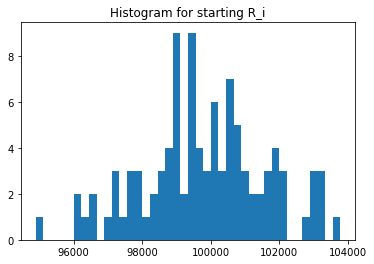

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([201996.5577461 , 300775.09001246, 199771.09001246, 199767.09001246,
       299625.05563807, 198625.05563807, 294884.73777557, 196862.73777557,
       303427.41979024, 202447.41979024, 201391.64850544, 198836.73777557,
       198767.09001246, 201433.41979024, 202433.41979024, 305893.95947475,
       202508.3008214 , 303502.3008214 , 204911.95947475, 203911.95947475,
       202338.31949659, 201508.3008214 , 291464.06267274, 193484.06267274,
       204912.95947475, 303324.31949659, 202329.31949659, 201329.31949659,
       197612.05563807, 198612.05563807, 202511.3008214 , 299854.64873892,
       203759.64873892, 203069.43624101, 199946.02378366, 197972.02378366,
       296005.02378366, 201785.64873892, 303676.2919022 , 201786.64873892,
       205576.2919022 , 304054.43624101, 203063.43624101, 197984.02378366,
       201388.64850544, 200388.64850544, 197676.4744237 , 195633.83541865,
       197607.83541865, 302388.64850544, 293643.83541865, 196865.73777557,
       298688.4744237 , 1

In [24]:
experiments.UNI_Si.unique()

array([10000., 15056., 15085., 14979., 14988., 14928., 14987., 15064.,
       14991., 14860., 14951., 14772., 14973., 15015., 15009., 15110.,
       15047., 15018., 14982., 15043., 15170., 14808., 15229., 15060.,
       15013., 15004., 14927., 15073., 15096., 14933., 15206., 14990.,
       15036., 14918., 14878., 15005., 15007., 14999., 15021., 14847.,
       14995., 14980., 15030., 15097., 14963., 15071., 14870., 15078.,
       14930., 14850., 15132., 14807., 15001., 15082., 15063., 15093.,
       15146., 14998., 15072., 15090., 14970., 14801., 14875., 14798.,
       14921., 14996., 15000., 14924., 14959., 15048., 15213., 14803.,
       14942., 14975., 15038., 14941., 15024., 14799., 14954., 14889.,
       15128., 14993., 15174., 15122., 15069., 15117., 15169., 14871.,
       14957., 15221., 15149., 14916., 15033., 15028., 15126., 15107.,
       15147., 14919., 14997., 14931., 14855., 14890., 14915., 14972.,
       14943., 15226., 14989., 15058., 15202., 14939., 15080., 15092.,
      

In [25]:
experiments.UNI_Qj.unique()

array([194418.4474541 , 187534.14952918, 189267.14952918, ...,
       197120.38478618, 177554.35420859, 161358.42490261])

In [26]:
experiments.UNI_Rj.unique()

array([ 97209.22372705, 108871.07476459, 107871.07476459, ...,
       102497.19239309, 114250.67710429, 118708.21245131])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([ 97209.22372705,  98998.20113728, 100952.07476459,  98300.46413933,
       101727.37587211,  98873.90621702,  97645.78559626, 100199.48150437,
        98581.59550495,  97898.01131135,  99111.03425438,  96946.57155313,
       103801.6581911 , 100137.2062818 , 102845.02743862,  97539.54654441,
        98197.84354311, 101586.46464126,  97235.50940288, 101594.48408897,
       102344.0095041 , 104477.83237737, 101321.63331229,  98038.615829  ,
       101259.0699654 , 101180.51050906,  98069.70501769,  97016.03465199,
       100429.06252756, 100595.67710429, 100950.8729639 ,  96836.4754268 ,
       100502.19239309, 100455.91051104, 102648.48940238, 101575.77585748,
       101438.1008063 ,  97393.91107535,  97556.69001982,  99554.11613914,
       100369.91329494, 101049.24513848, 100521.06647709, 100465.5412454 ,
       103148.09539139,  98320.83961603,  98445.85349378,  98178.13568982,
       100587.80719106,  97881.19793848, 100969.51802499, 100695.23274396,
       101640.17738244,  

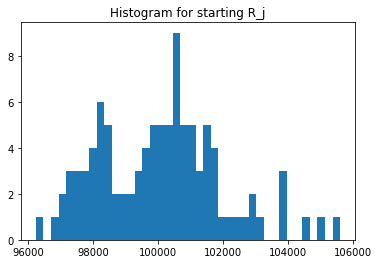

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100998.27887305,  99383.54500623,  98806.02781904,  99418.36888778,
       100716.70989512, 100194.32425272, 101955.97973737, 100754.1504107 ,
       100664.65974829,  97724.53133637, 101879.82436946, 101031.7181205 ,
        99973.01189183, 103773.6459511 ,  98335.73721185,  98803.91770933,
        99549.51030708,  99629.40756547, 100135.13413065,  99346.88336395,
        96103.21613609,  97190.99577765,  98605.84383074, 102974.38116142,
        97811.84641555, 100222.06920894,  99561.66365956, 101970.0495051 ,
        98917.24782412,  99046.32394905,  99083.04448048, 102083.1946731 ,
        97907.00331514, 101847.47977958,  96535.70193842, 100689.53428609,
        99768.99379084, 100650.2078689 , 101487.74385306,  98968.91569358,
       100394.45905789, 100343.29019185,  99001.60364256,  98396.17492283,
        98570.76742164, 102136.53705374,  99399.66208935,  97086.53581314,
       101230.74232906, 102999.60072183,  98946.17755173,  97588.11897026,
       101658.52873405, 1

In [31]:
experiments.UNI_ji.unique()

array([ 97209.22372705, 100952.07476459, 100199.48150437,  98998.20113728,
        98300.46413933,  99111.03425438, 101727.37587211,  98873.90621702,
        97645.78559626,  98038.615829  ,  98581.59550495,  97016.03465199,
        97898.01131135, 100137.2062818 , 103801.6581911 ,  96946.57155313,
        98197.84354311, 101586.46464126, 102845.02743862,  97539.54654441,
       105590.47096851,  97235.50940288, 100429.06252756, 101594.48408897,
       102344.0095041 , 104477.83237737, 101259.0699654 , 101321.63331229,
       101180.51050906,  98069.70501769,  97556.69001982, 100587.80719106,
       100951.58925445, 100950.8729639 , 100595.67710429, 101049.24513848,
        96836.4754268 , 100502.19239309, 100455.91051104, 100969.51802499,
        97568.56492513, 102648.48940238, 101438.1008063 ,  99554.11613914,
       101575.77585748,  97393.91107535, 100369.91329494, 100521.06647709,
       100465.5412454 ,  97881.19793848,  98320.83961603, 103148.09539139,
        98178.13568982,  

In [32]:
experiments.UNI_Sij.unique()

array([9.81796429e+09, 1.00329751e+10, 9.90031276e+09, 9.84223968e+09,
       9.90049933e+09, 9.93036310e+09, 1.03717143e+10, 9.96195642e+09,
       9.82947978e+09, 9.58077778e+09, 1.00434756e+10, 9.80169667e+09,
       9.78715905e+09, 1.03916030e+10, 1.02074126e+10, 9.57870108e+09,
       9.77554724e+09, 1.01209993e+10, 1.02984006e+10, 9.69024995e+09,
       1.01475839e+10, 9.45041598e+09, 9.90289246e+09, 1.04616291e+10,
       1.00104565e+10, 1.04709845e+10, 1.00815215e+10, 1.03317720e+10,
       1.00084976e+10, 9.71344377e+09, 9.66621386e+09, 1.02683247e+10,
       9.88386758e+09, 1.02815920e+10, 9.71107430e+09, 1.01746014e+10,
       9.66127772e+09, 1.01155666e+10, 1.01950437e+10, 9.99284372e+09,
       9.79534330e+09, 1.03000872e+10, 1.00425347e+10, 9.79574423e+09,
       1.00124022e+10, 9.94747681e+09, 9.97673547e+09, 9.75924212e+09,
       1.01702013e+10, 1.00817243e+10, 9.72847125e+09, 1.00660286e+10,
       9.98064483e+09, 9.88579074e+09, 9.99227694e+09, 9.89760437e+09,
      

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


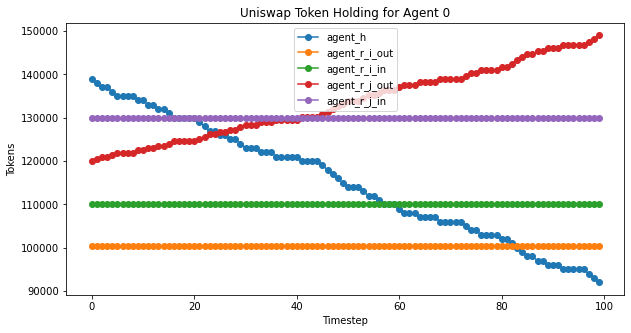

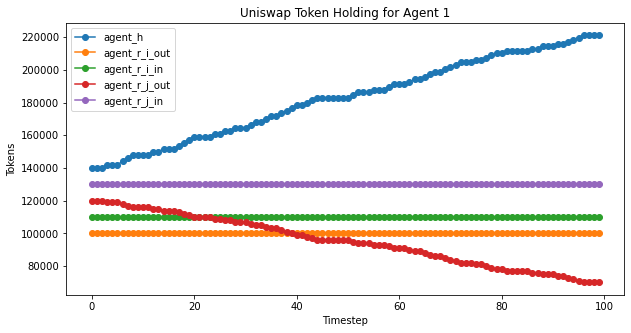

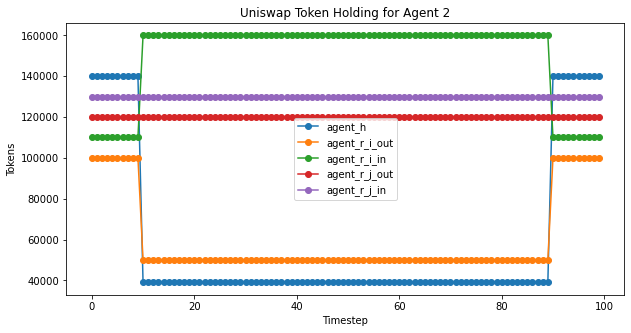

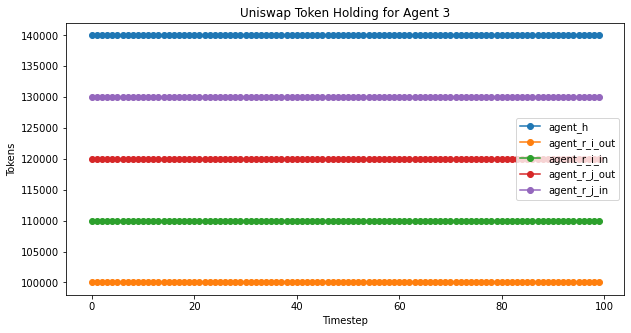

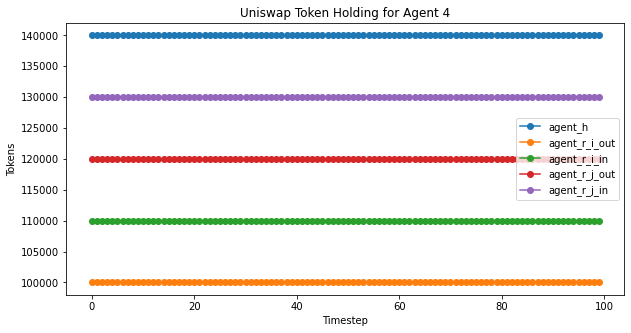

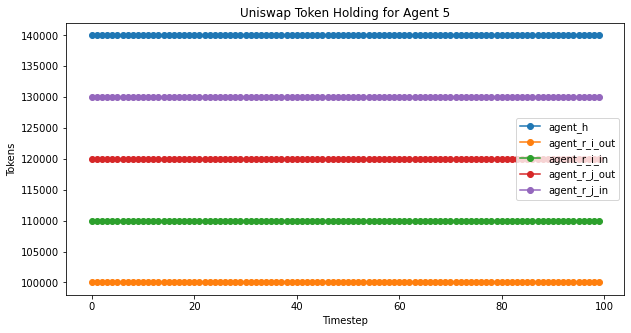

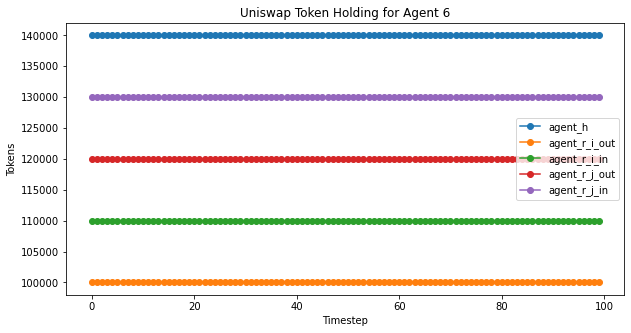

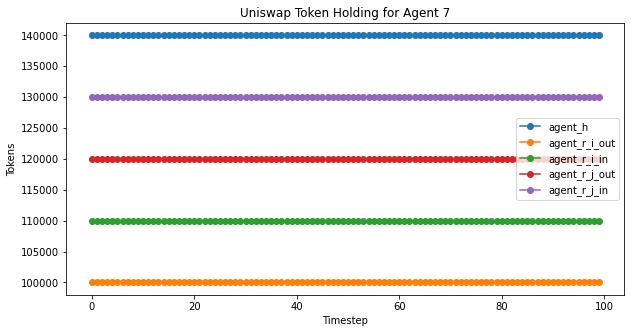

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


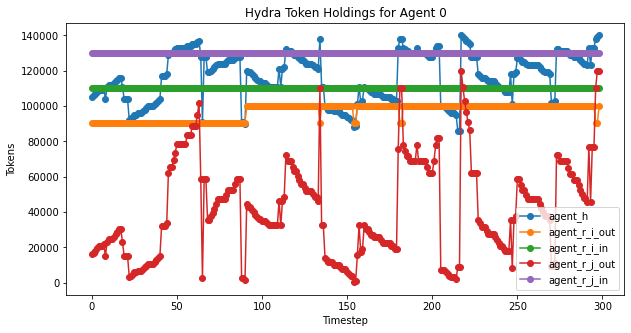

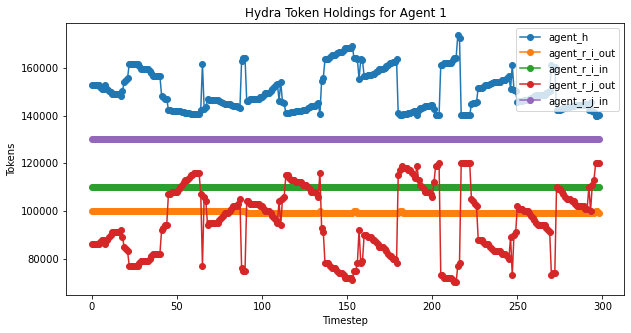

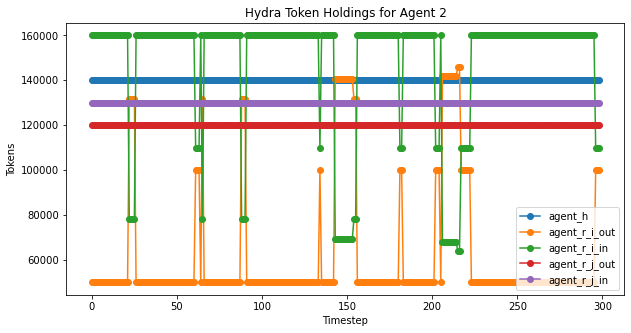

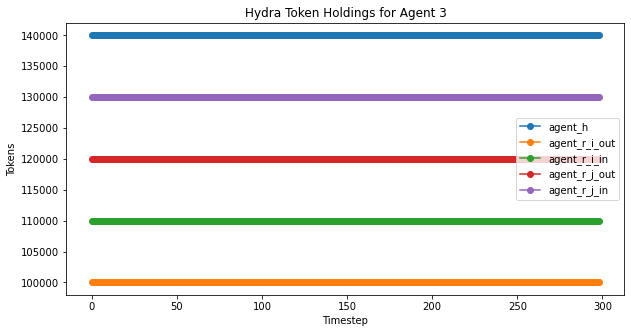

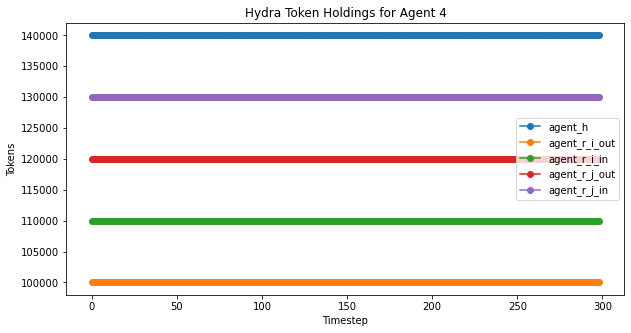

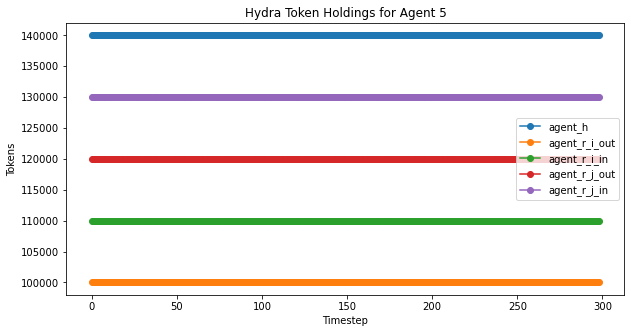

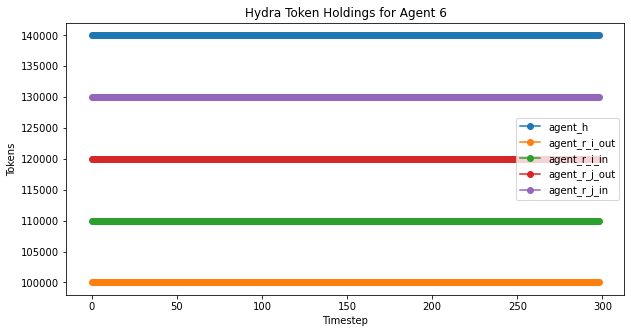

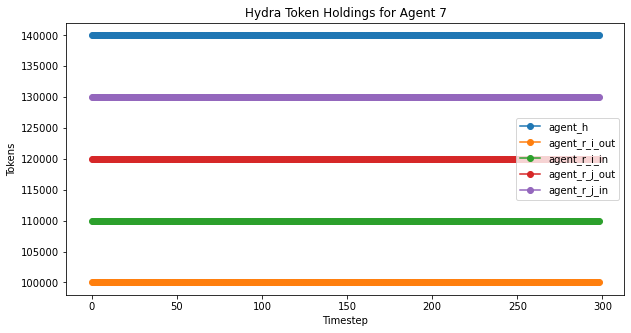

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

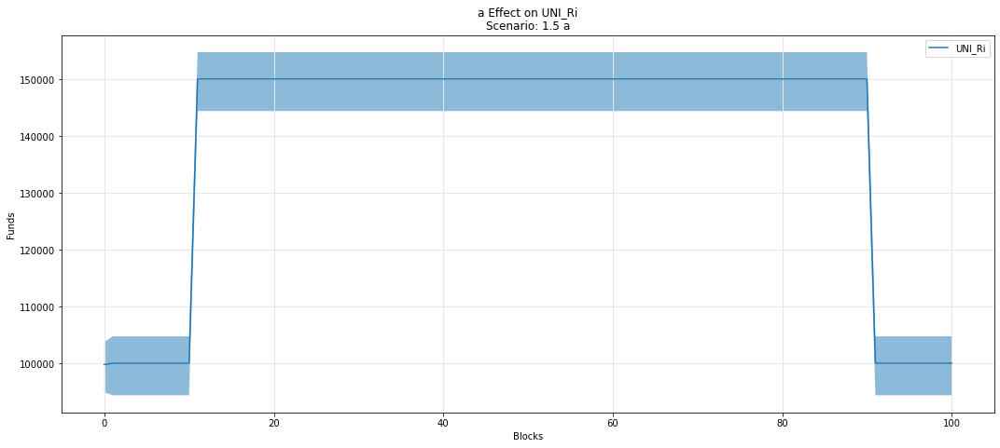

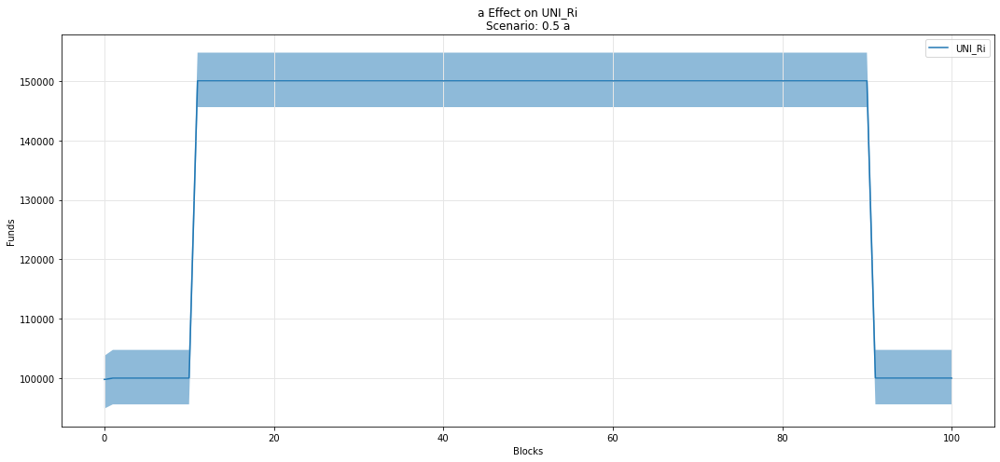

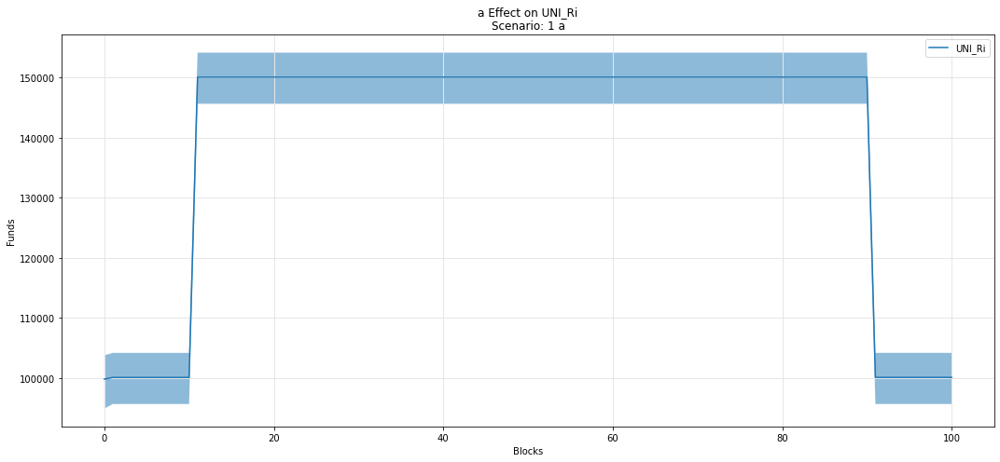

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

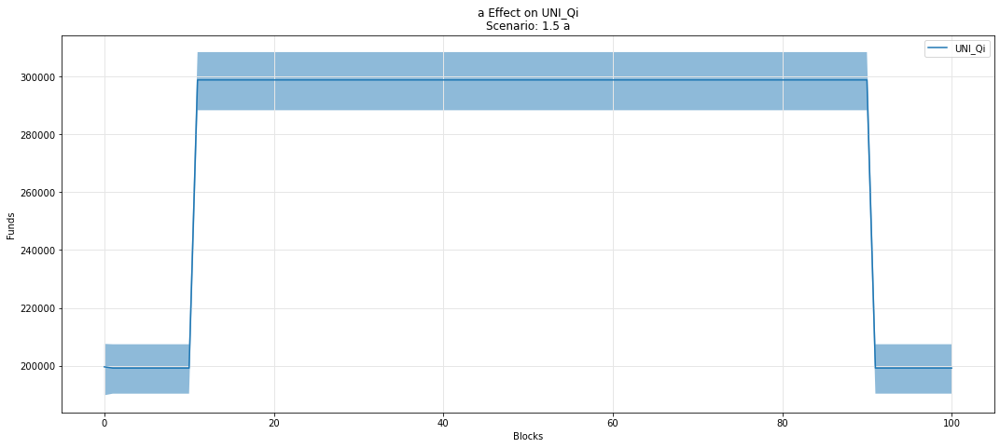

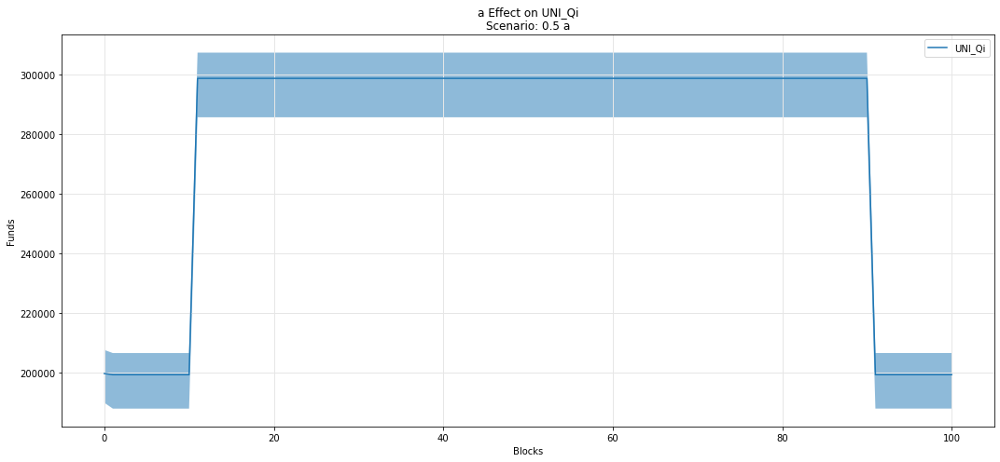

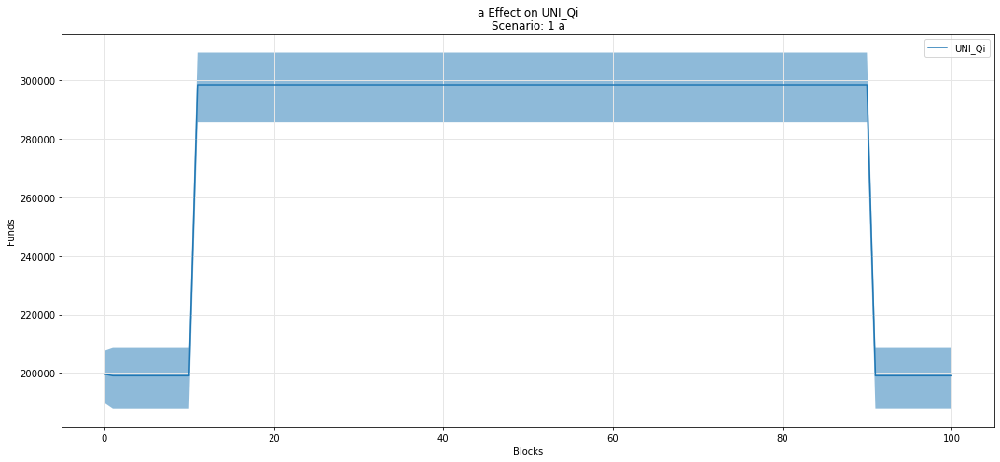

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

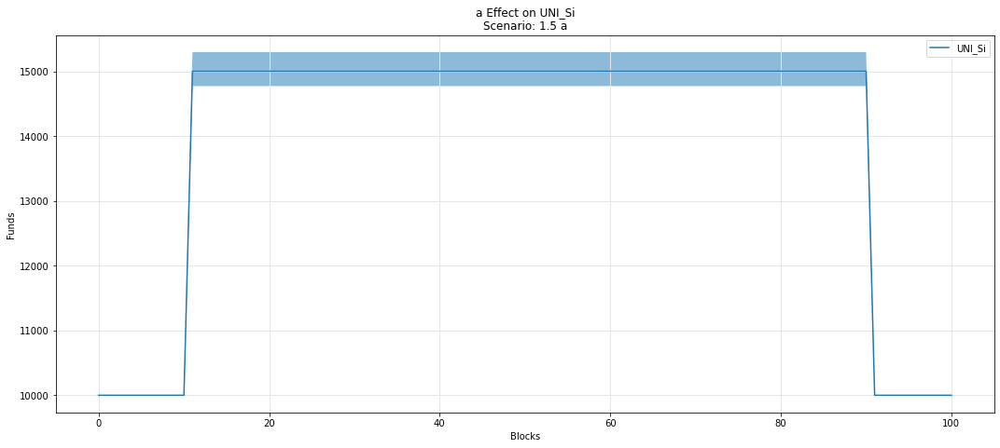

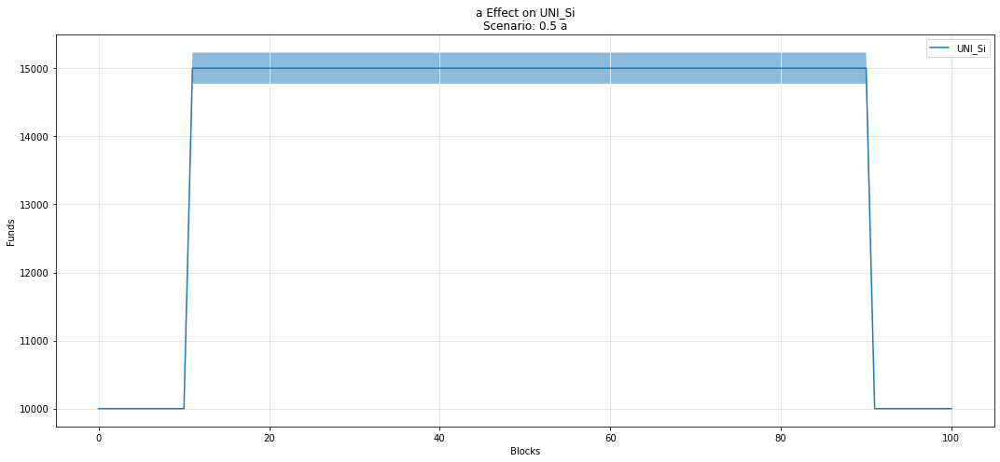

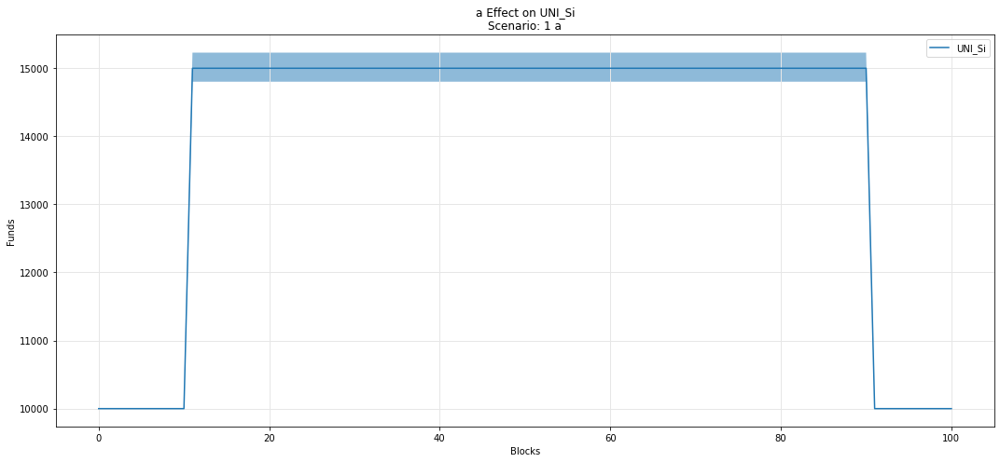

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

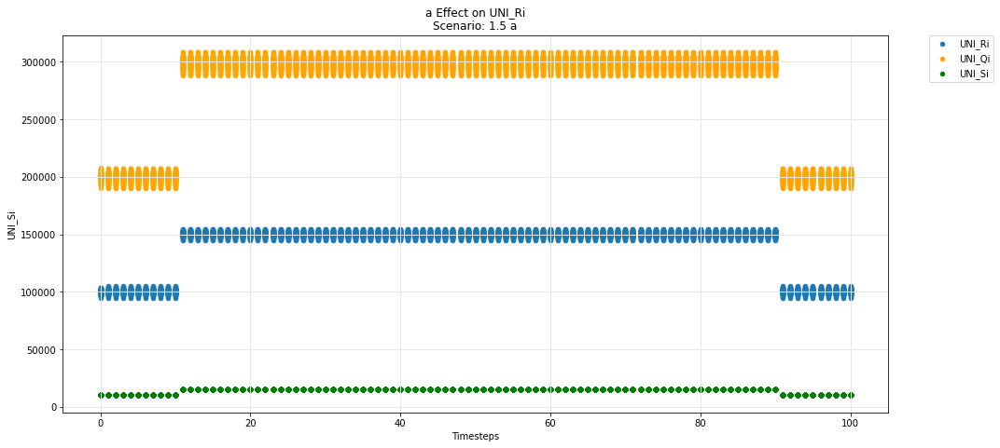

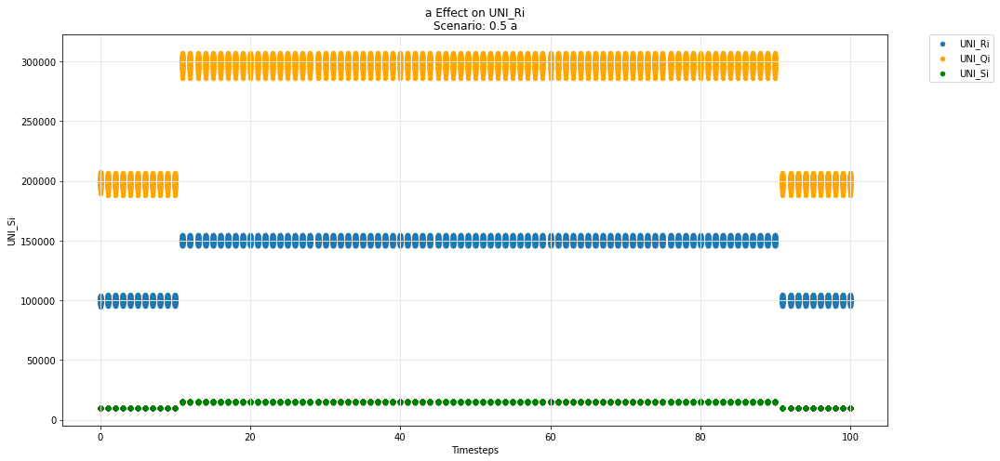

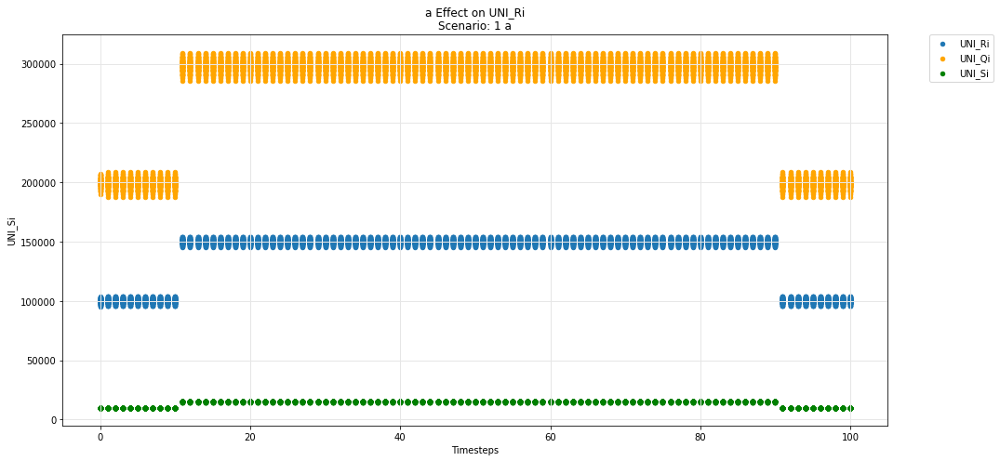

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

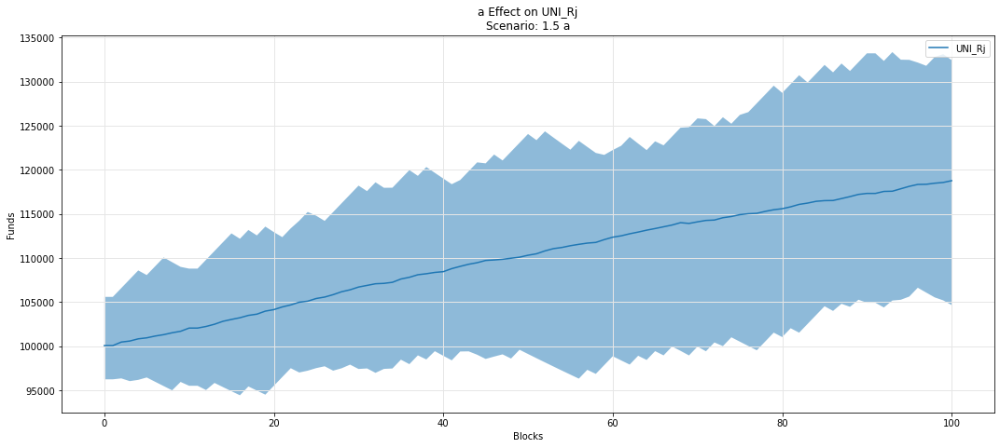

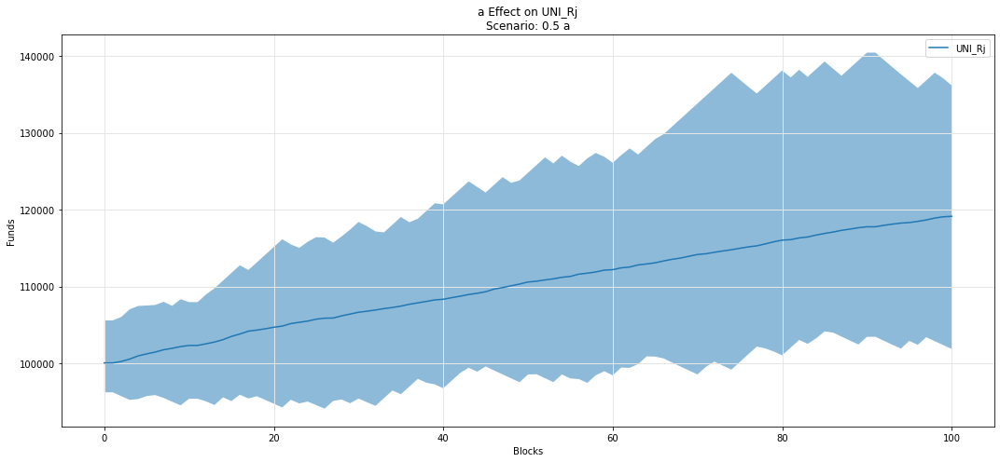

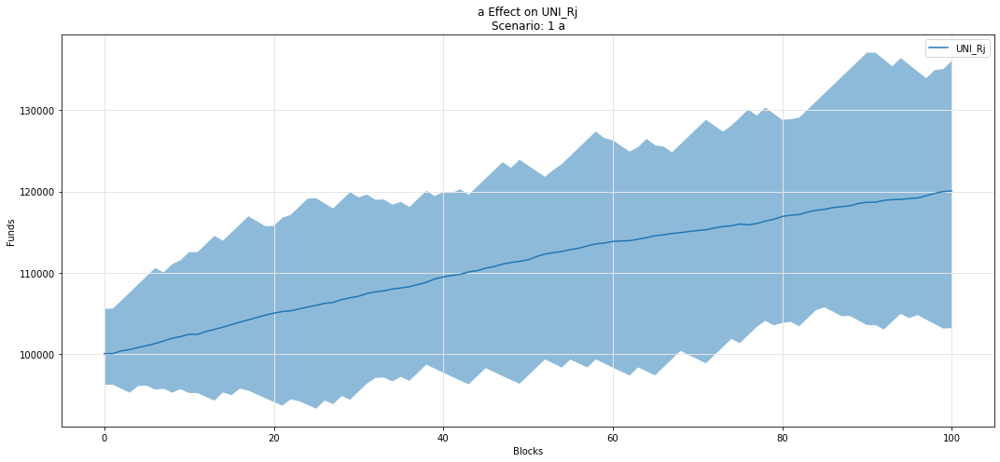

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

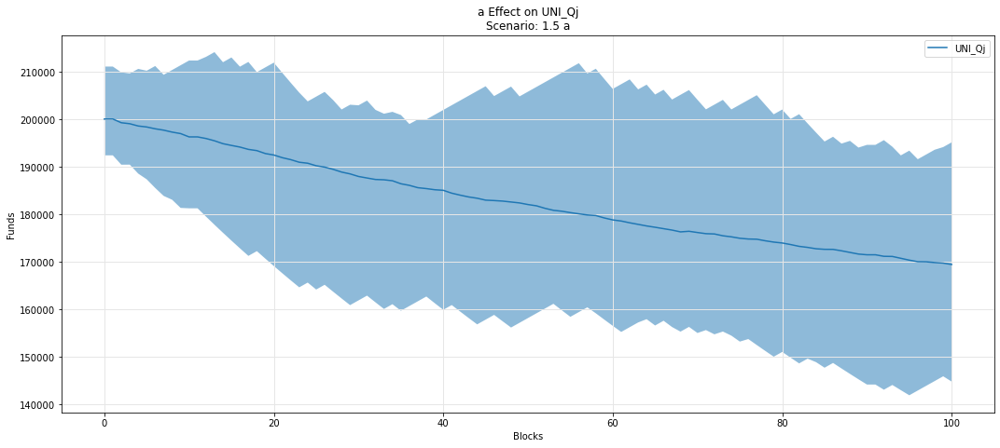

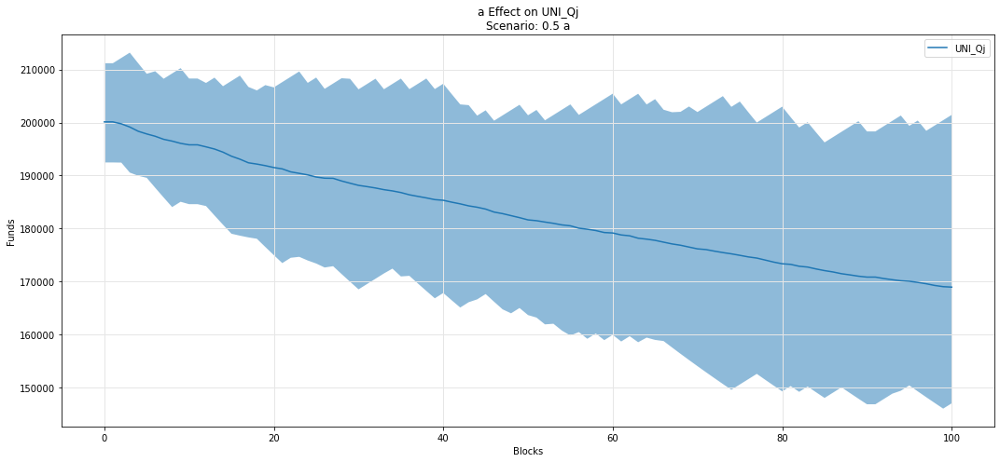

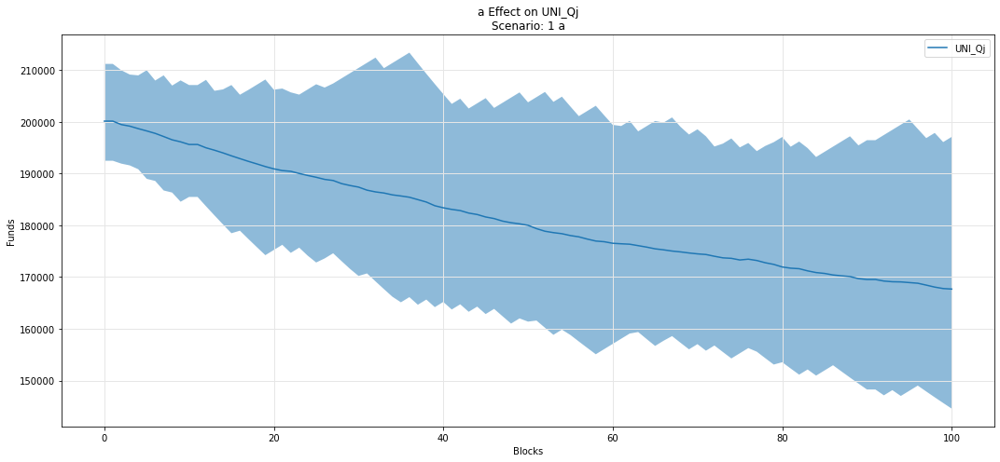

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

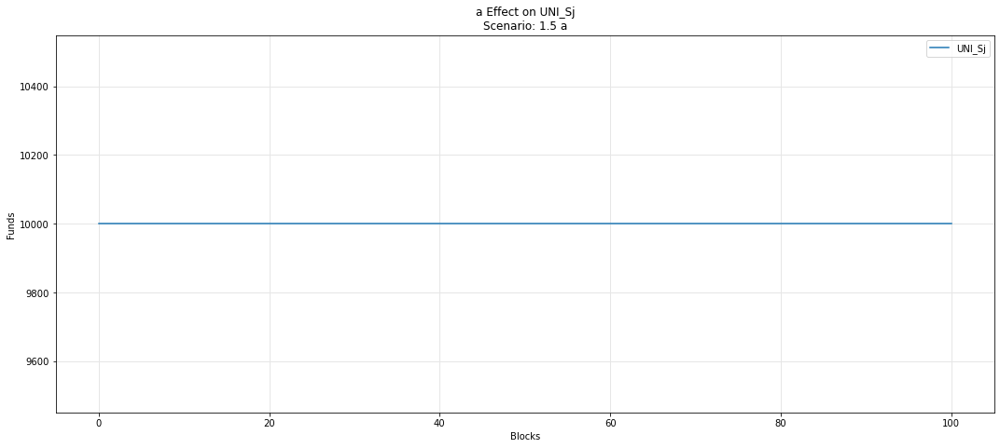

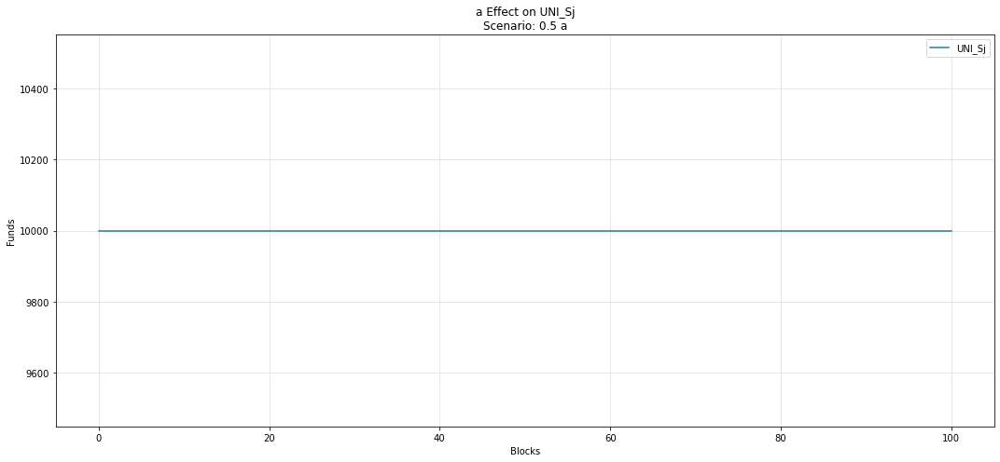

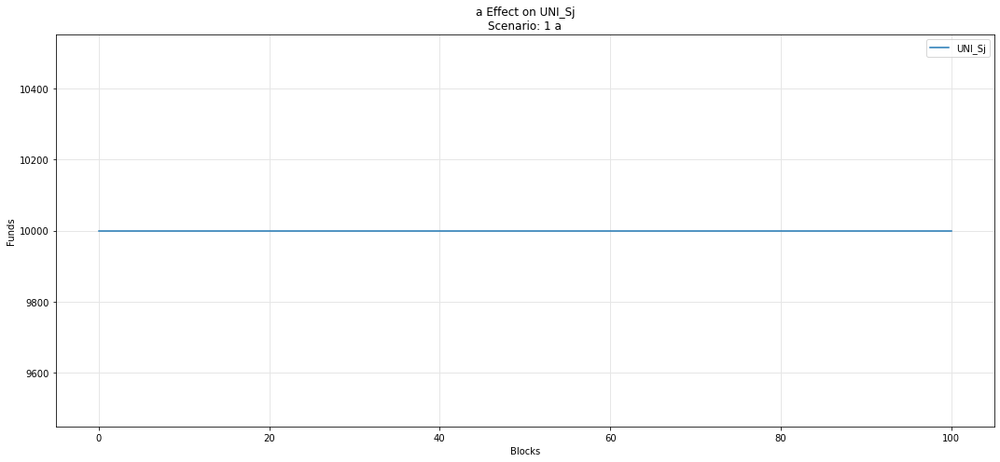

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

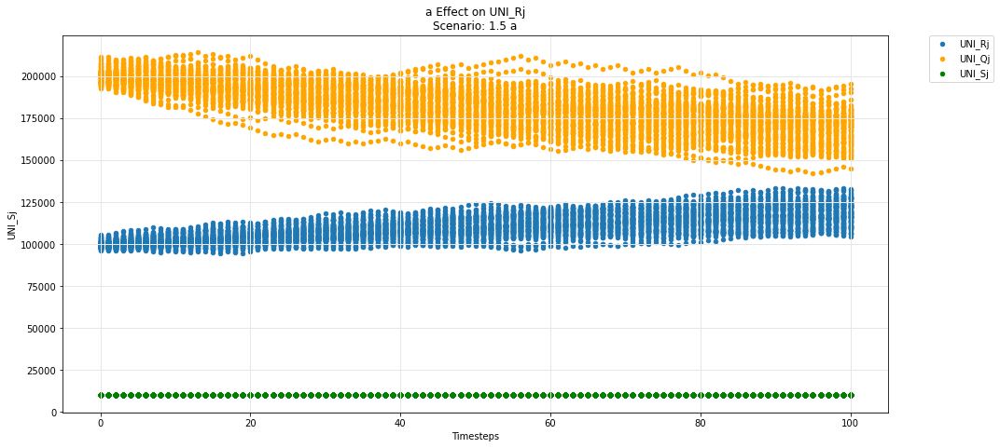

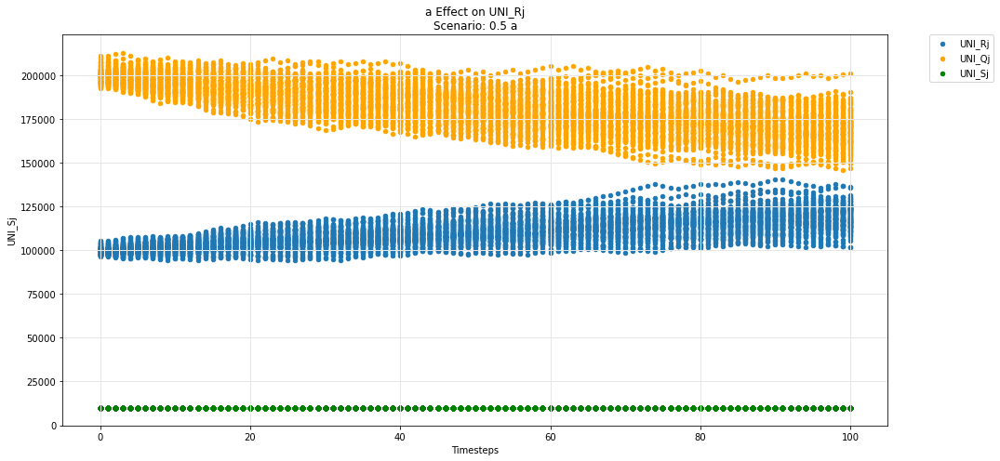

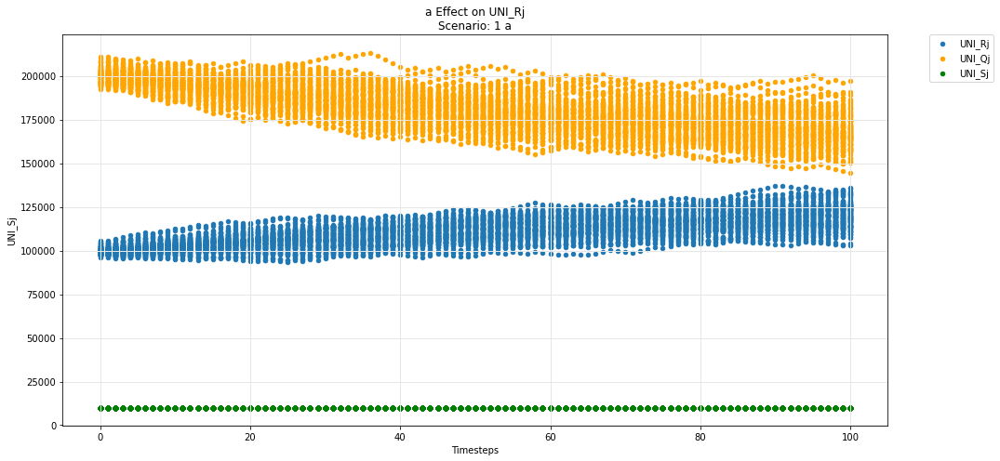

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

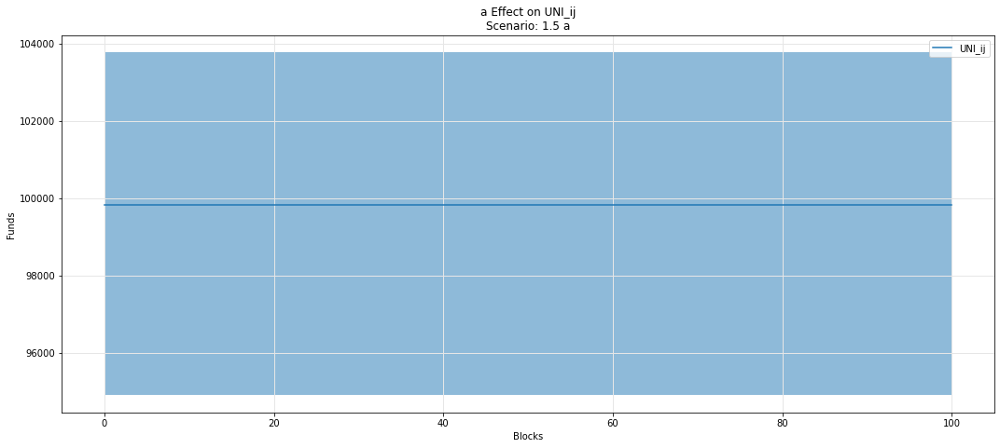

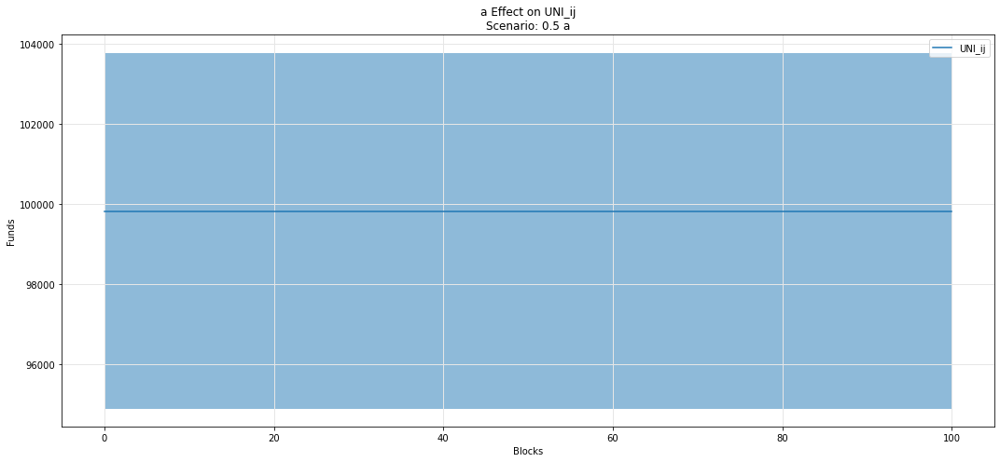

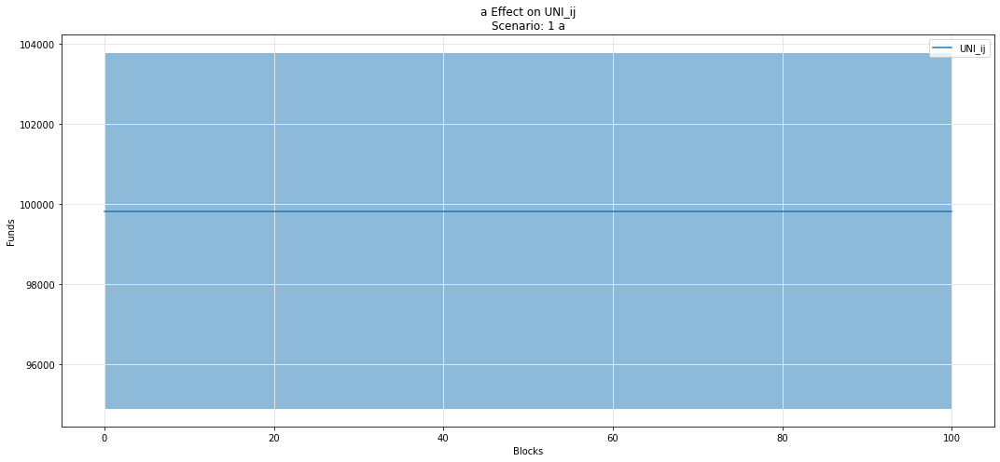

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

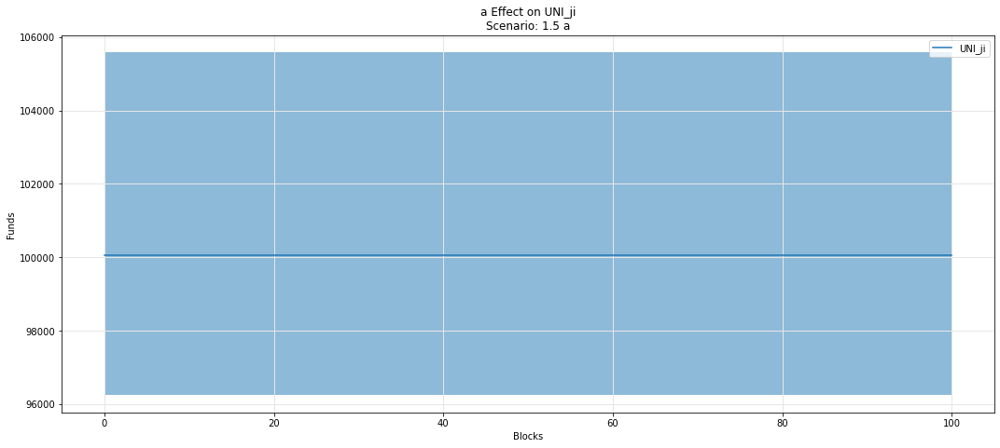

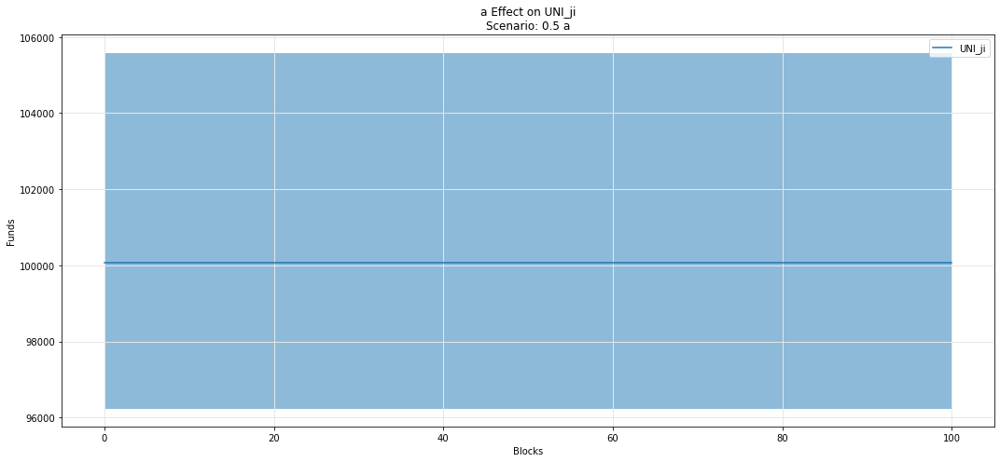

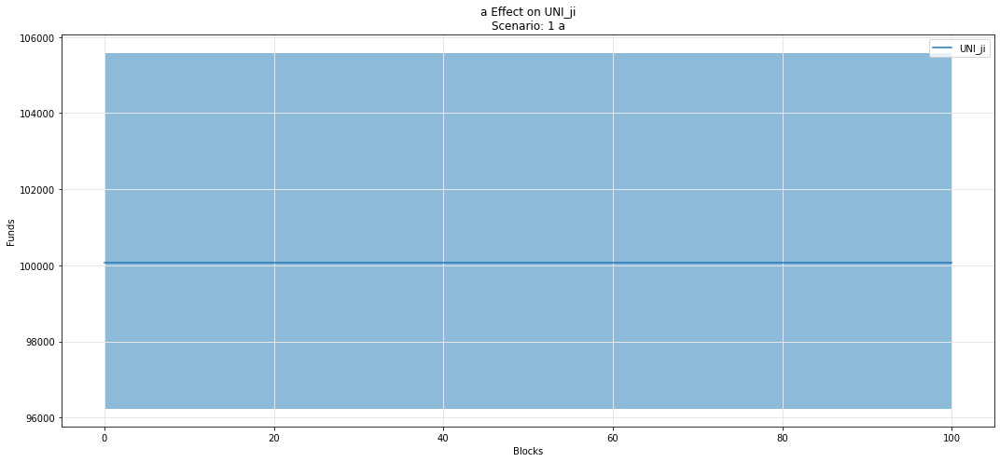

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

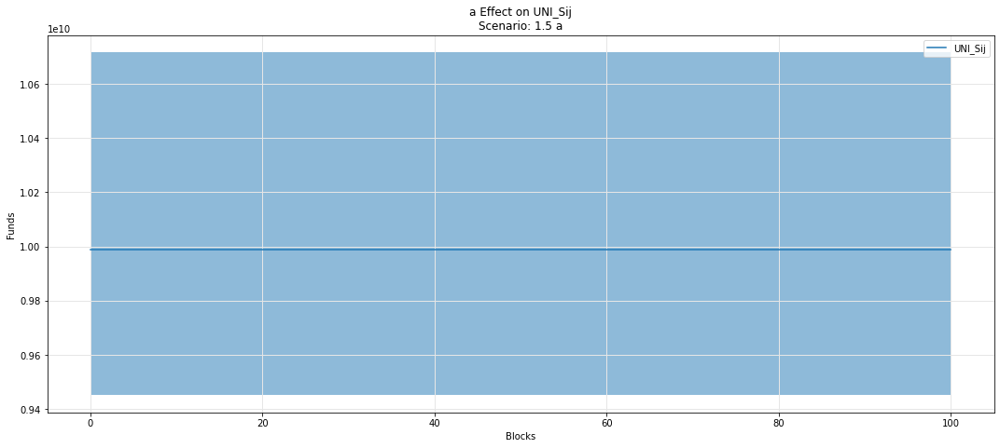

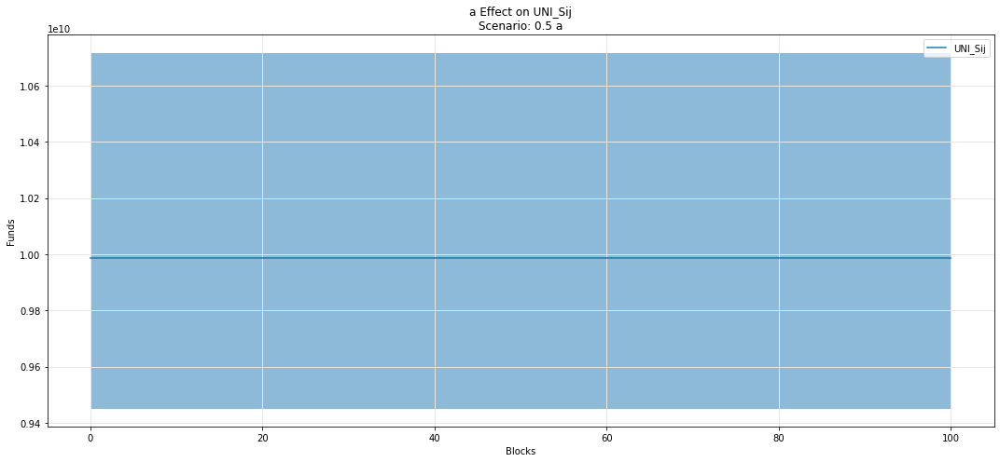

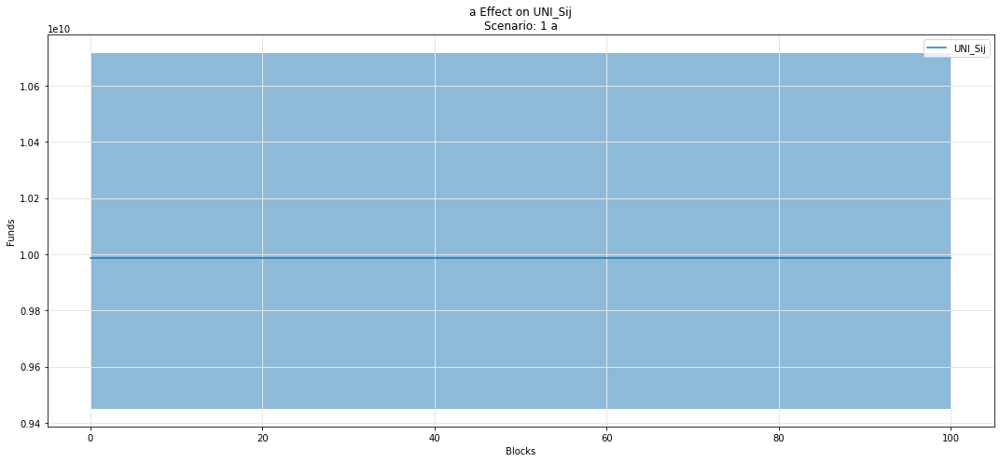

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

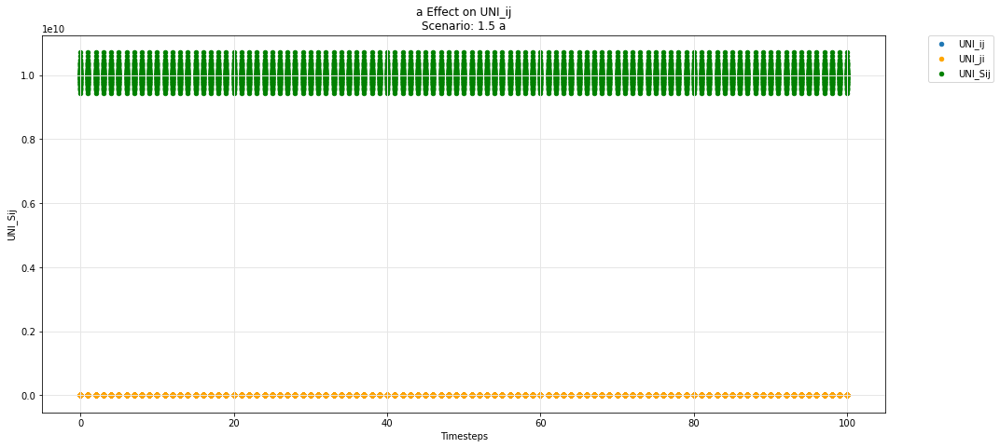

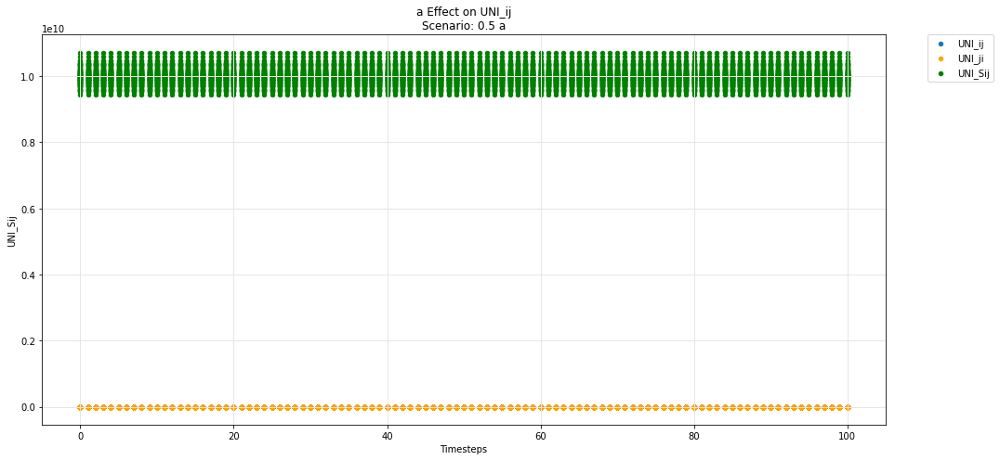

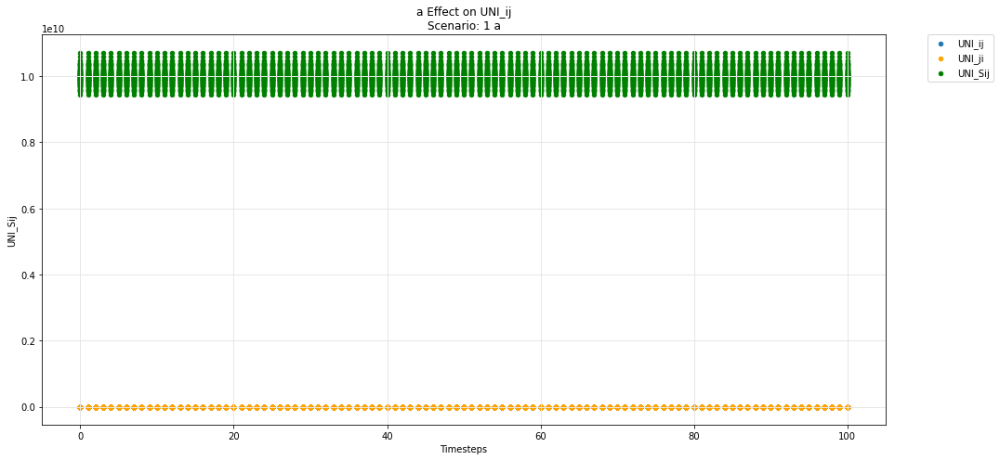

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

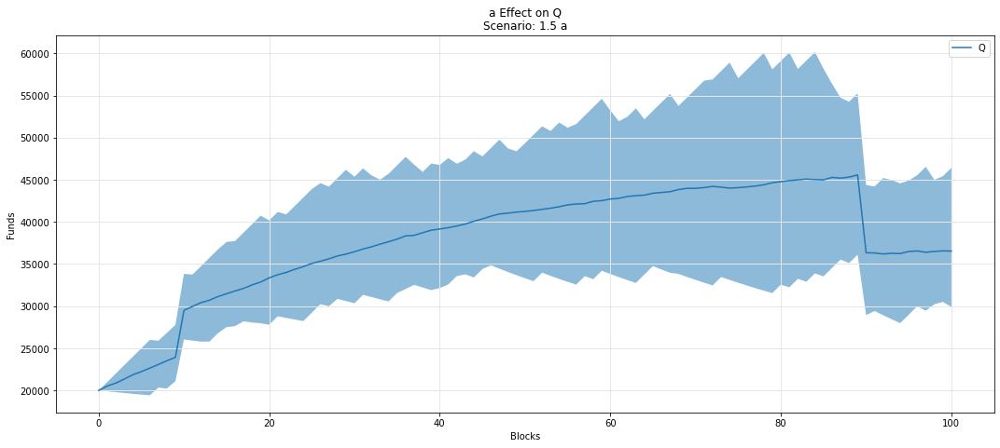

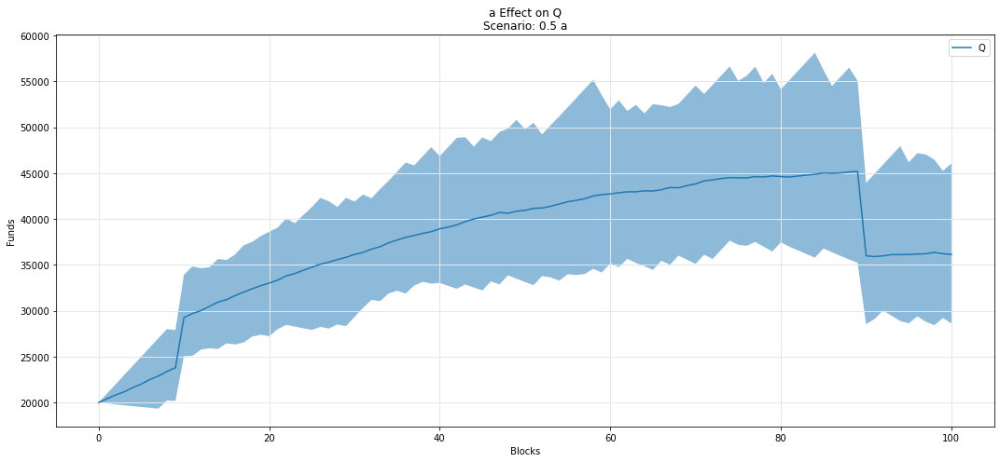

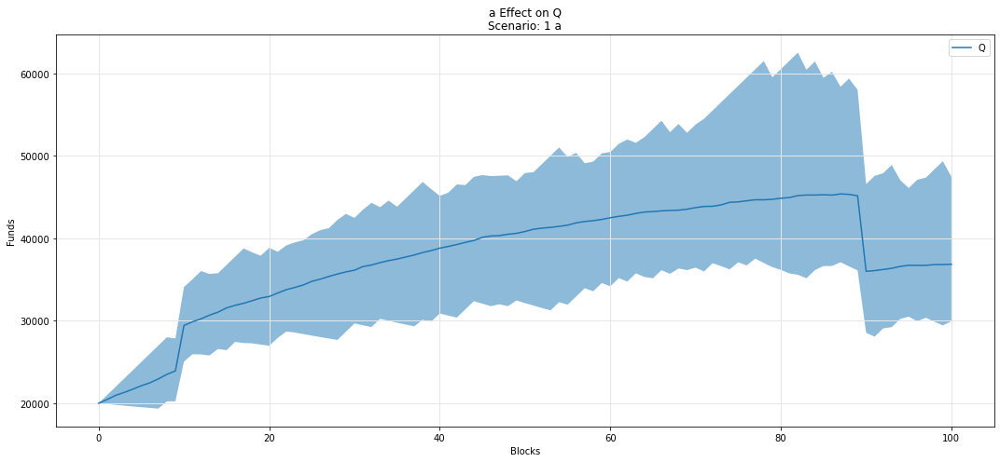

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

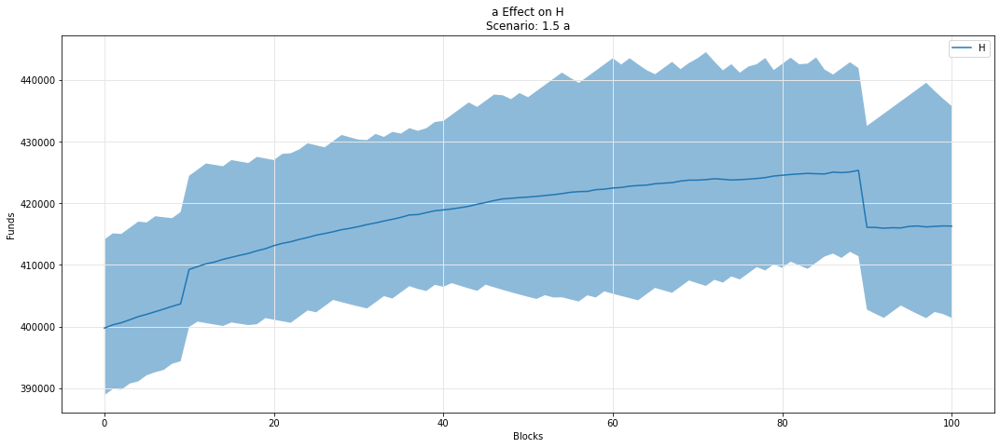

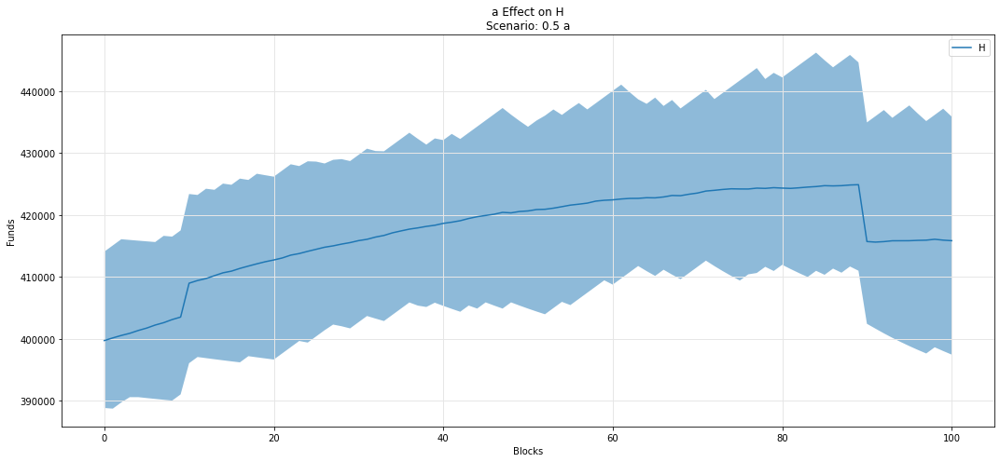

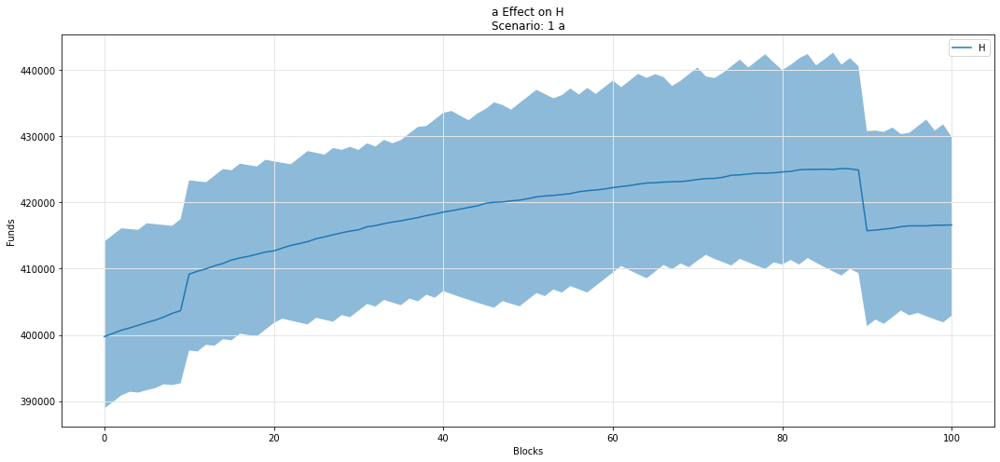

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

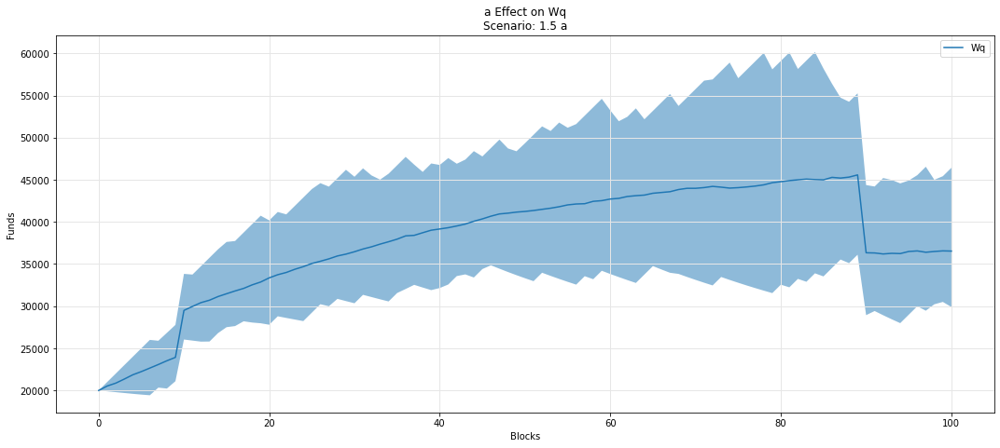

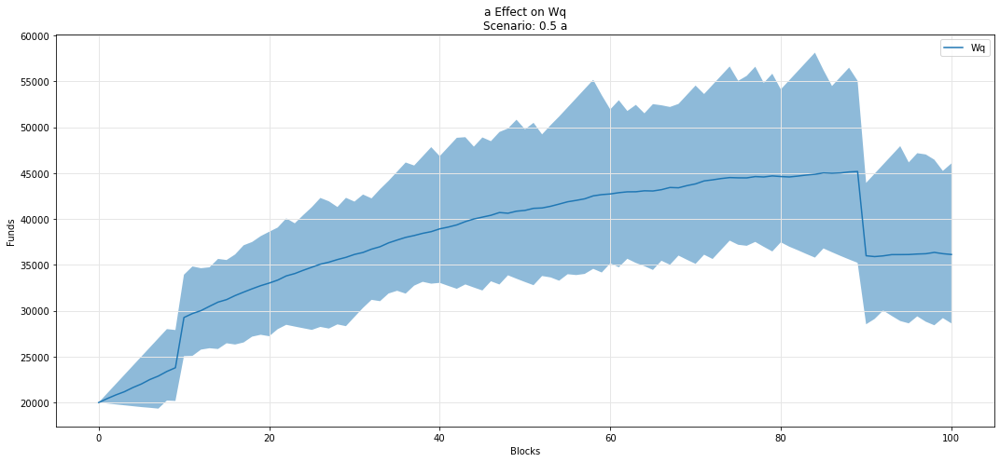

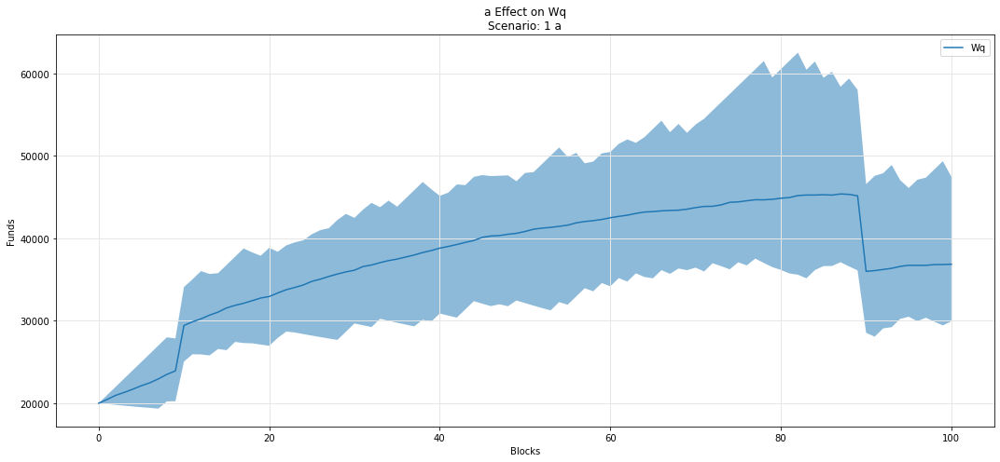

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

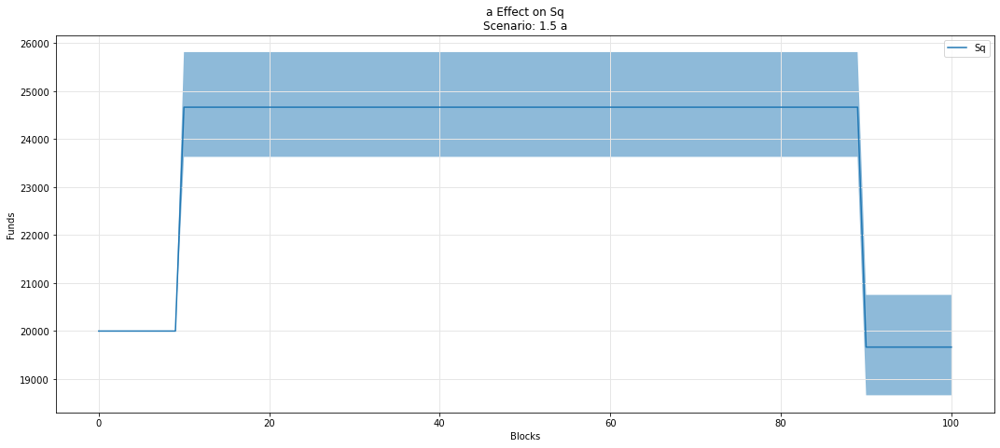

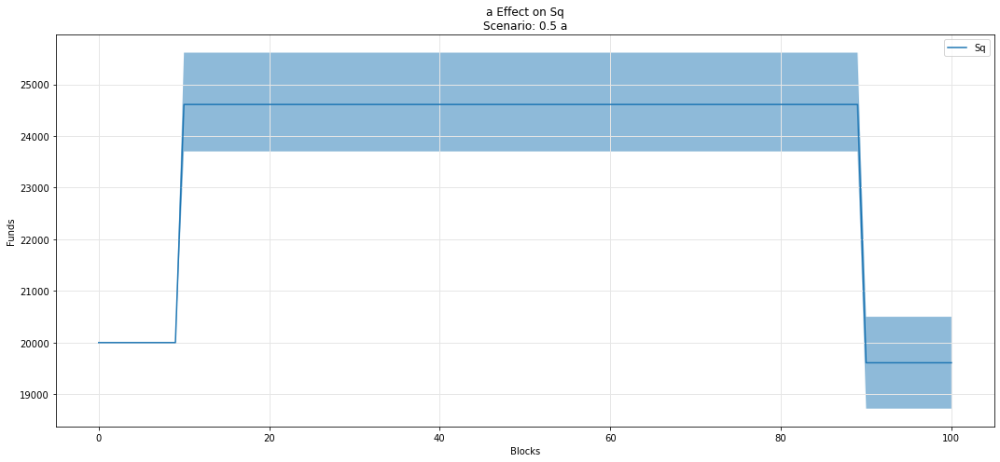

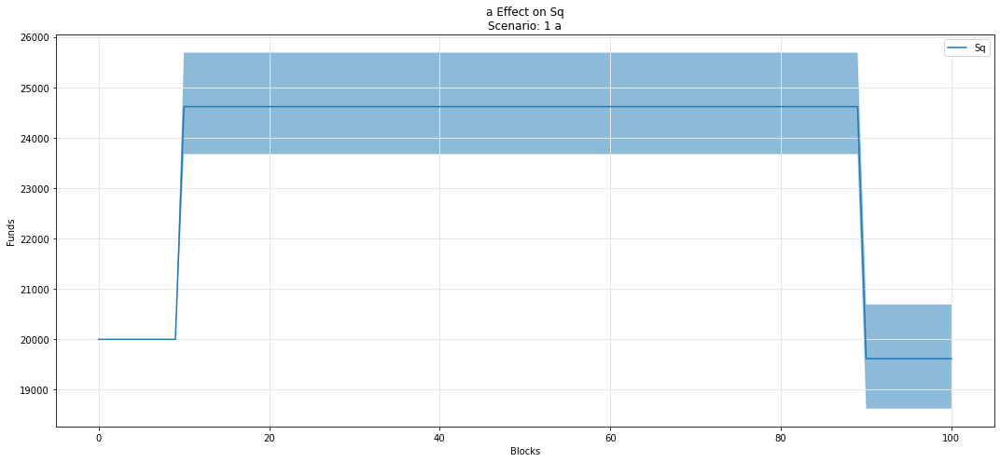

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

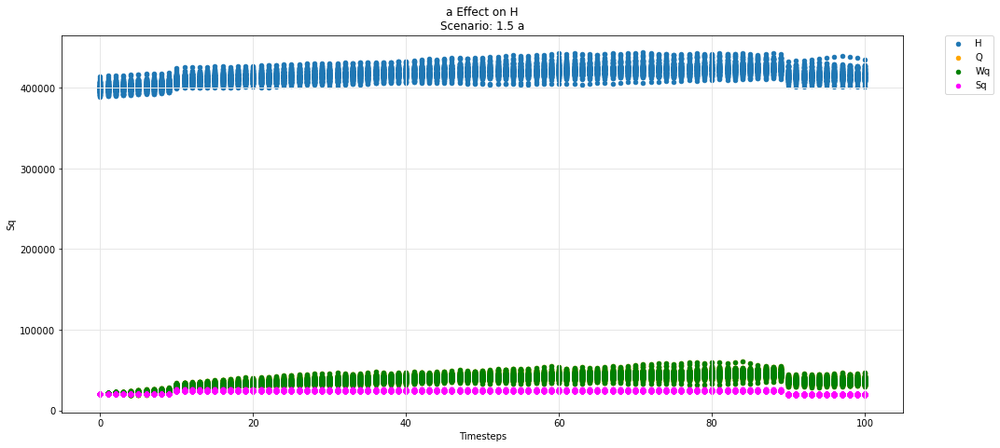

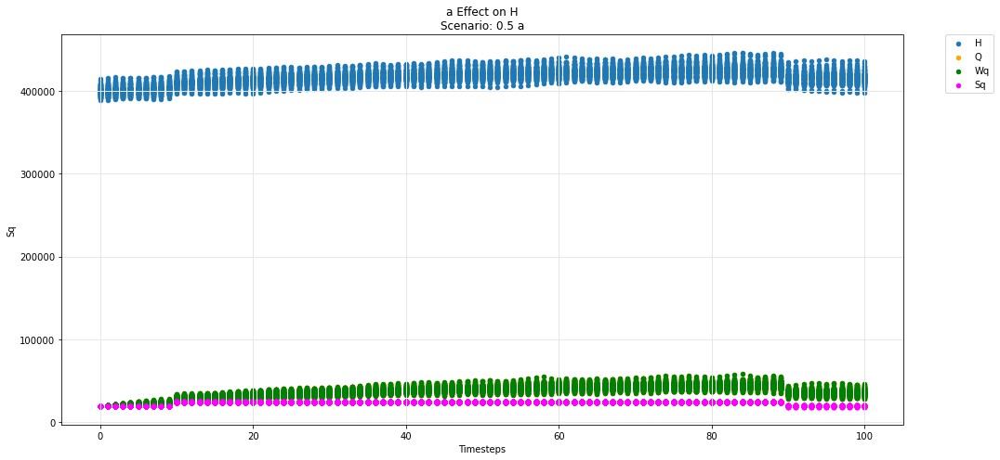

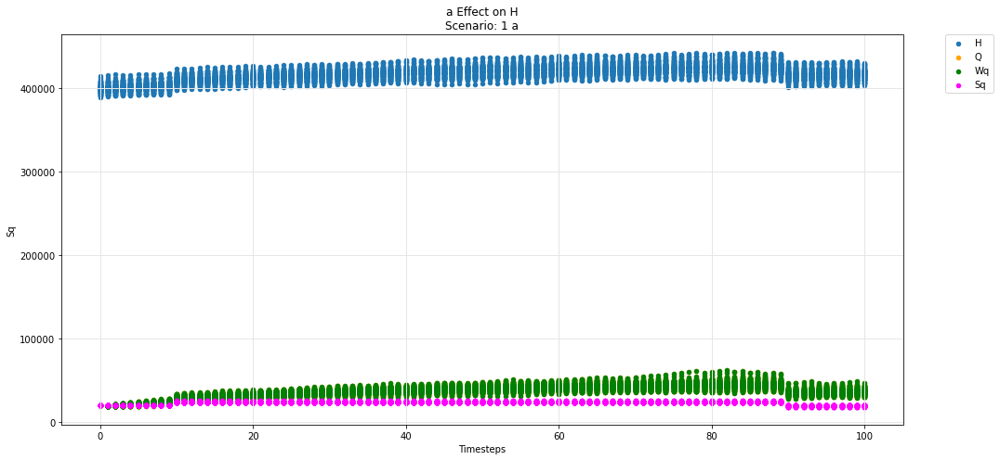

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

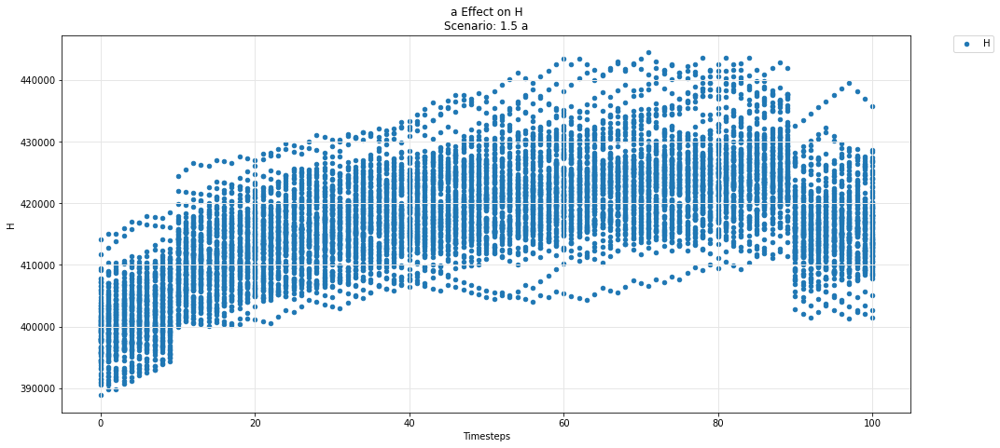

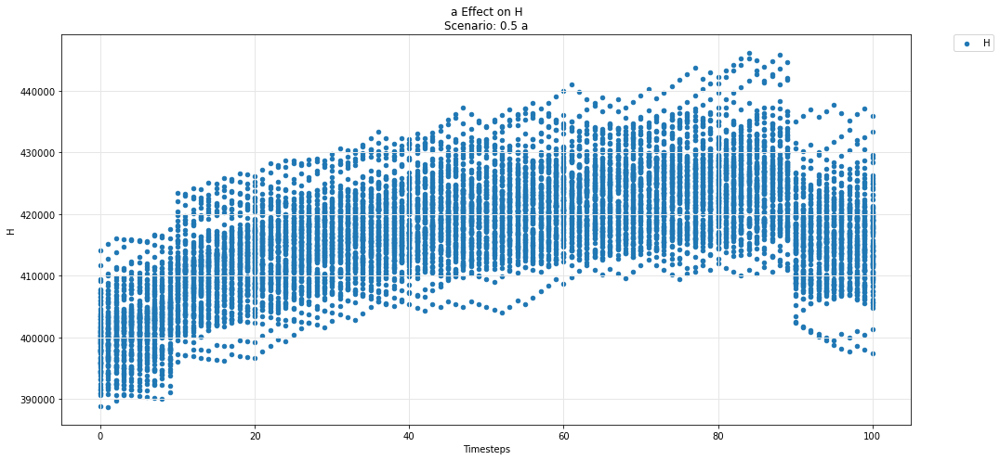

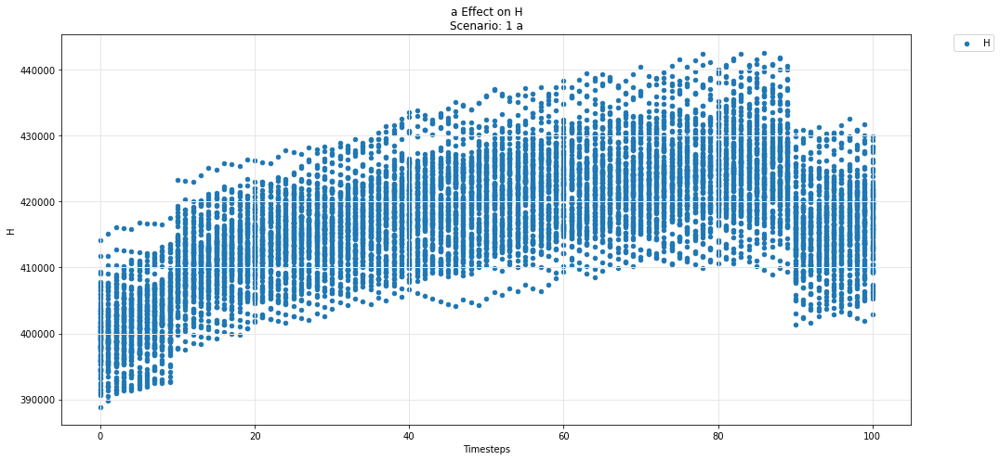

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

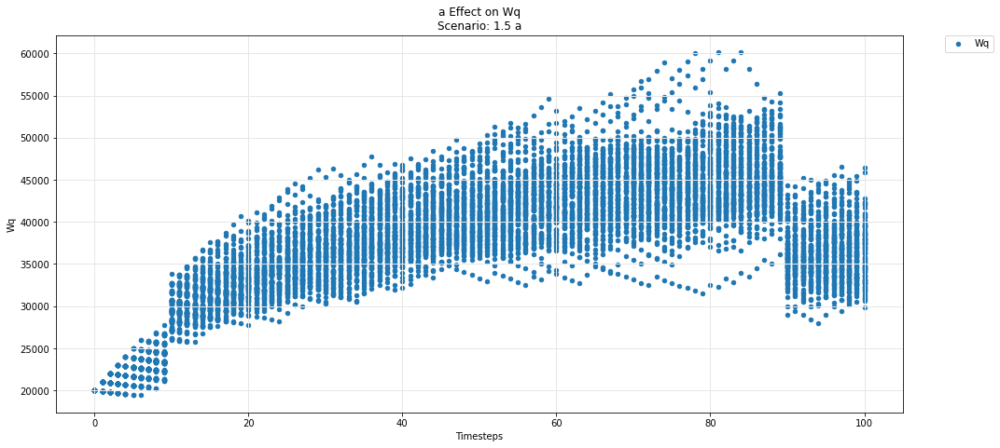

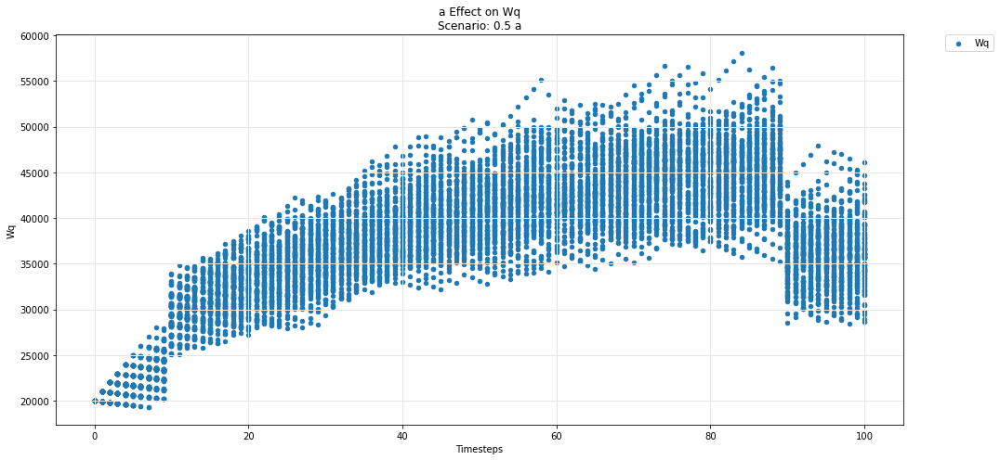

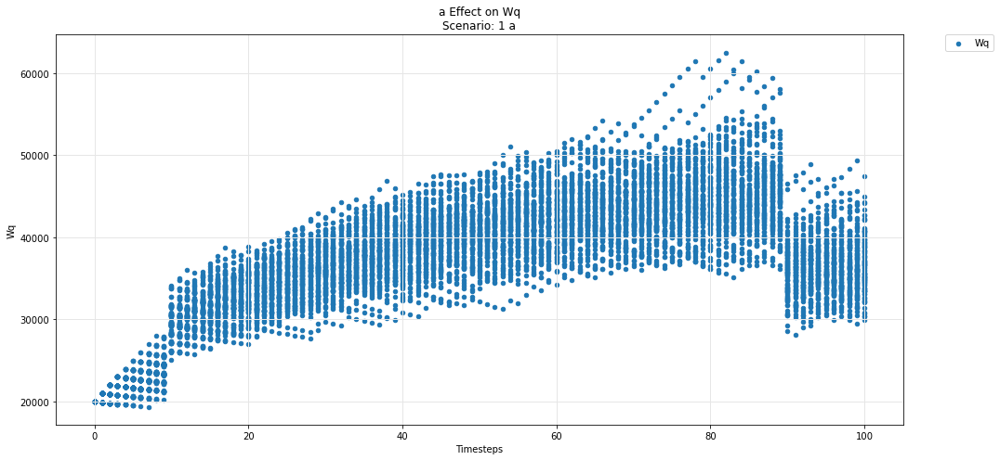

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

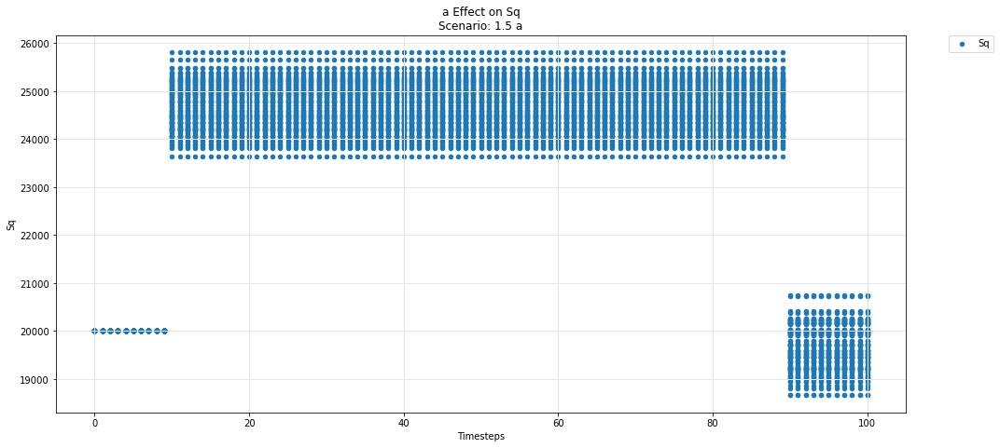

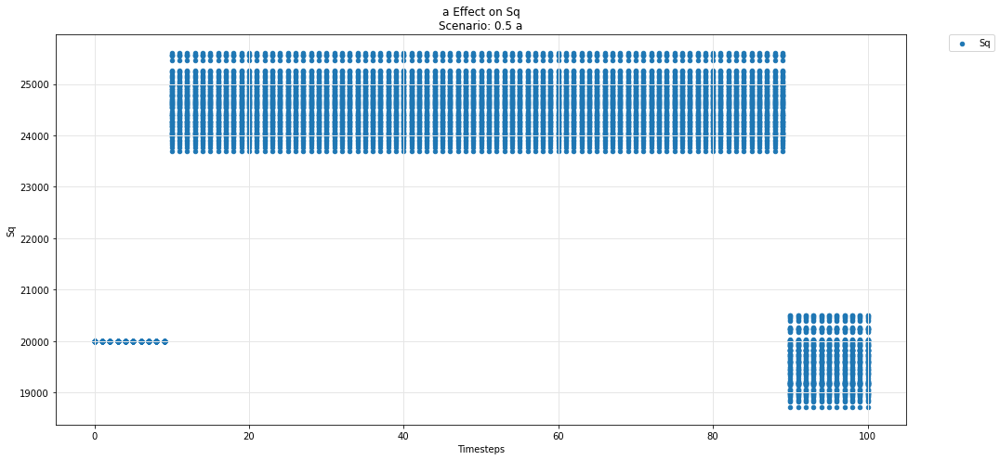

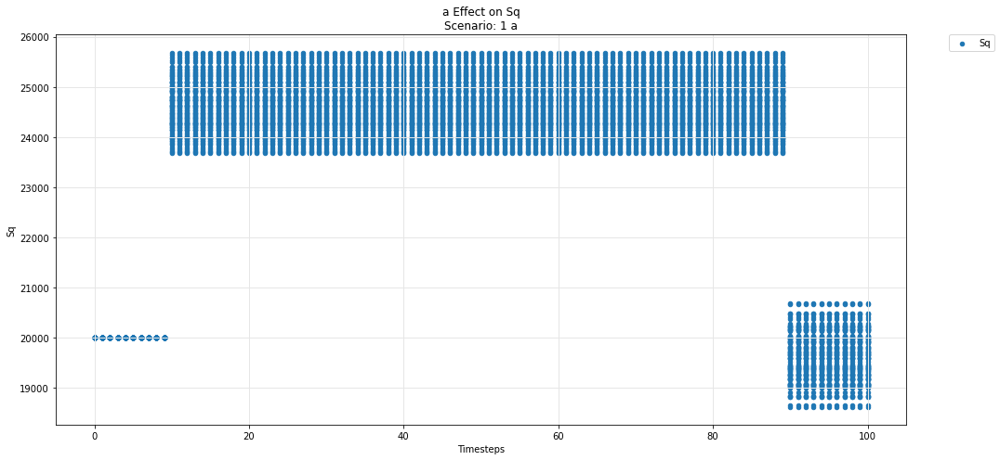

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

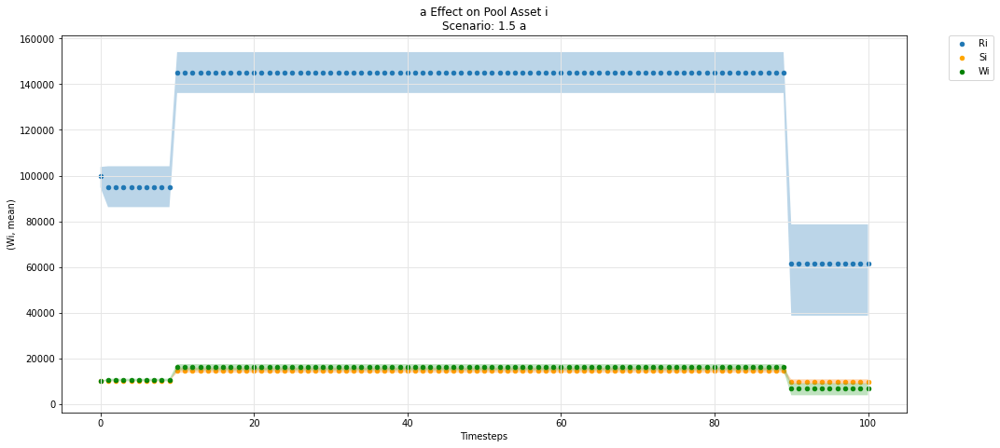

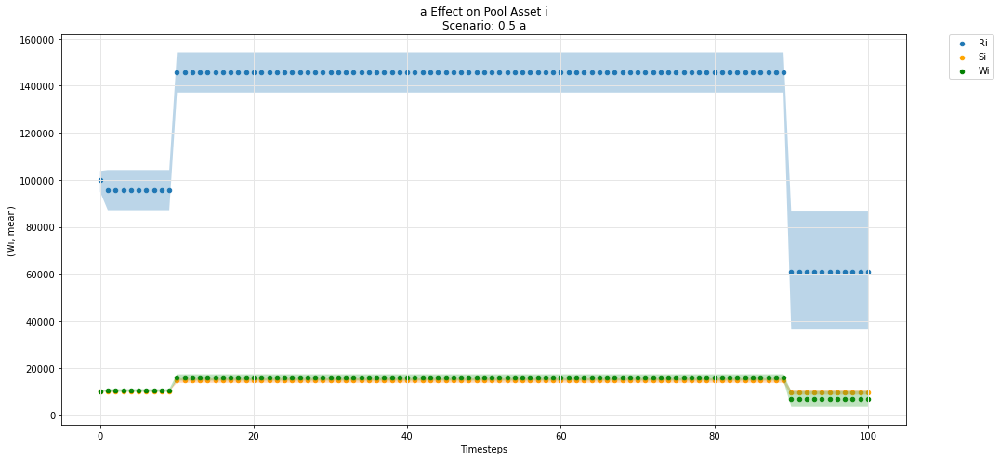

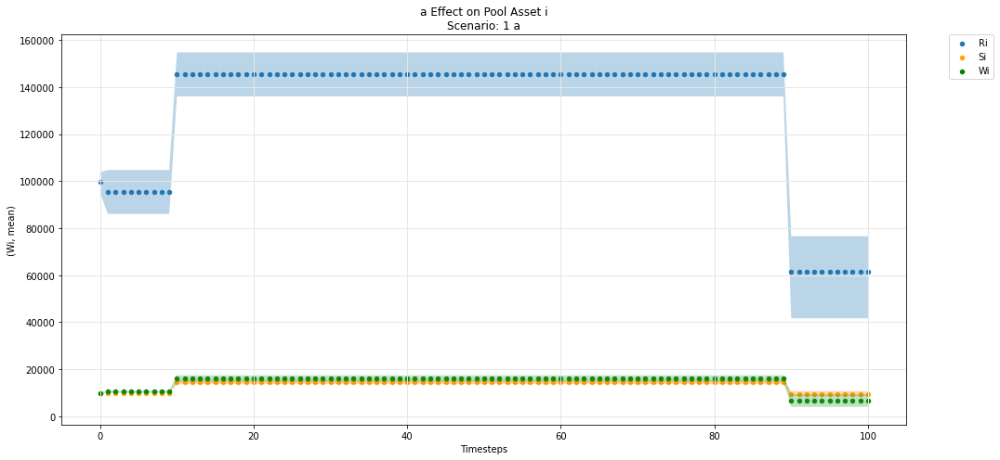

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

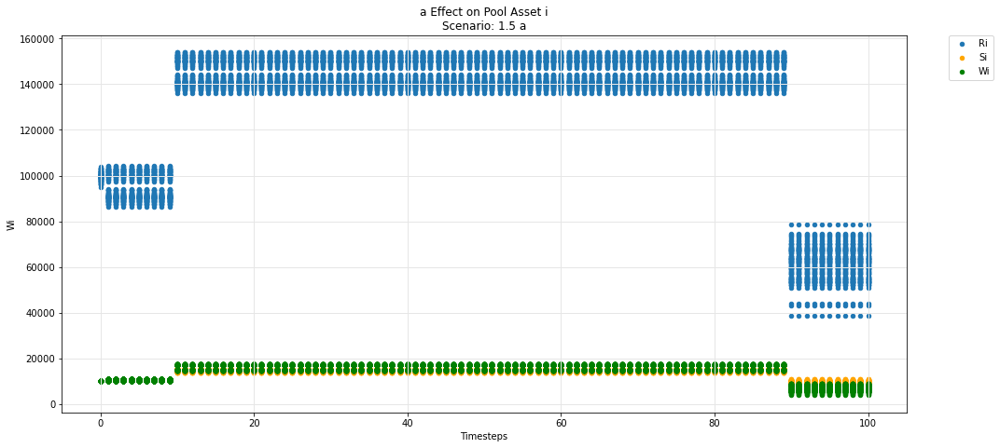

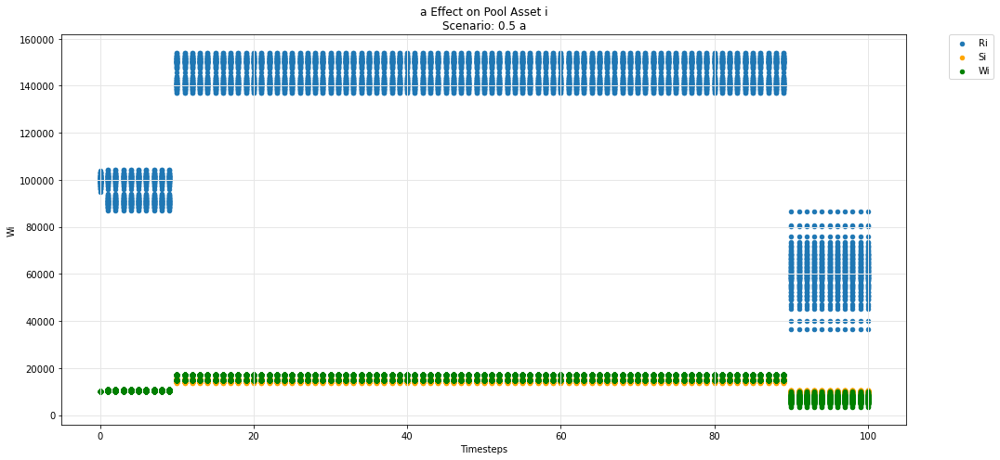

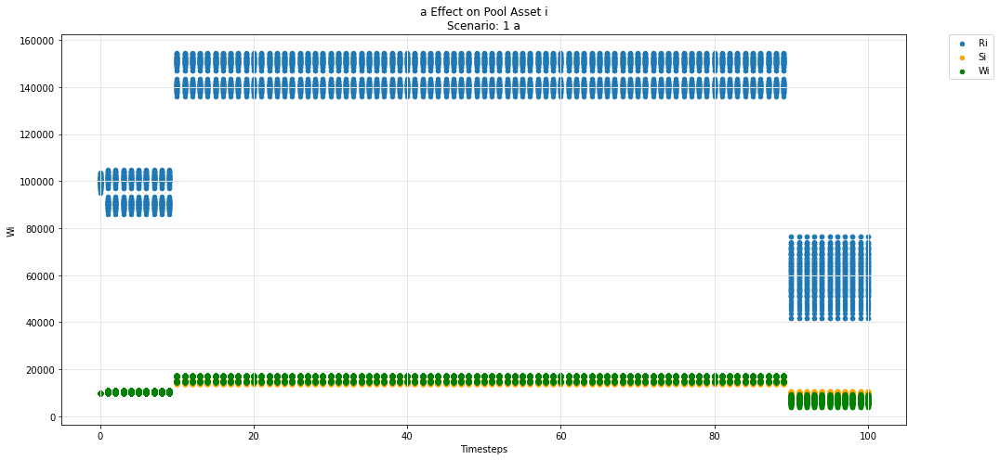

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

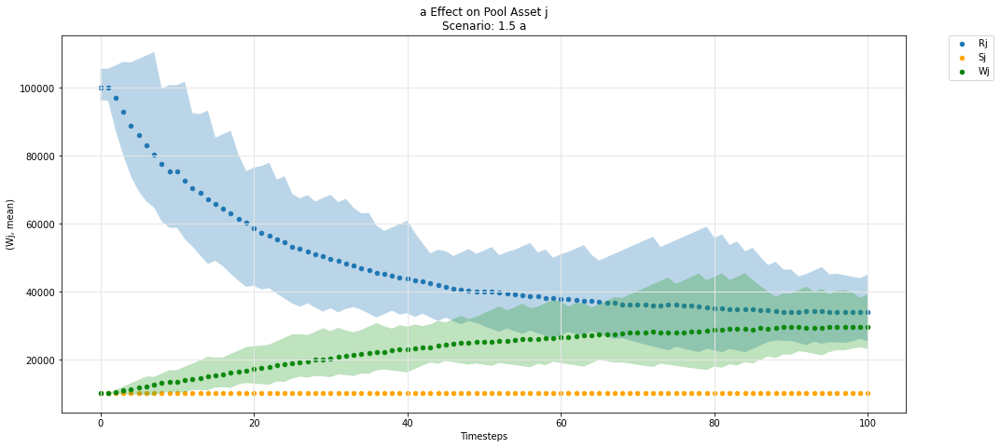

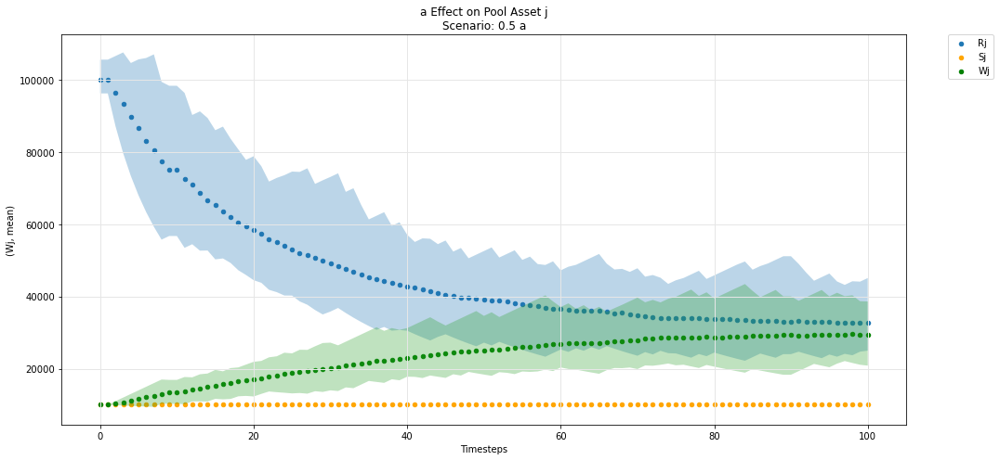

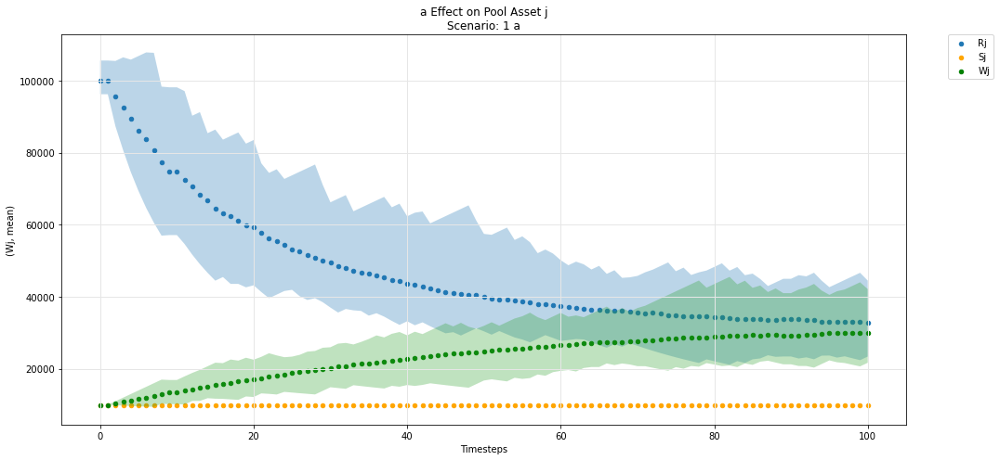

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

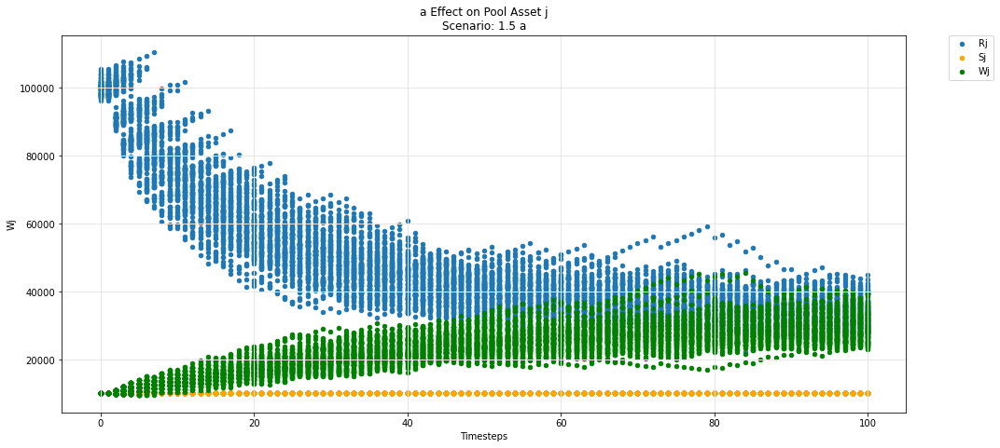

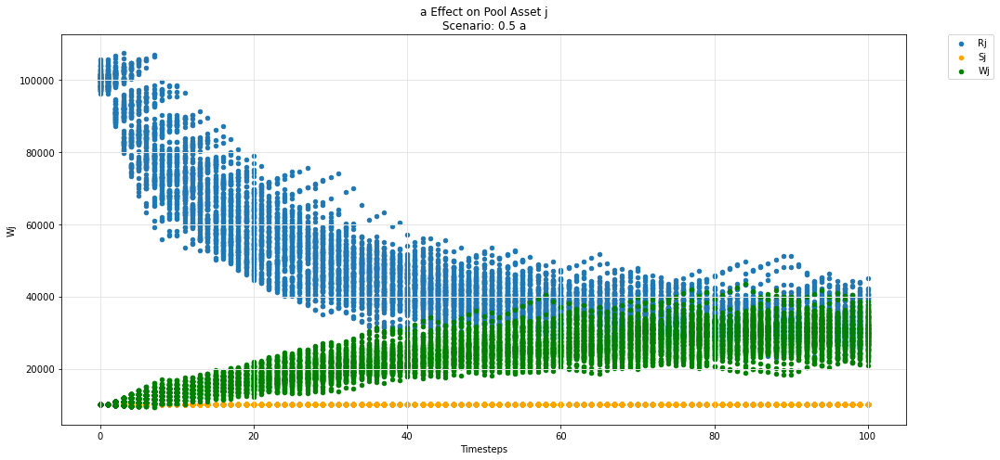

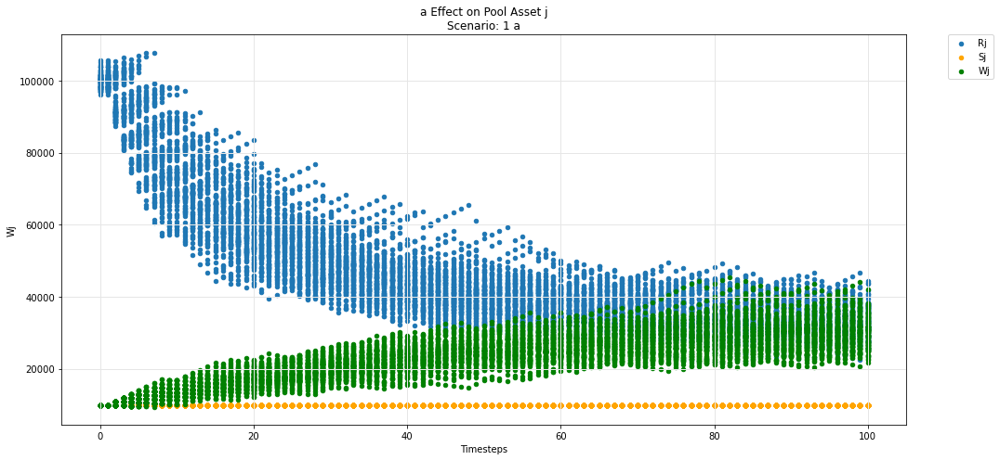

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

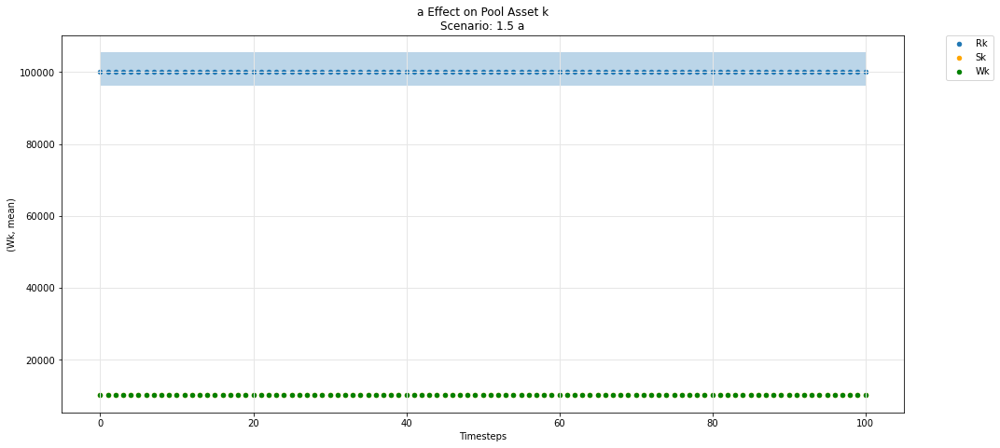

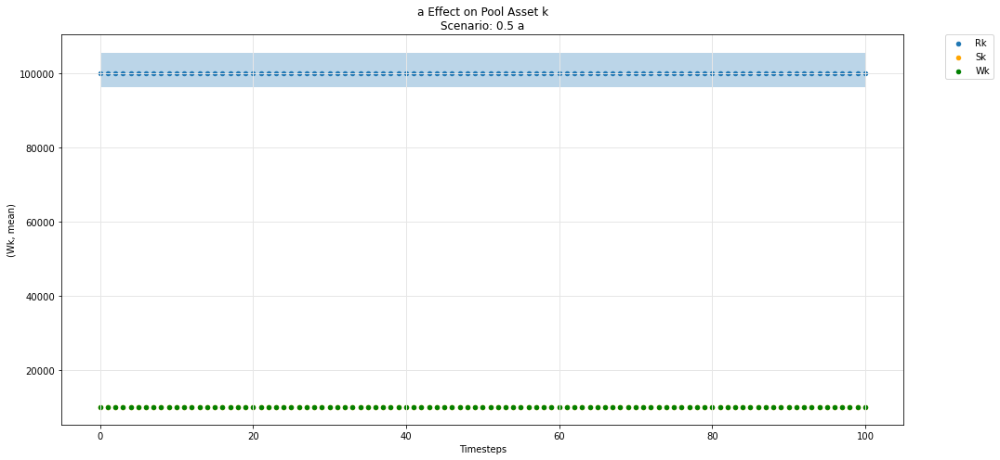

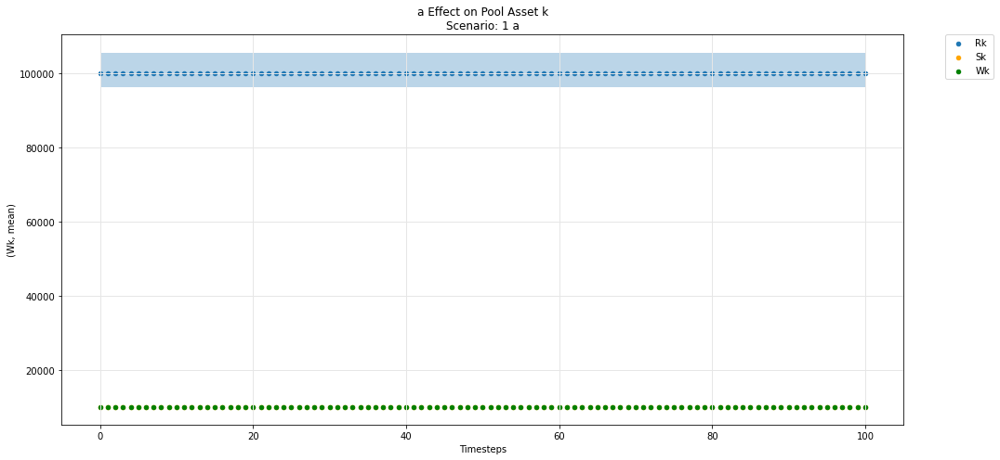

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

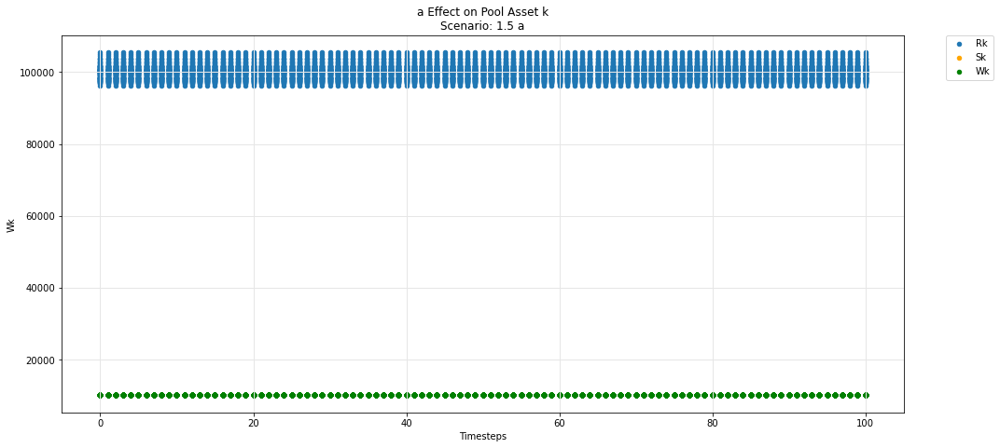

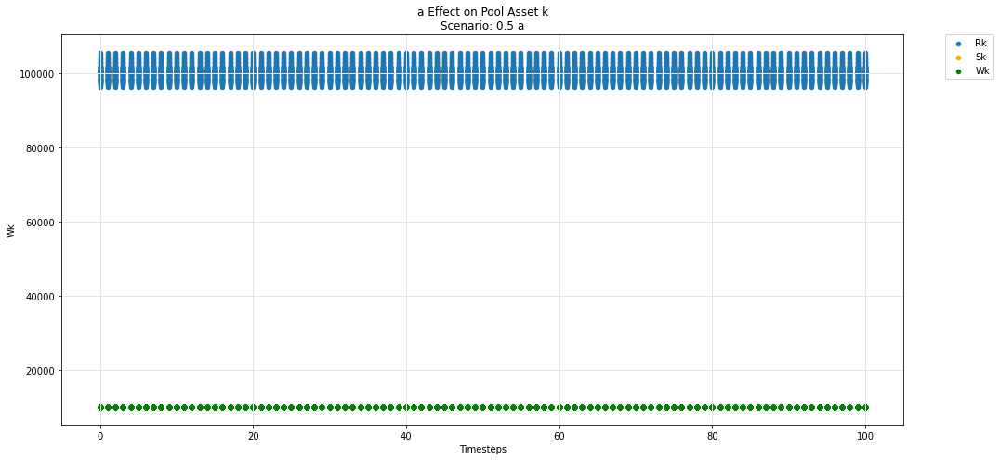

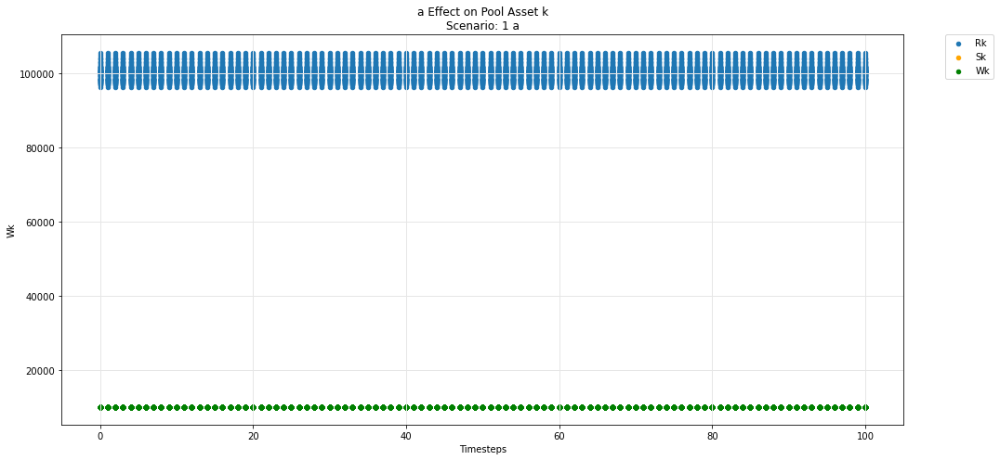

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

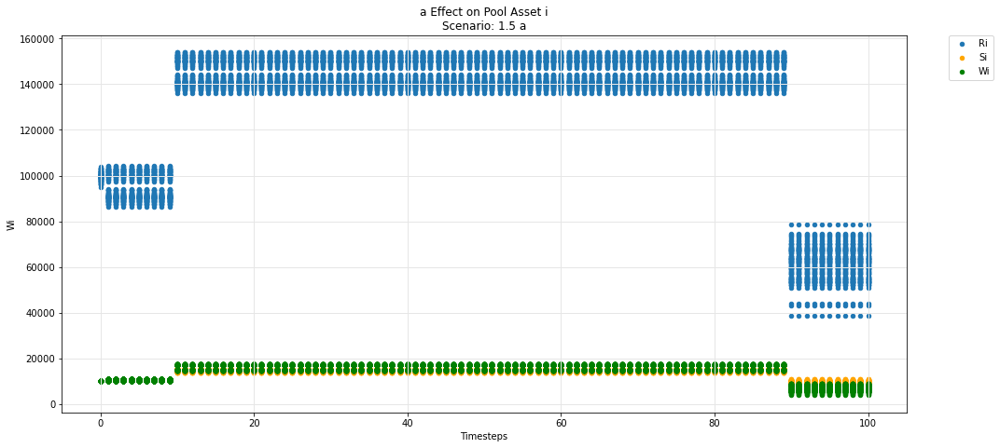

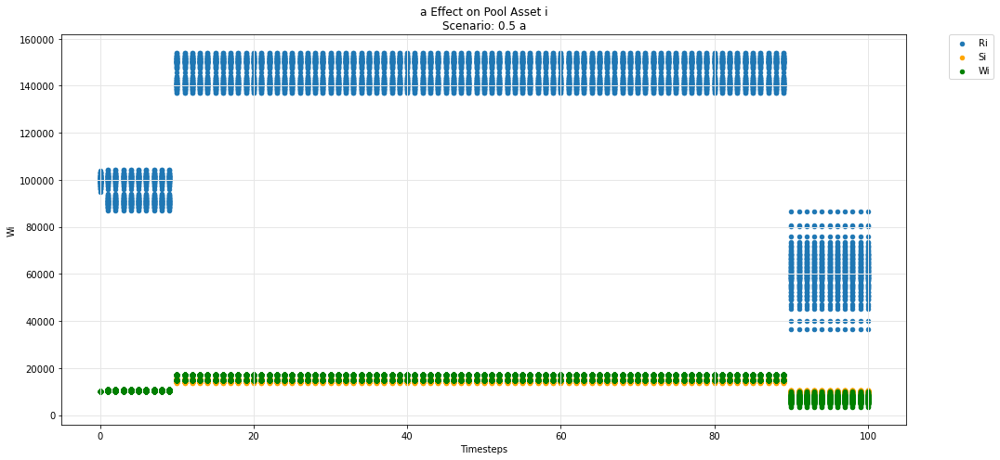

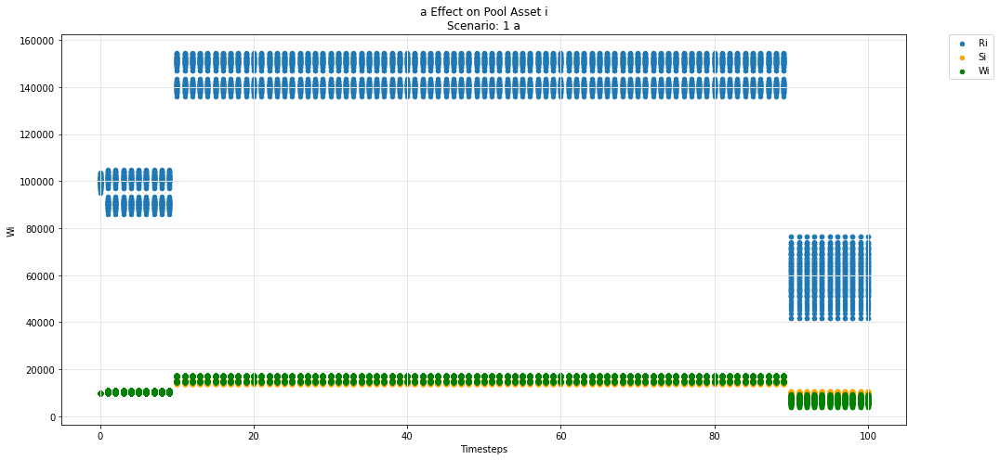

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

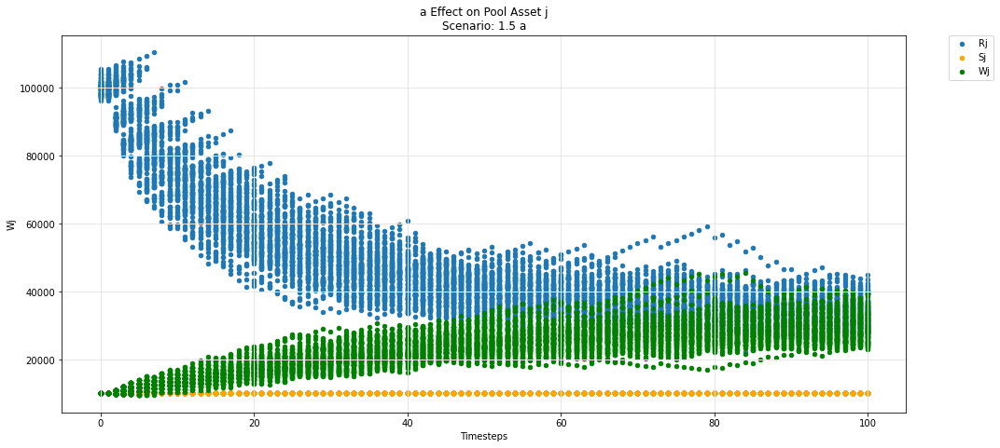

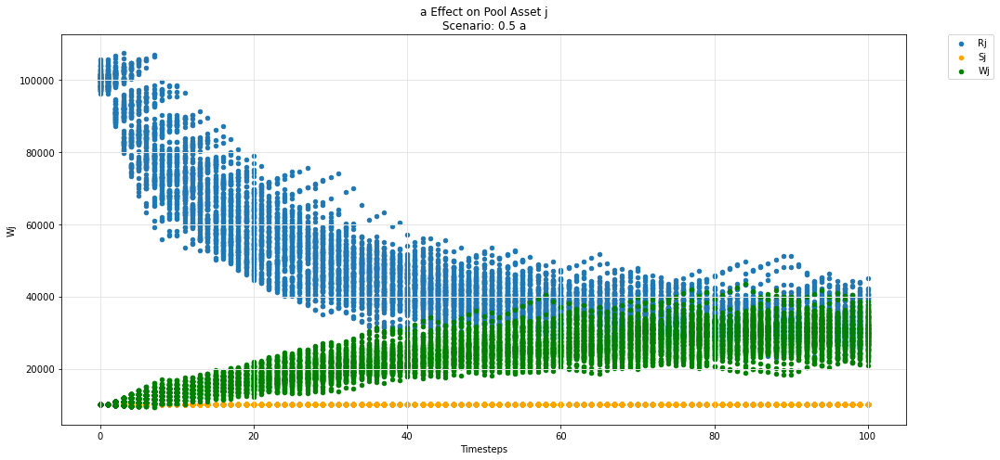

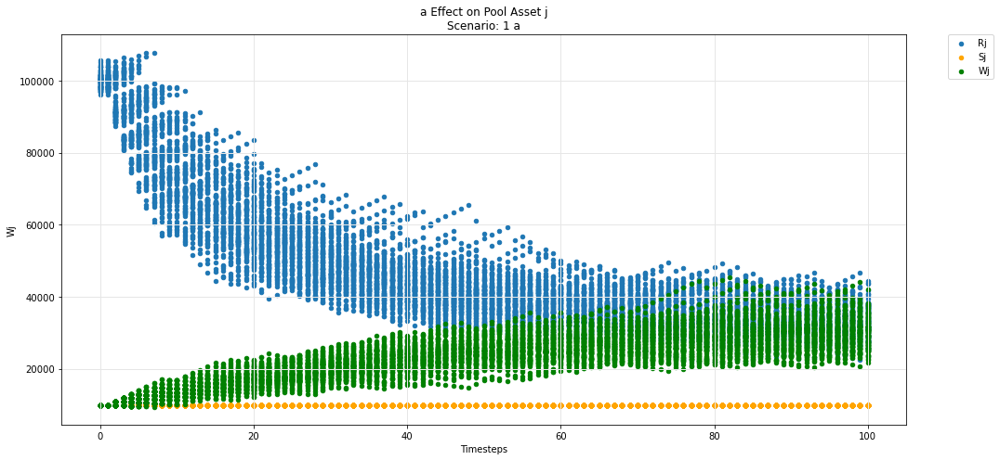

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

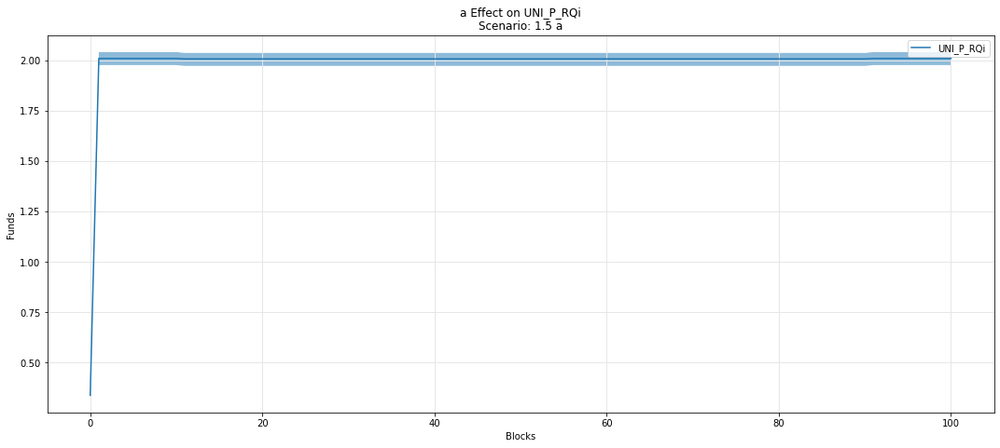

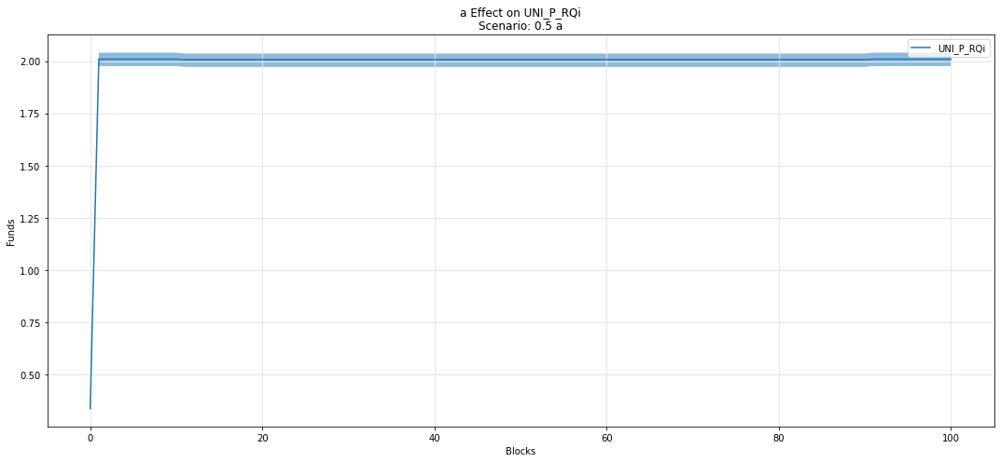

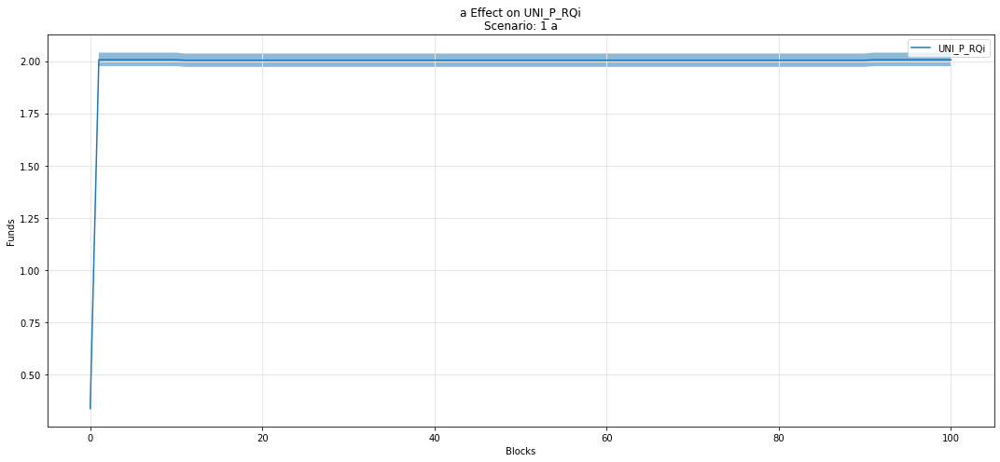

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

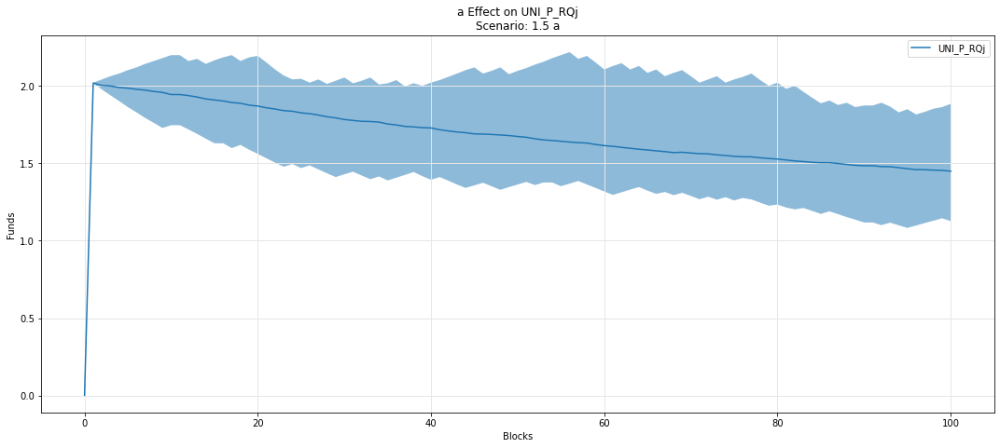

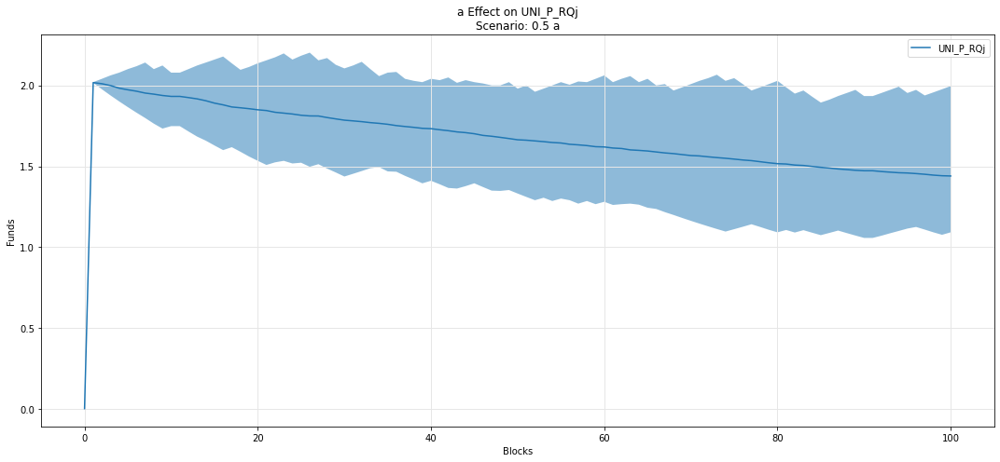

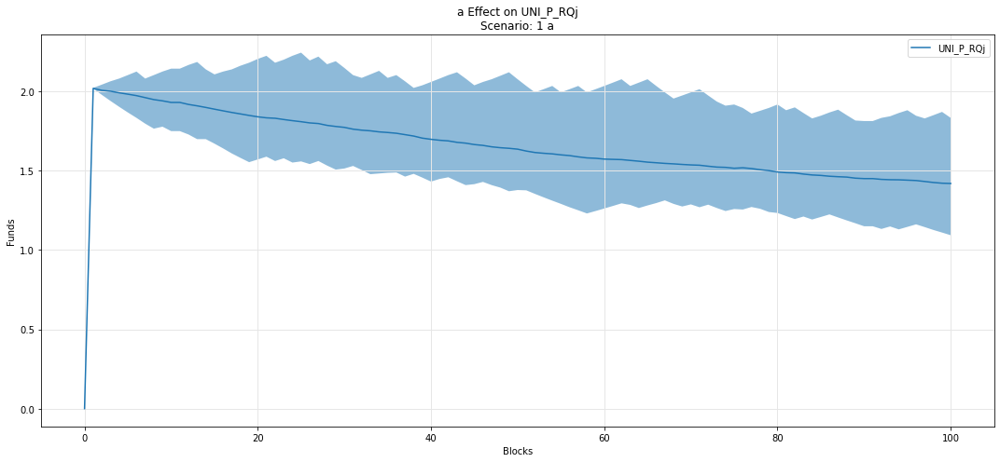

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

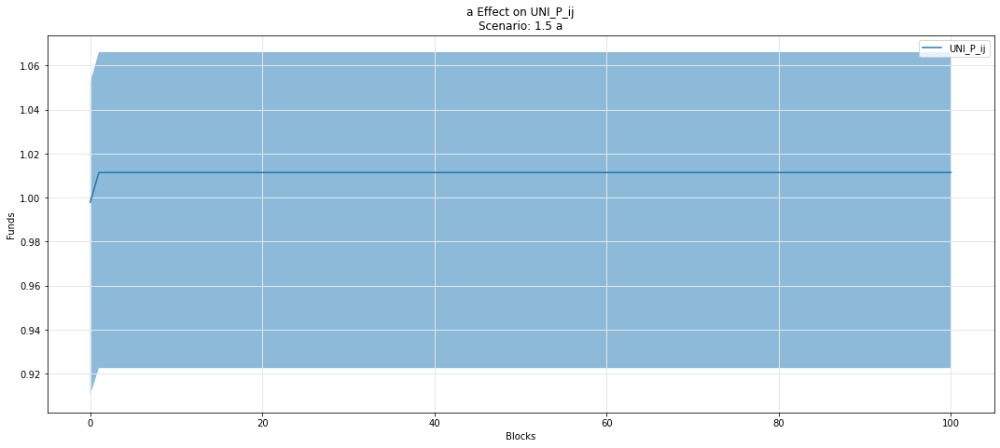

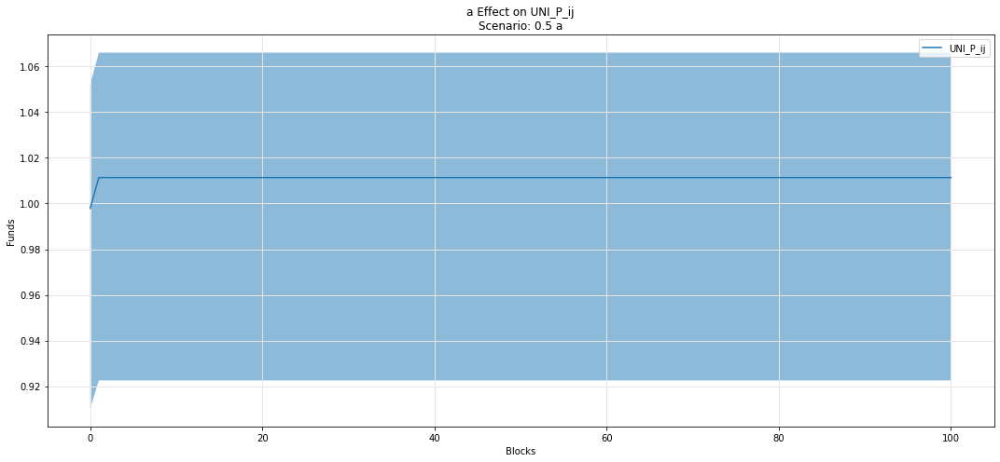

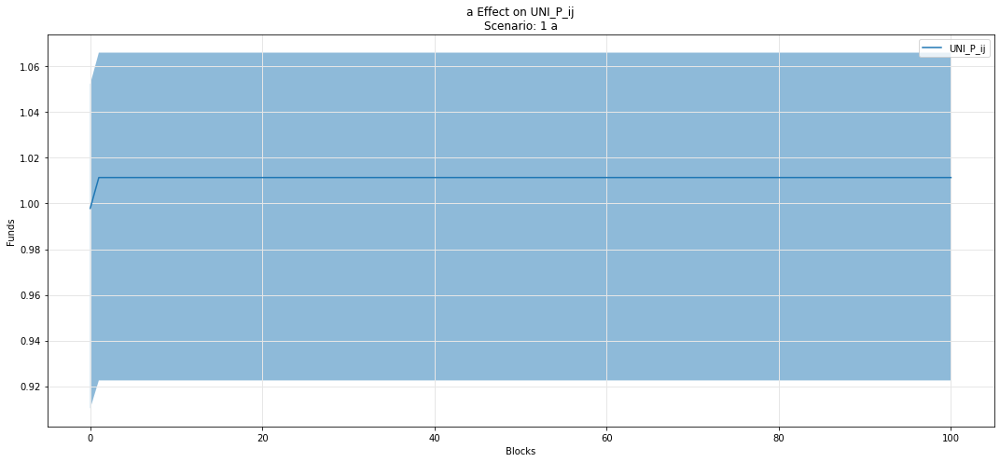

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

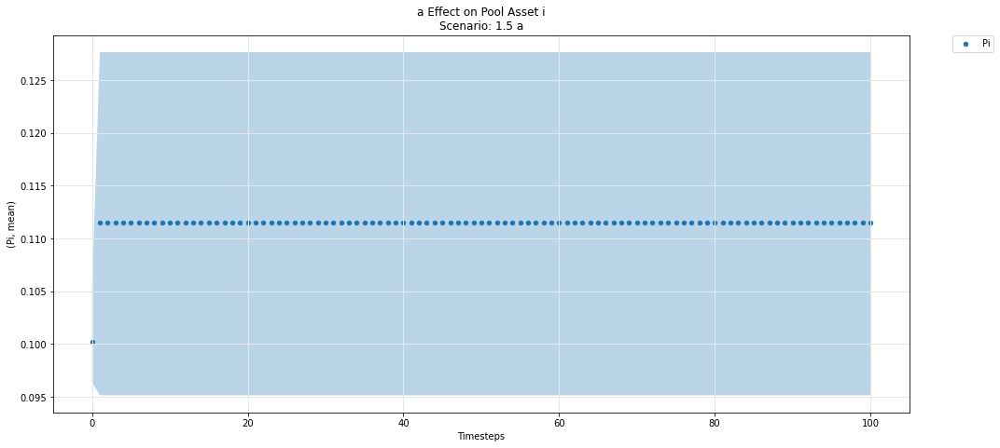

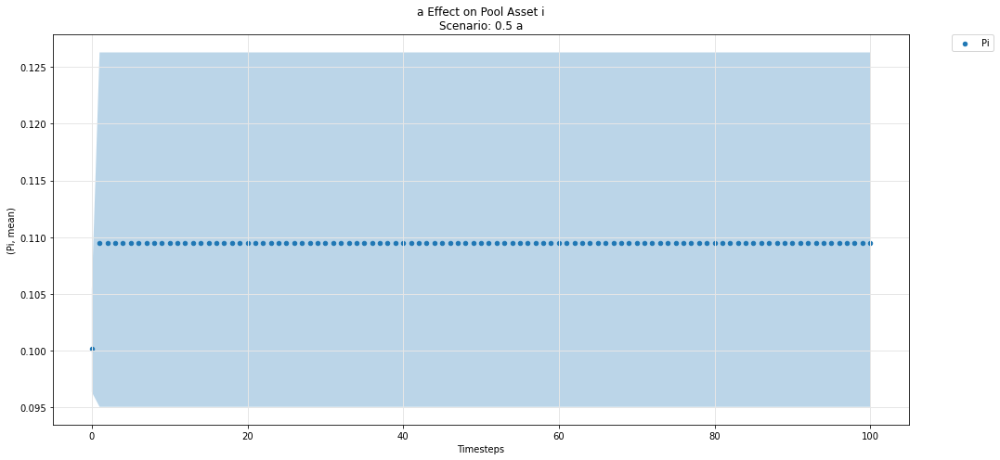

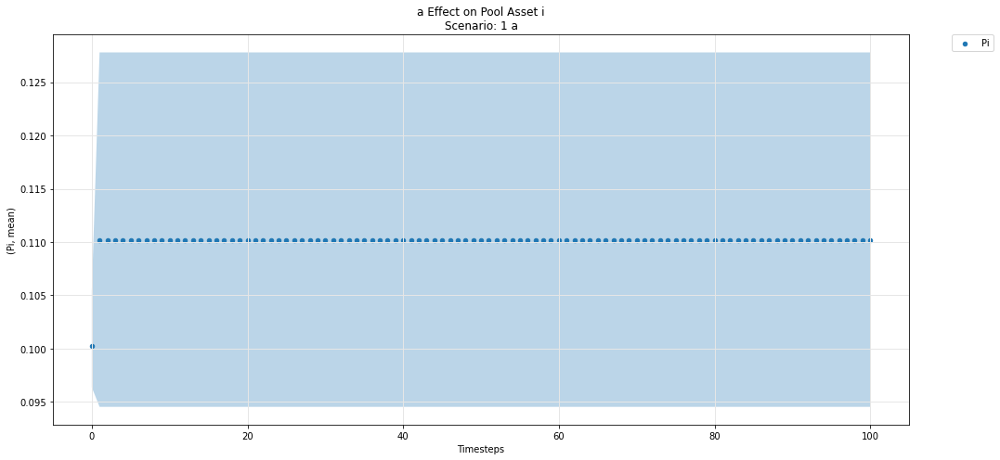

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

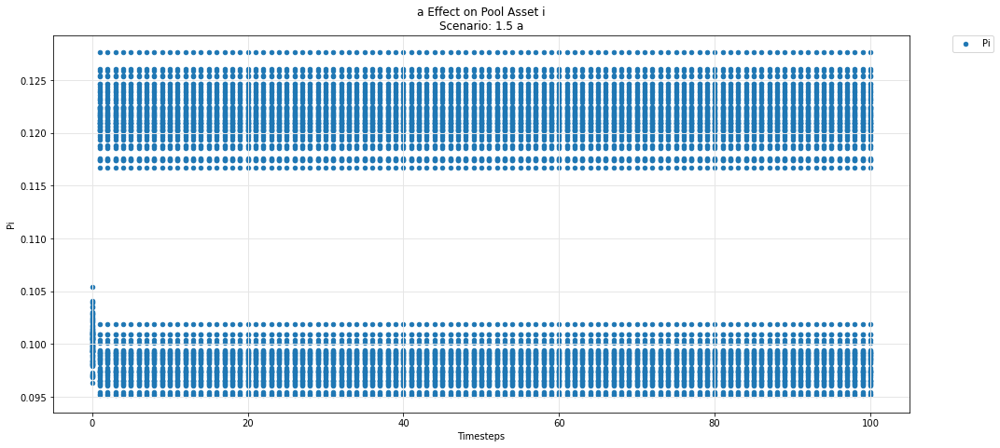

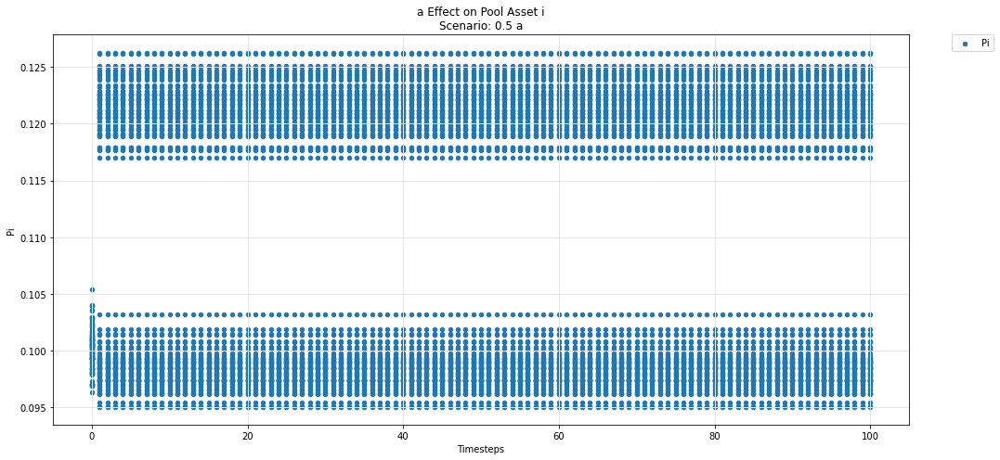

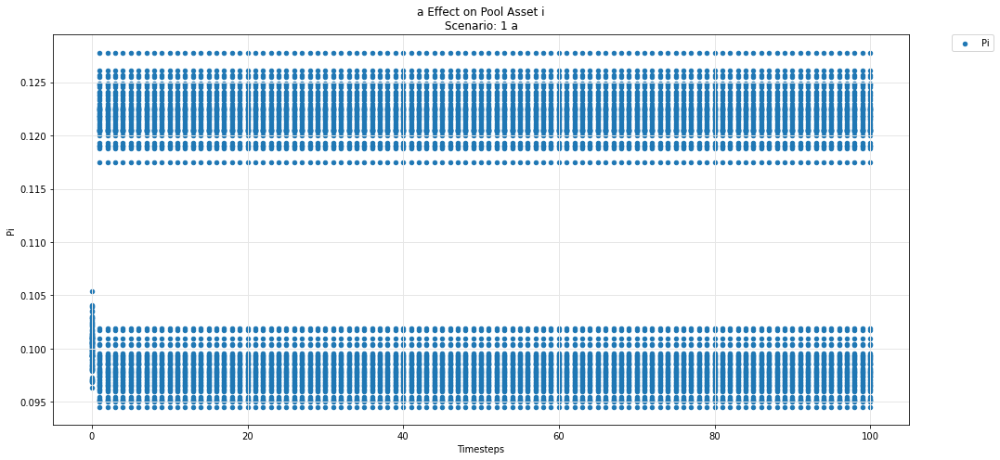

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

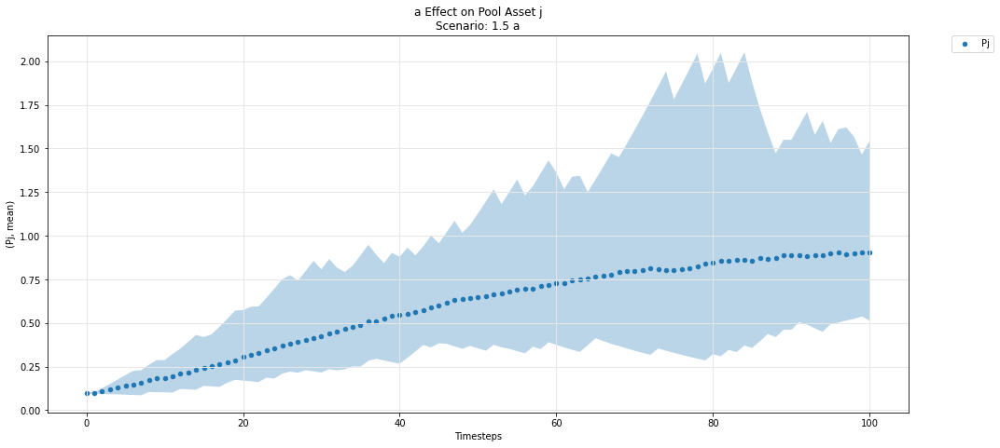

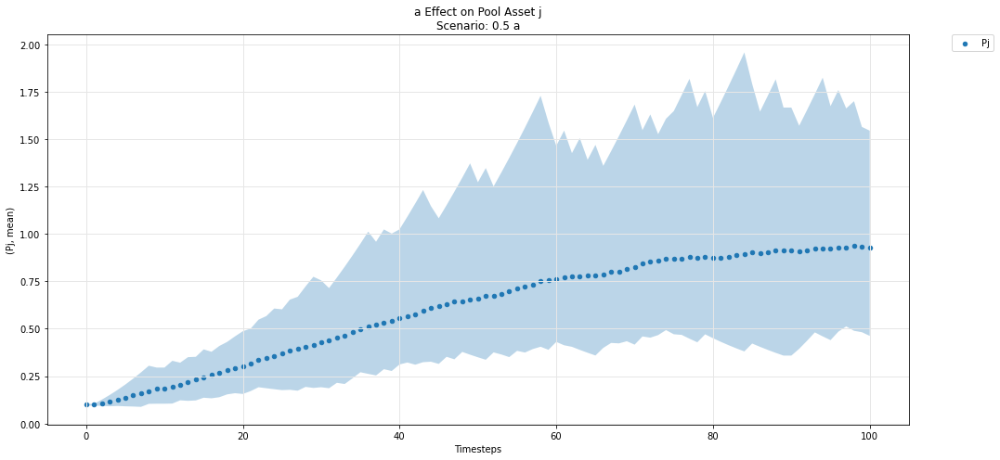

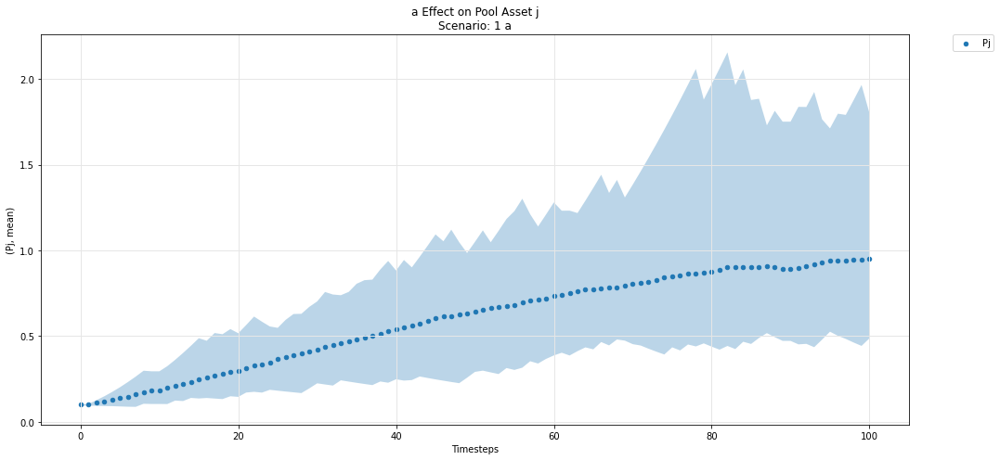

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

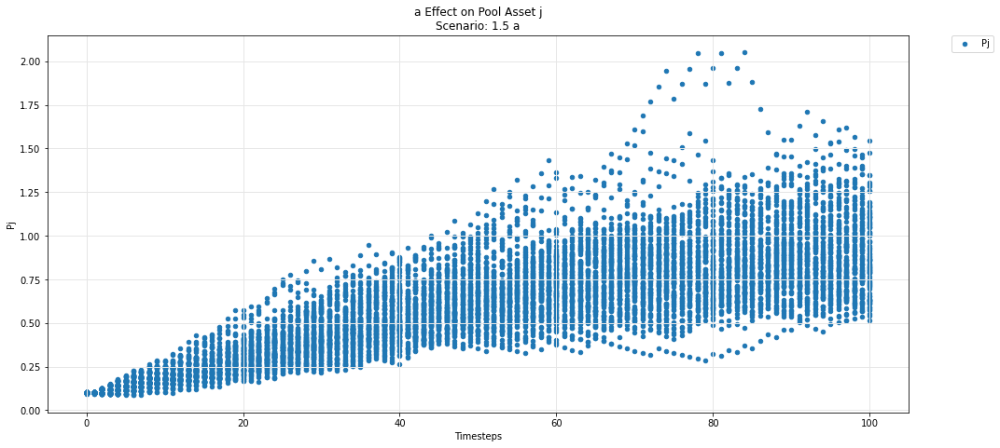

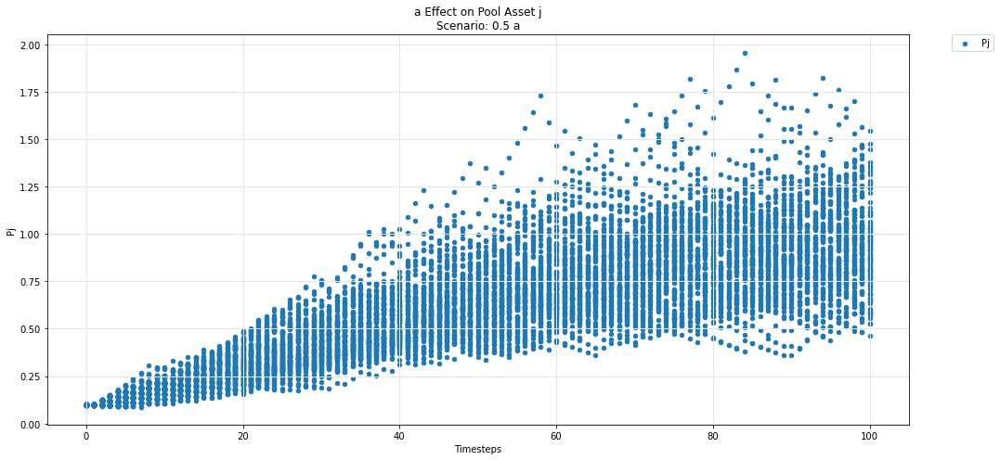

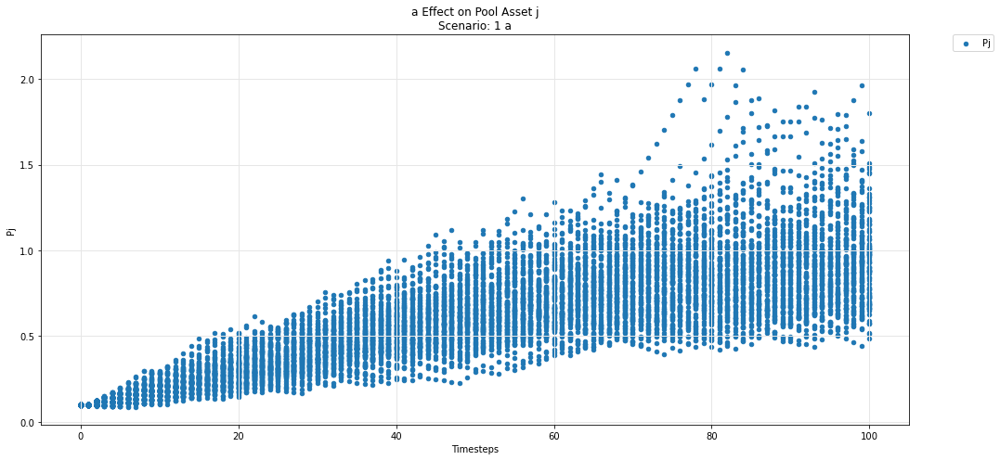

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

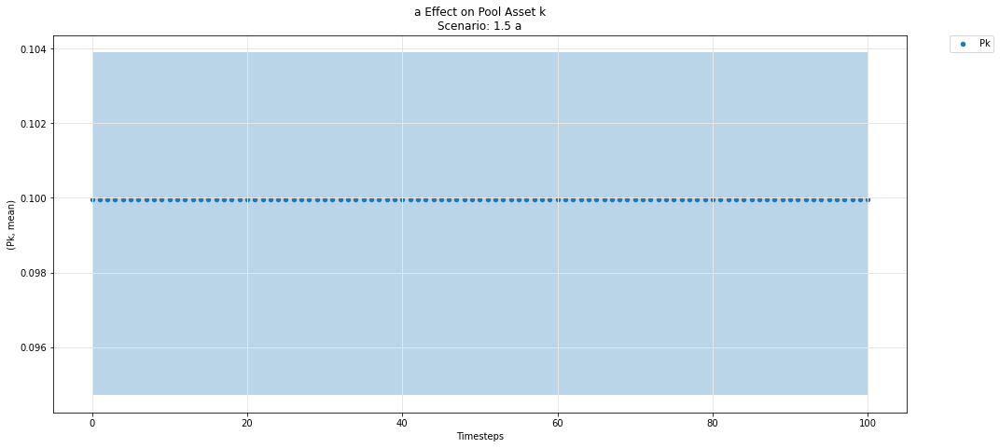

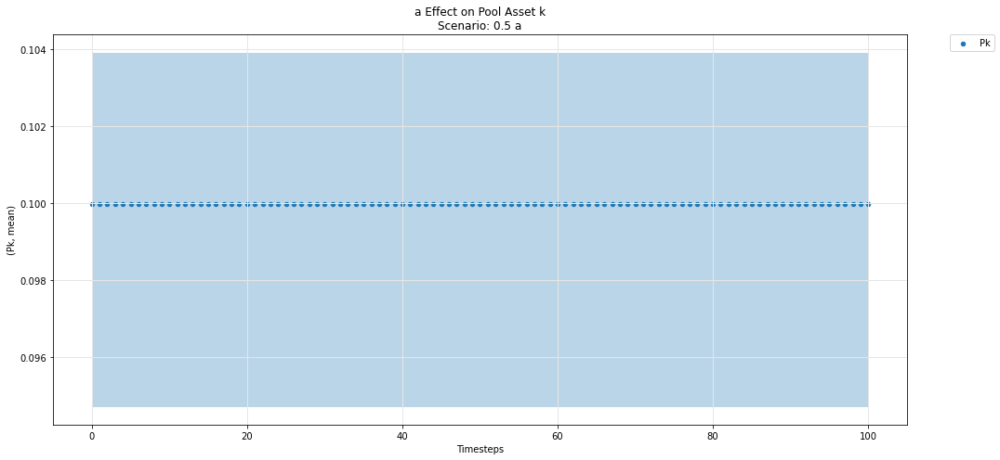

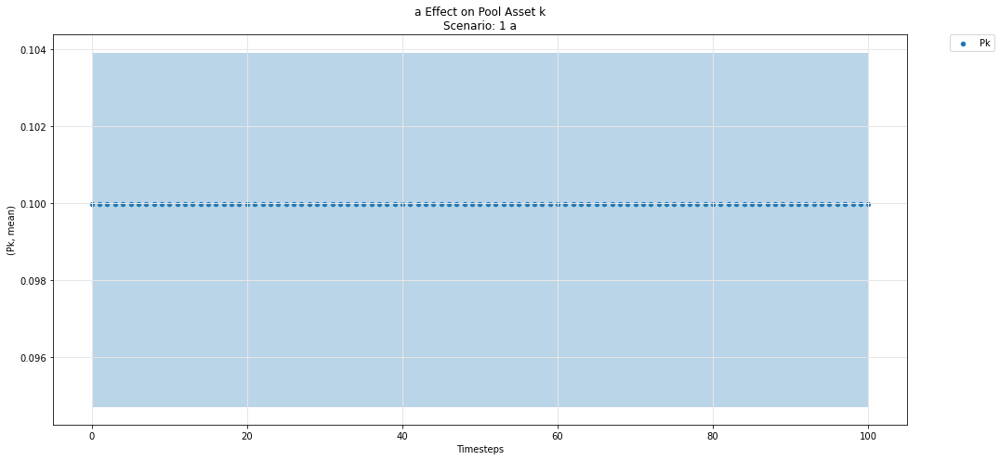

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

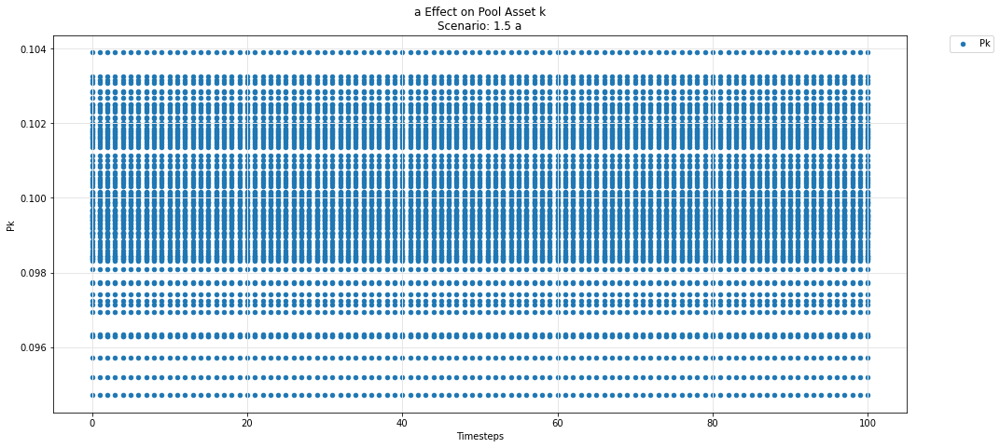

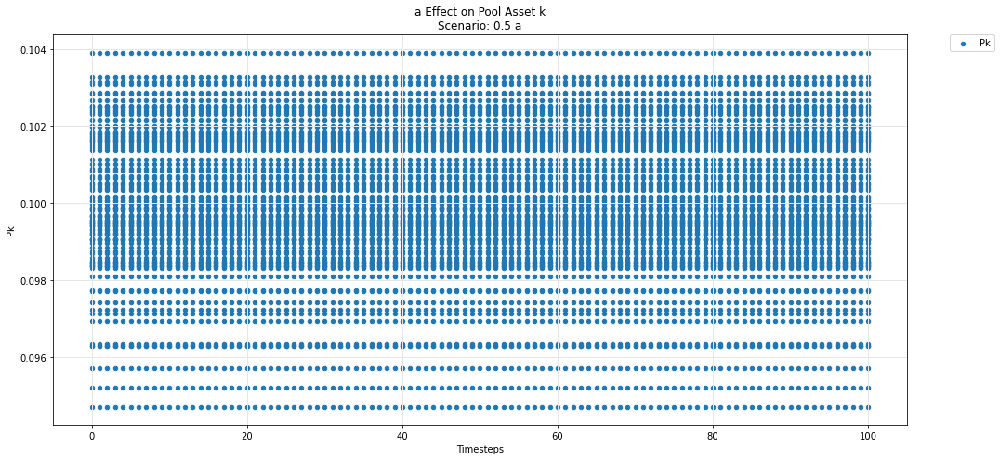

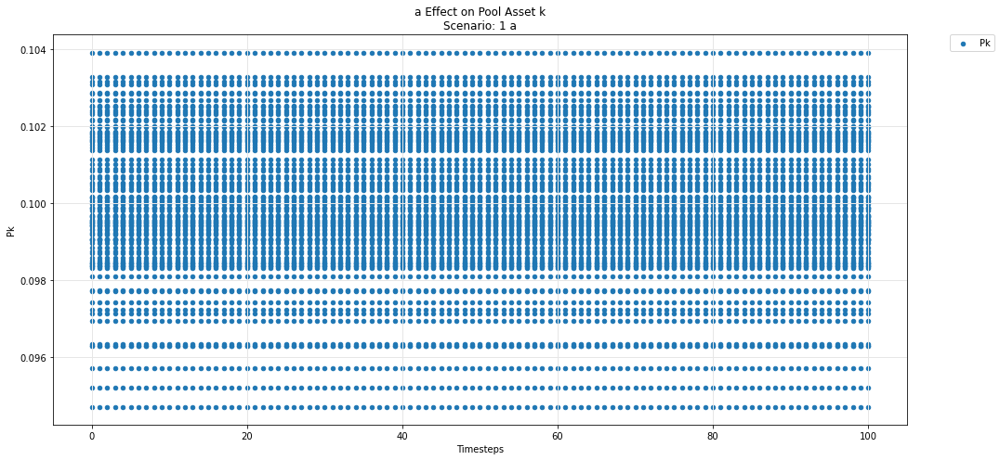

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')